## Import libraries

In [3]:
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers, losses, metrics, optimizers, callbacks
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import SVG, Markdown, display, display_pretty
from tqdm.keras import TqdmCallback

## Load data

In [2]:
otu = pd.read_csv('data/otu_table_all_80.csv', index_col=0, header=None, sep='\t').T
otu = otu.set_index('otuids')

/home/jorge/.local/share/virtualenvs/latent-microbioma-xfRRmAlD/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,

In [3]:
print(otu.shape)
otu = otu.astype('int32')
otu.head()

(4724, 717)


,4479944,513055,519510,810959,849092,1042671,818174,585221,1033380,875704,...,966091,55354,515709,902698,591499,569066,823091,219094,961783,823633
otuids,,,,,,,,,,,,,,,,,,,,,
11116.C02A66.1194587,70,2,22,5,5,0,0,0,0,1,...,25,0,3,149,0,2,19,0,32,2
11116.C06A63.1195666,8,16,15,0,2,0,0,0,0,0,...,18,0,2,63,1,78,2,0,58,2
11116.C08A61.1197689,18,1,12,3,1,1,0,0,0,7,...,26,0,5,61,0,1,4,0,350,3
11116.C08A63.1196825,24,1,30,1,3,0,0,0,0,4,...,12,0,4,57,2,29,6,0,45,2
11116.C12A64.1197667,22,0,33,6,5,0,0,0,0,1,...,34,0,7,136,0,22,10,0,281,1


In [4]:
tax = pd.read_csv('data/tax_table_all_80.csv', sep='\t')

In [5]:
print(tax.shape)
tax.head()

(717, 8)


,otuids,Rank1,Rank2,Rank3,Rank4,Rank5,Rank6,Rank7
0,4479944,k__Bacteria,p__Actinobacteria,c__MB-A2-108,o__0319-7L14,f__,g__,s__
1,513055,k__Bacteria,p__Proteobacteria,c__Gammaproteobacteria,o__Xanthomonadales,f__Sinobacteraceae,g__Steroidobacter,s__
2,519510,k__Bacteria,p__Proteobacteria,c__Alphaproteobacteria,o__Sphingomonadales,f__,g__,s__
3,810959,k__Bacteria,p__Actinobacteria,c__Actinobacteria,o__Actinomycetales,f__Intrasporangiaceae,g__Knoellia,s__
4,849092,k__Bacteria,p__Bacteroidetes,c__Cytophagia,o__Cytophagales,f__Cytophagaceae,g__,s__


In [6]:
metadata = pd.read_csv('data/metadata_table_all_80.csv', sep='\t')
metadata = metadata.set_index('X.SampleID')

print(metadata.shape)
metadata.head()

(4724, 71)


,BarcodeSequence,LinkerPrimerSequence,center_name,experiment_design_description,instrument_model,library_construction_protocol,linker,pcr_primers,platform,run_center,...,Field_BulkSoil,RUN_PREFIX,Sample_date,Temperature,PrecipitationSameDay,Precipitation2Days,Precipitation3Days,INBREDS,Maize_Line,Description1
X.SampleID,,,,,,,,,,,,,,,,,,,,,
11116.C02A66.1194587,ATACTTCGCAG,GTGTGYCAGCMGCCGCGGTAA,Maize,equimolar mix of pool members for Illumina HiS...,Illumina MiSeq,Maize roots-associated soil DNA was extracted ...,GT,FWD:GTGYCAGCMGCCGCGGTAA; REV:GGACTACNVGGGTWTCTAAT,Illumina,JGI,...,Columbia,M2084.7554.1.75777,08/10/10,76.0,0.07,0.14,0.14,Oh7B,Non_Stiff_Stalk,rhizosphere
11116.C06A63.1195666,TCGCTGTAACA,GTGTGYCAGCMGCCGCGGTAA,Maize,equimolar mix of pool members for Illumina HiS...,Illumina MiSeq,Maize roots-associated soil DNA was extracted ...,GT,FWD:GTGYCAGCMGCCGCGGTAA; REV:GGACTACNVGGGTWTCTAAT,Illumina,JGI,...,Columbia,M2085.7557.1.75778,08/10/10,76.0,0.07,0.14,0.14,P39,Sweet_Corn,rhizosphere
11116.C08A61.1197689,TCTGGAACGCT,GTGTGYCAGCMGCCGCGGTAA,Maize,equimolar mix of pool members for Illumina HiS...,Illumina MiSeq,Maize roots-associated soil DNA was extracted ...,GT,FWD:GTGYCAGCMGCCGCGGTAA; REV:GGACTACNVGGGTWTCTAAT,Illumina,JGI,...,Columbia,M2085.7557.1.75778,08/10/10,76.0,0.07,0.14,0.14,CML333,Tropical,rhizosphere
11116.C08A63.1196825,CTTGTAGGACC,GTGTGYCAGCMGCCGCGGTAA,Maize,equimolar mix of pool members for Illumina HiS...,Illumina MiSeq,Maize roots-associated soil DNA was extracted ...,GT,FWD:GTGYCAGCMGCCGCGGTAA; REV:GGACTACNVGGGTWTCTAAT,Illumina,JGI,...,Columbia,M2085.7557.1.75778,08/10/10,76.0,0.07,0.14,0.14,CML333,Tropical,rhizosphere
11116.C12A64.1197667,AGCGATGCCTT,GTGTGYCAGCMGCCGCGGTAA,Maize,equimolar mix of pool members for Illumina HiS...,Illumina MiSeq,Maize roots-associated soil DNA was extracted ...,GT,FWD:GTGYCAGCMGCCGCGGTAA; REV:GGACTACNVGGGTWTCTAAT,Illumina,JGI,...,Columbia,M2085.7557.1.75778,08/10/10,76.0,0.07,0.14,0.14,Il14H,Sweet_Corn,rhizosphere


### Get only the metadata we are going to use

In [7]:
metadata.columns

Index(['BarcodeSequence', 'LinkerPrimerSequence', 'center_name',
       'experiment_design_description', 'instrument_model',
       'library_construction_protocol', 'linker', 'pcr_primers', 'platform',
       'run_center', 'run_prefix', 'sample_center', 'sequencing_meth',
       'target_gene', 'target_subfragment', 'qiita_prep_id', 'age', 'age_unit',
       'anonymized_name', 'collection_timestamp', 'depth', 'dna_extracted',
       'elevation', 'env', 'env_biome', 'env_feature', 'env_material',
       'env_package', 'experiment_center', 'geo_loc_name', 'host_common_name',
       'host_scientific_name', 'host_subject_id', 'host_taxid', 'inbreds',
       'latitude', 'longitude', 'physical_specimen_location',
       'physical_specimen_remaining', 'plant_product', 'plot',
       'qiita_study_id', 'rangecoord', 'rep', 'row', 'rowcoord', 'samp_size',
       'sample_type', 'scientific_name', 'shipment', 'study_center', 'subrow',
       'taxon_id', 'timepoint', 'timepoint_units', 'week', 'Desc

In [8]:
domain = metadata[['age',
                   'Temperature',
                   'Precipitation3Days',
                   'INBREDS',
                   'Maize_Line']]
domain.head()

,age,Temperature,Precipitation3Days,INBREDS,Maize_Line
X.SampleID,,,,,
11116.C02A66.1194587,12,76.0,0.14,Oh7B,Non_Stiff_Stalk
11116.C06A63.1195666,12,76.0,0.14,P39,Sweet_Corn
11116.C08A61.1197689,12,76.0,0.14,CML333,Tropical
11116.C08A63.1196825,12,76.0,0.14,CML333,Tropical
11116.C12A64.1197667,12,76.0,0.14,Il14H,Sweet_Corn


In [9]:
domain = pd.concat([domain, pd.get_dummies(domain['INBREDS'],prefix='INBREDS')], axis=1)
domain = pd.concat([domain, pd.get_dummies(domain['Maize_Line'],prefix='Maize_Line')], axis=1)
domain = domain.drop(['INBREDS', 'Maize_Line'], axis=1)
domain.head()

,age,Temperature,Precipitation3Days,INBREDS_B73,INBREDS_B97,INBREDS_CML103,INBREDS_CML228,INBREDS_CML247,INBREDS_CML277,INBREDS_CML322,...,INBREDS_Oh7B,INBREDS_P39,INBREDS_Tx303,INBREDS_Tzi8,Maize_Line_Mixed,Maize_Line_Non_Stiff_Stalk,Maize_Line_Popcorn,Maize_Line_Stiff_Stalk,Maize_Line_Sweet_Corn,Maize_Line_Tropical
X.SampleID,,,,,,,,,,,,,,,,,,,,,
11116.C02A66.1194587,12,76.0,0.14,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0
11116.C06A63.1195666,12,76.0,0.14,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
11116.C08A61.1197689,12,76.0,0.14,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11116.C08A63.1196825,12,76.0,0.14,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
11116.C12A64.1197667,12,76.0,0.14,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


### Join otus and domain in one table

In [10]:
df = pd.concat([otu, domain], axis=1, sort=True, join='outer')

print(df.shape)
df.head()

(4724, 753)


,4479944,513055,519510,810959,849092,1042671,818174,585221,1033380,875704,...,INBREDS_Oh7B,INBREDS_P39,INBREDS_Tx303,INBREDS_Tzi8,Maize_Line_Mixed,Maize_Line_Non_Stiff_Stalk,Maize_Line_Popcorn,Maize_Line_Stiff_Stalk,Maize_Line_Sweet_Corn,Maize_Line_Tropical
11116.A01A061.1195113,73,0,749,6,11,1,1052,0,0,76,...,0,0,0,0,0,0,0,1,0,0
11116.A01A070.1197472,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11116.A01A073.1194387,9,0,8,0,20,0,25,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11116.A01A076.1198452,18,0,17,0,45,1,32,0,0,1,...,0,0,0,0,0,0,0,1,0,0
11116.A01A079.1197702,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [11]:
class CenterLogRatio(layers.Layer):

    def __init__(self):
        super(CenterLogRatio, self).__init__(name='center_log_ratio')

    def build(self, input_shape):
        super(CenterLogRatio, self).build(input_shape)

    def call(self, x, **kwargs):
        x = x + 1 # TODO to remove all ceros
        logx = tf.math.log(x)
        log_mean = tf.math.reduce_mean(logx, axis=-1, keepdims=True)
        return tf.subtract(logx, log_mean, name='center_log_ratio')

    def compute_output_shape(self, input_shape):
        return input_shape

class Percentage(layers.Layer):

    def __init__(self):
        super(Percentage, self).__init__(name='percentage')

    def build(self, input_shape):
        super(Percentage, self).build(input_shape)

    def call(self, x, **kwargs):
        x_sum = tf.math.reduce_sum(x, axis=-1, keepdims=True)
        return tf.math.divide(x, x_sum, name='percentage')

    def compute_output_shape(self, input_shape):
        return input_shape


class Identity(layers.Layer):

    def __init__(self, name):
        super(Identity, self).__init__(name=name)

    def build(self, input_shape):
        super(Identity, self).build(input_shape)

    def call(self, x, **kwargs):
        return x

    def compute_output_shape(self, input_shape):
        return input_shape


class MeanSquaredErrorWrapper(metrics.MeanSquaredError):

    def __init__(self, y_true_transformer, y_pred_transformer):
        super(MeanSquaredErrorWrapper, self).__init__(name='mse')
        self.y_true_transformer = y_true_transformer
        self.y_pred_transformer = y_pred_transformer

    def __call__(self, y_true, y_pred, *args, **kwargs):
        if self.y_true_transformer is not None:
            y_true = self.y_true_transformer(y_true)
        if self.y_pred_transformer is not None:
            y_pred = self.y_pred_transformer(y_pred)
        return super(MeanSquaredErrorWrapper, self).__call__(y_true, y_pred, *args, **kwargs)


class MeanAbsoluteErrorWrapper(metrics.MeanAbsoluteError):

    def __init__(self, y_true_transformer, y_pred_transformer):
        super(MeanAbsoluteErrorWrapper, self).__init__(name='mae')
        self.y_true_transformer = y_true_transformer
        self.y_pred_transformer = y_pred_transformer

    def __call__(self, y_true, y_pred, *args, **kwargs):
        if self.y_true_transformer is not None:
            y_true = self.y_true_transformer(y_true)
        if self.y_pred_transformer is not None:
            y_pred = self.y_pred_transformer(y_pred)
        return super(MeanAbsoluteErrorWrapper, self).__call__(y_true, y_pred, *args, **kwargs)


class MeanAbsolutePercentageErrorWrapper(metrics.MeanAbsolutePercentageError):

    def __init__(self, y_true_transformer, y_pred_transformer):
        super(MeanAbsolutePercentageErrorWrapper, self).__init__(name='mape')
        self.y_true_transformer = y_true_transformer
        self.y_pred_transformer = y_pred_transformer

    def __call__(self, y_true, y_pred, *args, **kwargs):
        if self.y_true_transformer is not None:
            y_true = self.y_true_transformer(y_true)
        if self.y_pred_transformer is not None:
            y_pred = self.y_pred_transformer(y_pred)
        y_pred = y_pred + 1 # to avoid 0
        y_true = y_true + 1 # to avoid 0
        return super(MeanAbsolutePercentageErrorWrapper, self).__call__(y_true, y_pred, *args, **kwargs)


# TODO more metrics: correlations

In [12]:
# TODO add VAE??

def autoencoder(bioma_shape=717,
                domain_shape=36,
                latent_space=10,
                bioma_layers=[128,64],
                domain_layers=[32,16],
                input_transform=CenterLogRatio(), # Percentage
                output_transform=None, # layers.Softmax
                activation_function_encoder=layers.ReLU(),
                activation_function_decoder=layers.ReLU(),
                activation_function_latent='tanh',
                ):

    has_domain = domain_shape is not None

    # encoder bioma

    in_bioma = layers.Input(shape=(bioma_shape,), name='bioma_input_{}'.format(bioma_shape))
    net = in_bioma
    if input_transform is not None:
        net = input_transform(net)
    for s in bioma_layers:
        net = layers.Dense(s, activation=activation_function_encoder,
                           name="encoder_bioma_dense_{}".format(s))(net)
    encoded_bioma = layers.Dense(latent_space, activation=activation_function_latent,
                                 name='encoded_bioma_{}'.format(latent_space))(net)
    encoder_bioma = keras.Model(inputs=in_bioma, outputs=encoded_bioma, name='EncoderBioma')

    # encoder domain

    if has_domain:
        in_domain = layers.Input(shape=(domain_shape,), name='domain_input_{}'.format(domain_shape))
        net = in_domain
        for s in domain_layers:
            net = layers.Dense(s, activation=activation_function_encoder,
                               name="encoder_domain_dense_{}".format(s))(net)
        encoded_domain = layers.Dense(latent_space, activation=activation_function_latent,
                                      name='encoded_domain_{}'.format(latent_space))(net)
        encoder_domain = keras.Model(inputs=in_domain, outputs=encoded_domain, name='EncoderDomain')
    else:
        encoded_domain = None
        encoder_domain = None

    # decoder bioma for both autoencoders

    in_latent_space = layers.Input(shape=(latent_space,), name='latent_space_input')
    net = in_latent_space
    net_bioma = encoded_bioma
    net_domain = encoded_domain
    for s in reversed(bioma_layers):
        layer = layers.Dense(s, activation=activation_function_decoder,
                             name="decoder_dense_{}".format(s))
        net = layer(net)
        net_bioma = layer(net_bioma)
        if has_domain:
            net_domain = layer(net_domain)

    layer = layers.Dense(bioma_shape, activation=None, name='decoded_bioma')
    decoded_bioma = layer(net)
    net_bioma = layer(net_bioma)
    if has_domain:
        net_domain = layer(net_domain)

    if output_transform is not None:
        decoded_bioma = output_transform(decoded_bioma)
        net_bioma = output_transform(net_bioma)
        if has_domain:
            net_domain = output_transform(net_domain)

    decoder_bioma = keras.Model(inputs=in_latent_space, outputs=decoded_bioma, name='DecoderBioma')

    # combined model for training

    if has_domain:
        diff_encoders = tf.math.abs(encoded_domain - encoded_bioma, name='diff_encoded')
        diff_encoders = Identity(name='latent')(diff_encoders)
        net_bioma = Identity(name='bioma')(net_bioma)
        net_domain = Identity(name='domain')(net_domain)

        model = keras.Model(inputs=[in_bioma, in_domain],
                            outputs=[net_bioma, net_domain, diff_encoders],
                            name='model')
    else:
        net_bioma = Identity(name='bioma')(net_bioma)
        model = keras.Model(inputs=[in_bioma],
                            outputs=[net_bioma],
                            name='model')

    return model, encoder_bioma, encoder_domain, decoder_bioma

def compile_train(model, encoder_domain=None,
                  reconstruction_error=losses.MeanSquaredError(),
                  encoded_comparison_error=losses.MeanAbsoluteError(),
                  metrics=[
                      [
                          metrics.MeanSquaredError(name='mse'),
                          metrics.MeanAbsoluteError(name='mae'),
                          metrics.MeanAbsolutePercentageError(name='mape')
                      ],[
                          metrics.MeanSquaredError(name='mse'),
                          metrics.MeanAbsoluteError(name='mae'),
                          metrics.MeanAbsolutePercentageError(name='mape')
                      ], [
                          metrics.MeanAbsoluteError(name='mae'),
                      ]
                  ],
                  optimizer=optimizers.SGD(lr=0.01)):
    if encoder_domain is not None:
        model.compile(optimizer=optimizer,
                      loss=[reconstruction_error, reconstruction_error, encoded_comparison_error],
                      metrics=metrics)
    else:
        model.compile(optimizer=optimizer,
                      loss=reconstruction_error,
                      metrics=metrics[0])


def exp_decay(epoch):
    initial_lrate = 0.01
    k = 0.9
    lrate = initial_lrate * k**epoch
    return lrate

def train(model_fn,
          data_microbioma,
          data_domain,
          latent_space=10,
          folds=5,
          epochs=20,
          batch_size=128,
          learning_rate_scheduler=callbacks.LearningRateScheduler(exp_decay),
          random_seed=347,
          verbose=0):
    data_zeros_latent = np.zeros((data_domain.shape[0], latent_space), dtype=data_domain.dtype)
    kf = KFold(n_splits=folds, random_state=random_seed, shuffle=True)
    results = []
    if verbose >= 0:
        callbacks = [TqdmCallback(verbose=verbose)]
    else:
        callbacks = []
    if learning_rate_scheduler is not None:
        callbacks += [learning_rate_scheduler]

    for train_index, test_index in kf.split(data_microbioma):
        y_train, y_test = data_microbioma[train_index], data_microbioma[test_index]
        model, encoder_bioma, encoder_domain, decoder_bioma = model_fn()
        if encoder_domain is not None:
            d_train, d_test = data_domain[train_index], data_domain[test_index]
            zs_train, zs_test = data_zeros_latent[train_index], data_zeros_latent[test_index]
            r = model.fit(x=[y_train, d_train],
                          y=[y_train, y_train, zs_train],
                          batch_size=batch_size,
                          epochs=epochs,
                          validation_data=([y_test, d_test], [y_test, y_test, zs_test]),
                          callbacks=callbacks,
                          verbose=0)
        else:
            r = model.fit(x=y_train,
                          y=y_train,
                          batch_size=batch_size,
                          epochs=epochs,
                          validation_data=(y_test, y_test),
                          callbacks=callbacks,
                          verbose=0)

        results.append(r)
    return results

In [13]:
def save_plot_model(model, name='model'):
    filename = '{}.png'.format(name)
    keras.utils.plot_model(model, show_shapes=True, show_layer_names=True, to_file=filename)

def plot_models(model, encoder_bioma, encoder_domain, decoder_bioma):
    def _print(t):
        display_pretty(t,raw=True)
    display(Markdown("### Encoder Bioma"))
    encoder_bioma.summary(line_length=120, print_fn=_print)
    display(SVG(keras.utils.model_to_dot(encoder_bioma, show_shapes=True).create(prog='dot', format='svg')))
    if encoder_domain is not None:
        display(Markdown("### Encoder Domain"))
        encoder_domain.summary(line_length=120, print_fn=_print)
        display(SVG(keras.utils.model_to_dot(encoder_domain, show_shapes=True).create(prog='dot', format='svg')))
    display(Markdown("### Decoder Bioma"))
    decoder_bioma.summary(line_length=120, print_fn=_print)
    display(SVG(keras.utils.model_to_dot(decoder_bioma, show_shapes=True).create(prog='dot', format='svg')))
    display(Markdown("### Model for training"))
    model.summary(line_length=120, print_fn=_print)
    display(SVG(keras.utils.model_to_dot(model, show_shapes=True).create(prog='dot', format='svg')))

def print_results(results):
    sequences = {}
    last_iteration = []
    for k in results[0].history.keys():
        arrays = np.array([r.history[k] for r in results])
        sequences[k] = [arrays.mean(axis=0), arrays.min(axis=0), arrays.max(axis=0)]
        if k.startswith('val_'):
            last_iteration.append((k,[x[-1] for x in sequences[k]]))

    keys = [k for k in results[0].history.keys() if not k.startswith('val_')]
    x = results[0].epoch
    for k in keys:
        mean_seq, min_seq, max_seq = sequences[k]
        display(Markdown("<b>{}</b>: {:.4f} (min: {:.4f}, max: {:.4f})".format(k, mean_seq[-1],
                                                                               min_seq[-1],
                                                                               max_seq[-1])))
        plt.fill_between(x, min_seq, max_seq, color="blue", alpha=0.2)
        plt.plot(x, mean_seq, color="blue", alpha=0.8)
        k_val = 'val_{}'.format(k)
        if k_val in sequences:
            mean_seq, min_seq, max_seq = sequences[k_val]
            plt.fill_between(x, min_seq, max_seq, color="red", alpha=0.2)
            plt.plot(x, mean_seq, color="red", alpha=0.8)

        plt.title(k)
        plt.ylabel(k)
        plt.xlabel('Epoch')
        if k_val in sequences:
            plt.legend(['train', 'validation'])
        plt.show()
    return last_iteration

### Create numpy datasets

In [14]:
data_microbioma = df[otu.columns].to_numpy(dtype=np.float32)[:100]
data_domain = df[domain.columns].to_numpy(dtype=np.float32)[:100]

# Train & evaluate models

In [2]:
def get_experiment_metrics(input_transform, output_transform):
    name_in = input_transform.__class__.__name__ if input_transform is not None else ""
    name_out = output_transform.__class__.__name__ if output_transform is not None else ""

    mape_in_transform = None
    mape_out_transform = None

    if input_transform is not None:
        mape_in_transform = Percentage()
    if name_out != Percentage.__name__ and name_out != layers.Softmax.__name__:
        mape_out_transform = layers.Softmax()

    return [
        [
            MeanSquaredErrorWrapper(y_true_transformer=input_transform,
                                    y_pred_transformer=None),
            MeanAbsoluteErrorWrapper(y_true_transformer=input_transform,
                                     y_pred_transformer=None),
            MeanAbsolutePercentageErrorWrapper(y_true_transformer=mape_in_transform,
                                               y_pred_transformer=mape_out_transform)
        ],[
            MeanSquaredErrorWrapper(y_true_transformer=input_transform,
                                    y_pred_transformer=None),
            MeanAbsoluteErrorWrapper(y_true_transformer=input_transform,
                                     y_pred_transformer=None),
            MeanAbsolutePercentageErrorWrapper(y_true_transformer=mape_in_transform,
                                               y_pred_transformer=mape_out_transform)
        ], [
            metrics.MeanAbsoluteError(name='mae'),
        ]
    ]

def perform_experiment(cv_folds, epochs, batch_size, learning_rate,  optimizer,
                       input_transform, output_transform, reconstruction_loss, latent_space, layers,
                       activation, activation_latent):
    domain_layers = [l//16 for l in layers]
    bioma_autoencoder = " -> ".join(["b"] +
                                    [str(l) for l in layers] +
                                    [str(latent_space)] +
                                    [str(l) for l in reversed(layers)] +
                                    ["b"])
    domain_autoencoder = " -> ".join(["d"] +
                                     [str(l) for l in domain_layers] +
                                     [str(latent_space)] +
                                     [str(l) for l in reversed(layers)] +
                                     ["b"])
    in_transform_name = input_transform.__class__.__name__ if input_transform else "none"
    out_transform_name = output_transform.__class__.__name__ if output_transform else "none"
    experiment_parameters = [
        ("Input transform" , in_transform_name),
        ("Output transform" , out_transform_name),
        ("Reconstruction Loss" , reconstruction_loss.__class__.__name__ ),
        ("Latent Space" , latent_space),
        ("Bioma Autoencoder" , bioma_autoencoder),
        ("Domain Autoencoder" , domain_autoencoder),
        ("Activation Encoder" , activation),
        ("Activation Decoder" , activation),
        ("Activation Latent" , activation_latent),
        ("CV folds" , cv_folds),
        ("Epochs" , epochs),
        ("Batch Size" , batch_size),
        ("Learning Rate" , "constant = {}".format(learning_rate)),
        ("Optimizer" , optimizer.__class__.__name__),
    ]

    md_text = ""
    md_text += "| Parameter             | Value         |\n"
    md_text += "|:----------------------|:--------------|\n"
    for n, v in experiment_parameters:
        md_text += "| {} | {} |\n".format(n,v)

    display(Markdown(md_text))

    def create_model(print_data=False):

        models = autoencoder(bioma_shape=717,
                             domain_shape=36,
                             latent_space=latent_space,
                             bioma_layers=layers,
                             domain_layers=domain_layers,
                             input_transform=input_transform,
                             output_transform=output_transform,
                             activation_function_encoder=activation,
                             activation_function_decoder=activation,
                             activation_function_latent=activation_latent)
        model, encoder_bioma, encoder_domain, decoder_bioma = models

        if print_data:
            plot_models(model, encoder_bioma, encoder_domain, decoder_bioma)
        compile_train(model,
                      encoder_domain=encoder_domain,
                      reconstruction_error=reconstruction_loss,
                      encoded_comparison_error=losses.MeanAbsoluteError(),
                      metrics=get_experiment_metrics(input_transform, output_transform),
                      optimizer=optimizer)

        return model, encoder_bioma, encoder_domain, decoder_bioma

    create_model(print_data=False)

    results  = train(create_model,
                     data_microbioma,
                     data_domain,
                     latent_space=latent_space,
                     folds=cv_folds,
                     epochs=epochs,
                     batch_size=batch_size,
                     learning_rate_scheduler=None,
                     verbose=-1)

    validation_results = print_results(results)

    display(Markdown("*************"))

    return experiment_parameters + validation_results

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978476.6875 (min: 788953.5000, max: 1167999.8750)

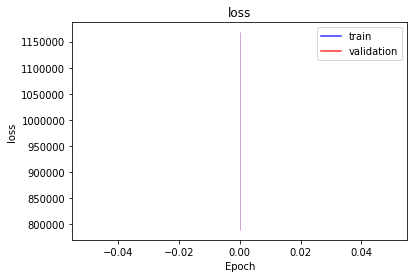

<b>bioma_loss</b>: 489239.5000 (min: 394478.9062, max: 584000.0625)

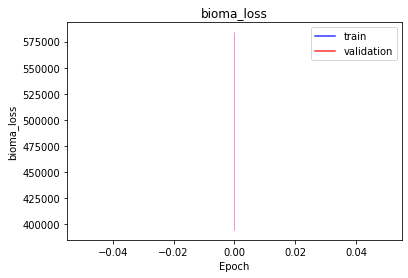

<b>domain_loss</b>: 489236.6250 (min: 394474.0312, max: 583999.1875)

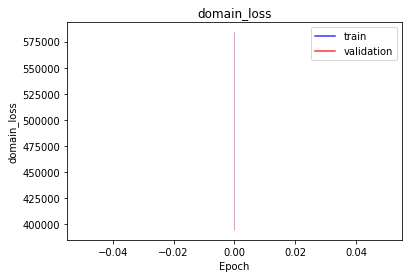

<b>latent_loss</b>: 0.5664 (min: 0.5346, max: 0.5982)

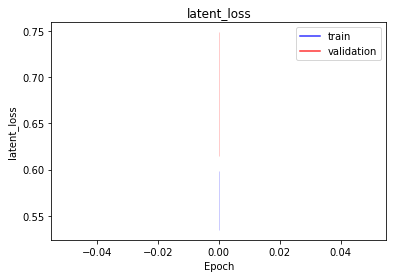

<b>bioma_mse</b>: 2.0272 (min: 1.9816, max: 2.0727)

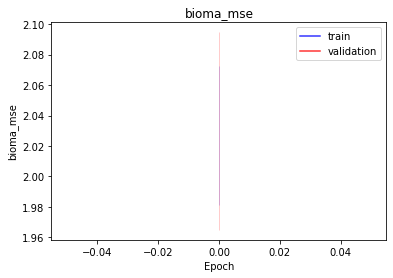

<b>bioma_mae</b>: 1.1247 (min: 1.0952, max: 1.1543)

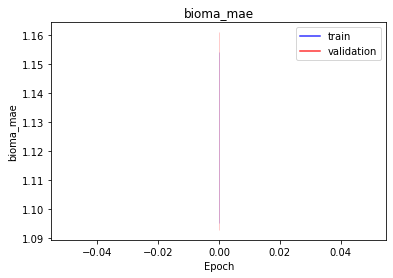

<b>bioma_mape</b>: nan (min: nan, max: nan)

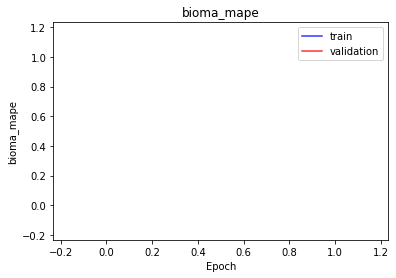

<b>domain_mse</b>: 2.0113 (min: 1.9647, max: 2.0579)

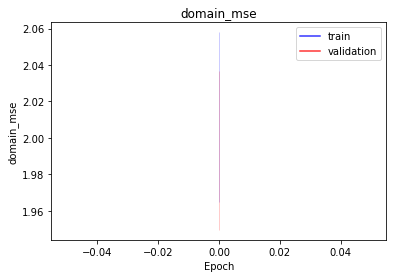

<b>domain_mae</b>: 1.1235 (min: 1.0937, max: 1.1533)

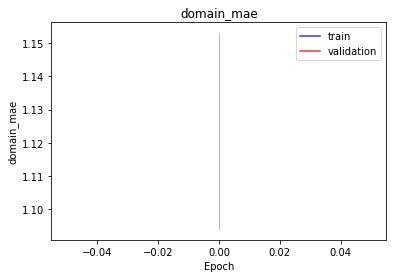

<b>domain_mape</b>: nan (min: nan, max: nan)

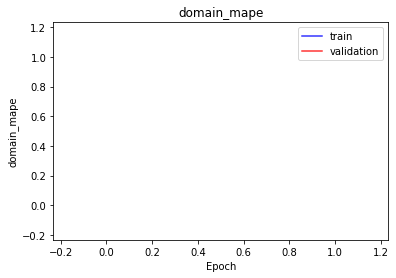

<b>latent_mae</b>: 0.5664 (min: 0.5346, max: 0.5982)

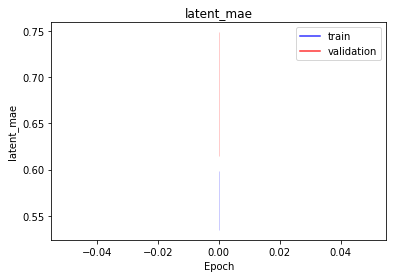

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978480.5625 (min: 788967.7500, max: 1167993.3750)

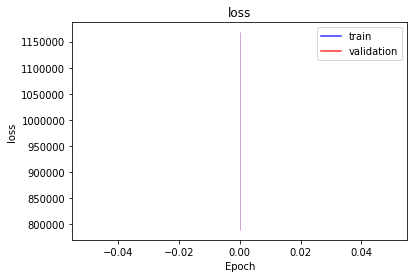

<b>bioma_loss</b>: 489240.0000 (min: 394483.3750, max: 583996.6250)

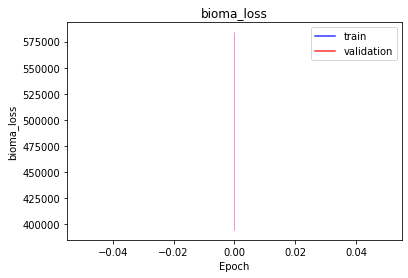

<b>domain_loss</b>: 489240.3750 (min: 394484.0938, max: 583996.6250)

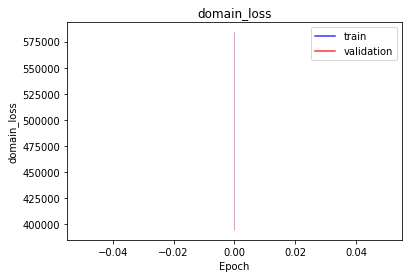

<b>latent_loss</b>: 0.2097 (min: 0.1729, max: 0.2465)

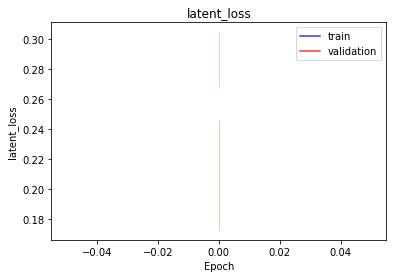

<b>bioma_mse</b>: 2.0162 (min: 1.9611, max: 2.0713)

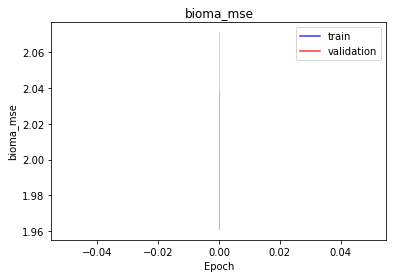

<b>bioma_mae</b>: 1.1237 (min: 1.0933, max: 1.1541)

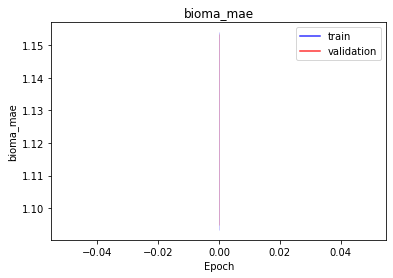

<b>bioma_mape</b>: nan (min: nan, max: nan)

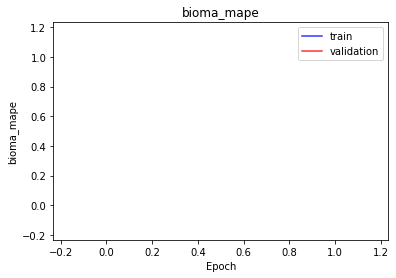

<b>domain_mse</b>: 2.0160 (min: 1.9628, max: 2.0692)

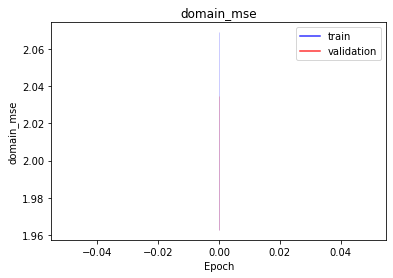

<b>domain_mae</b>: 1.1238 (min: 1.0941, max: 1.1534)

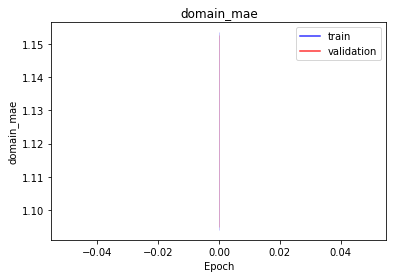

<b>domain_mape</b>: nan (min: nan, max: nan)

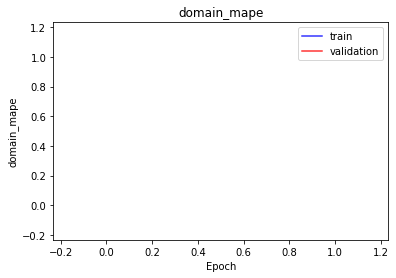

<b>latent_mae</b>: 0.2097 (min: 0.1729, max: 0.2465)

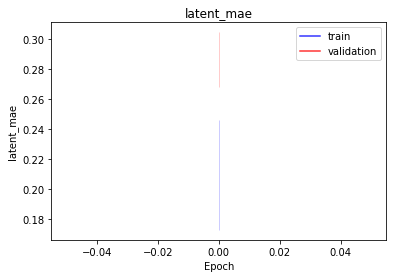

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978477.0938 (min: 788958.1875, max: 1167996.0000)

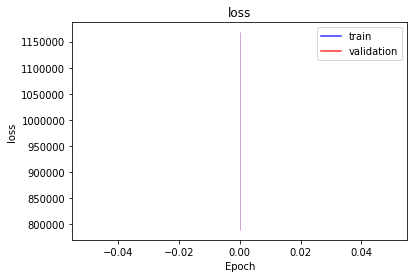

<b>bioma_loss</b>: 489237.8750 (min: 394480.0938, max: 583995.6250)

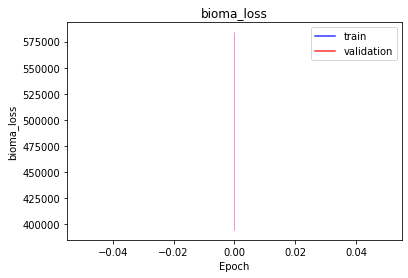

<b>domain_loss</b>: 489238.1875 (min: 394477.0312, max: 583999.3125)

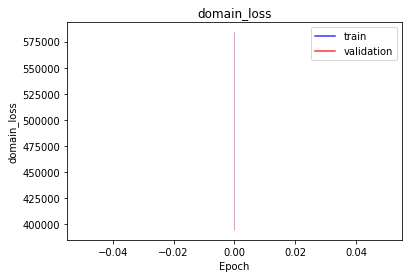

<b>latent_loss</b>: 1.0129 (min: 0.9609, max: 1.0650)

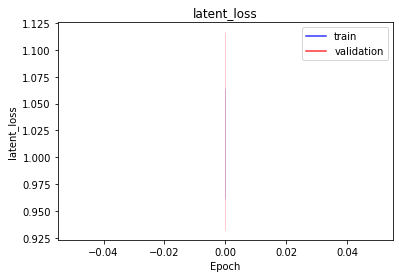

<b>bioma_mse</b>: 2.0056 (min: 1.9587, max: 2.0525)

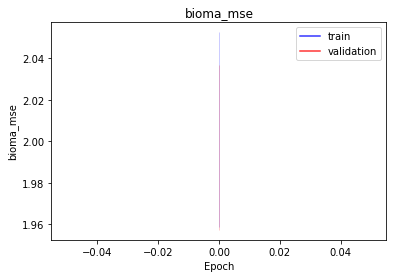

<b>bioma_mae</b>: 1.1183 (min: 1.0880, max: 1.1486)

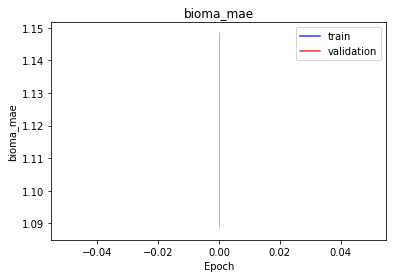

<b>bioma_mape</b>: nan (min: nan, max: nan)

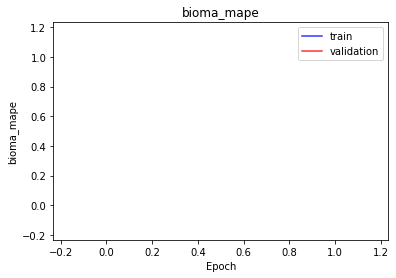

<b>domain_mse</b>: 2.0084 (min: 1.9602, max: 2.0567)

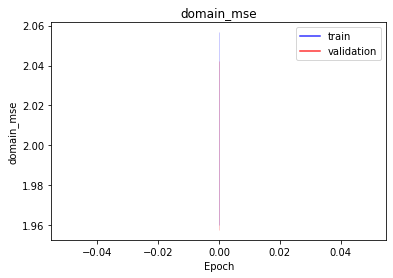

<b>domain_mae</b>: 1.1215 (min: 1.0909, max: 1.1521)

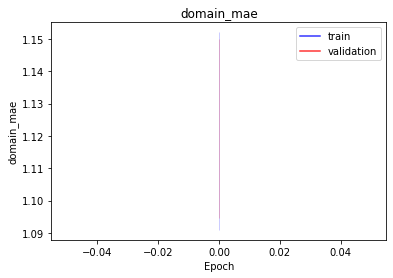

<b>domain_mape</b>: nan (min: nan, max: nan)

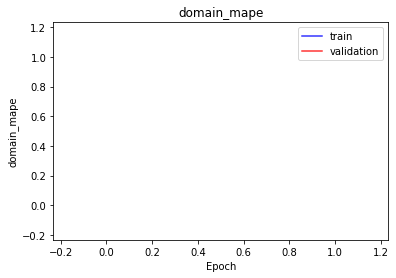

<b>latent_mae</b>: 1.0129 (min: 0.9609, max: 1.0650)

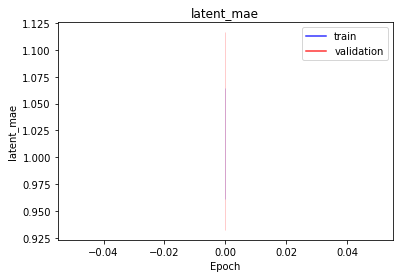

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978474.6562 (min: 788957.8125, max: 1167991.5000)

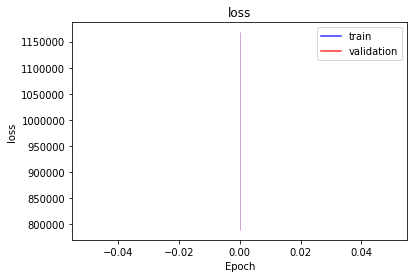

<b>bioma_loss</b>: 489238.0000 (min: 394479.5938, max: 583996.4375)

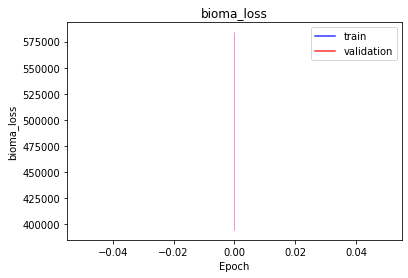

<b>domain_loss</b>: 489236.2188 (min: 394477.8125, max: 583994.6250)

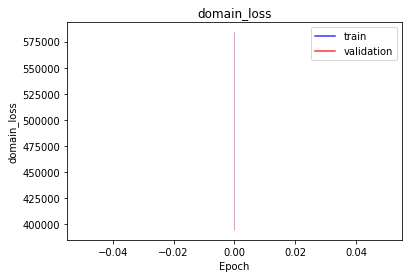

<b>latent_loss</b>: 0.4627 (min: 0.4081, max: 0.5173)

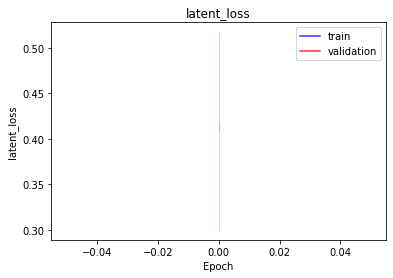

<b>bioma_mse</b>: 2.0146 (min: 1.9635, max: 2.0657)

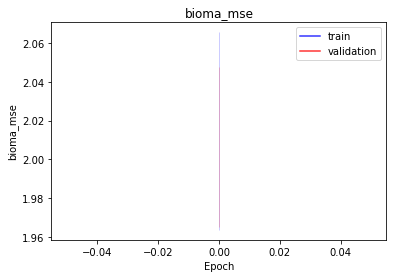

<b>bioma_mae</b>: 1.1233 (min: 1.0916, max: 1.1551)

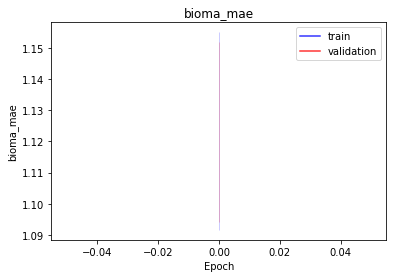

<b>bioma_mape</b>: nan (min: nan, max: nan)

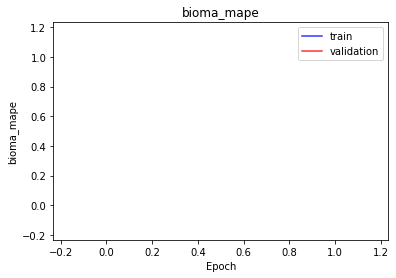

<b>domain_mse</b>: 2.0141 (min: 1.9633, max: 2.0649)

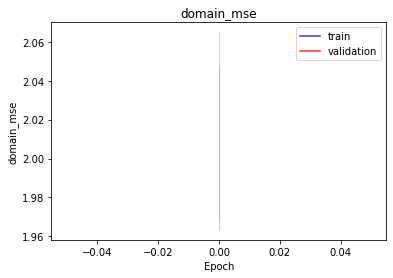

<b>domain_mae</b>: 1.1239 (min: 1.0929, max: 1.1550)

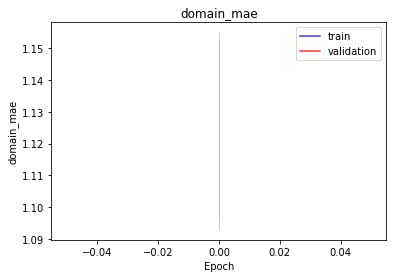

<b>domain_mape</b>: nan (min: nan, max: nan)

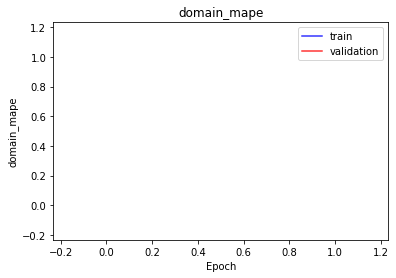

<b>latent_mae</b>: 0.4627 (min: 0.4081, max: 0.5173)

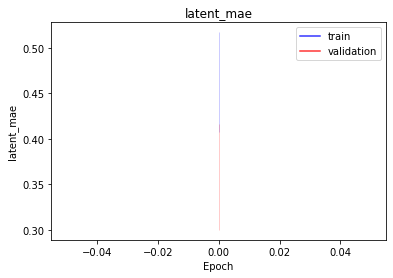

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978471.2188 (min: 788958.0625, max: 1167984.3750)

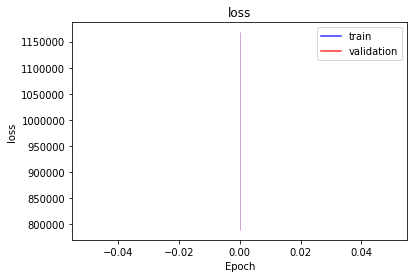

<b>bioma_loss</b>: 489235.4062 (min: 394478.8750, max: 583991.9375)

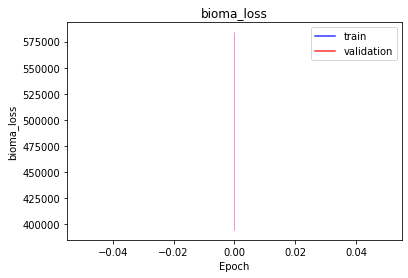

<b>domain_loss</b>: 489235.2812 (min: 394478.7500, max: 583991.8125)

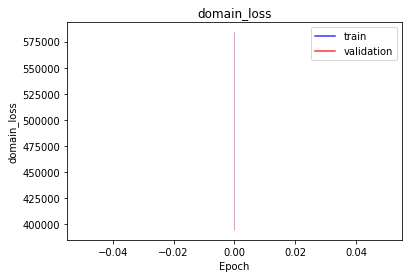

<b>latent_loss</b>: 0.5114 (min: 0.4345, max: 0.5883)

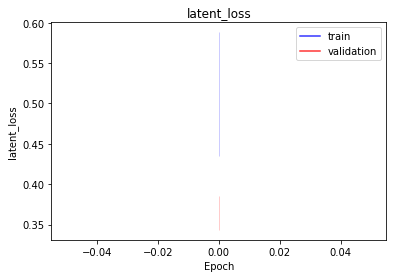

<b>bioma_mse</b>: 2.2192 (min: 2.1813, max: 2.2570)

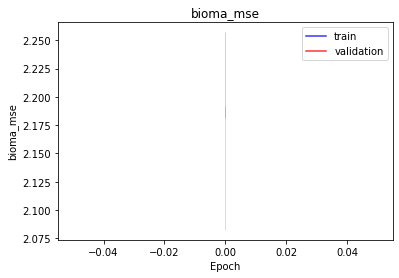

<b>bioma_mae</b>: 1.1793 (min: 1.1555, max: 1.2031)

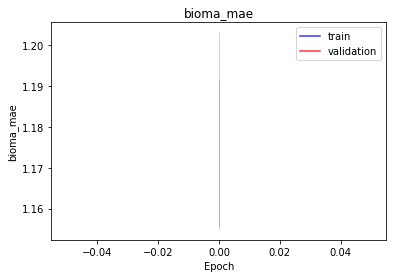

<b>bioma_mape</b>: nan (min: nan, max: nan)

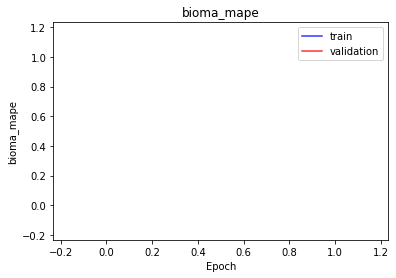

<b>domain_mse</b>: 2.2189 (min: 2.1810, max: 2.2567)

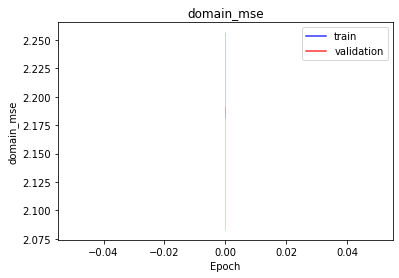

<b>domain_mae</b>: 1.1792 (min: 1.1553, max: 1.2031)

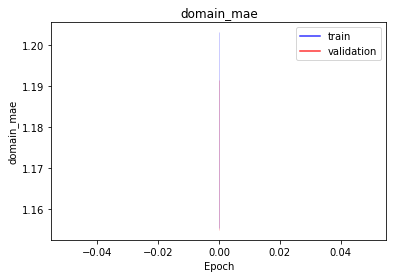

<b>domain_mape</b>: nan (min: nan, max: nan)

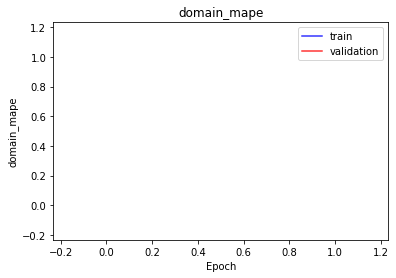

<b>latent_mae</b>: 0.5114 (min: 0.4345, max: 0.5883)

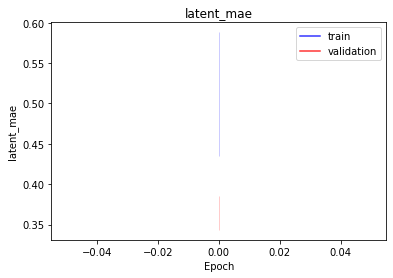

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978474.0938 (min: 788926.8125, max: 1168021.3750)

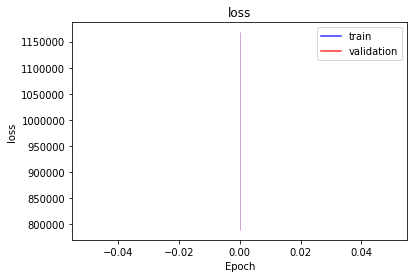

<b>bioma_loss</b>: 489237.0000 (min: 394463.4062, max: 584010.6250)

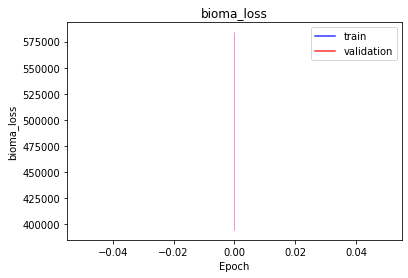

<b>domain_loss</b>: 489236.8750 (min: 394463.2812, max: 584010.5000)

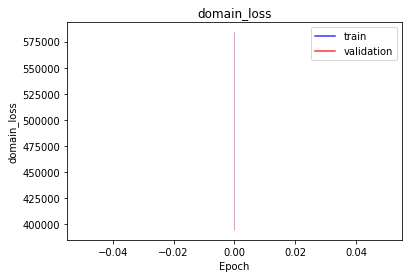

<b>latent_loss</b>: 0.1682 (min: 0.1460, max: 0.1903)

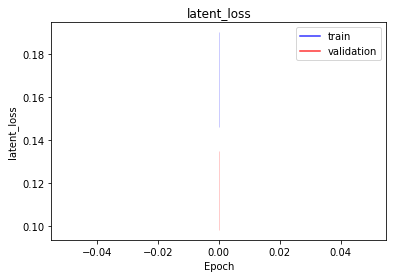

<b>bioma_mse</b>: 2.2240 (min: 2.1579, max: 2.2902)

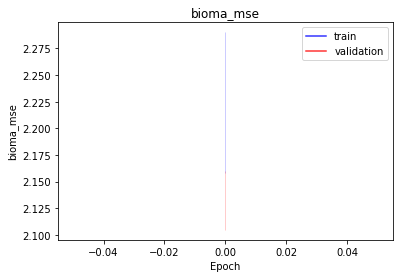

<b>bioma_mae</b>: 1.1824 (min: 1.1518, max: 1.2130)

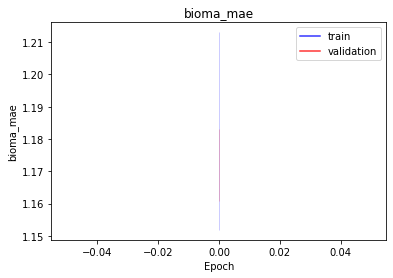

<b>bioma_mape</b>: nan (min: nan, max: nan)

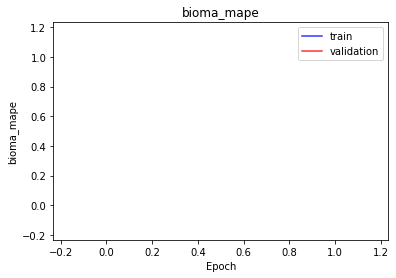

<b>domain_mse</b>: 2.2238 (min: 2.1576, max: 2.2900)

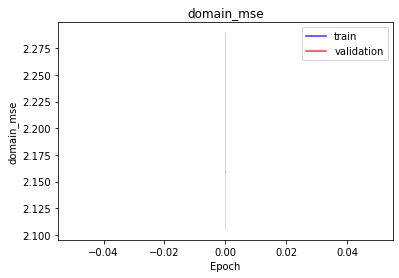

<b>domain_mae</b>: 1.1824 (min: 1.1518, max: 1.2130)

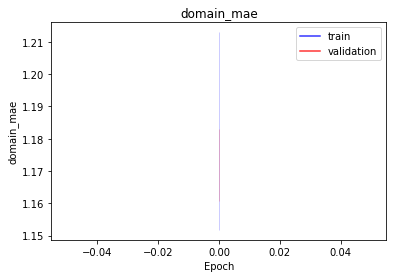

<b>domain_mape</b>: nan (min: nan, max: nan)

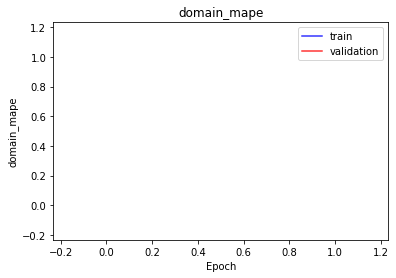

<b>latent_mae</b>: 0.1682 (min: 0.1460, max: 0.1903)

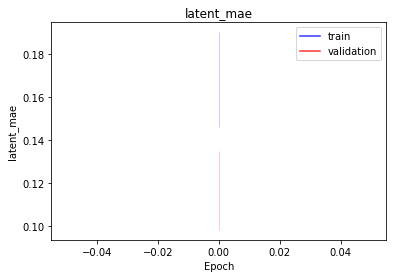

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978473.5312 (min: 788958.1875, max: 1167988.8750)

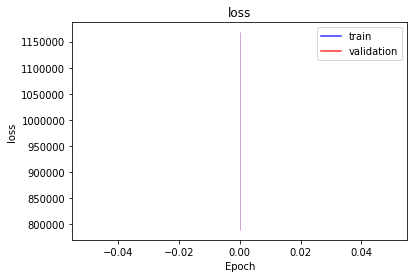

<b>bioma_loss</b>: 489237.5000 (min: 394481.0312, max: 583994.0000)

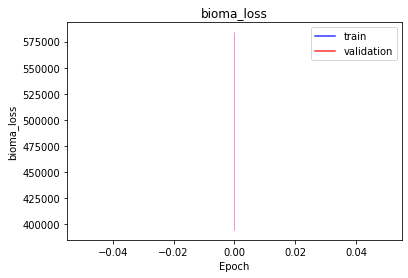

<b>domain_loss</b>: 489235.1562 (min: 394476.3125, max: 583994.0000)

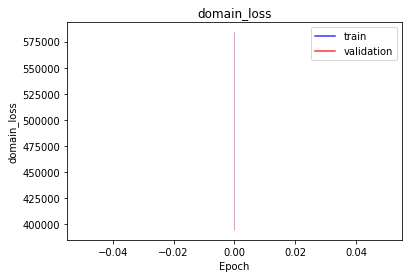

<b>latent_loss</b>: 0.8043 (min: 0.7933, max: 0.8153)

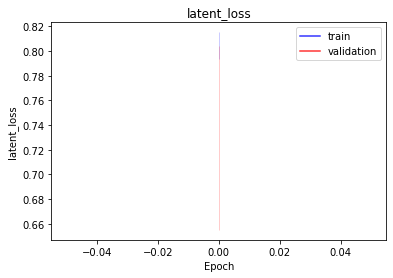

<b>bioma_mse</b>: 2.0211 (min: 1.9756, max: 2.0666)

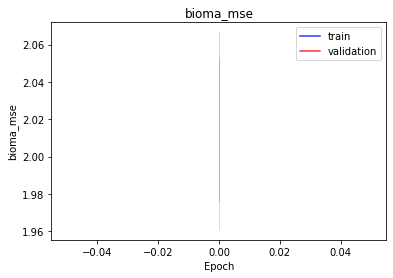

<b>bioma_mae</b>: 1.1232 (min: 1.0930, max: 1.1534)

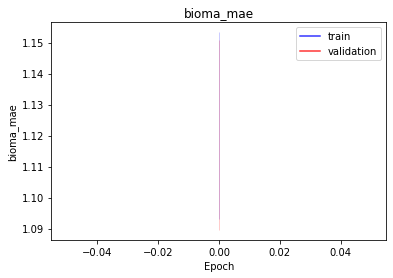

<b>bioma_mape</b>: nan (min: nan, max: nan)

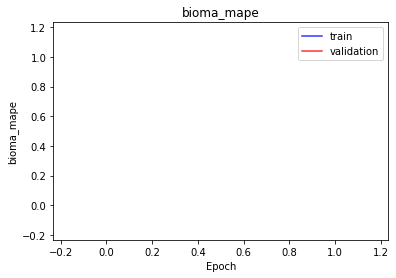

<b>domain_mse</b>: 2.0264 (min: 1.9912, max: 2.0615)

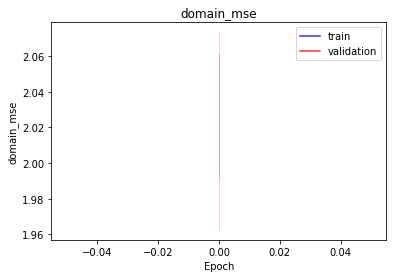

<b>domain_mae</b>: 1.1306 (min: 1.1048, max: 1.1563)

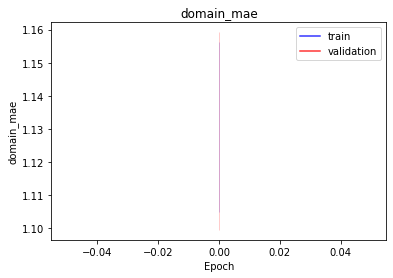

<b>domain_mape</b>: nan (min: nan, max: nan)

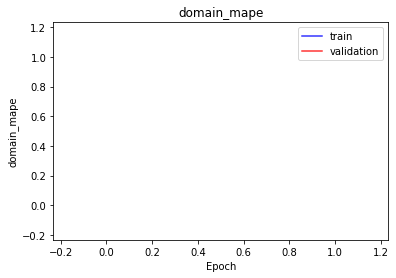

<b>latent_mae</b>: 0.8043 (min: 0.7933, max: 0.8153)

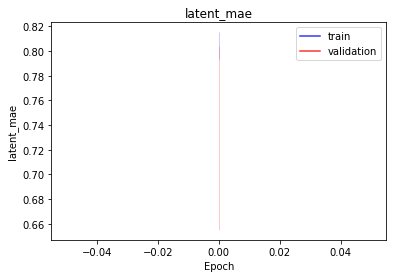

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978477.0000 (min: 788960.5000, max: 1167993.5000)

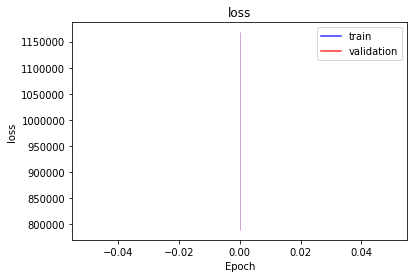

<b>bioma_loss</b>: 489237.6875 (min: 394480.0312, max: 583995.3750)

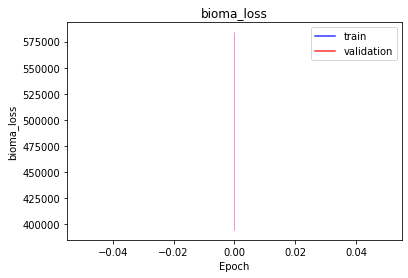

<b>domain_loss</b>: 489239.0312 (min: 394480.2500, max: 583997.8125)

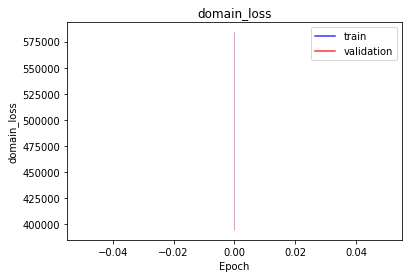

<b>latent_loss</b>: 0.2444 (min: 0.2252, max: 0.2637)

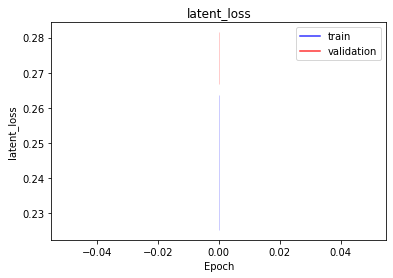

<b>bioma_mse</b>: 2.0226 (min: 1.9862, max: 2.0590)

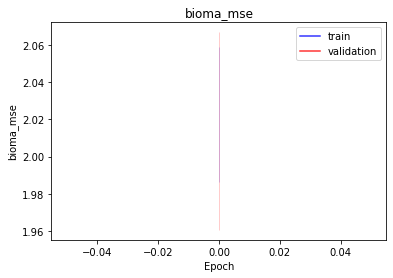

<b>bioma_mae</b>: 1.1252 (min: 1.0998, max: 1.1506)

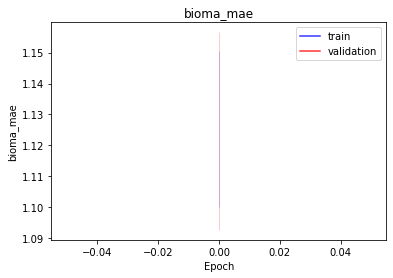

<b>bioma_mape</b>: nan (min: nan, max: nan)

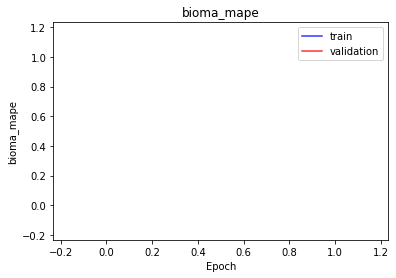

<b>domain_mse</b>: 2.0254 (min: 1.9912, max: 2.0596)

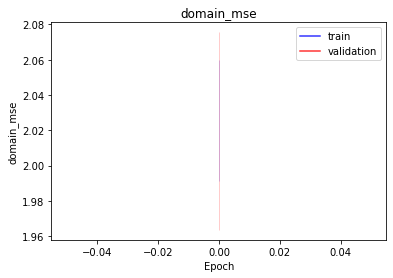

<b>domain_mae</b>: 1.1265 (min: 1.1021, max: 1.1508)

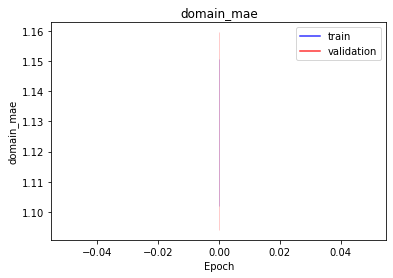

<b>domain_mape</b>: nan (min: nan, max: nan)

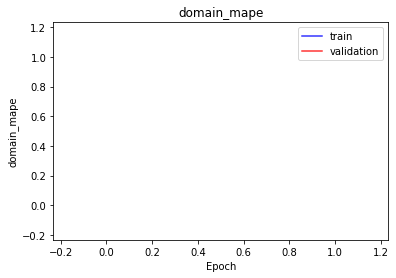

<b>latent_mae</b>: 0.2444 (min: 0.2252, max: 0.2637)

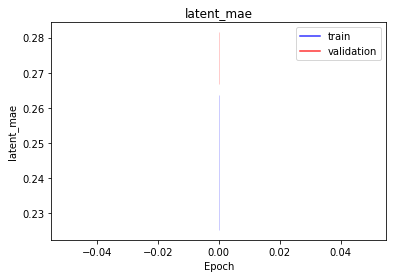

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978479.9062 (min: 788960.9375, max: 1167998.8750)

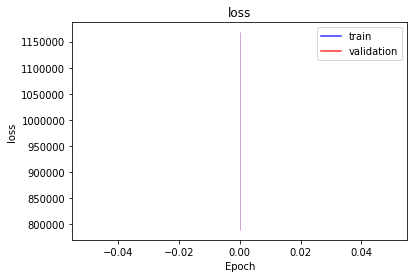

<b>bioma_loss</b>: 489236.7500 (min: 394477.4062, max: 583996.0625)

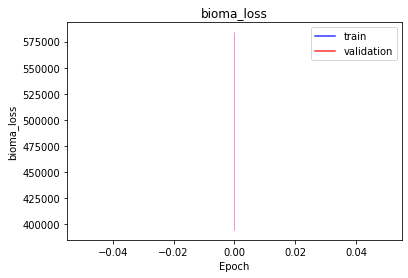

<b>domain_loss</b>: 489242.2812 (min: 394482.5625, max: 584002.0000)

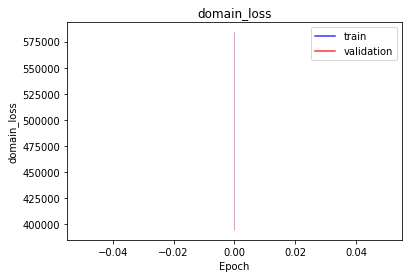

<b>latent_loss</b>: 0.8789 (min: 0.8377, max: 0.9201)

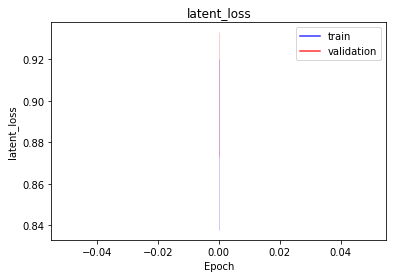

<b>bioma_mse</b>: 2.0288 (min: 1.9792, max: 2.0785)

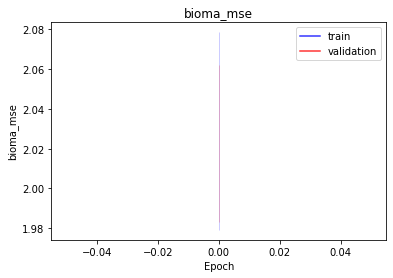

<b>bioma_mae</b>: 1.1254 (min: 1.0933, max: 1.1575)

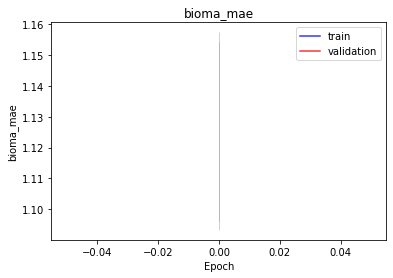

<b>bioma_mape</b>: nan (min: nan, max: nan)

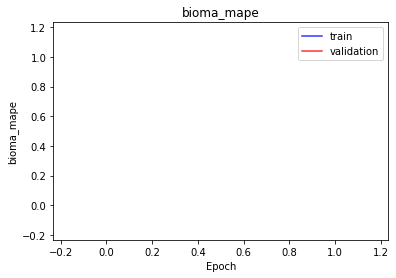

<b>domain_mse</b>: 2.0426 (min: 1.9920, max: 2.0931)

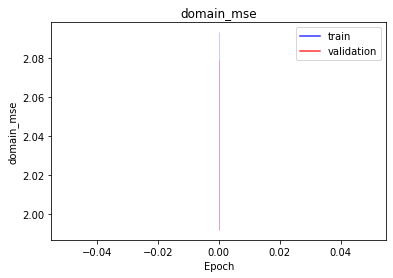

<b>domain_mae</b>: 1.1320 (min: 1.1011, max: 1.1629)

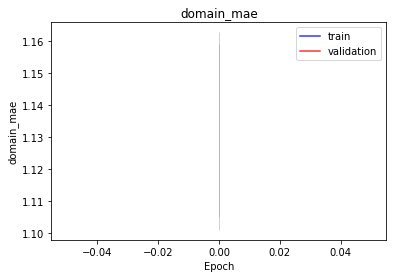

<b>domain_mape</b>: nan (min: nan, max: nan)

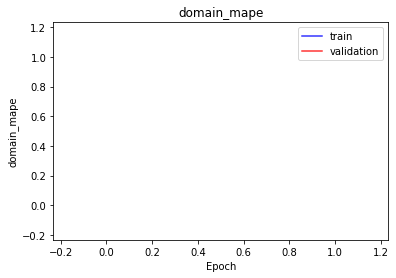

<b>latent_mae</b>: 0.8789 (min: 0.8377, max: 0.9201)

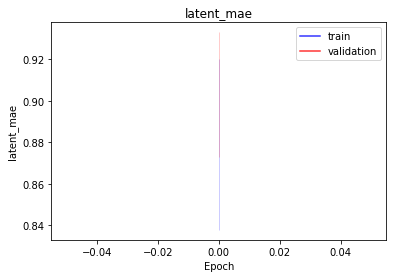

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978479.9688 (min: 788953.4375, max: 1168006.5000)

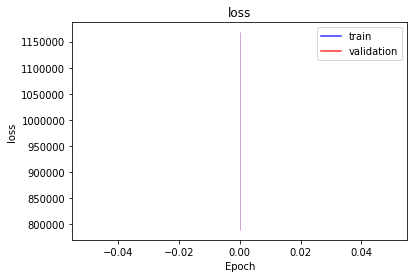

<b>bioma_loss</b>: 489239.3750 (min: 394476.8750, max: 584001.8750)

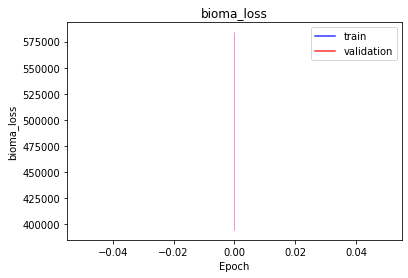

<b>domain_loss</b>: 489240.0625 (min: 394476.0938, max: 584004.0625)

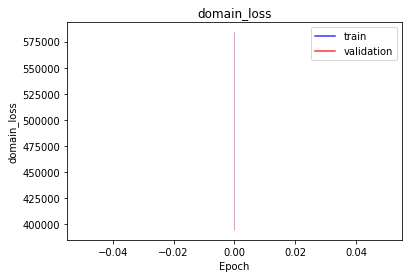

<b>latent_loss</b>: 0.4575 (min: 0.4561, max: 0.4589)

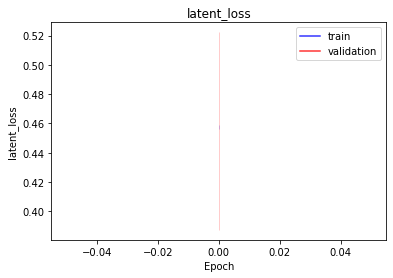

<b>bioma_mse</b>: 2.0234 (min: 1.9830, max: 2.0639)

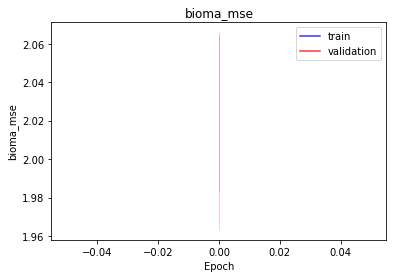

<b>bioma_mae</b>: 1.1260 (min: 1.0976, max: 1.1544)

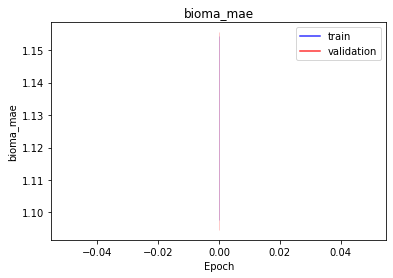

<b>bioma_mape</b>: nan (min: nan, max: nan)

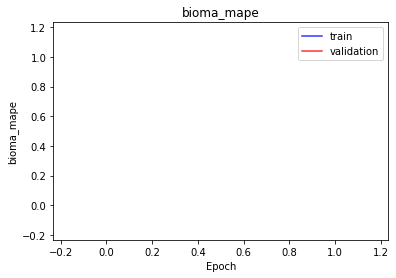

<b>domain_mse</b>: 2.0281 (min: 1.9950, max: 2.0611)

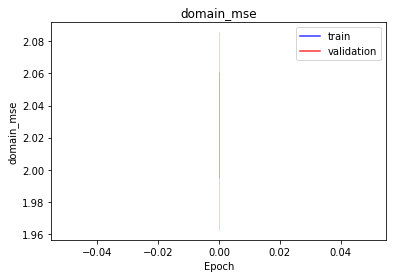

<b>domain_mae</b>: 1.1289 (min: 1.1036, max: 1.1542)

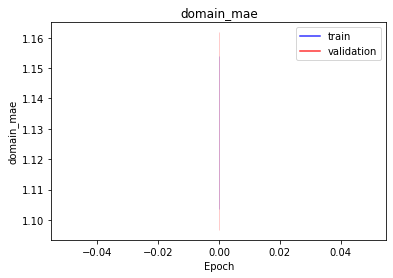

<b>domain_mape</b>: nan (min: nan, max: nan)

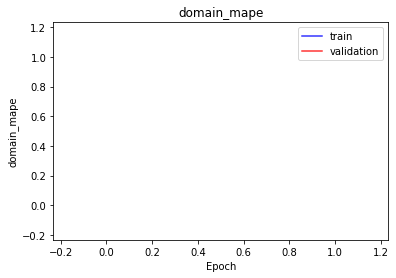

<b>latent_mae</b>: 0.4575 (min: 0.4561, max: 0.4589)

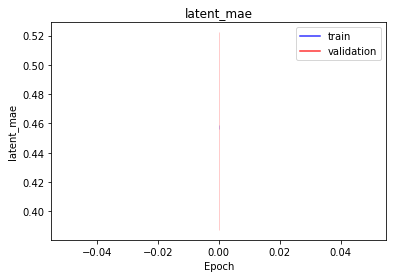

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978467.1250 (min: 788935.2500, max: 1167999.0000)

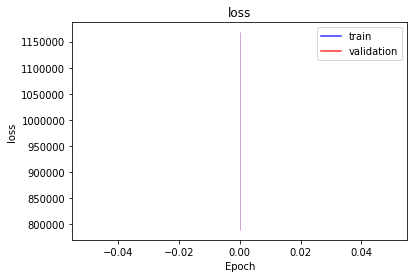

<b>bioma_loss</b>: 489232.6875 (min: 394467.1250, max: 583998.2500)

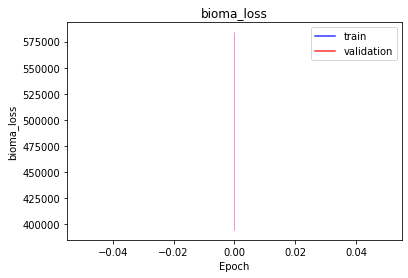

<b>domain_loss</b>: 489233.9375 (min: 394467.5938, max: 584000.3125)

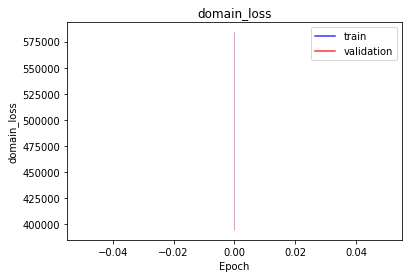

<b>latent_loss</b>: 0.5106 (min: 0.4931, max: 0.5281)

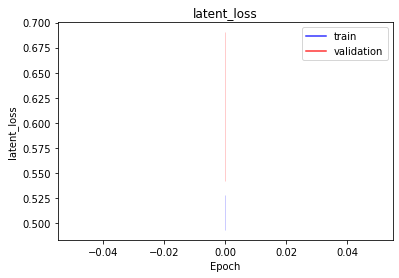

<b>bioma_mse</b>: 2.1377 (min: 2.1244, max: 2.1510)

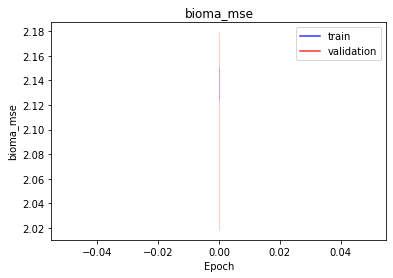

<b>bioma_mae</b>: 1.1572 (min: 1.1447, max: 1.1698)

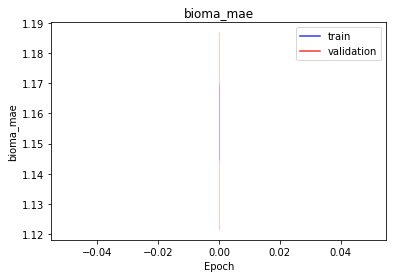

<b>bioma_mape</b>: nan (min: nan, max: nan)

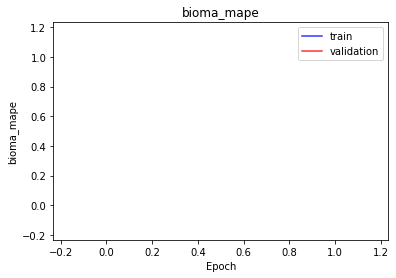

<b>domain_mse</b>: 2.1385 (min: 2.1236, max: 2.1534)

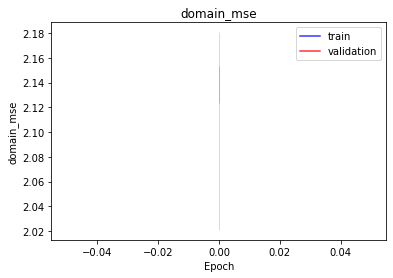

<b>domain_mae</b>: 1.1574 (min: 1.1441, max: 1.1707)

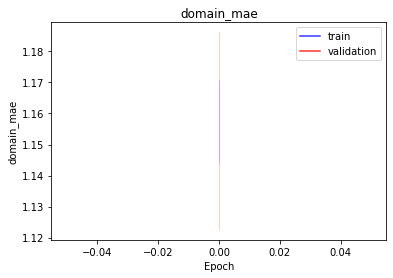

<b>domain_mape</b>: nan (min: nan, max: nan)

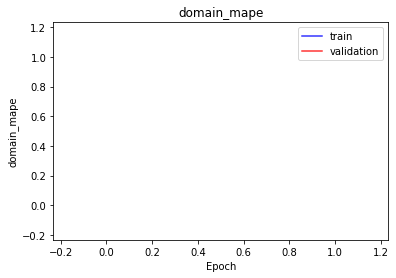

<b>latent_mae</b>: 0.5106 (min: 0.4931, max: 0.5281)

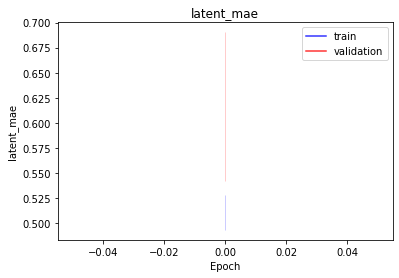

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978458.7188 (min: 788950.3125, max: 1167967.1250)

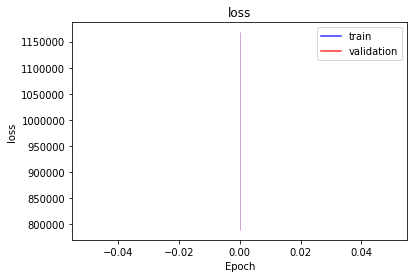

<b>bioma_loss</b>: 489229.1875 (min: 394474.9688, max: 583983.4375)

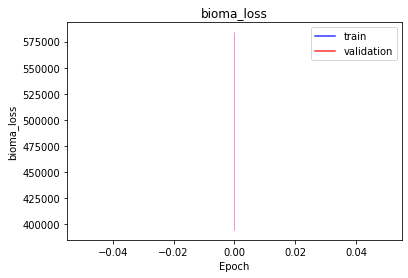

<b>domain_loss</b>: 489229.3438 (min: 394475.1875, max: 583983.5000)

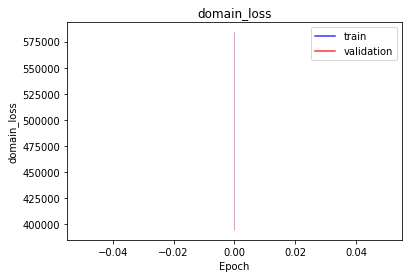

<b>latent_loss</b>: 0.1776 (min: 0.1755, max: 0.1797)

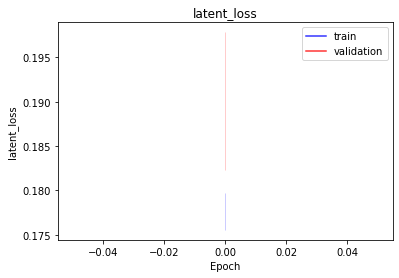

<b>bioma_mse</b>: 2.0959 (min: 2.0570, max: 2.1348)

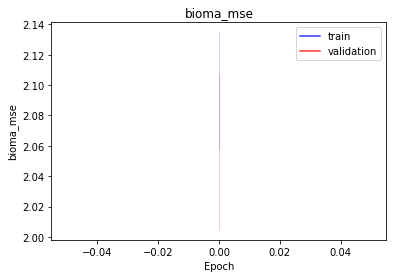

<b>bioma_mae</b>: 1.1489 (min: 1.1281, max: 1.1698)

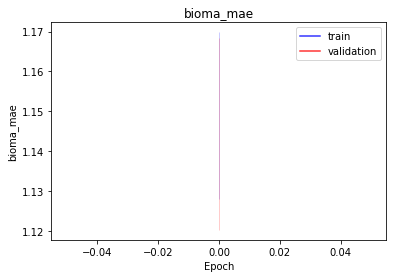

<b>bioma_mape</b>: nan (min: nan, max: nan)

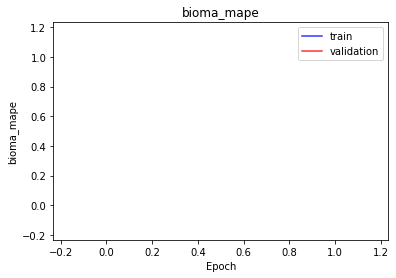

<b>domain_mse</b>: 2.0954 (min: 2.0567, max: 2.1340)

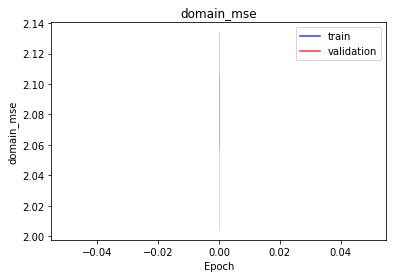

<b>domain_mae</b>: 1.1488 (min: 1.1281, max: 1.1695)

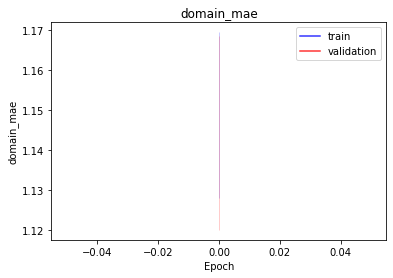

<b>domain_mape</b>: nan (min: nan, max: nan)

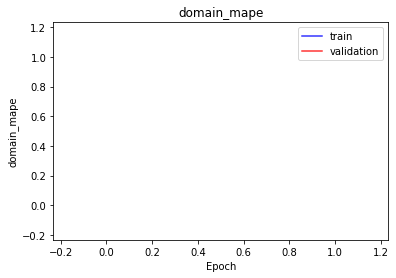

<b>latent_mae</b>: 0.1776 (min: 0.1755, max: 0.1797)

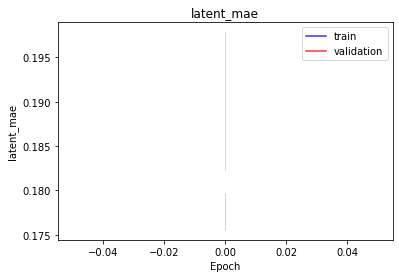

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978475.9062 (min: 788957.6875, max: 1167994.1250)

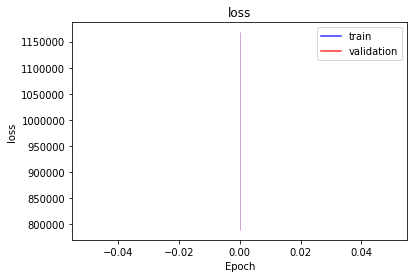

<b>bioma_loss</b>: 489238.5000 (min: 394479.4062, max: 583997.6250)

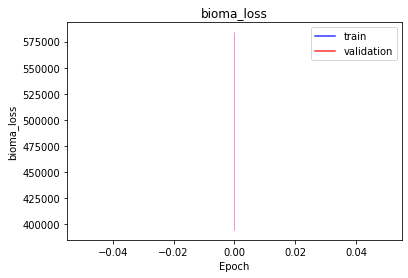

<b>domain_loss</b>: 489236.2500 (min: 394477.2500, max: 583995.2500)

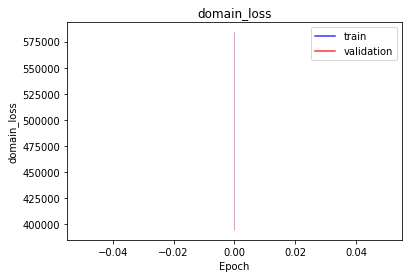

<b>latent_loss</b>: 1.1308 (min: 1.0739, max: 1.1876)

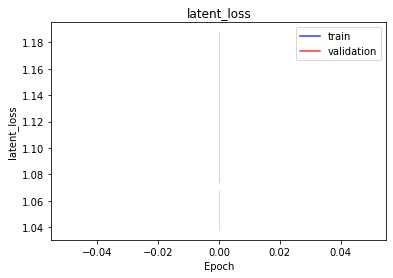

<b>bioma_mse</b>: 2.0298 (min: 1.9855, max: 2.0741)

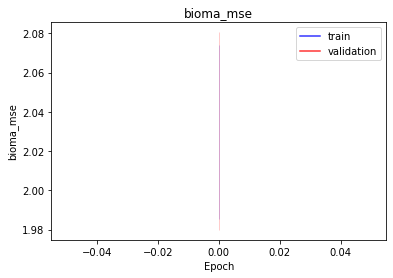

<b>bioma_mae</b>: 1.1243 (min: 1.0953, max: 1.1532)

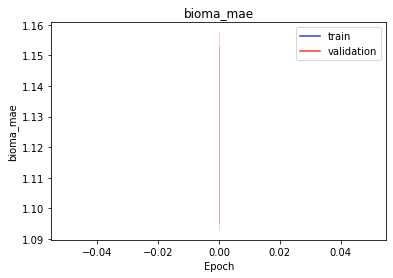

<b>bioma_mape</b>: nan (min: nan, max: nan)

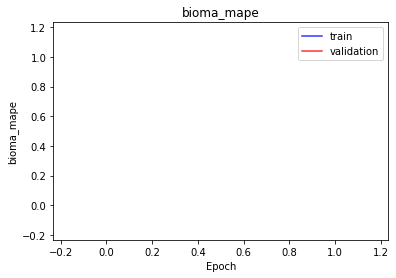

<b>domain_mse</b>: 2.0369 (min: 1.9867, max: 2.0871)

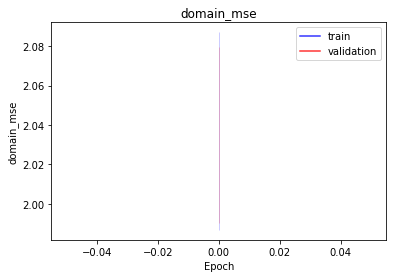

<b>domain_mae</b>: 1.1299 (min: 1.0991, max: 1.1606)

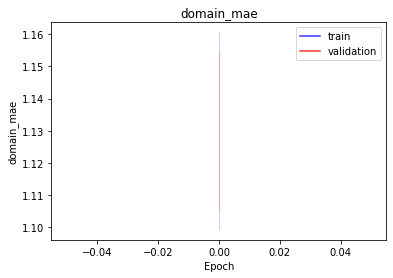

<b>domain_mape</b>: nan (min: nan, max: nan)

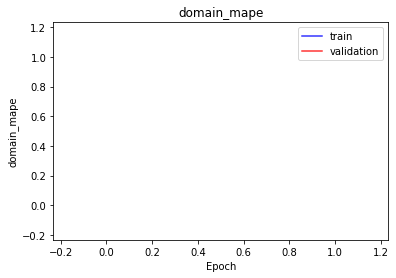

<b>latent_mae</b>: 1.1308 (min: 1.0739, max: 1.1876)

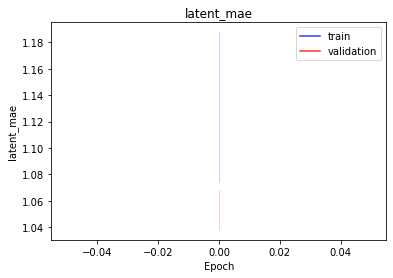

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.9062 (min: 788960.4375, max: 1168003.3750)

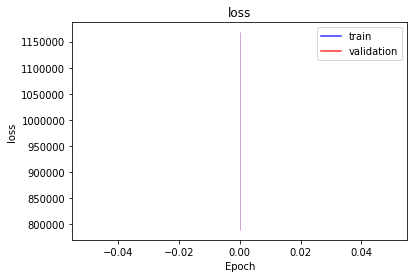

<b>bioma_loss</b>: 489239.7812 (min: 394479.0000, max: 584000.5625)

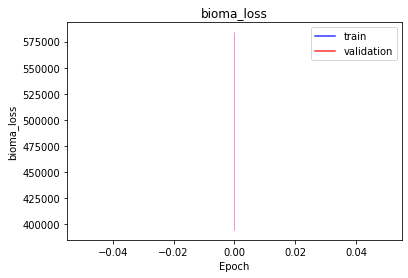

<b>domain_loss</b>: 489241.6250 (min: 394481.0312, max: 584002.1875)

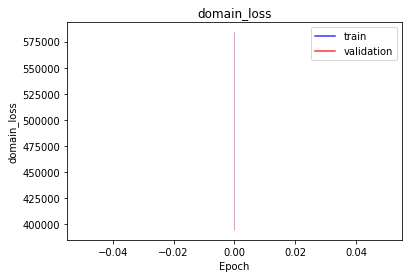

<b>latent_loss</b>: 0.5057 (min: 0.4377, max: 0.5738)

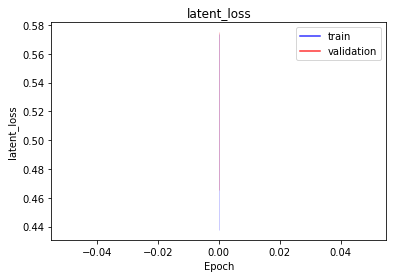

<b>bioma_mse</b>: 2.0214 (min: 1.9782, max: 2.0645)

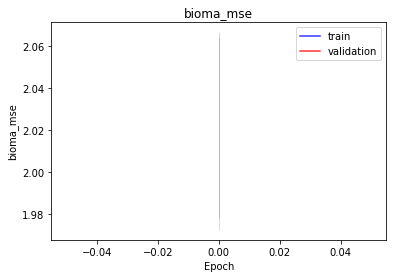

<b>bioma_mae</b>: 1.1259 (min: 1.0973, max: 1.1544)

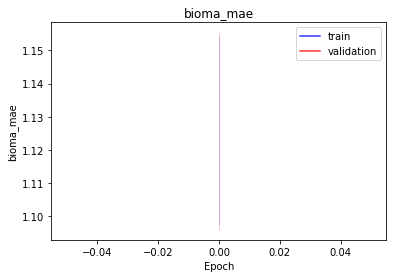

<b>bioma_mape</b>: nan (min: nan, max: nan)

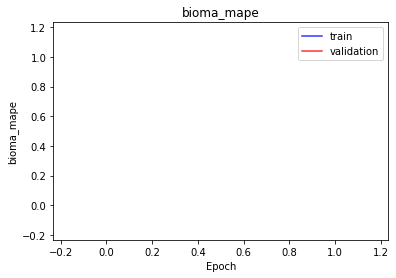

<b>domain_mse</b>: 2.0255 (min: 1.9819, max: 2.0691)

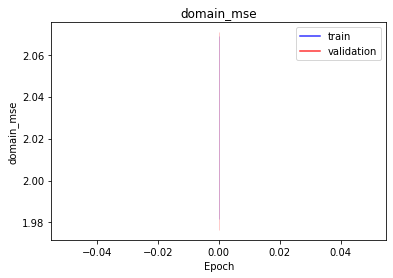

<b>domain_mae</b>: 1.1270 (min: 1.0983, max: 1.1557)

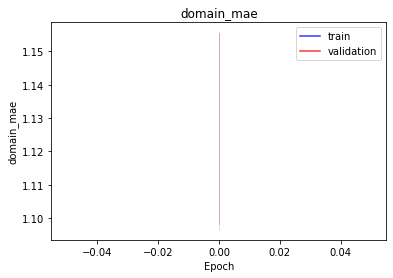

<b>domain_mape</b>: nan (min: nan, max: nan)

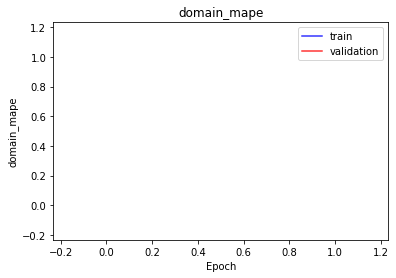

<b>latent_mae</b>: 0.5057 (min: 0.4377, max: 0.5738)

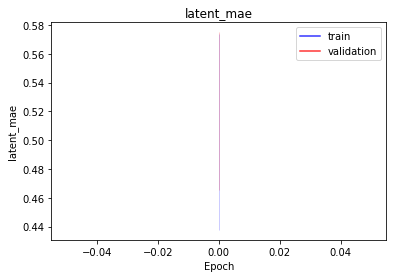

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978480.4375 (min: 788968.1250, max: 1167992.7500)

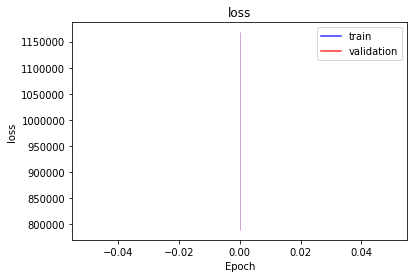

<b>bioma_loss</b>: 489239.1250 (min: 394484.8438, max: 583993.4375)

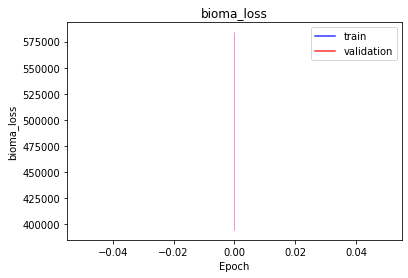

<b>domain_loss</b>: 489240.2500 (min: 394482.4688, max: 583998.0000)

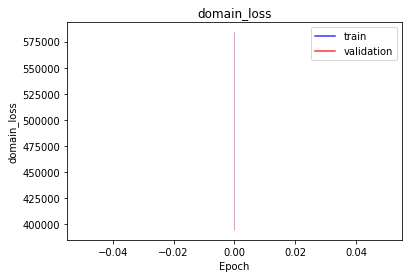

<b>latent_loss</b>: 0.9973 (min: 0.7993, max: 1.1953)

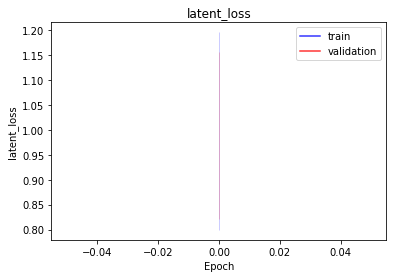

<b>bioma_mse</b>: 2.0272 (min: 1.9604, max: 2.0940)

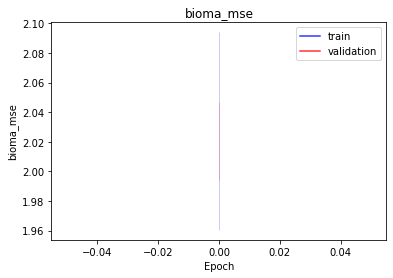

<b>bioma_mae</b>: 1.1247 (min: 1.0894, max: 1.1601)

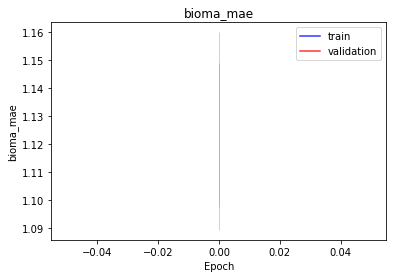

<b>bioma_mape</b>: nan (min: nan, max: nan)

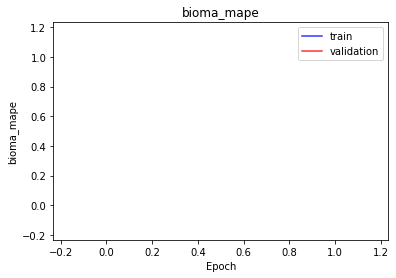

<b>domain_mse</b>: 2.0532 (min: 2.0012, max: 2.1051)

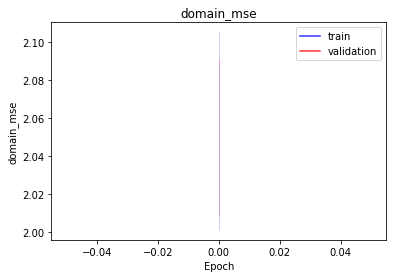

<b>domain_mae</b>: 1.1363 (min: 1.1076, max: 1.1650)

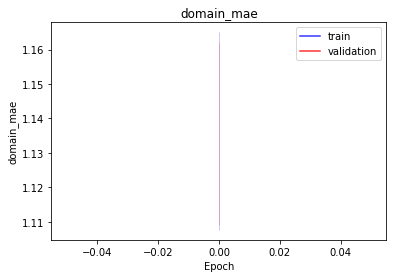

<b>domain_mape</b>: nan (min: nan, max: nan)

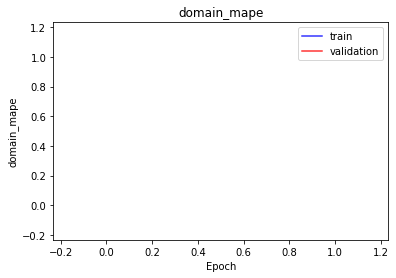

<b>latent_mae</b>: 0.9973 (min: 0.7993, max: 1.1953)

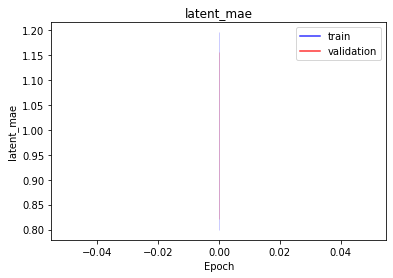

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978474.7812 (min: 788955.6875, max: 1167993.8750)

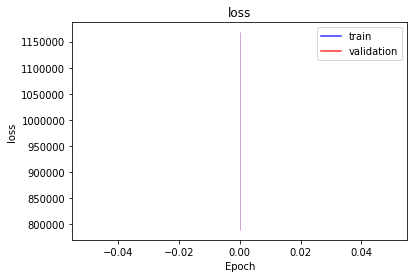

<b>bioma_loss</b>: 489235.8750 (min: 394476.8438, max: 583994.9375)

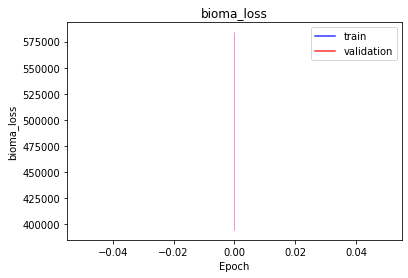

<b>domain_loss</b>: 489238.5000 (min: 394478.4688, max: 583998.5000)

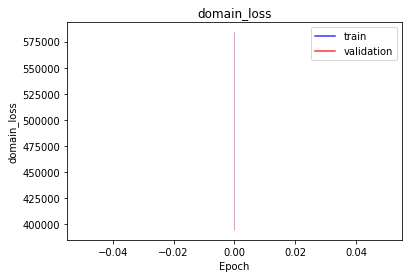

<b>latent_loss</b>: 0.3970 (min: 0.3647, max: 0.4293)

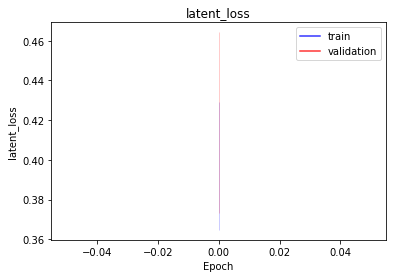

<b>bioma_mse</b>: 2.0114 (min: 1.9687, max: 2.0540)

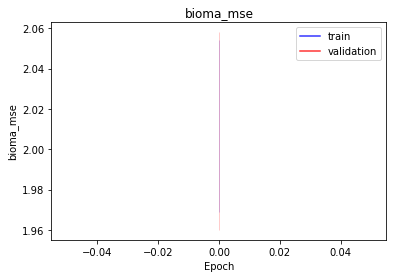

<b>bioma_mae</b>: 1.1228 (min: 1.0948, max: 1.1507)

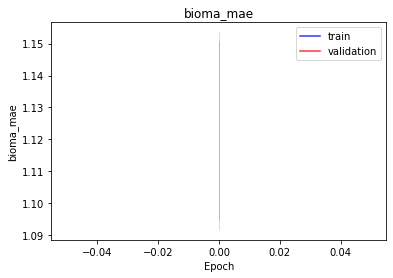

<b>bioma_mape</b>: nan (min: nan, max: nan)

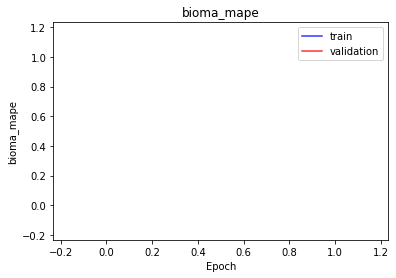

<b>domain_mse</b>: 2.0144 (min: 1.9733, max: 2.0556)

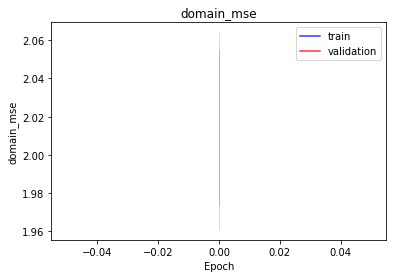

<b>domain_mae</b>: 1.1235 (min: 1.0965, max: 1.1505)

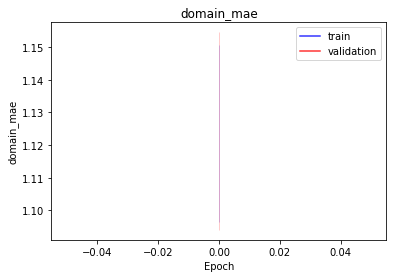

<b>domain_mape</b>: nan (min: nan, max: nan)

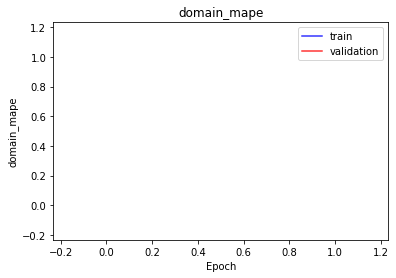

<b>latent_mae</b>: 0.3970 (min: 0.3647, max: 0.4293)

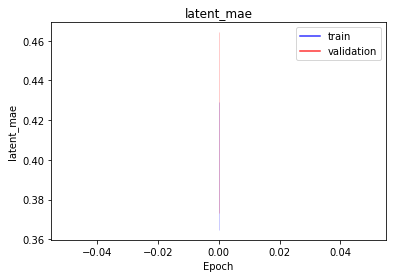

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978477.7188 (min: 788957.5625, max: 1167997.8750)

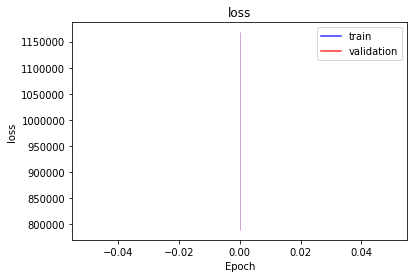

<b>bioma_loss</b>: 489236.0938 (min: 394475.7500, max: 583996.4375)

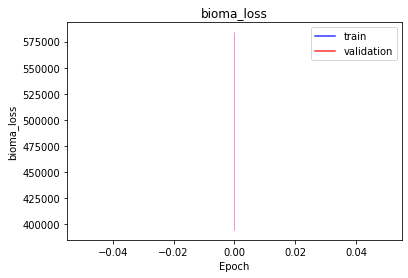

<b>domain_loss</b>: 489240.6875 (min: 394481.1250, max: 584000.2500)

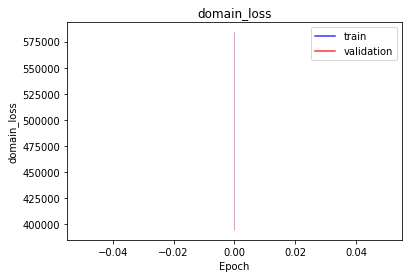

<b>latent_loss</b>: 0.9378 (min: 0.6972, max: 1.1783)

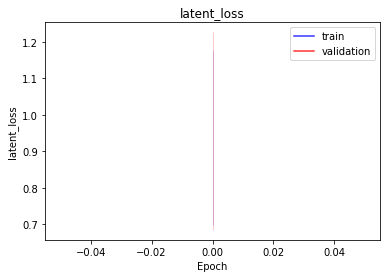

<b>bioma_mse</b>: 2.0122 (min: 1.9644, max: 2.0600)

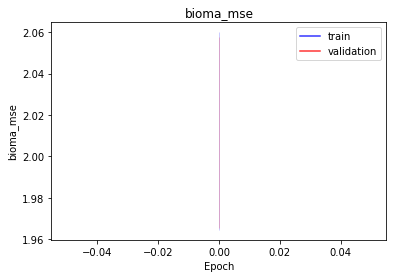

<b>bioma_mae</b>: 1.1211 (min: 1.0901, max: 1.1521)

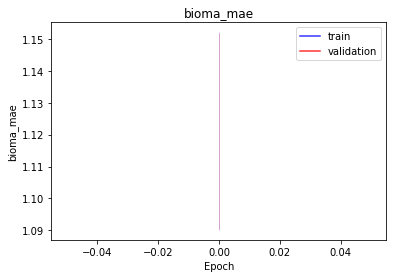

<b>bioma_mape</b>: nan (min: nan, max: nan)

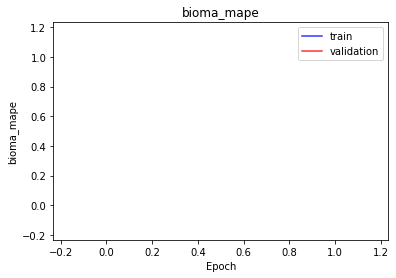

<b>domain_mse</b>: 2.0284 (min: 1.9732, max: 2.0836)

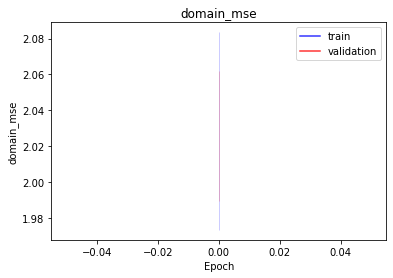

<b>domain_mae</b>: 1.1276 (min: 1.0965, max: 1.1587)

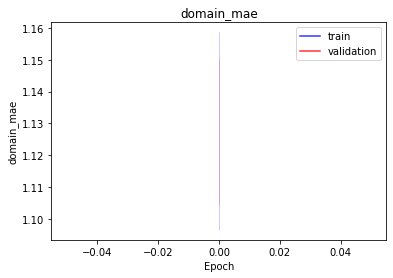

<b>domain_mape</b>: nan (min: nan, max: nan)

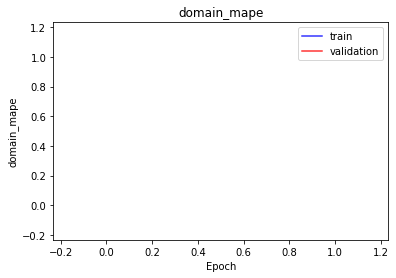

<b>latent_mae</b>: 0.9378 (min: 0.6972, max: 1.1783)

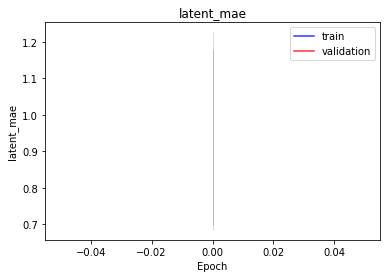

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978470.4375 (min: 788949.5000, max: 1167991.3750)

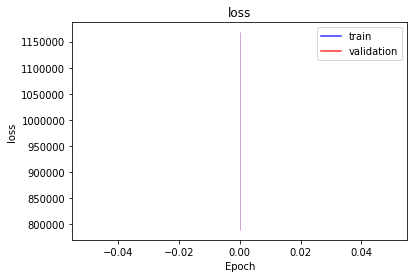

<b>bioma_loss</b>: 489236.1250 (min: 394475.9062, max: 583996.3750)

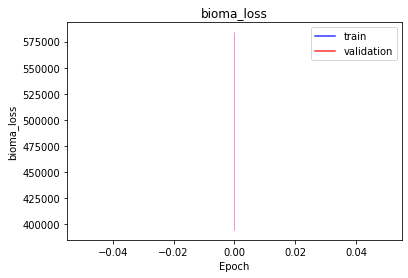

<b>domain_loss</b>: 489233.8125 (min: 394473.1250, max: 583994.5000)

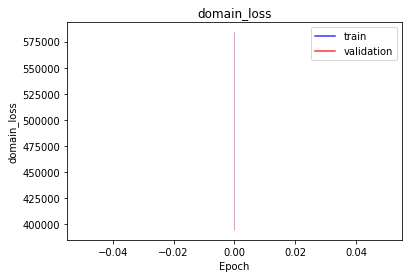

<b>latent_loss</b>: 0.5186 (min: 0.5076, max: 0.5295)

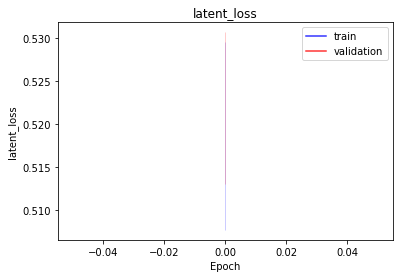

<b>bioma_mse</b>: 2.0193 (min: 1.9652, max: 2.0734)

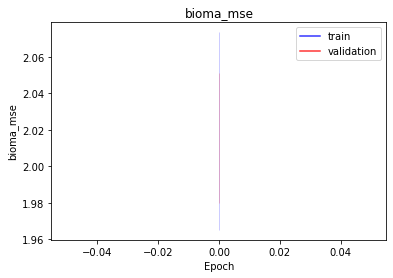

<b>bioma_mae</b>: 1.1248 (min: 1.0929, max: 1.1566)

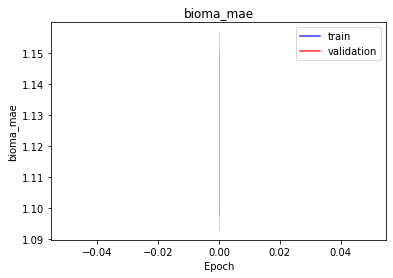

<b>bioma_mape</b>: nan (min: nan, max: nan)

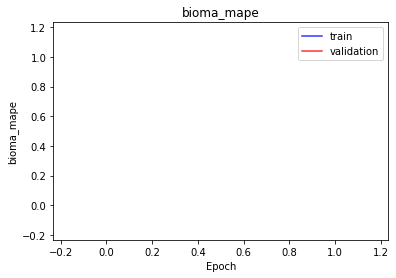

<b>domain_mse</b>: 2.0134 (min: 1.9705, max: 2.0564)

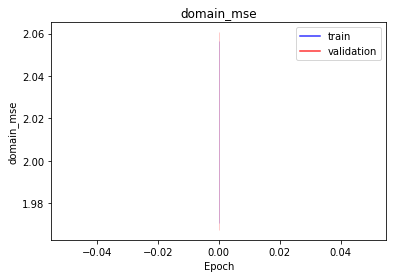

<b>domain_mae</b>: 1.1237 (min: 1.0961, max: 1.1513)

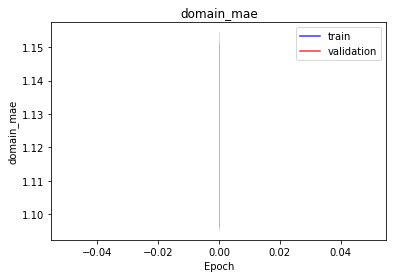

<b>domain_mape</b>: nan (min: nan, max: nan)

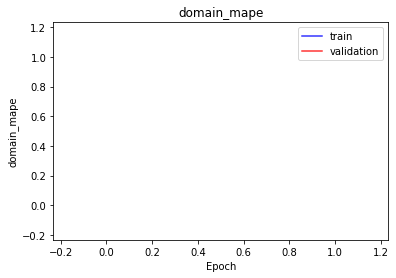

<b>latent_mae</b>: 0.5186 (min: 0.5076, max: 0.5295)

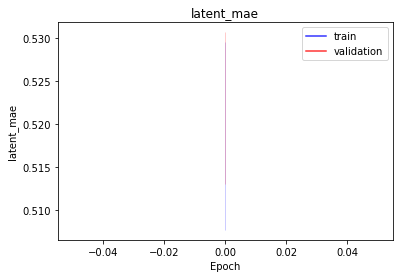

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978484.2188 (min: 788961.9375, max: 1168006.5000)

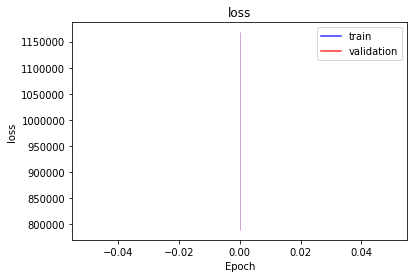

<b>bioma_loss</b>: 489241.1875 (min: 394478.2812, max: 584004.0625)

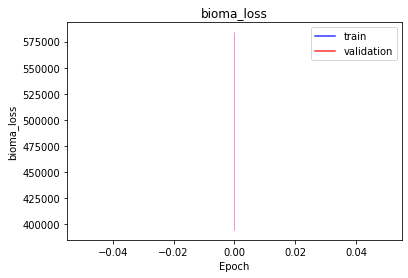

<b>domain_loss</b>: 489242.5625 (min: 394483.1250, max: 584002.0000)

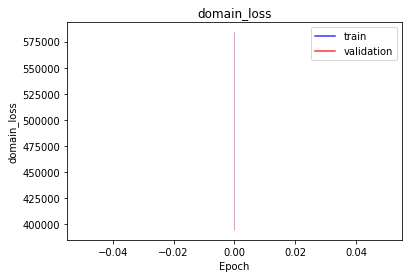

<b>latent_loss</b>: 0.5456 (min: 0.5137, max: 0.5776)

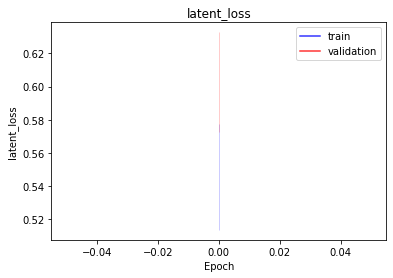

<b>bioma_mse</b>: 2.0584 (min: 2.0106, max: 2.1062)

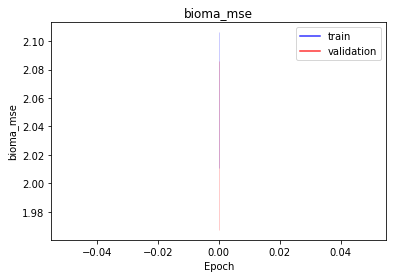

<b>bioma_mae</b>: 1.1314 (min: 1.1003, max: 1.1625)

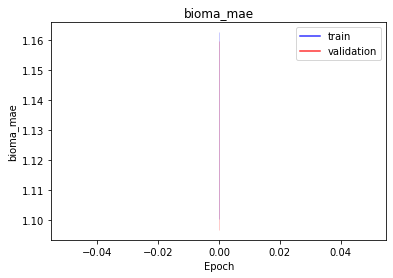

<b>bioma_mape</b>: nan (min: nan, max: nan)

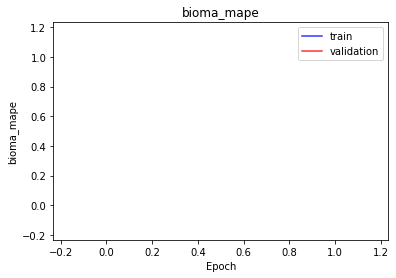

<b>domain_mse</b>: 2.0285 (min: 1.9736, max: 2.0835)

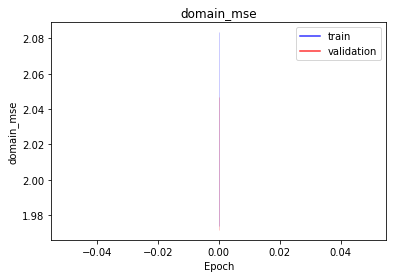

<b>domain_mae</b>: 1.1268 (min: 1.0968, max: 1.1568)

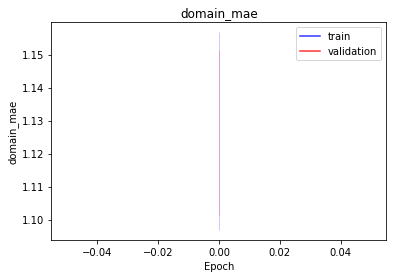

<b>domain_mape</b>: nan (min: nan, max: nan)

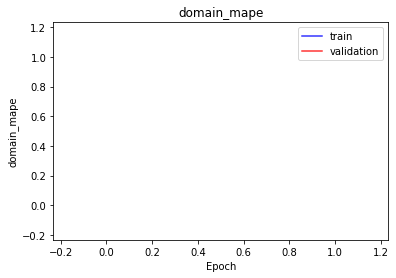

<b>latent_mae</b>: 0.5456 (min: 0.5137, max: 0.5776)

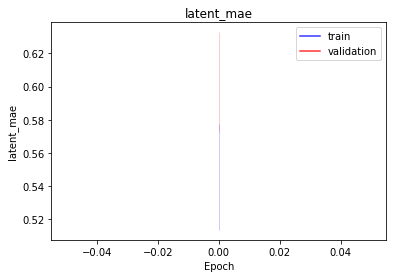

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978468.2812 (min: 788943.8125, max: 1167992.7500)

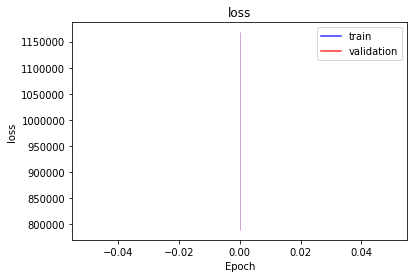

<b>bioma_loss</b>: 489234.0000 (min: 394471.7188, max: 583996.2500)

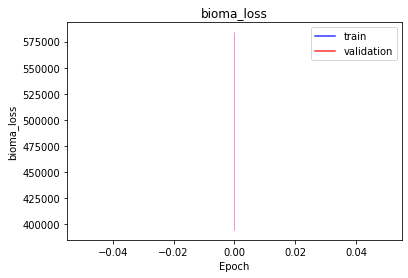

<b>domain_loss</b>: 489234.1250 (min: 394471.8750, max: 583996.3750)

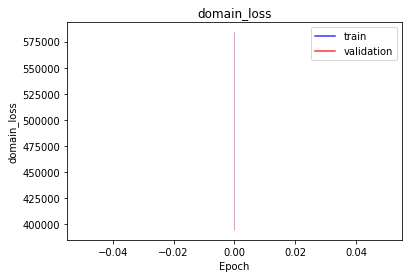

<b>latent_loss</b>: 0.1647 (min: 0.1478, max: 0.1817)

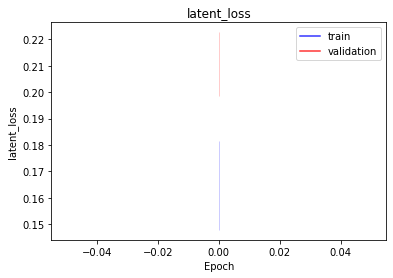

<b>bioma_mse</b>: 2.0692 (min: 2.0194, max: 2.1191)

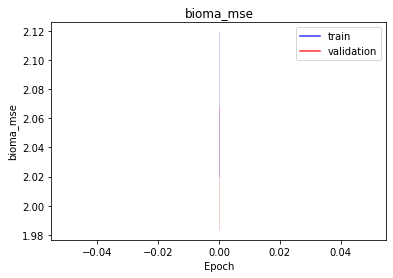

<b>bioma_mae</b>: 1.1420 (min: 1.1147, max: 1.1694)

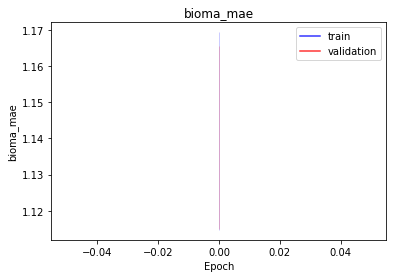

<b>bioma_mape</b>: nan (min: nan, max: nan)

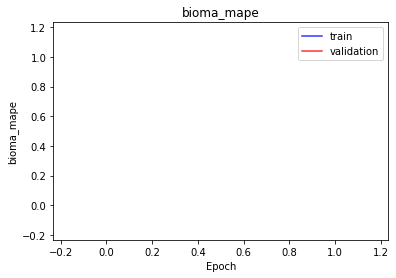

<b>domain_mse</b>: 2.0635 (min: 2.0207, max: 2.1062)

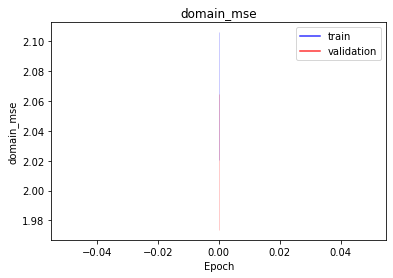

<b>domain_mae</b>: 1.1404 (min: 1.1141, max: 1.1668)

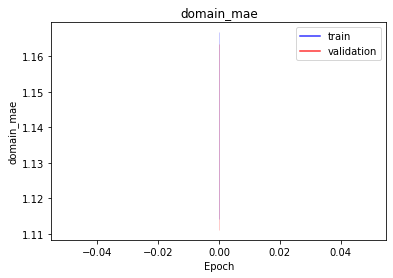

<b>domain_mape</b>: nan (min: nan, max: nan)

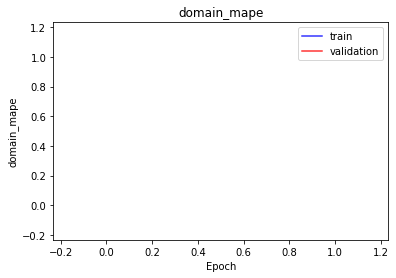

<b>latent_mae</b>: 0.1647 (min: 0.1478, max: 0.1817)

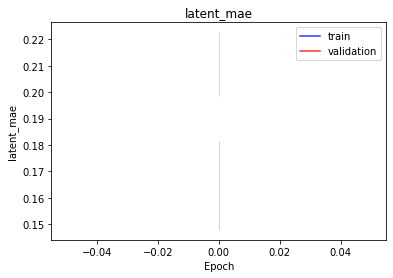

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978468.8125 (min: 788958.1250, max: 1167979.5000)

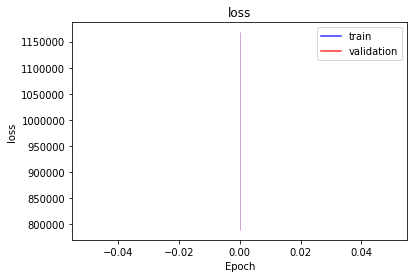

<b>bioma_loss</b>: 489234.3750 (min: 394476.4062, max: 583992.3125)

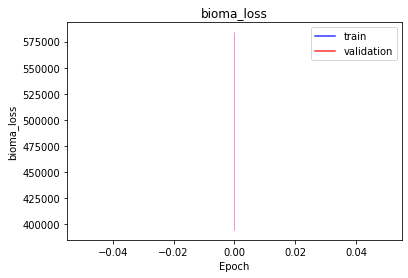

<b>domain_loss</b>: 489233.5625 (min: 394480.8750, max: 583986.2500)

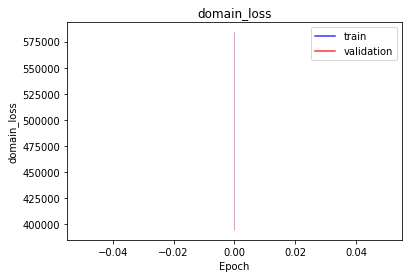

<b>latent_loss</b>: 0.9118 (min: 0.8672, max: 0.9564)

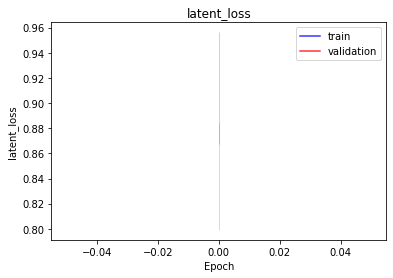

<b>bioma_mse</b>: 2.0370 (min: 1.9839, max: 2.0900)

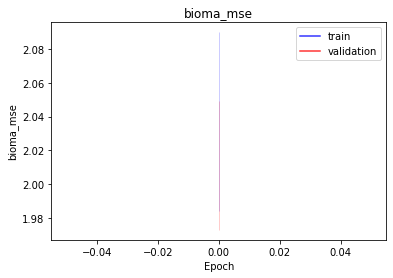

<b>bioma_mae</b>: 1.1268 (min: 1.0947, max: 1.1590)

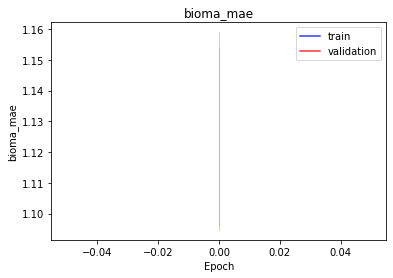

<b>bioma_mape</b>: nan (min: nan, max: nan)

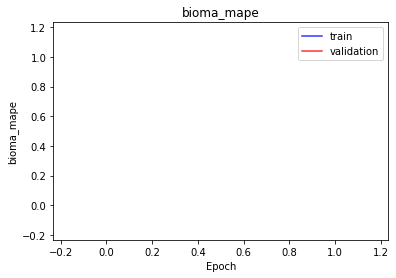

<b>domain_mse</b>: 2.0531 (min: 2.0013, max: 2.1049)

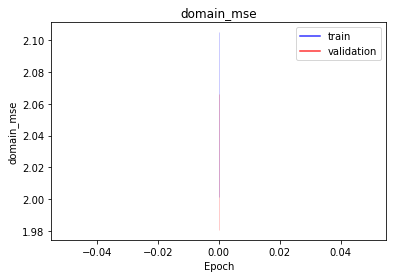

<b>domain_mae</b>: 1.1352 (min: 1.1070, max: 1.1635)

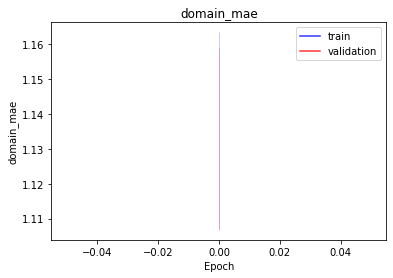

<b>domain_mape</b>: nan (min: nan, max: nan)

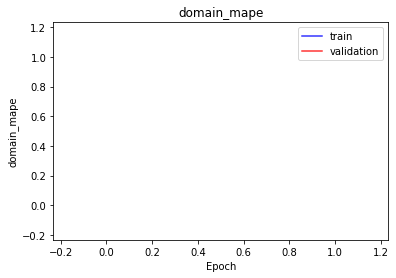

<b>latent_mae</b>: 0.9118 (min: 0.8672, max: 0.9564)

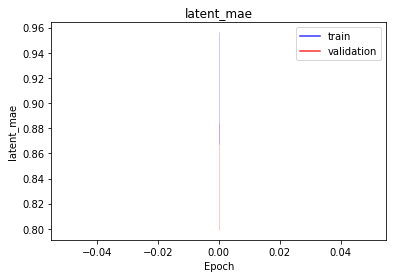

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978471.5938 (min: 788955.5625, max: 1167987.6250)

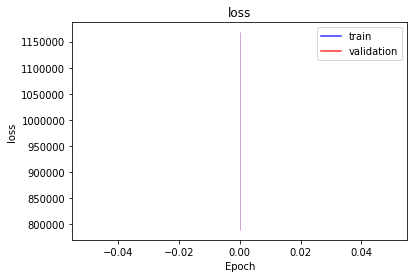

<b>bioma_loss</b>: 489236.3750 (min: 394478.2500, max: 583994.5000)

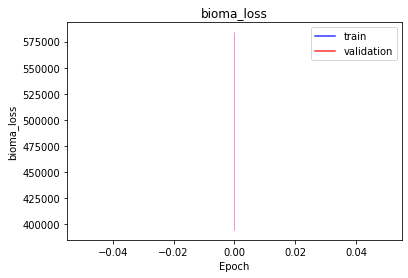

<b>domain_loss</b>: 489234.7812 (min: 394476.8750, max: 583992.6875)

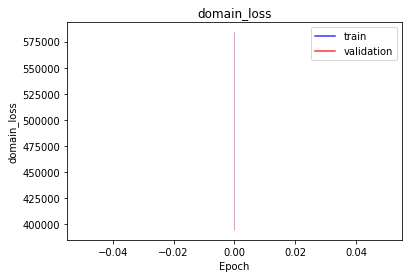

<b>latent_loss</b>: 0.3833 (min: 0.3588, max: 0.4079)

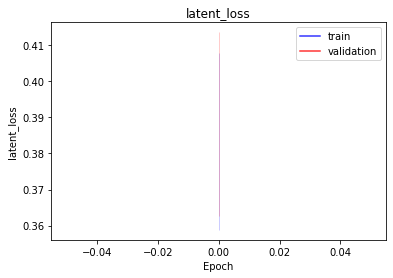

<b>bioma_mse</b>: 2.0264 (min: 1.9812, max: 2.0716)

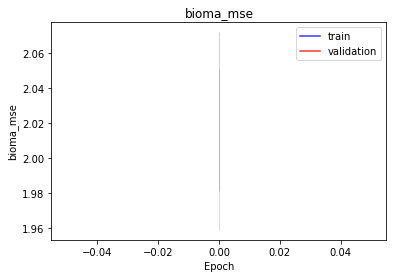

<b>bioma_mae</b>: 1.1273 (min: 1.0993, max: 1.1552)

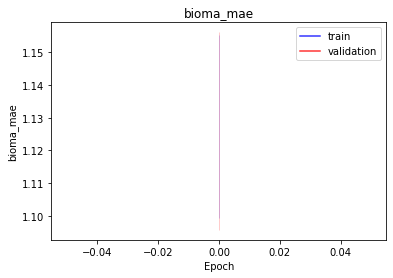

<b>bioma_mape</b>: nan (min: nan, max: nan)

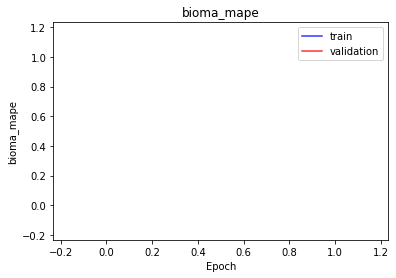

<b>domain_mse</b>: 2.0402 (min: 1.9960, max: 2.0845)

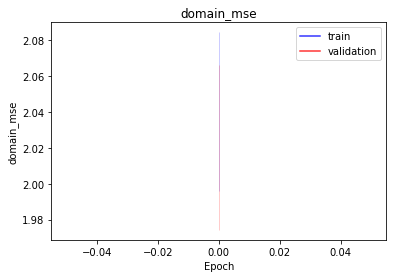

<b>domain_mae</b>: 1.1327 (min: 1.1061, max: 1.1593)

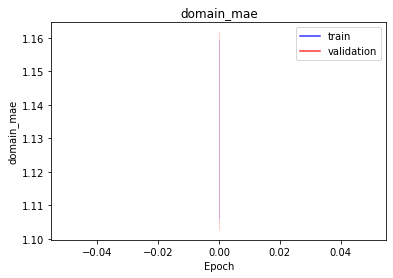

<b>domain_mape</b>: nan (min: nan, max: nan)

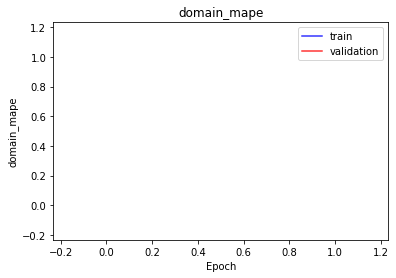

<b>latent_mae</b>: 0.3833 (min: 0.3588, max: 0.4079)

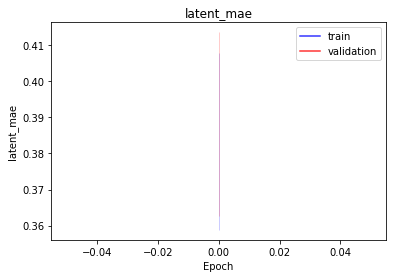

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978457.1250 (min: 788908.5000, max: 1168005.7500)

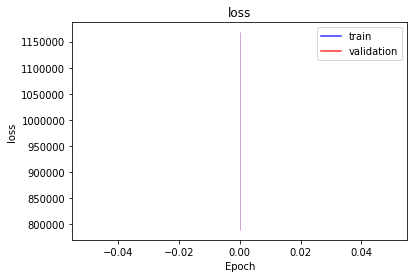

<b>bioma_loss</b>: 489228.2812 (min: 394454.0000, max: 584002.5625)

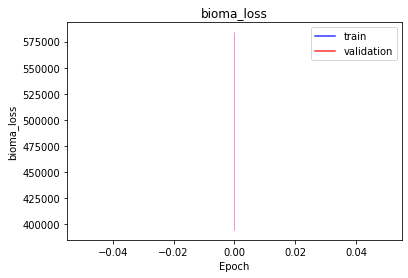

<b>domain_loss</b>: 489228.3750 (min: 394454.0000, max: 584002.7500)

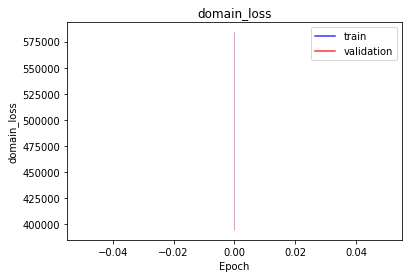

<b>latent_loss</b>: 0.4872 (min: 0.4803, max: 0.4941)

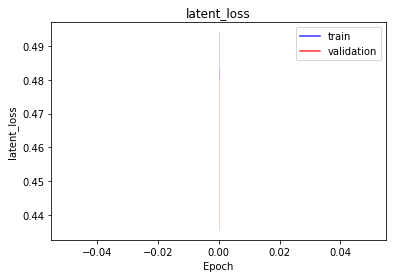

<b>bioma_mse</b>: 2.2554 (min: 2.2444, max: 2.2664)

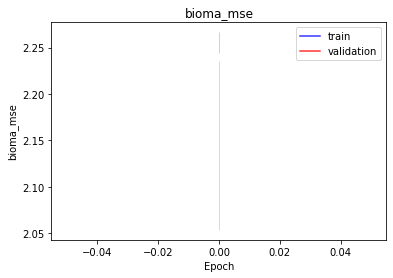

<b>bioma_mae</b>: 1.1901 (min: 1.1769, max: 1.2033)

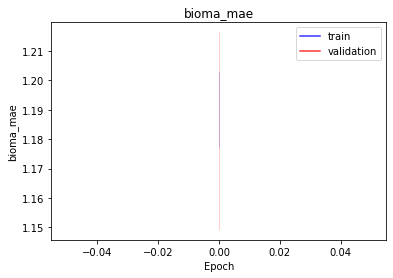

<b>bioma_mape</b>: nan (min: nan, max: nan)

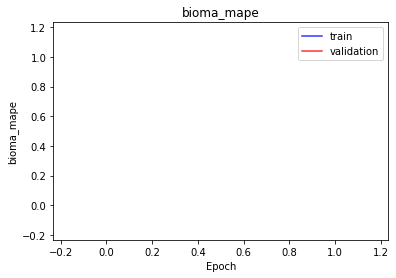

<b>domain_mse</b>: 2.2550 (min: 2.2439, max: 2.2662)

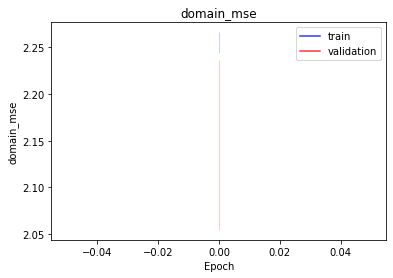

<b>domain_mae</b>: 1.1899 (min: 1.1766, max: 1.2032)

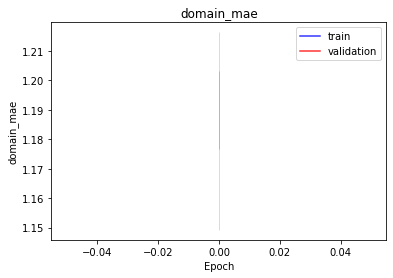

<b>domain_mape</b>: nan (min: nan, max: nan)

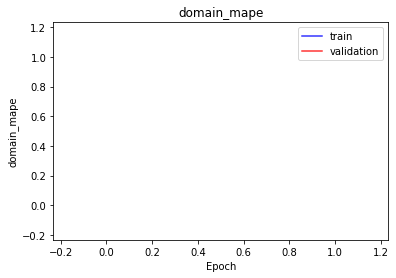

<b>latent_mae</b>: 0.4872 (min: 0.4803, max: 0.4941)

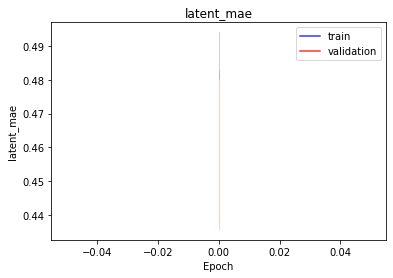

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978485.8438 (min: 788980.0625, max: 1167991.6250)

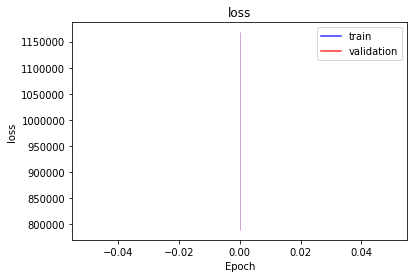

<b>bioma_loss</b>: 489242.8125 (min: 394489.9062, max: 583995.7500)

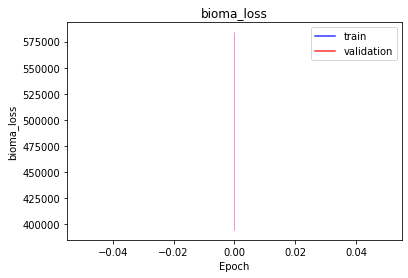

<b>domain_loss</b>: 489242.8750 (min: 394490.0000, max: 583995.7500)

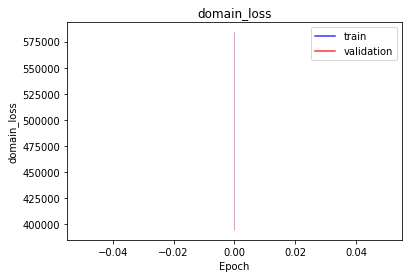

<b>latent_loss</b>: 0.1466 (min: 0.1349, max: 0.1582)

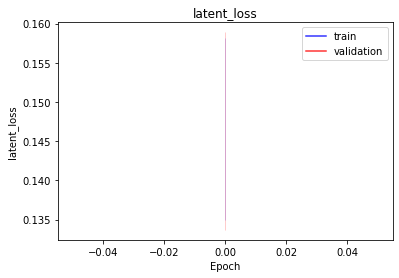

<b>bioma_mse</b>: 2.2101 (min: 2.1445, max: 2.2757)

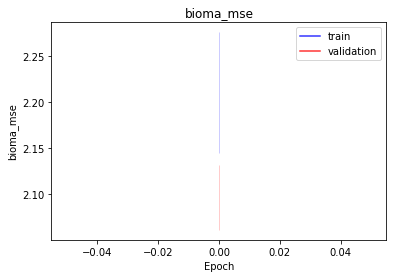

<b>bioma_mae</b>: 1.1703 (min: 1.1454, max: 1.1952)

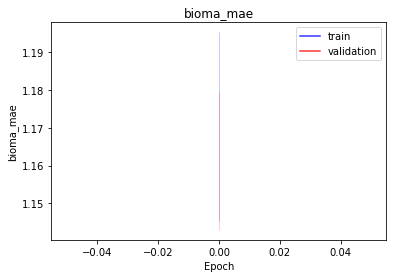

<b>bioma_mape</b>: nan (min: nan, max: nan)

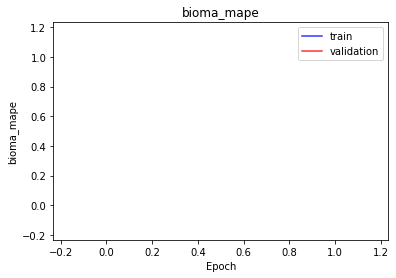

<b>domain_mse</b>: 2.2104 (min: 2.1448, max: 2.2759)

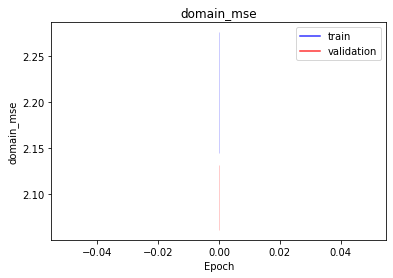

<b>domain_mae</b>: 1.1704 (min: 1.1454, max: 1.1953)

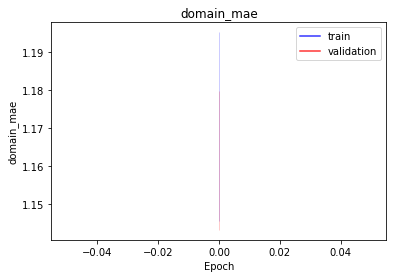

<b>domain_mape</b>: nan (min: nan, max: nan)

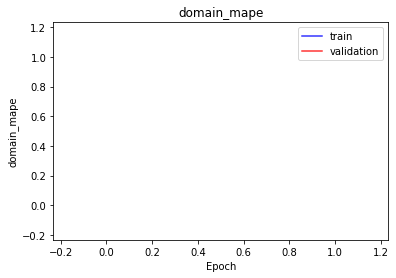

<b>latent_mae</b>: 0.1466 (min: 0.1349, max: 0.1582)

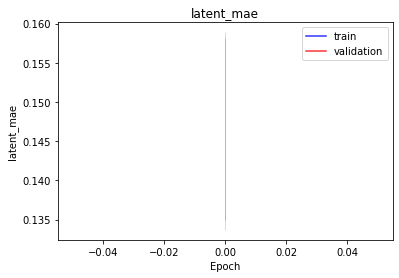

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978479.7812 (min: 788975.4375, max: 1167984.1250)

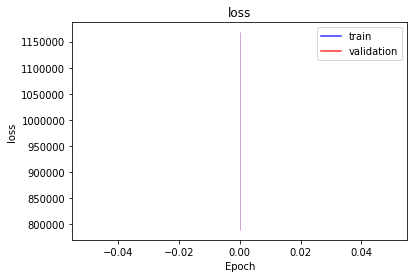

<b>bioma_loss</b>: 489242.1250 (min: 394490.7500, max: 583993.5000)

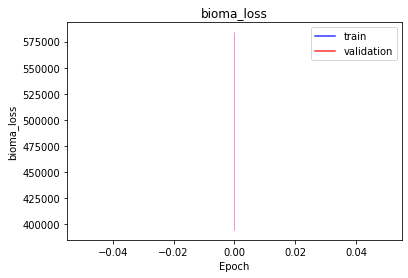

<b>domain_loss</b>: 489236.9688 (min: 394484.0000, max: 583989.9375)

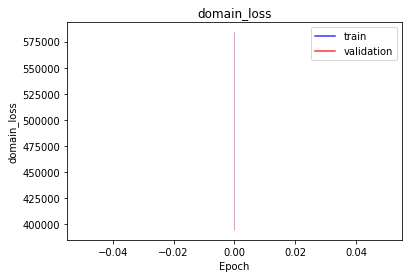

<b>latent_loss</b>: 0.6372 (min: 0.5812, max: 0.6933)

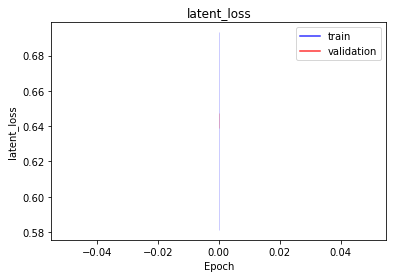

<b>bioma_mse</b>: 2.0776 (min: 2.0221, max: 2.1330)

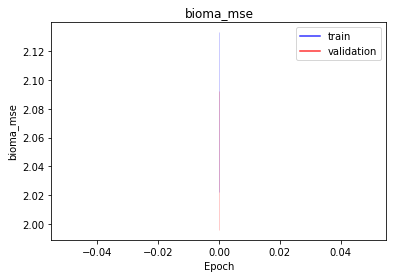

<b>bioma_mae</b>: 1.1333 (min: 1.1043, max: 1.1624)

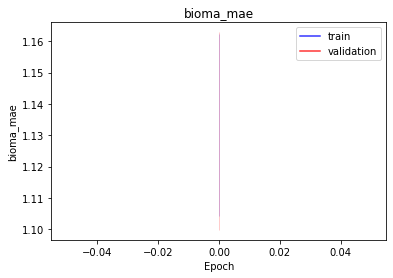

<b>bioma_mape</b>: nan (min: nan, max: nan)

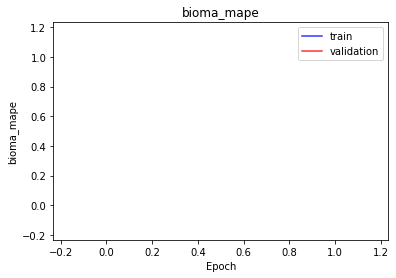

<b>domain_mse</b>: 2.0479 (min: 2.0167, max: 2.0792)

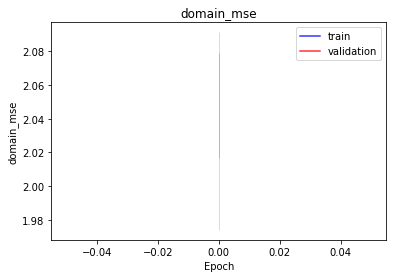

<b>domain_mae</b>: 1.1320 (min: 1.1111, max: 1.1529)

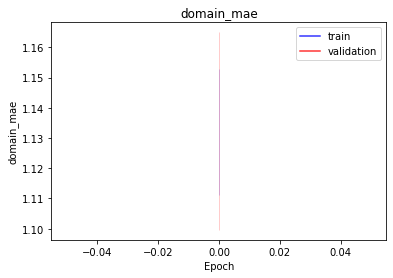

<b>domain_mape</b>: nan (min: nan, max: nan)

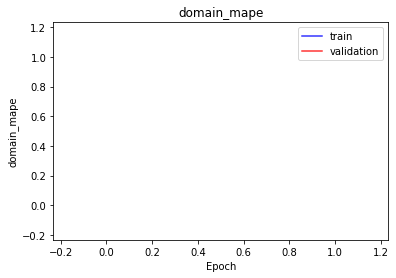

<b>latent_mae</b>: 0.6372 (min: 0.5812, max: 0.6933)

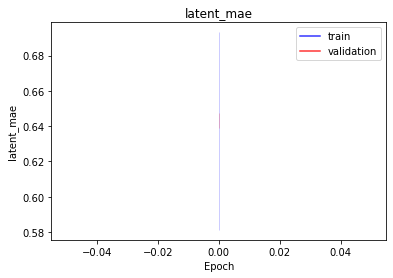

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978469.1250 (min: 788948.0000, max: 1167990.2500)

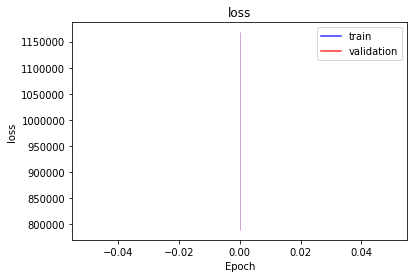

<b>bioma_loss</b>: 489235.8125 (min: 394476.9062, max: 583994.7500)

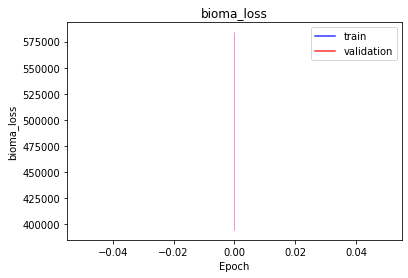

<b>domain_loss</b>: 489233.0312 (min: 394470.8750, max: 583995.1875)

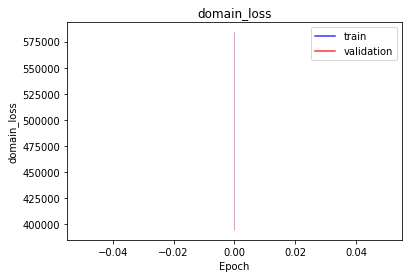

<b>latent_loss</b>: 0.2175 (min: 0.2062, max: 0.2288)

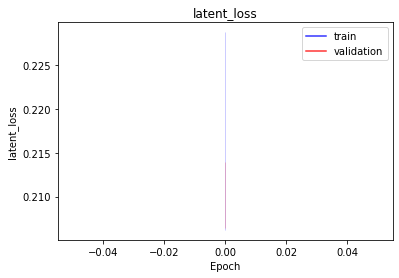

<b>bioma_mse</b>: 2.0377 (min: 1.9890, max: 2.0864)

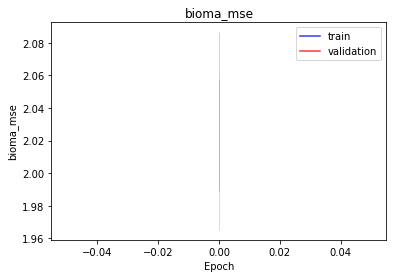

<b>bioma_mae</b>: 1.1307 (min: 1.1018, max: 1.1595)

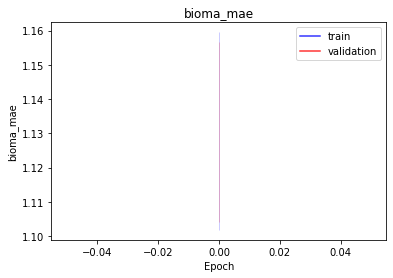

<b>bioma_mape</b>: nan (min: nan, max: nan)

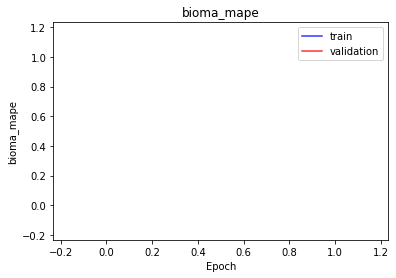

<b>domain_mse</b>: 2.0343 (min: 1.9802, max: 2.0884)

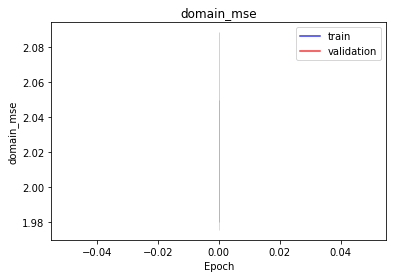

<b>domain_mae</b>: 1.1309 (min: 1.1001, max: 1.1618)

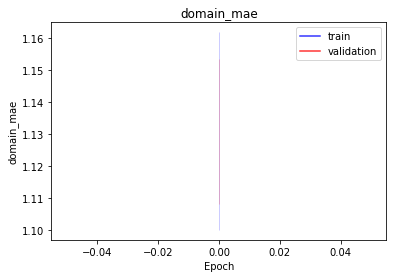

<b>domain_mape</b>: nan (min: nan, max: nan)

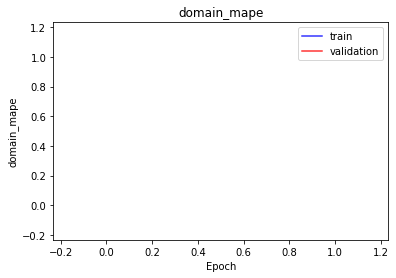

<b>latent_mae</b>: 0.2175 (min: 0.2062, max: 0.2288)

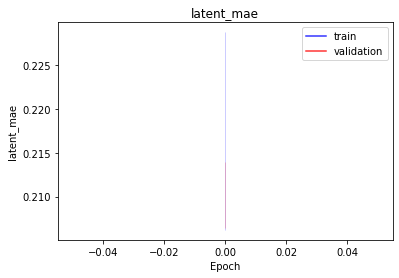

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978483.4375 (min: 788970.1250, max: 1167996.7500)

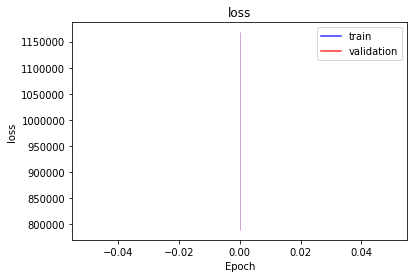

<b>bioma_loss</b>: 489239.5625 (min: 394486.0938, max: 583993.0625)

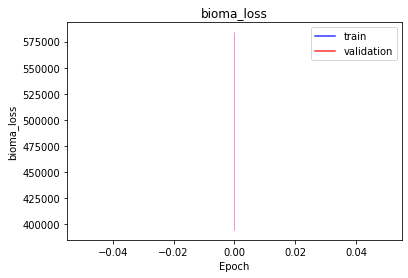

<b>domain_loss</b>: 489242.9375 (min: 394483.0938, max: 584002.8125)

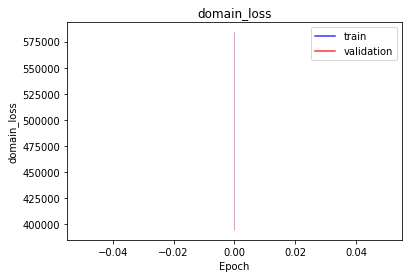

<b>latent_loss</b>: 0.9453 (min: 0.9325, max: 0.9581)

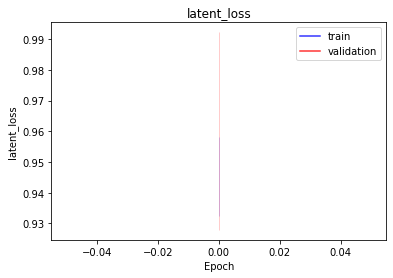

<b>bioma_mse</b>: 2.0603 (min: 2.0114, max: 2.1092)

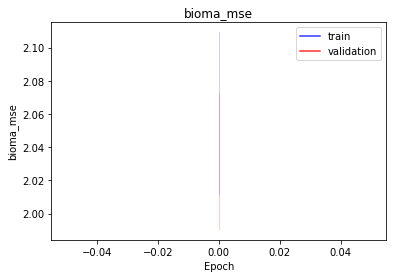

<b>bioma_mae</b>: 1.1323 (min: 1.1015, max: 1.1631)

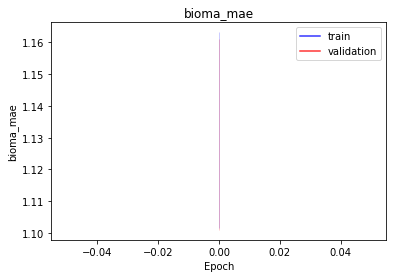

<b>bioma_mape</b>: nan (min: nan, max: nan)

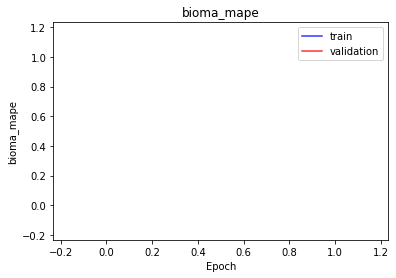

<b>domain_mse</b>: 2.1079 (min: 2.0581, max: 2.1578)

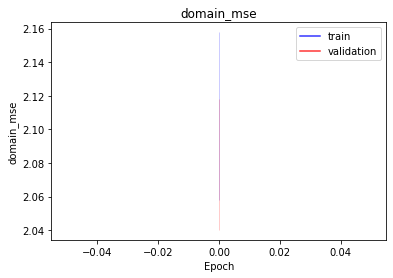

<b>domain_mae</b>: 1.1570 (min: 1.1317, max: 1.1822)

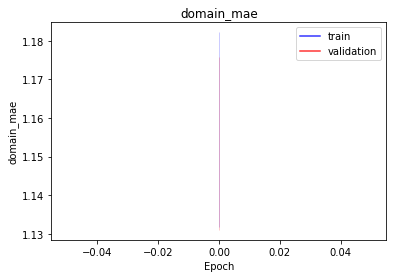

<b>domain_mape</b>: nan (min: nan, max: nan)

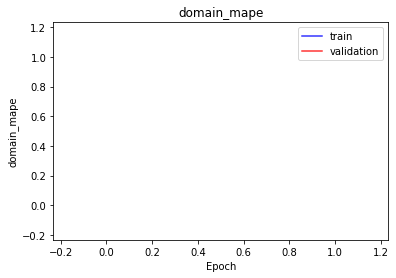

<b>latent_mae</b>: 0.9453 (min: 0.9325, max: 0.9581)

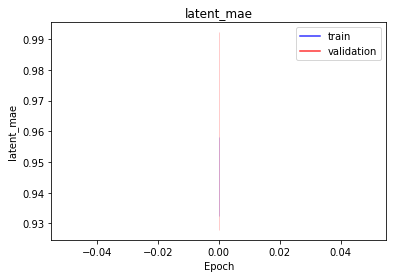

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978474.3750 (min: 788944.6250, max: 1168004.1250)

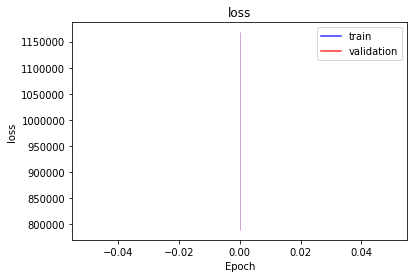

<b>bioma_loss</b>: 489235.6875 (min: 394471.3750, max: 584000.0000)

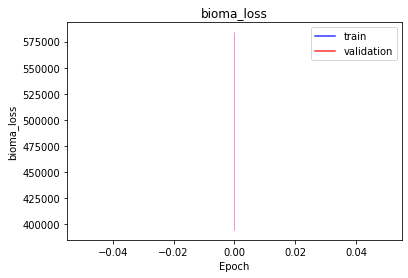

<b>domain_loss</b>: 489238.2500 (min: 394472.8125, max: 584003.6875)

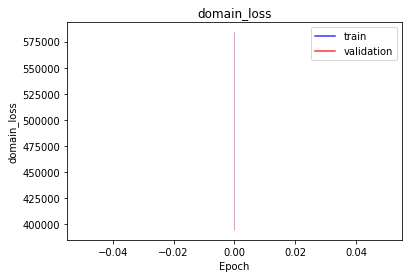

<b>latent_loss</b>: 0.4219 (min: 0.4032, max: 0.4405)

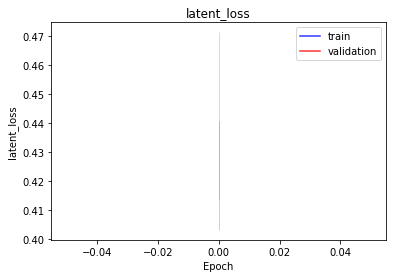

<b>bioma_mse</b>: 2.0338 (min: 1.9849, max: 2.0826)

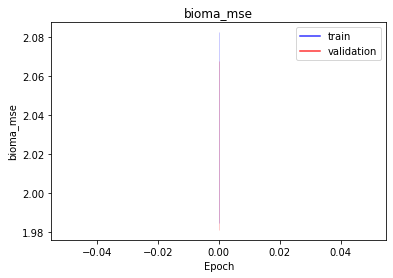

<b>bioma_mae</b>: 1.1284 (min: 1.0982, max: 1.1587)

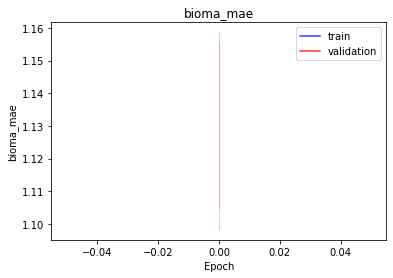

<b>bioma_mape</b>: nan (min: nan, max: nan)

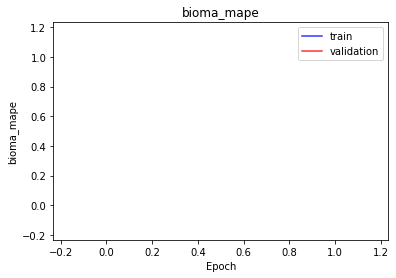

<b>domain_mse</b>: 2.0582 (min: 2.0279, max: 2.0885)

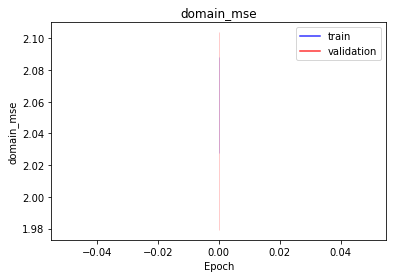

<b>domain_mae</b>: 1.1365 (min: 1.1129, max: 1.1601)

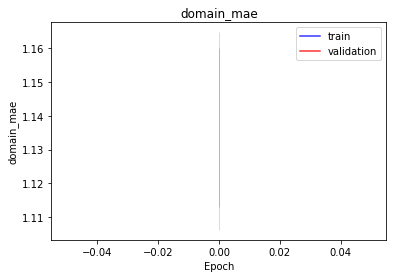

<b>domain_mape</b>: nan (min: nan, max: nan)

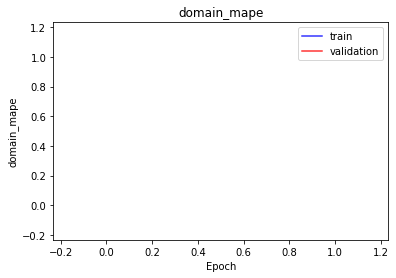

<b>latent_mae</b>: 0.4219 (min: 0.4032, max: 0.4405)

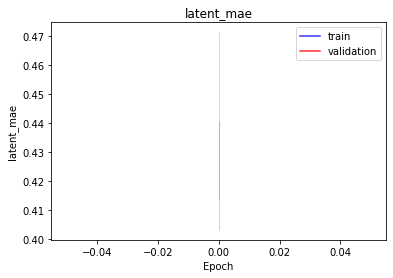

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978469.4375 (min: 788956.7500, max: 1167982.1250)

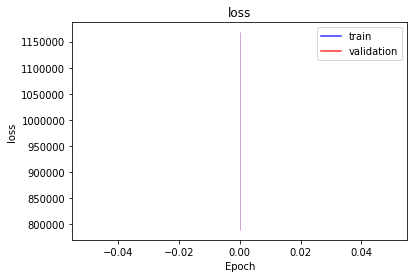

<b>bioma_loss</b>: 489233.2812 (min: 394476.5625, max: 583990.0000)

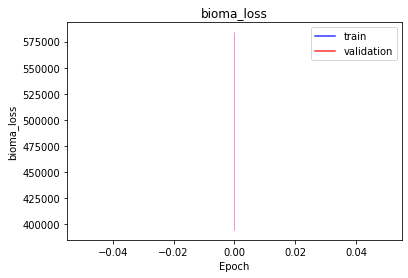

<b>domain_loss</b>: 489235.5000 (min: 394479.5312, max: 583991.4375)

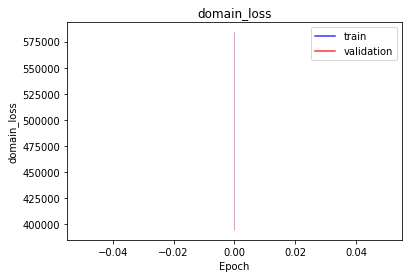

<b>latent_loss</b>: 0.6086 (min: 0.5958, max: 0.6215)

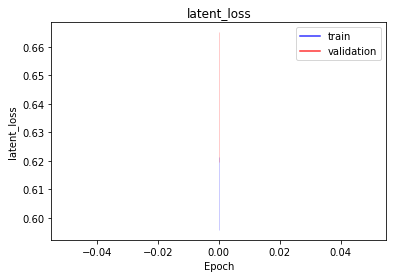

<b>bioma_mse</b>: 2.1351 (min: 2.0930, max: 2.1771)

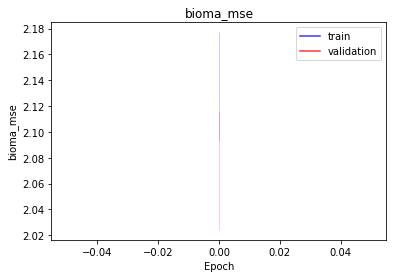

<b>bioma_mae</b>: 1.1607 (min: 1.1377, max: 1.1838)

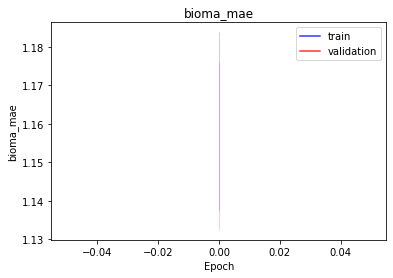

<b>bioma_mape</b>: nan (min: nan, max: nan)

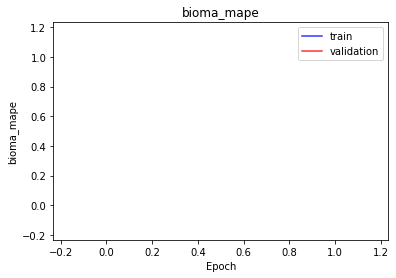

<b>domain_mse</b>: 2.1371 (min: 2.0938, max: 2.1803)

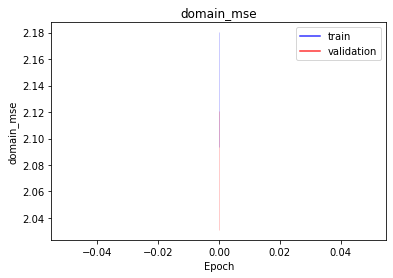

<b>domain_mae</b>: 1.1607 (min: 1.1381, max: 1.1833)

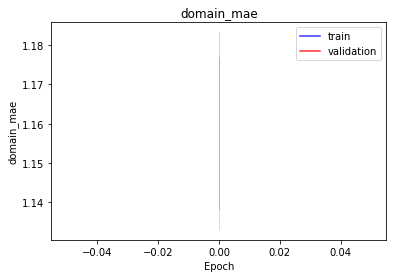

<b>domain_mape</b>: nan (min: nan, max: nan)

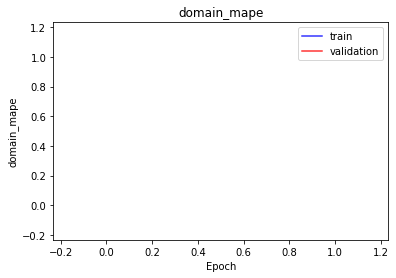

<b>latent_mae</b>: 0.6086 (min: 0.5958, max: 0.6215)

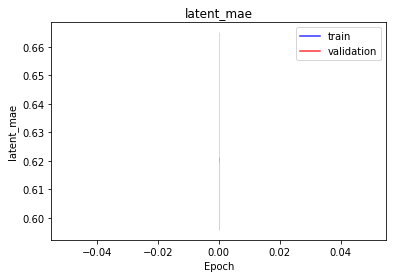

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978467.8438 (min: 788925.0625, max: 1168010.6250)

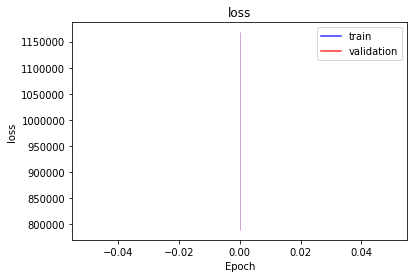

<b>bioma_loss</b>: 489233.8750 (min: 394462.1250, max: 584005.6250)

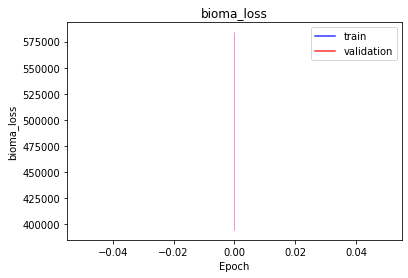

<b>domain_loss</b>: 489233.8438 (min: 394462.7500, max: 584004.9375)

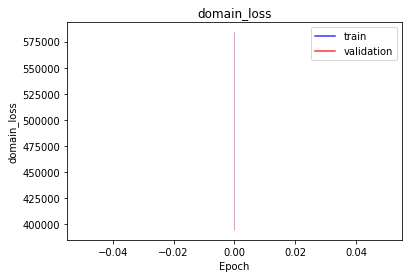

<b>latent_loss</b>: 0.1847 (min: 0.1829, max: 0.1864)

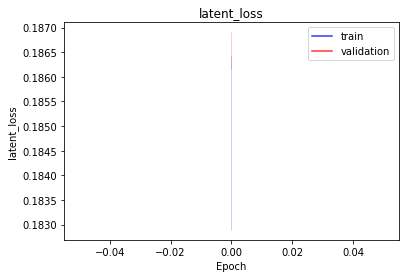

<b>bioma_mse</b>: 2.1535 (min: 2.1389, max: 2.1681)

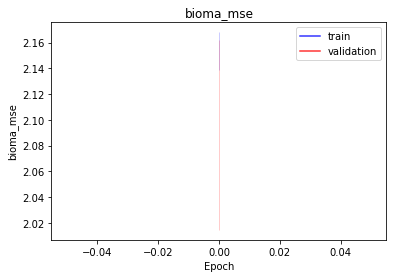

<b>bioma_mae</b>: 1.1658 (min: 1.1503, max: 1.1813)

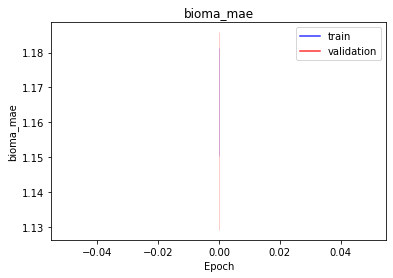

<b>bioma_mape</b>: nan (min: nan, max: nan)

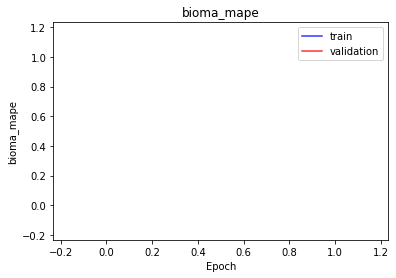

<b>domain_mse</b>: 2.1574 (min: 2.1446, max: 2.1702)

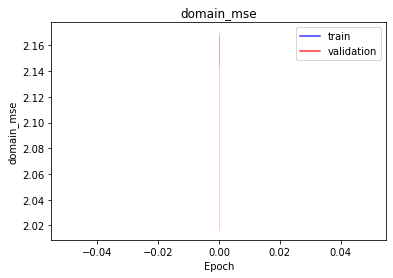

<b>domain_mae</b>: 1.1669 (min: 1.1519, max: 1.1818)

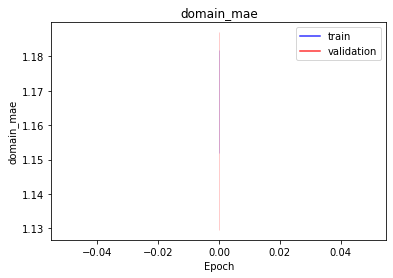

<b>domain_mape</b>: nan (min: nan, max: nan)

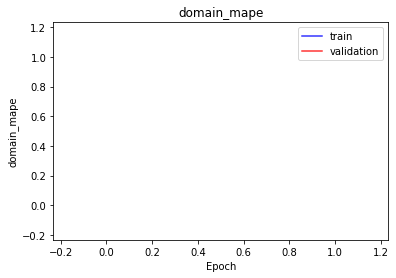

<b>latent_mae</b>: 0.1847 (min: 0.1829, max: 0.1864)

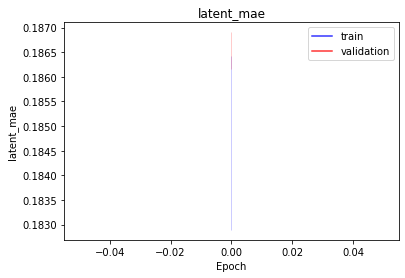

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978461.5938 (min: 788945.9375, max: 1167977.2500)

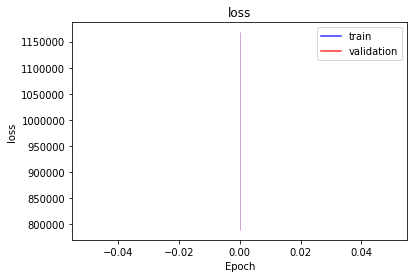

<b>bioma_loss</b>: 489235.7500 (min: 394475.7500, max: 583995.7500)

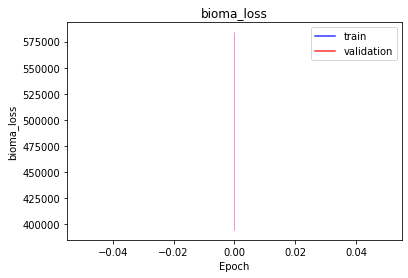

<b>domain_loss</b>: 489224.7500 (min: 394469.1250, max: 583980.3750)

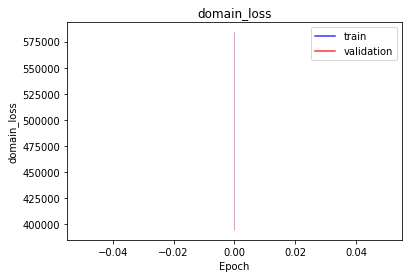

<b>latent_loss</b>: 1.0627 (min: 1.0422, max: 1.0831)

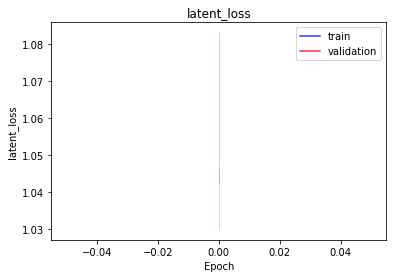

<b>bioma_mse</b>: 2.0859 (min: 2.0463, max: 2.1255)

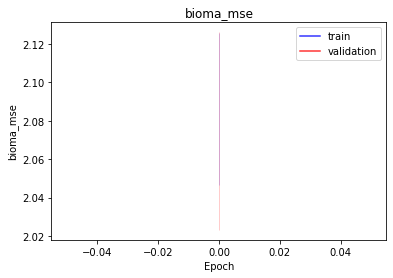

<b>bioma_mae</b>: 1.1358 (min: 1.1125, max: 1.1591)

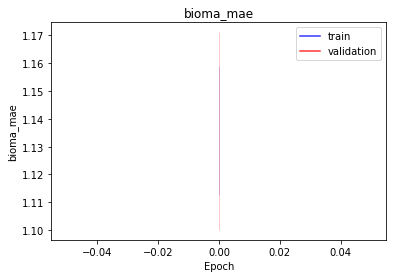

<b>bioma_mape</b>: nan (min: nan, max: nan)

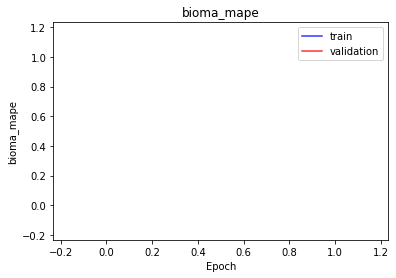

<b>domain_mse</b>: 2.1184 (min: 2.0905, max: 2.1462)

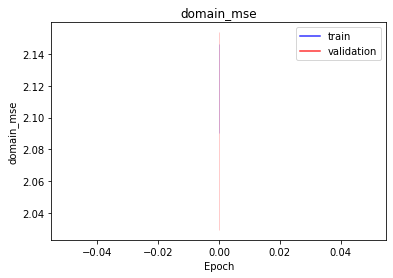

<b>domain_mae</b>: 1.1522 (min: 1.1337, max: 1.1706)

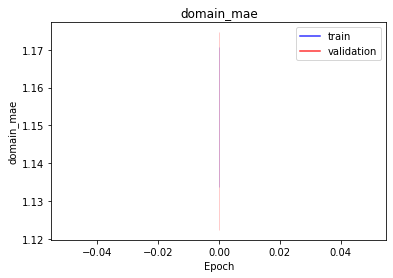

<b>domain_mape</b>: nan (min: nan, max: nan)

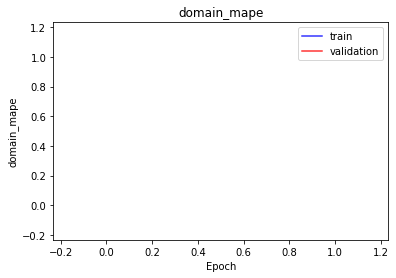

<b>latent_mae</b>: 1.0627 (min: 1.0422, max: 1.0831)

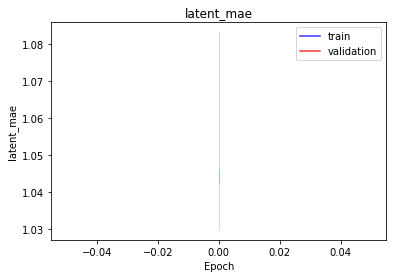

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.5938 (min: 788964.8125, max: 1167998.3750)

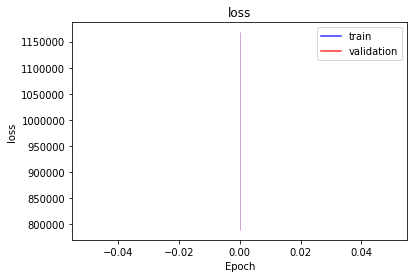

<b>bioma_loss</b>: 489240.8750 (min: 394480.9062, max: 584000.8125)

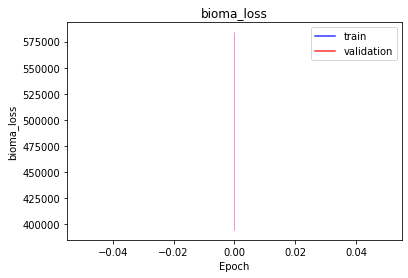

<b>domain_loss</b>: 489240.2500 (min: 394483.4062, max: 583997.0625)

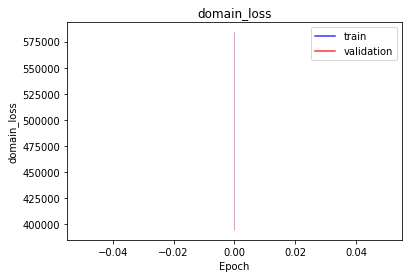

<b>latent_loss</b>: 0.4748 (min: 0.4567, max: 0.4930)

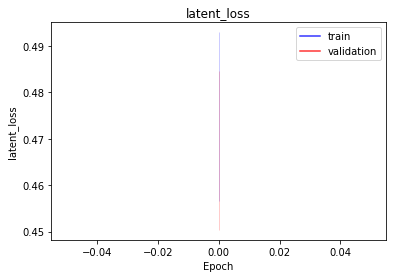

<b>bioma_mse</b>: 2.0617 (min: 2.0269, max: 2.0966)

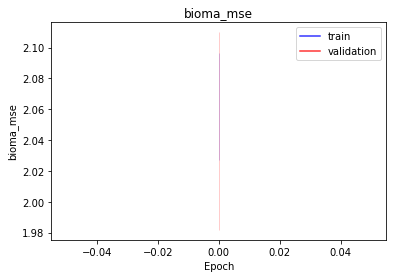

<b>bioma_mae</b>: 1.1358 (min: 1.1121, max: 1.1594)

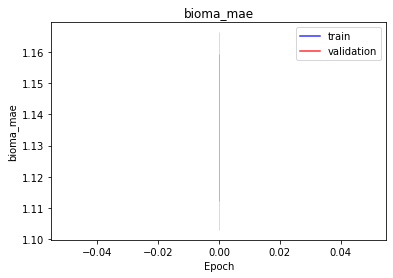

<b>bioma_mape</b>: nan (min: nan, max: nan)

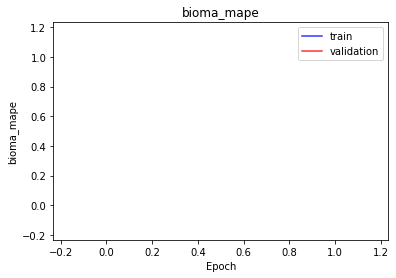

<b>domain_mse</b>: 2.0672 (min: 2.0190, max: 2.1154)

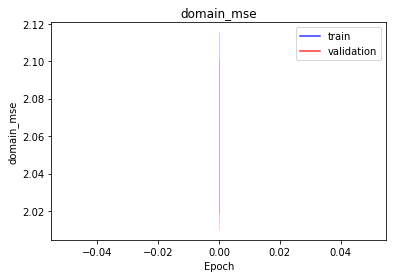

<b>domain_mae</b>: 1.1404 (min: 1.1154, max: 1.1654)

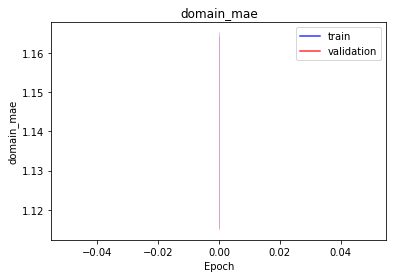

<b>domain_mape</b>: nan (min: nan, max: nan)

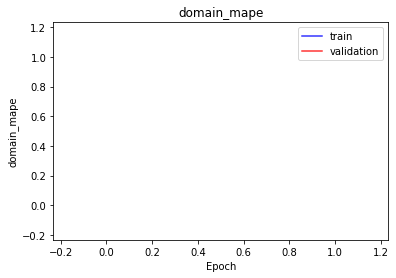

<b>latent_mae</b>: 0.4748 (min: 0.4567, max: 0.4930)

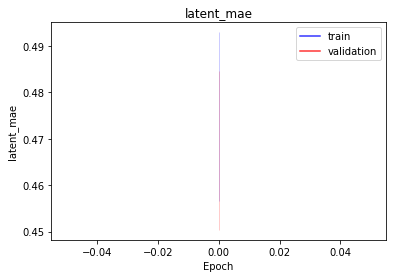

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978467.5312 (min: 788958.1875, max: 1167976.8750)

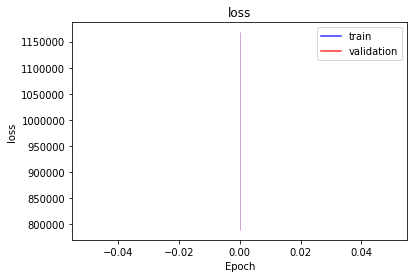

<b>bioma_loss</b>: 489229.1250 (min: 394466.7188, max: 583991.5000)

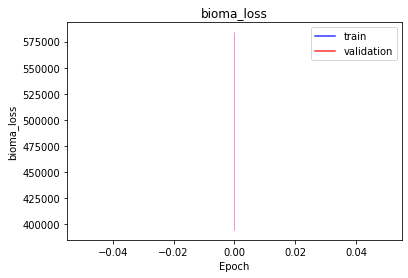

<b>domain_loss</b>: 489237.4375 (min: 394490.4062, max: 583984.5000)

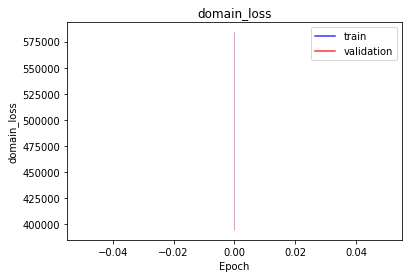

<b>latent_loss</b>: 0.9730 (min: 0.9004, max: 1.0456)

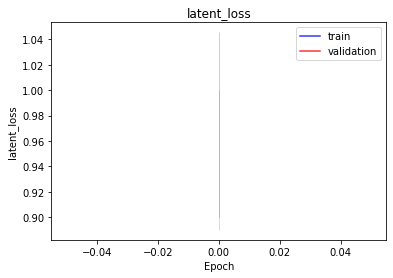

<b>bioma_mse</b>: 2.0783 (min: 2.0470, max: 2.1095)

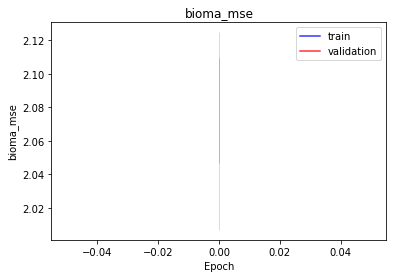

<b>bioma_mae</b>: 1.1333 (min: 1.1063, max: 1.1603)

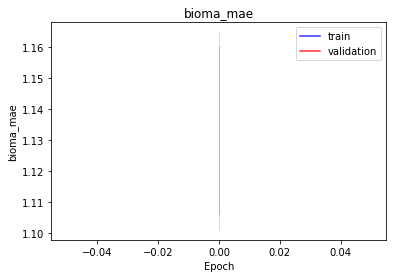

<b>bioma_mape</b>: nan (min: nan, max: nan)

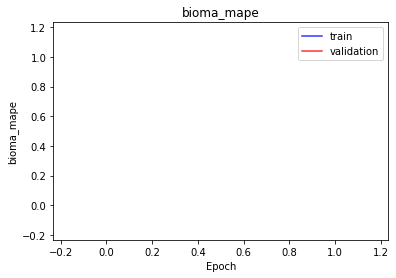

<b>domain_mse</b>: 2.1733 (min: 2.0789, max: 2.2676)

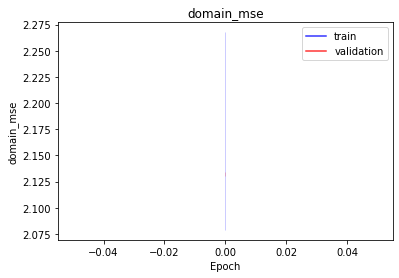

<b>domain_mae</b>: 1.1681 (min: 1.1380, max: 1.1981)

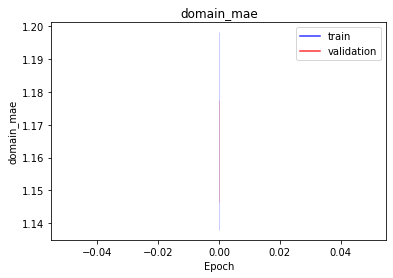

<b>domain_mape</b>: nan (min: nan, max: nan)

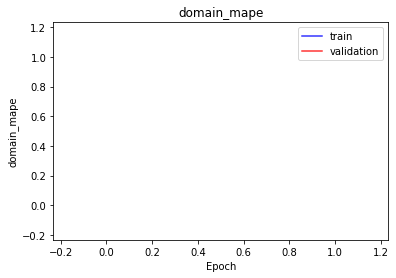

<b>latent_mae</b>: 0.9730 (min: 0.9004, max: 1.0456)

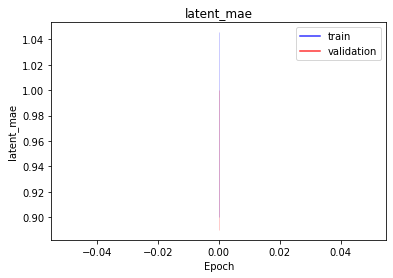

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978475.2500 (min: 788949.5000, max: 1168001.0000)

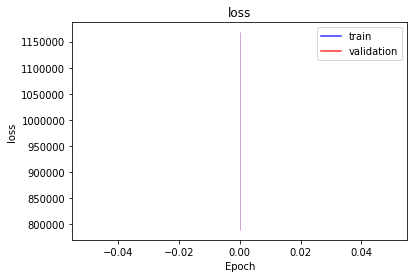

<b>bioma_loss</b>: 489236.2500 (min: 394474.0000, max: 583998.5000)

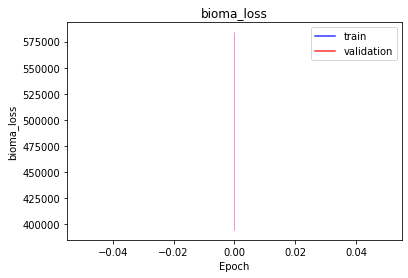

<b>domain_loss</b>: 489238.5000 (min: 394474.9688, max: 584002.0625)

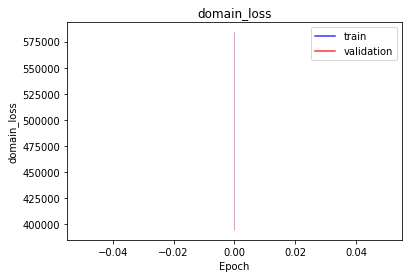

<b>latent_loss</b>: 0.4728 (min: 0.4706, max: 0.4750)

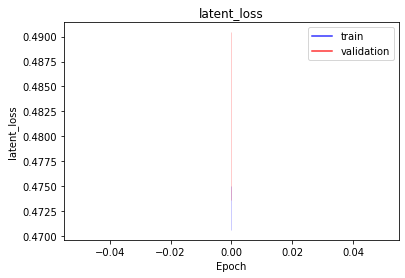

<b>bioma_mse</b>: 2.0671 (min: 2.0300, max: 2.1042)

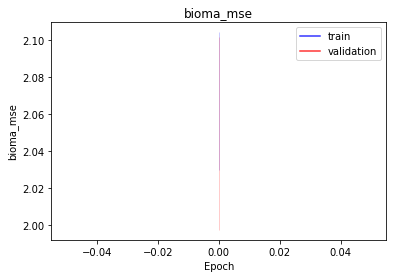

<b>bioma_mae</b>: 1.1407 (min: 1.1136, max: 1.1678)

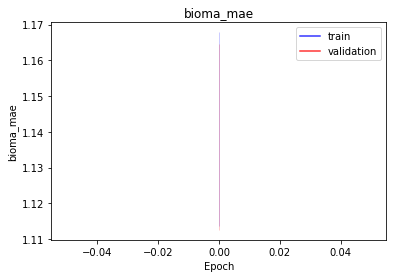

<b>bioma_mape</b>: nan (min: nan, max: nan)

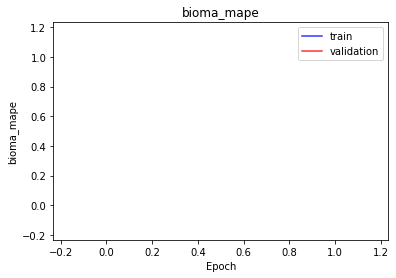

<b>domain_mse</b>: 2.0701 (min: 2.0189, max: 2.1214)

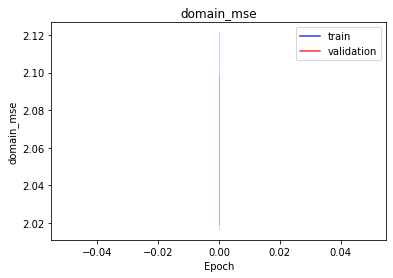

<b>domain_mae</b>: 1.1432 (min: 1.1144, max: 1.1720)

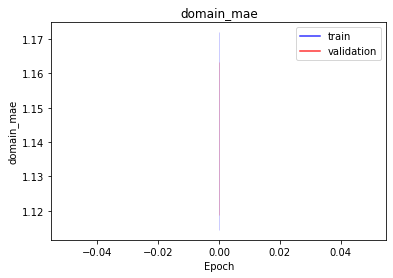

<b>domain_mape</b>: nan (min: nan, max: nan)

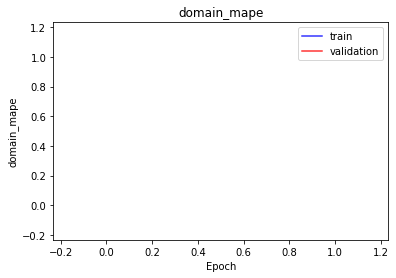

<b>latent_mae</b>: 0.4728 (min: 0.4706, max: 0.4750)

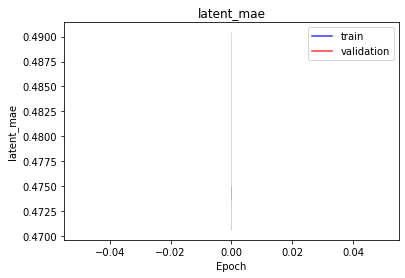

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.2812 (min: 788962.3125, max: 1168000.2500)

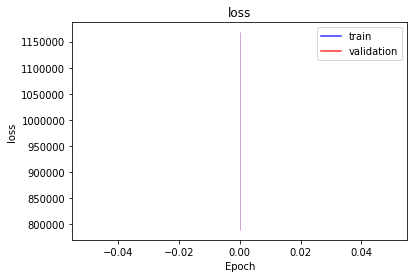

<b>bioma_loss</b>: 489235.1875 (min: 394475.3125, max: 583995.0625)

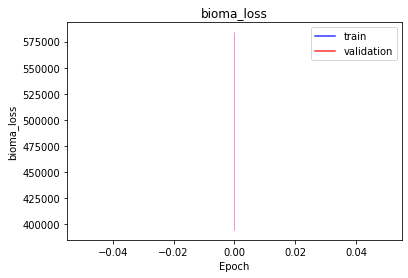

<b>domain_loss</b>: 489245.1250 (min: 394486.0000, max: 584004.2500)

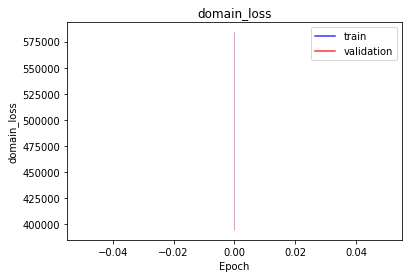

<b>latent_loss</b>: 1.0127 (min: 0.9787, max: 1.0466)

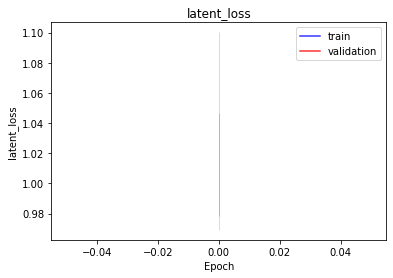

<b>bioma_mse</b>: 2.0574 (min: 2.0154, max: 2.0995)

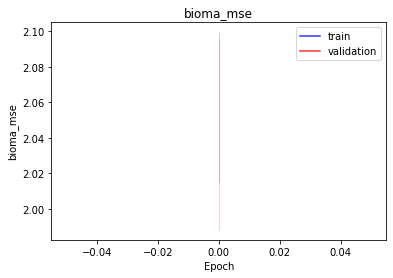

<b>bioma_mae</b>: 1.1267 (min: 1.0996, max: 1.1538)

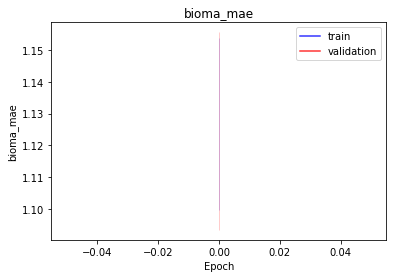

<b>bioma_mape</b>: nan (min: nan, max: nan)

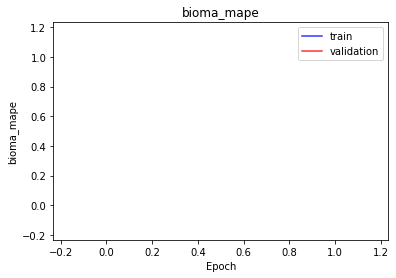

<b>domain_mse</b>: 2.1569 (min: 2.1239, max: 2.1898)

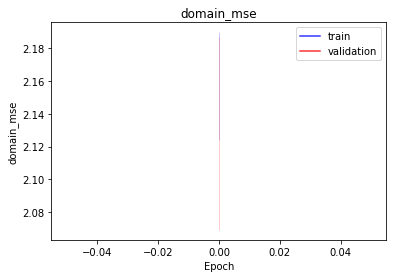

<b>domain_mae</b>: 1.1662 (min: 1.1471, max: 1.1853)

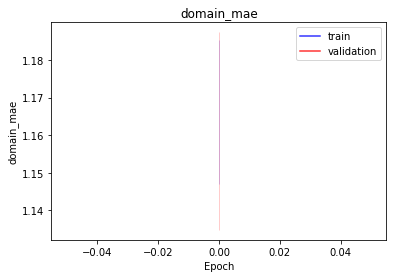

<b>domain_mape</b>: nan (min: nan, max: nan)

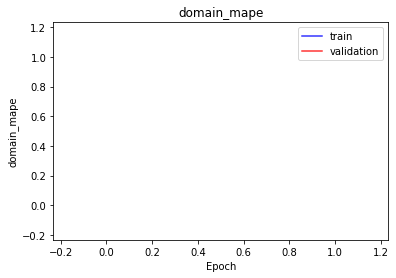

<b>latent_mae</b>: 1.0127 (min: 0.9787, max: 1.0466)

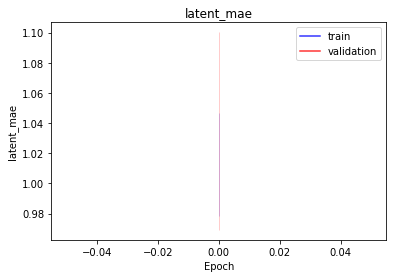

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.0312 (min: 788954.3125, max: 1168007.7500)

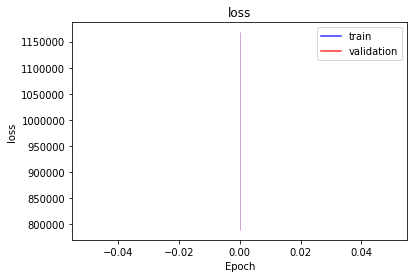

<b>bioma_loss</b>: 489240.0625 (min: 394478.6250, max: 584001.5000)

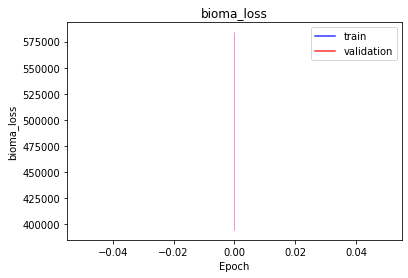

<b>domain_loss</b>: 489240.5312 (min: 394475.1875, max: 584005.8750)

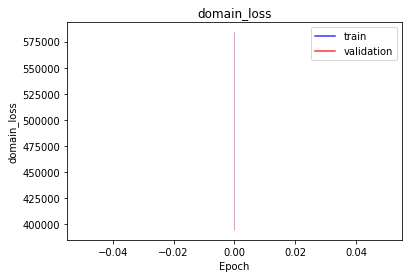

<b>latent_loss</b>: 0.4555 (min: 0.4324, max: 0.4786)

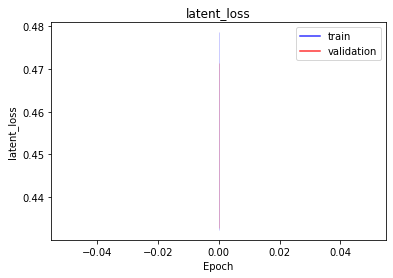

<b>bioma_mse</b>: 2.0723 (min: 2.0259, max: 2.1186)

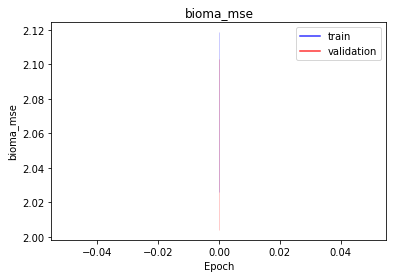

<b>bioma_mae</b>: 1.1400 (min: 1.1129, max: 1.1672)

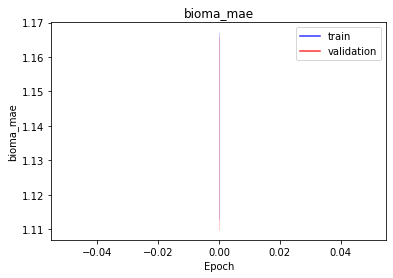

<b>bioma_mape</b>: nan (min: nan, max: nan)

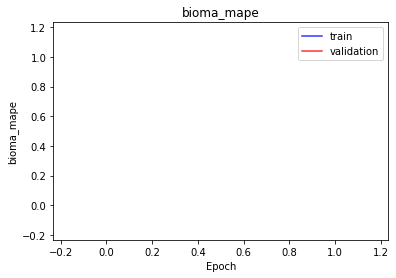

<b>domain_mse</b>: 2.0731 (min: 2.0574, max: 2.0889)

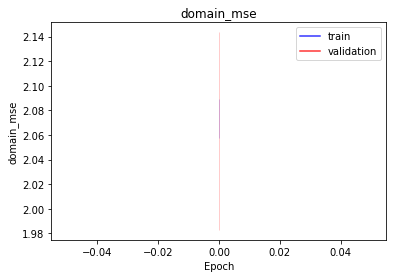

<b>domain_mae</b>: 1.1413 (min: 1.1226, max: 1.1599)

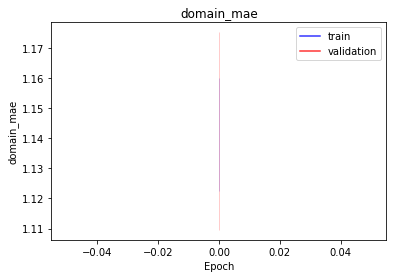

<b>domain_mape</b>: nan (min: nan, max: nan)

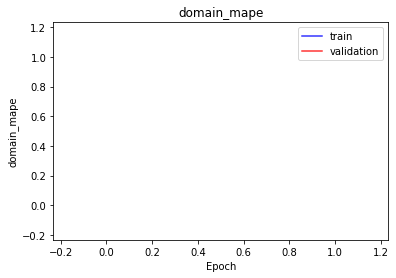

<b>latent_mae</b>: 0.4555 (min: 0.4324, max: 0.4786)

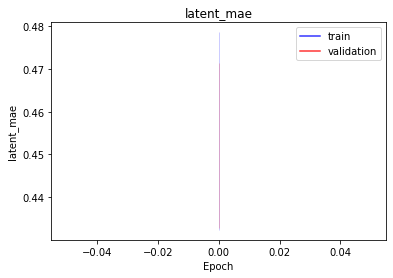

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978469.8125 (min: 788950.2500, max: 1167989.3750)

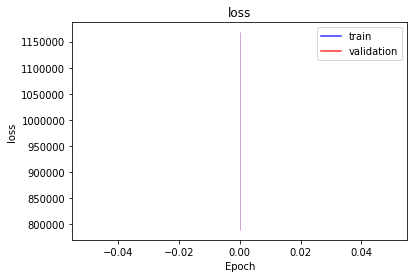

<b>bioma_loss</b>: 489235.3750 (min: 394475.0938, max: 583995.6250)

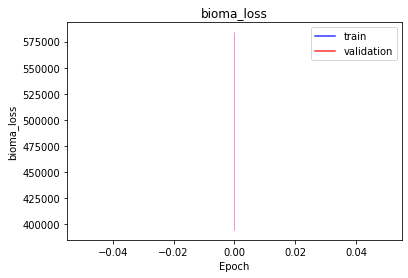

<b>domain_loss</b>: 489233.9688 (min: 394474.6875, max: 583993.2500)

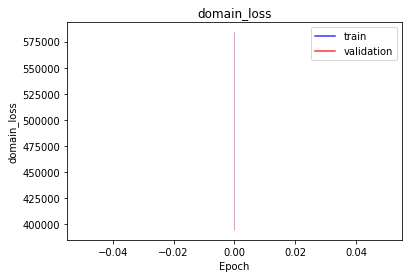

<b>latent_loss</b>: 0.5165 (min: 0.5063, max: 0.5267)

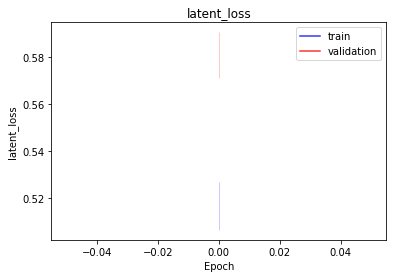

<b>bioma_mse</b>: 2.0654 (min: 2.0262, max: 2.1047)

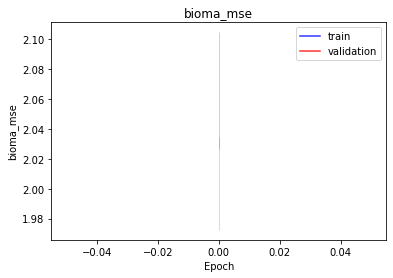

<b>bioma_mae</b>: 1.1300 (min: 1.1029, max: 1.1572)

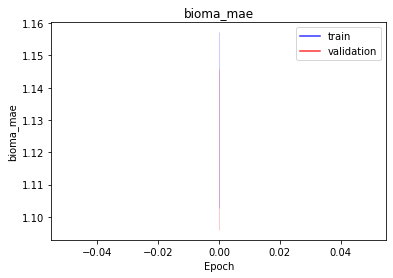

<b>bioma_mape</b>: nan (min: nan, max: nan)

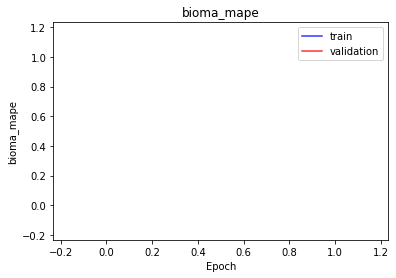

<b>domain_mse</b>: 2.0456 (min: 1.9909, max: 2.1003)

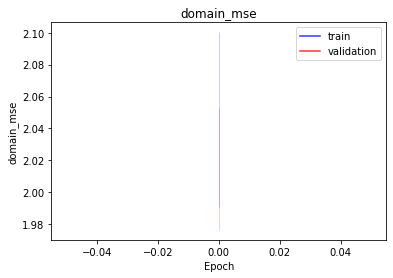

<b>domain_mae</b>: 1.1349 (min: 1.1035, max: 1.1662)

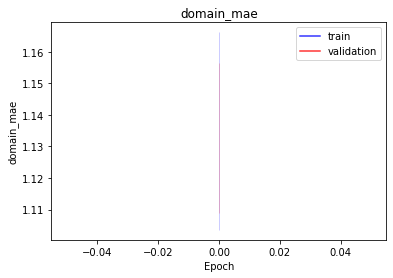

<b>domain_mape</b>: nan (min: nan, max: nan)

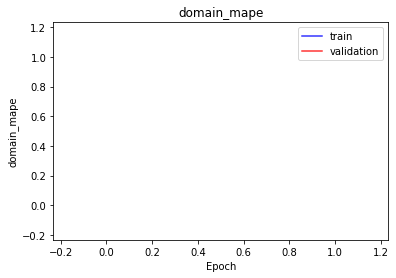

<b>latent_mae</b>: 0.5165 (min: 0.5063, max: 0.5267)

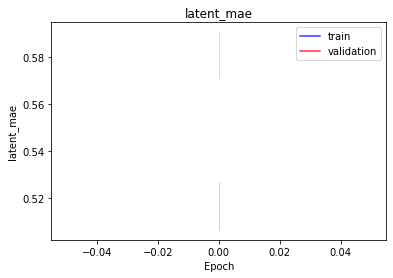

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978482.0000 (min: 788961.6250, max: 1168002.3750)

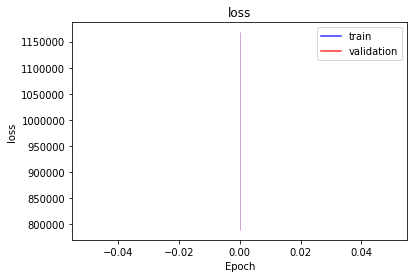

<b>bioma_loss</b>: 489241.0000 (min: 394481.2812, max: 584000.7500)

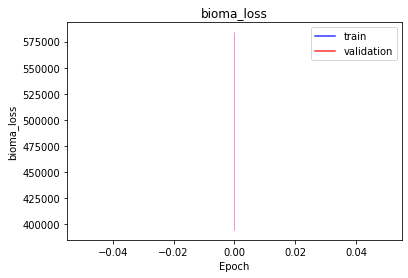

<b>domain_loss</b>: 489240.8750 (min: 394480.1875, max: 584001.5625)

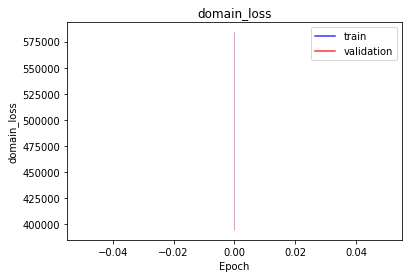

<b>latent_loss</b>: 0.1407 (min: 0.1386, max: 0.1428)

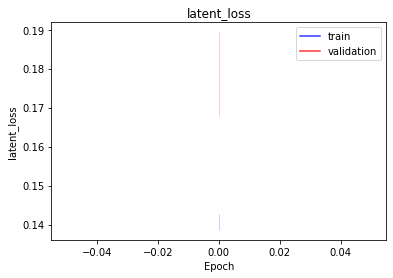

<b>bioma_mse</b>: 2.0834 (min: 2.0362, max: 2.1306)

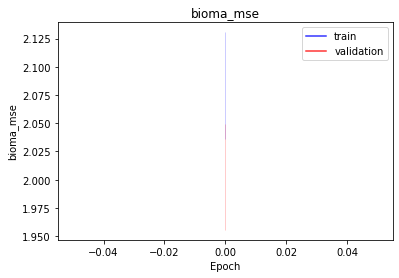

<b>bioma_mae</b>: 1.1435 (min: 1.1175, max: 1.1695)

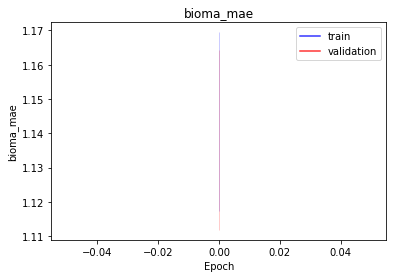

<b>bioma_mape</b>: nan (min: nan, max: nan)

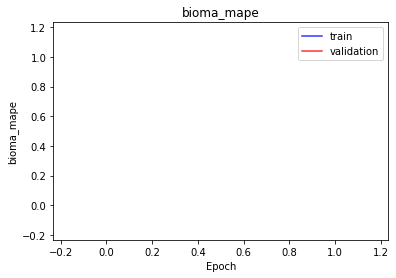

<b>domain_mse</b>: 2.0771 (min: 2.0348, max: 2.1194)

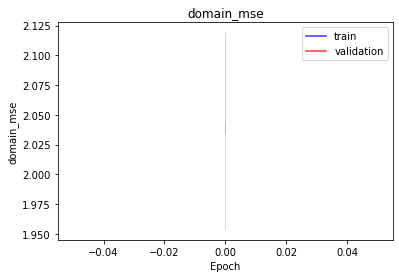

<b>domain_mae</b>: 1.1420 (min: 1.1173, max: 1.1667)

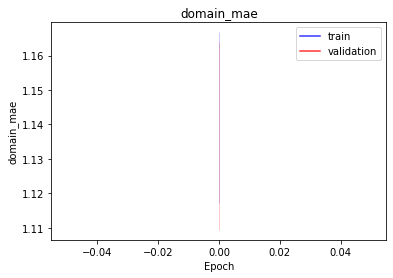

<b>domain_mape</b>: nan (min: nan, max: nan)

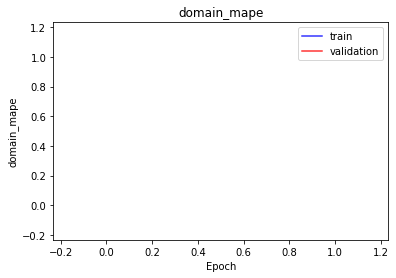

<b>latent_mae</b>: 0.1407 (min: 0.1386, max: 0.1428)

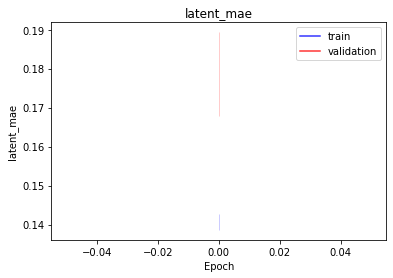

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978468.5625 (min: 788946.7500, max: 1167990.3750)

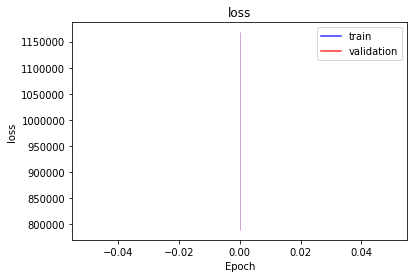

<b>bioma_loss</b>: 489238.8125 (min: 394481.3125, max: 583996.3125)

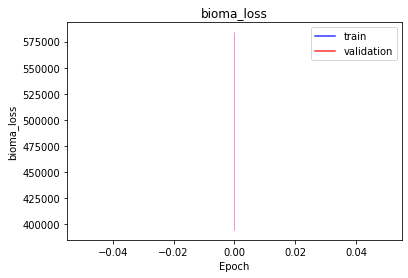

<b>domain_loss</b>: 489228.8750 (min: 394464.5625, max: 583993.1875)

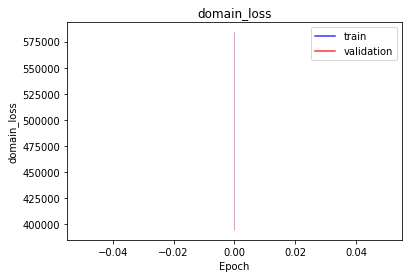

<b>latent_loss</b>: 0.8412 (min: 0.8331, max: 0.8492)

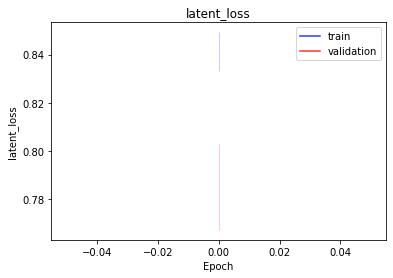

<b>bioma_mse</b>: 2.0468 (min: 1.9943, max: 2.0992)

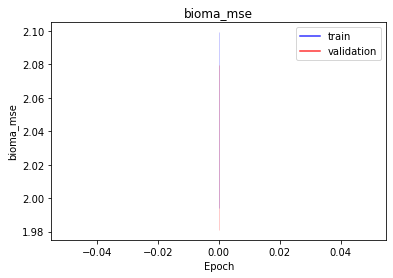

<b>bioma_mae</b>: 1.1280 (min: 1.0988, max: 1.1572)

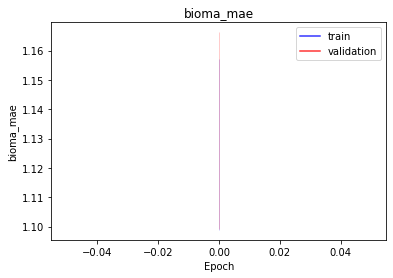

<b>bioma_mape</b>: nan (min: nan, max: nan)

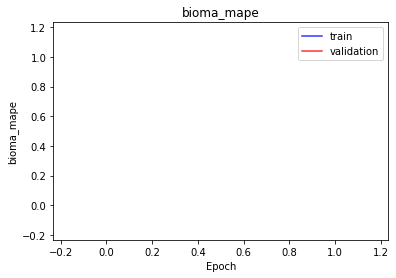

<b>domain_mse</b>: 2.0794 (min: 2.0272, max: 2.1315)

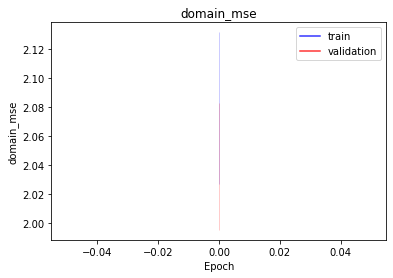

<b>domain_mae</b>: 1.1434 (min: 1.1156, max: 1.1713)

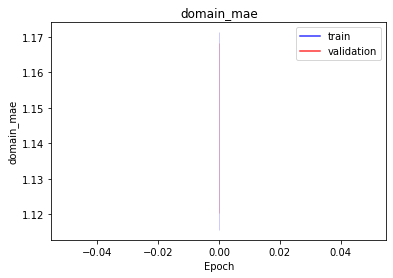

<b>domain_mape</b>: nan (min: nan, max: nan)

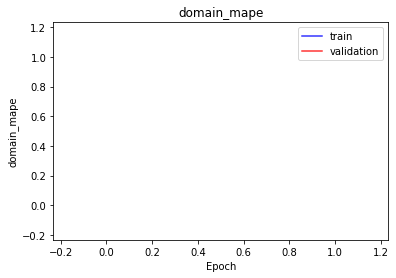

<b>latent_mae</b>: 0.8412 (min: 0.8331, max: 0.8492)

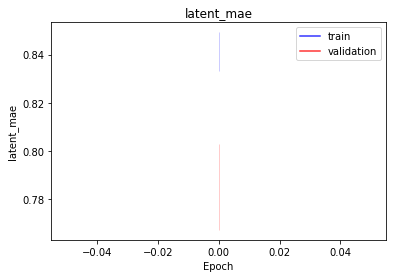

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978478.4688 (min: 788960.0625, max: 1167996.8750)

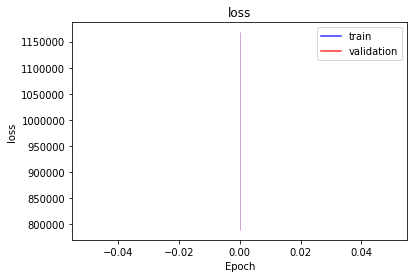

<b>bioma_loss</b>: 489238.9688 (min: 394480.2500, max: 583997.6875)

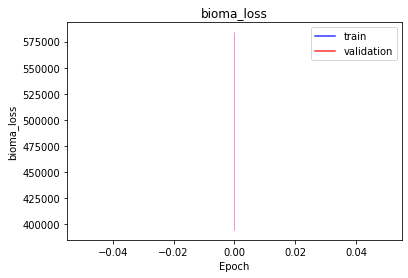

<b>domain_loss</b>: 489239.1250 (min: 394479.4375, max: 583998.8125)

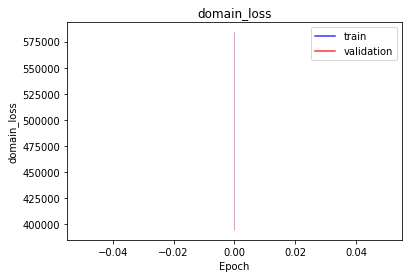

<b>latent_loss</b>: 0.3545 (min: 0.3174, max: 0.3915)

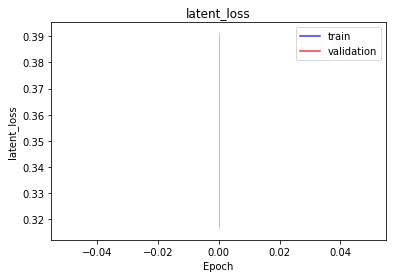

<b>bioma_mse</b>: 2.0281 (min: 1.9802, max: 2.0759)

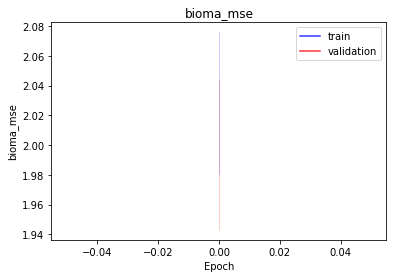

<b>bioma_mae</b>: 1.1278 (min: 1.0991, max: 1.1565)

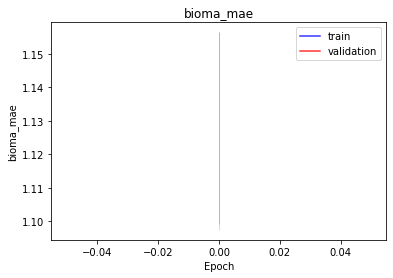

<b>bioma_mape</b>: nan (min: nan, max: nan)

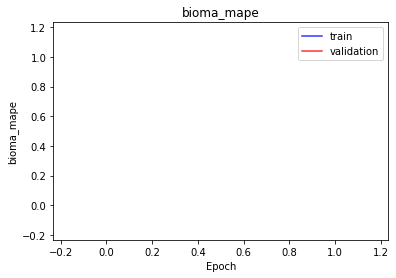

<b>domain_mse</b>: 2.0377 (min: 1.9891, max: 2.0862)

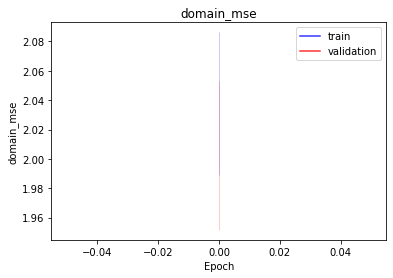

<b>domain_mae</b>: 1.1305 (min: 1.1029, max: 1.1581)

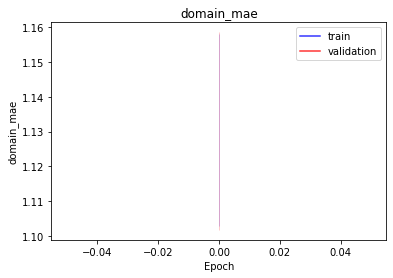

<b>domain_mape</b>: nan (min: nan, max: nan)

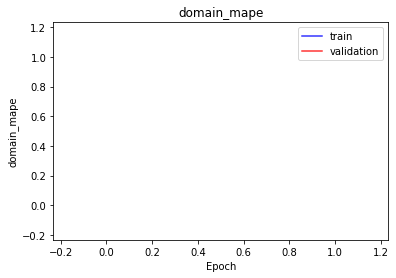

<b>latent_mae</b>: 0.3545 (min: 0.3174, max: 0.3915)

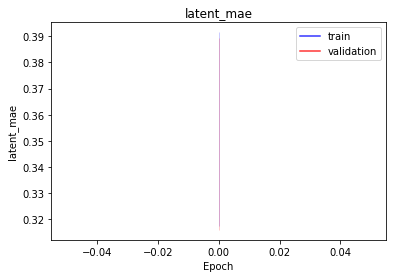

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978503.5312 (min: 788987.6875, max: 1168019.3750)

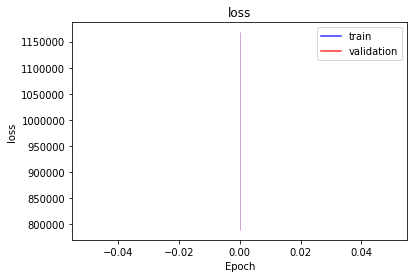

<b>bioma_loss</b>: 489251.5000 (min: 394493.6250, max: 584009.3750)

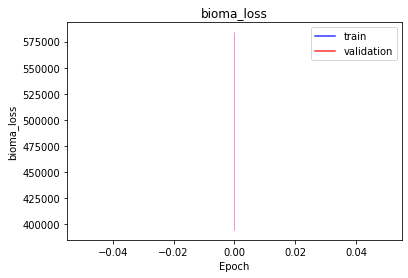

<b>domain_loss</b>: 489251.6250 (min: 394493.5938, max: 584009.6250)

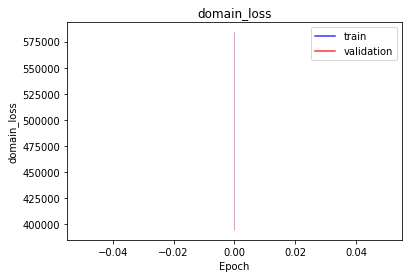

<b>latent_loss</b>: 0.4337 (min: 0.4183, max: 0.4492)

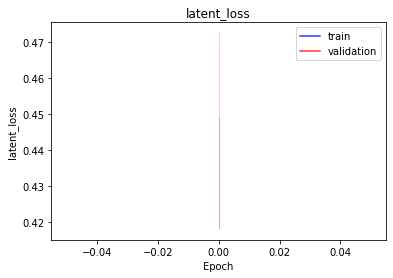

<b>bioma_mse</b>: 2.2477 (min: 2.1489, max: 2.3465)

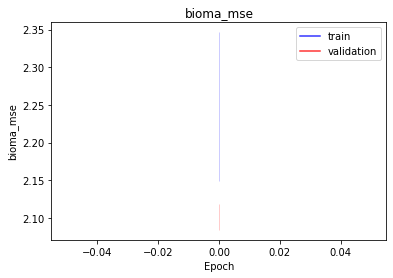

<b>bioma_mae</b>: 1.1895 (min: 1.1522, max: 1.2267)

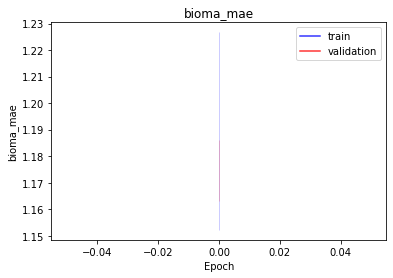

<b>bioma_mape</b>: nan (min: nan, max: nan)

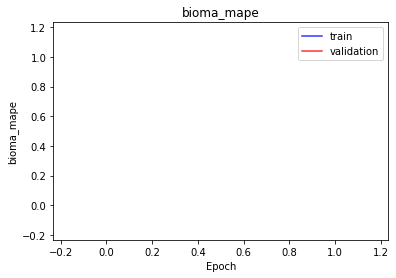

<b>domain_mse</b>: 2.2483 (min: 2.1477, max: 2.3488)

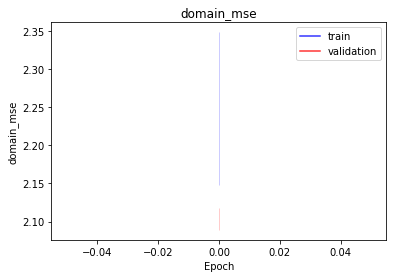

<b>domain_mae</b>: 1.1895 (min: 1.1518, max: 1.2272)

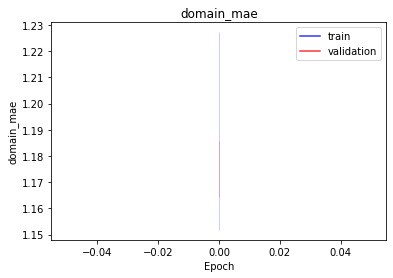

<b>domain_mape</b>: nan (min: nan, max: nan)

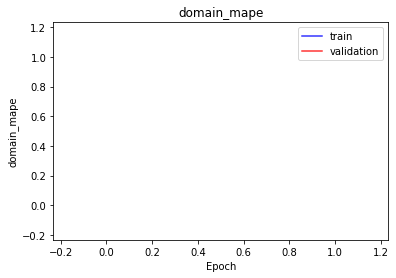

<b>latent_mae</b>: 0.4337 (min: 0.4183, max: 0.4492)

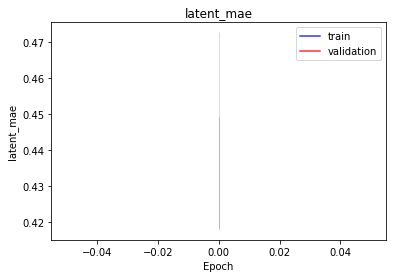

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978508.3750 (min: 788998.3750, max: 1168018.3750)

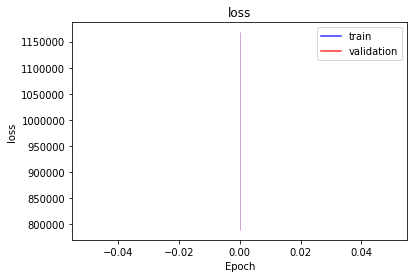

<b>bioma_loss</b>: 489254.1875 (min: 394499.1562, max: 584009.1875)

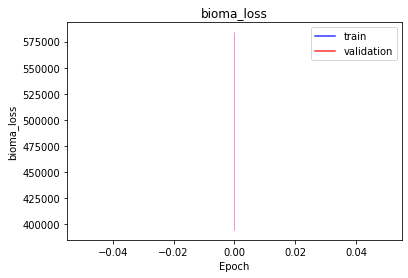

<b>domain_loss</b>: 489254.1250 (min: 394499.1250, max: 584009.1250)

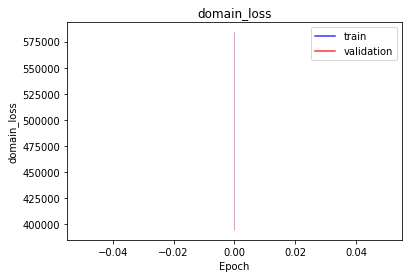

<b>latent_loss</b>: 0.1243 (min: 0.1207, max: 0.1278)

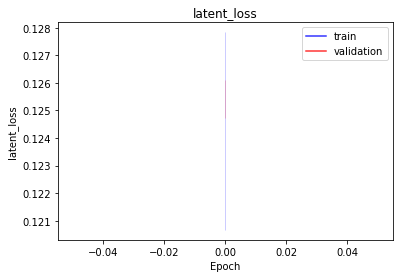

<b>bioma_mse</b>: 2.2467 (min: 2.2350, max: 2.2584)

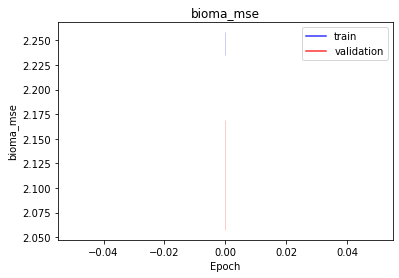

<b>bioma_mae</b>: 1.1860 (min: 1.1730, max: 1.1991)

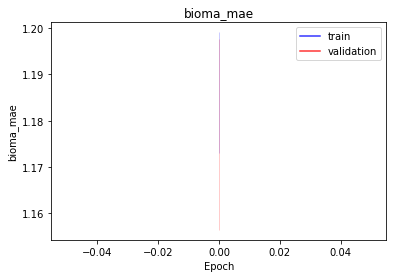

<b>bioma_mape</b>: nan (min: nan, max: nan)

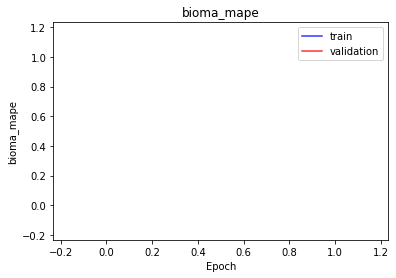

<b>domain_mse</b>: 2.2465 (min: 2.2349, max: 2.2581)

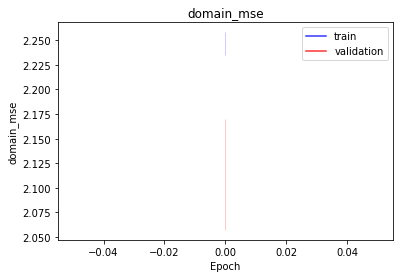

<b>domain_mae</b>: 1.1861 (min: 1.1730, max: 1.1991)

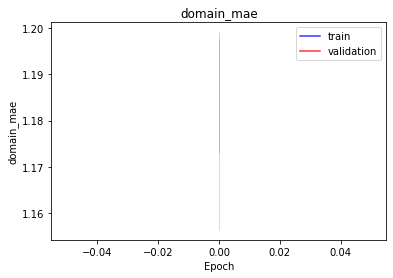

<b>domain_mape</b>: nan (min: nan, max: nan)

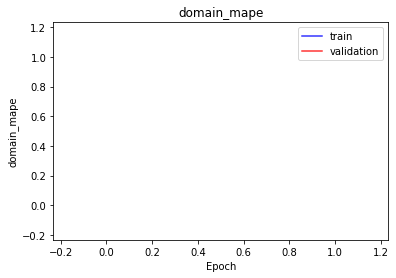

<b>latent_mae</b>: 0.1243 (min: 0.1207, max: 0.1278)

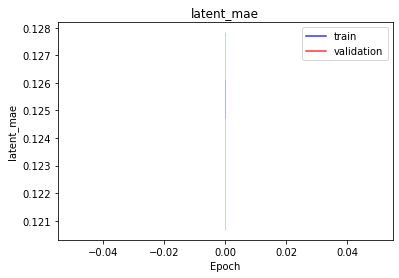

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978484.8125 (min: 788969.0000, max: 1168000.6250)

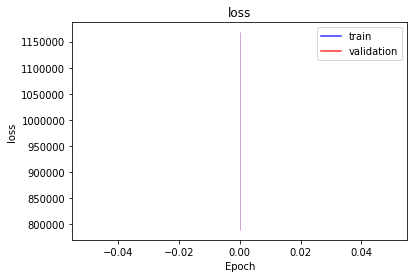

<b>bioma_loss</b>: 489245.6562 (min: 394494.3125, max: 583997.0000)

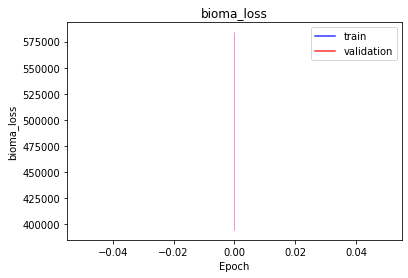

<b>domain_loss</b>: 489238.5625 (min: 394474.0938, max: 584003.0625)

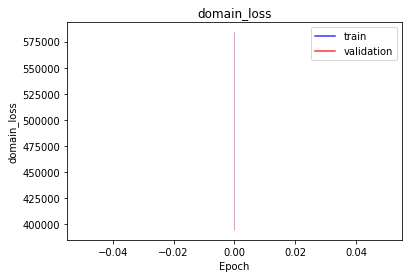

<b>latent_loss</b>: 0.6108 (min: 0.6022, max: 0.6195)

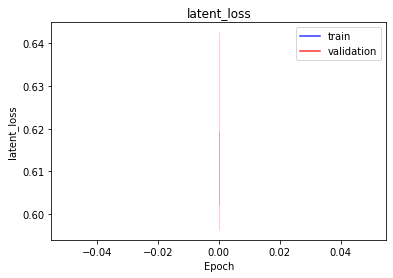

<b>bioma_mse</b>: 2.0792 (min: 2.0204, max: 2.1381)

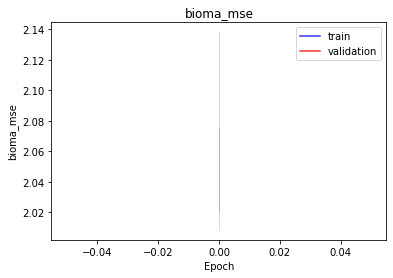

<b>bioma_mae</b>: 1.1342 (min: 1.1042, max: 1.1642)

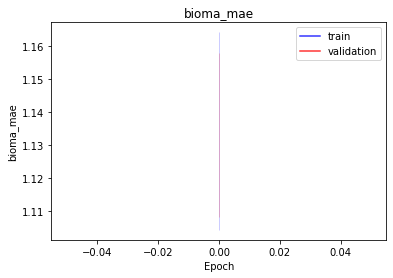

<b>bioma_mape</b>: nan (min: nan, max: nan)

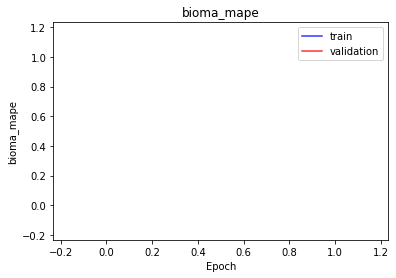

<b>domain_mse</b>: 2.0762 (min: 2.0191, max: 2.1334)

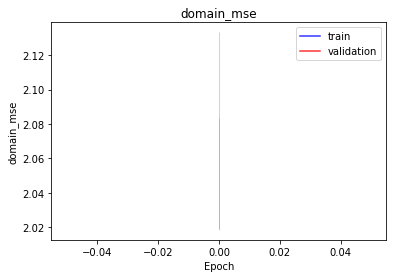

<b>domain_mae</b>: 1.1429 (min: 1.1138, max: 1.1720)

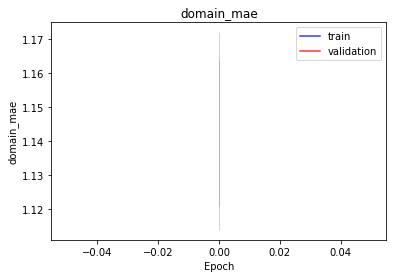

<b>domain_mape</b>: nan (min: nan, max: nan)

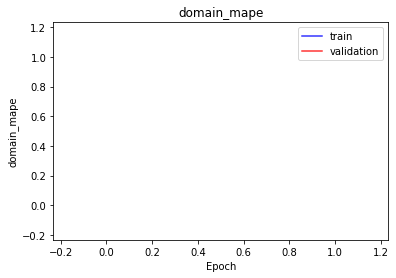

<b>latent_mae</b>: 0.6108 (min: 0.6022, max: 0.6195)

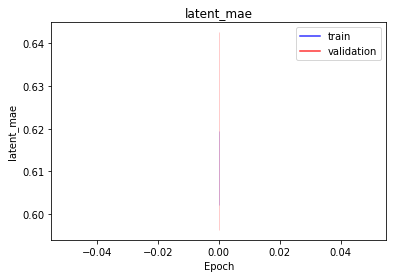

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978463.5625 (min: 788938.7500, max: 1167988.3750)

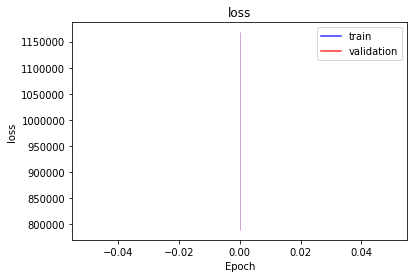

<b>bioma_loss</b>: 489229.6875 (min: 394466.4062, max: 583993.0000)

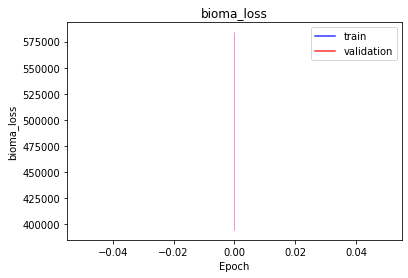

<b>domain_loss</b>: 489233.7500 (min: 394472.1562, max: 583995.3125)

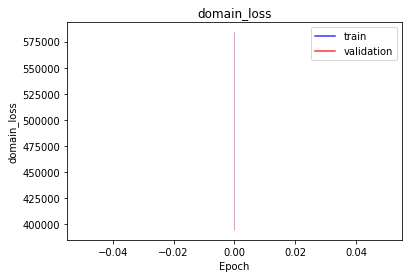

<b>latent_loss</b>: 0.1881 (min: 0.1716, max: 0.2046)

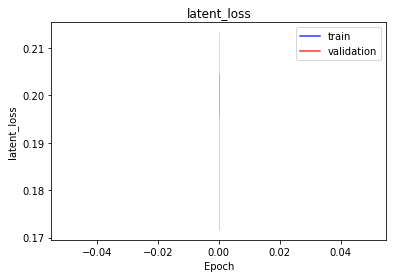

<b>bioma_mse</b>: 2.0655 (min: 2.0099, max: 2.1210)

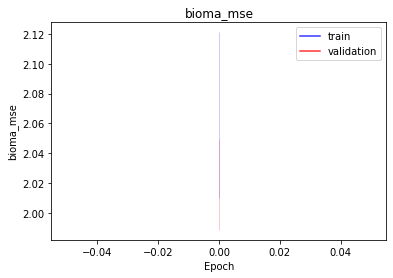

<b>bioma_mae</b>: 1.1406 (min: 1.1122, max: 1.1690)

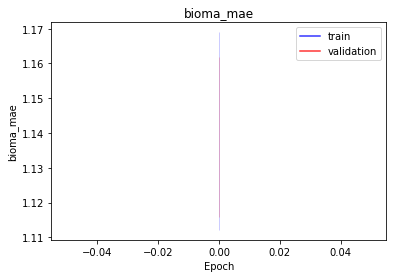

<b>bioma_mape</b>: nan (min: nan, max: nan)

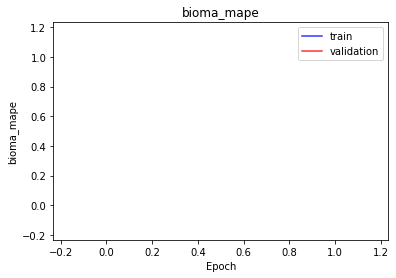

<b>domain_mse</b>: 2.0716 (min: 2.0048, max: 2.1384)

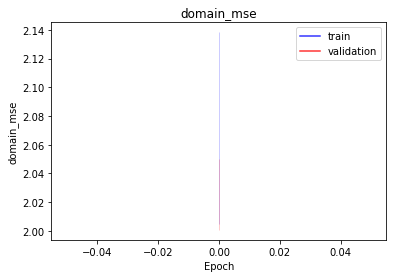

<b>domain_mae</b>: 1.1427 (min: 1.1114, max: 1.1739)

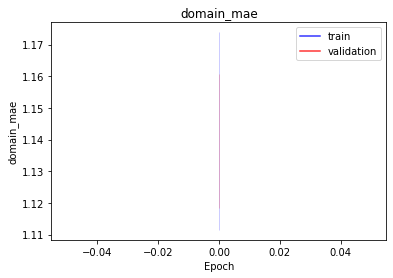

<b>domain_mape</b>: nan (min: nan, max: nan)

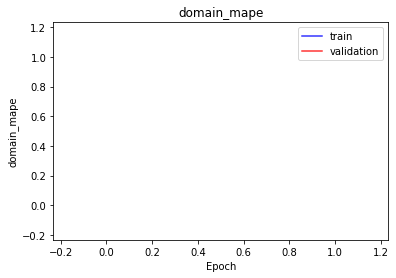

<b>latent_mae</b>: 0.1881 (min: 0.1716, max: 0.2046)

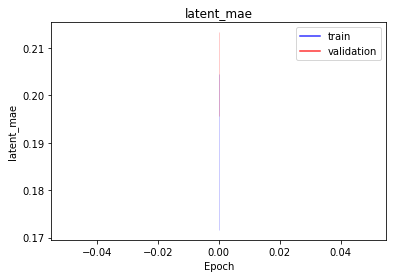

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978479.1875 (min: 788950.0000, max: 1168008.3750)

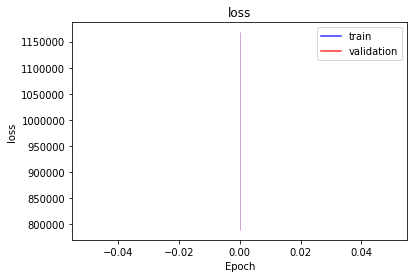

<b>bioma_loss</b>: 489238.5938 (min: 394475.3750, max: 584001.8125)

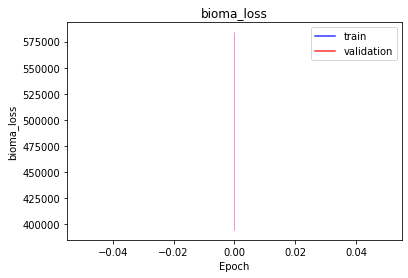

<b>domain_loss</b>: 489239.7500 (min: 394473.7188, max: 584005.7500)

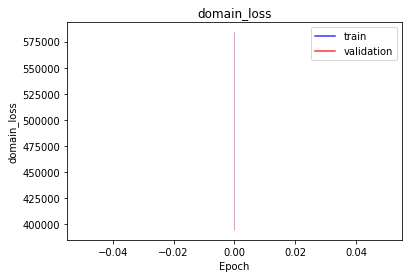

<b>latent_loss</b>: 0.8709 (min: 0.8546, max: 0.8872)

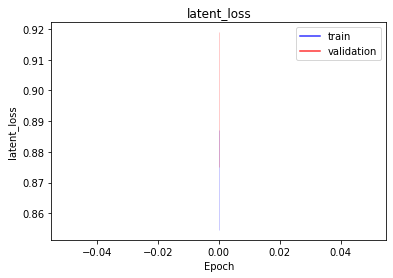

<b>bioma_mse</b>: 2.0615 (min: 2.0418, max: 2.0811)

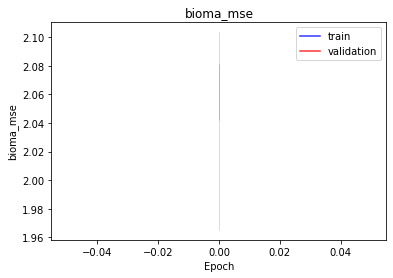

<b>bioma_mae</b>: 1.1286 (min: 1.1049, max: 1.1522)

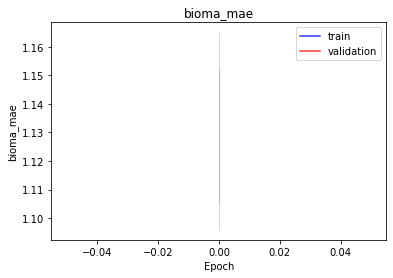

<b>bioma_mape</b>: nan (min: nan, max: nan)

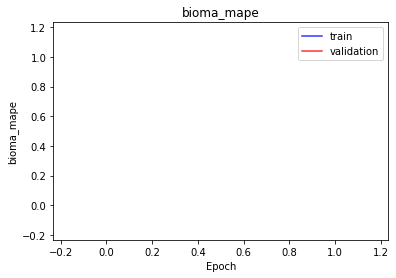

<b>domain_mse</b>: 2.1844 (min: 2.1623, max: 2.2064)

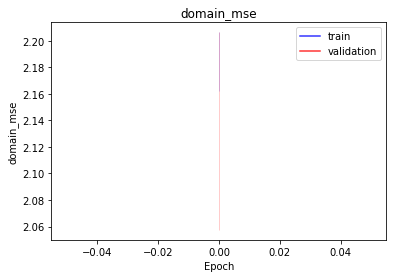

<b>domain_mae</b>: 1.1692 (min: 1.1513, max: 1.1870)

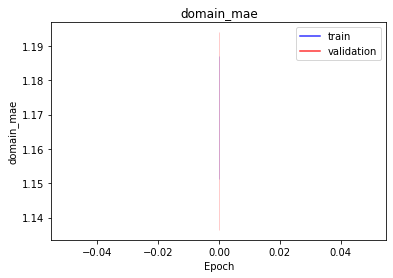

<b>domain_mape</b>: nan (min: nan, max: nan)

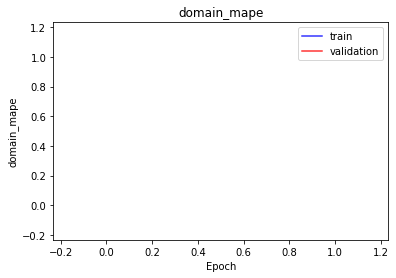

<b>latent_mae</b>: 0.8709 (min: 0.8546, max: 0.8872)

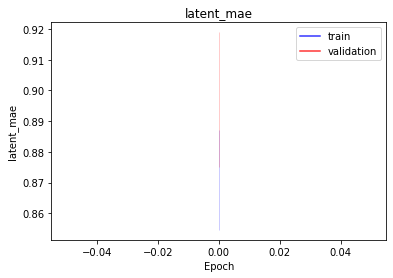

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978471.5625 (min: 788953.8750, max: 1167989.2500)

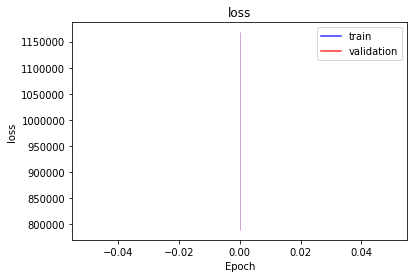

<b>bioma_loss</b>: 489233.8750 (min: 394475.2812, max: 583992.5000)

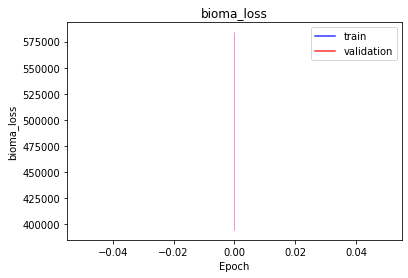

<b>domain_loss</b>: 489237.2500 (min: 394478.1562, max: 583996.3125)

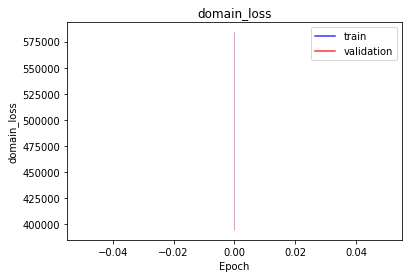

<b>latent_loss</b>: 0.4365 (min: 0.4147, max: 0.4583)

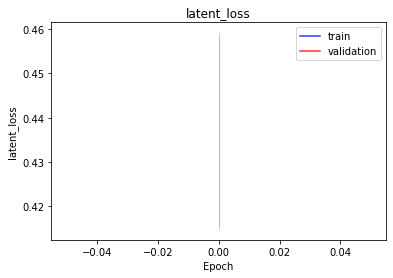

<b>bioma_mse</b>: 2.0645 (min: 2.0091, max: 2.1199)

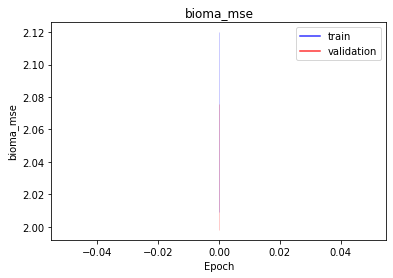

<b>bioma_mae</b>: 1.1386 (min: 1.1094, max: 1.1678)

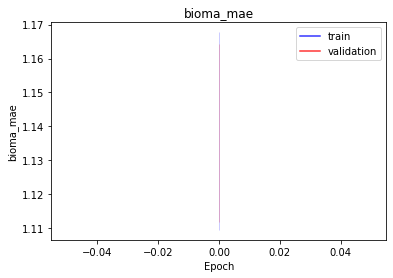

<b>bioma_mape</b>: nan (min: nan, max: nan)

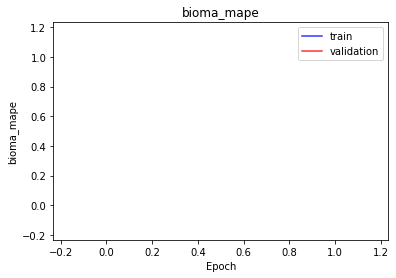

<b>domain_mse</b>: 2.0846 (min: 2.0250, max: 2.1443)

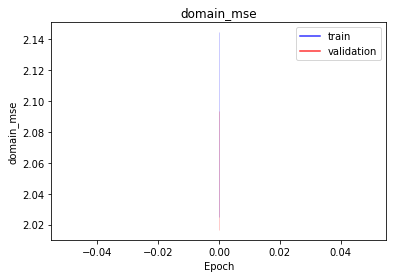

<b>domain_mae</b>: 1.1436 (min: 1.1135, max: 1.1736)

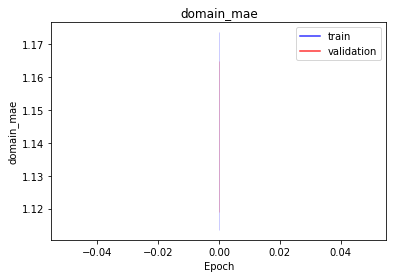

<b>domain_mape</b>: nan (min: nan, max: nan)

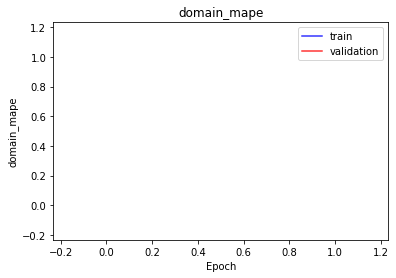

<b>latent_mae</b>: 0.4365 (min: 0.4147, max: 0.4583)

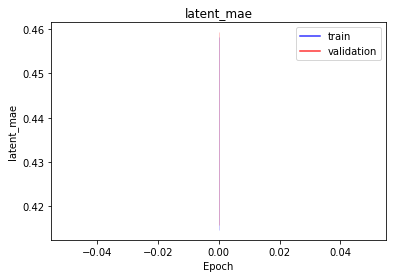

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978484.0938 (min: 788953.4375, max: 1168014.7500)

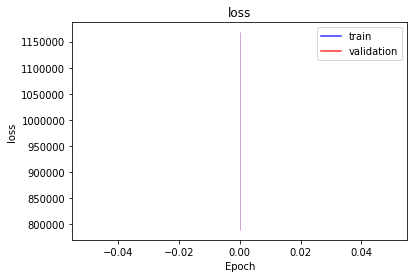

<b>bioma_loss</b>: 489241.5625 (min: 394476.4688, max: 584006.6250)

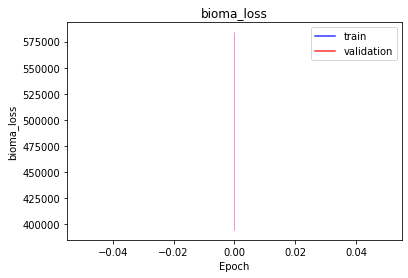

<b>domain_loss</b>: 489242.0625 (min: 394476.4688, max: 584007.6250)

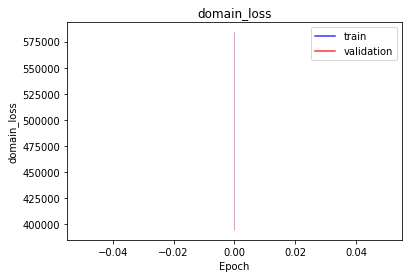

<b>latent_loss</b>: 0.5180 (min: 0.5058, max: 0.5303)

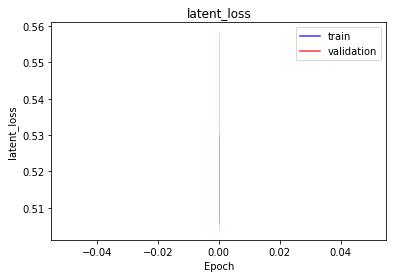

<b>bioma_mse</b>: 2.1370 (min: 2.1315, max: 2.1425)

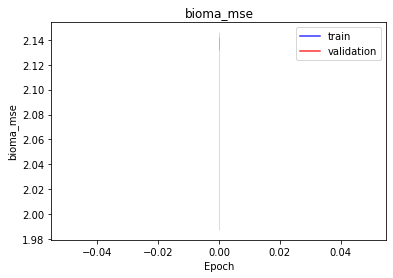

<b>bioma_mae</b>: 1.1579 (min: 1.1504, max: 1.1655)

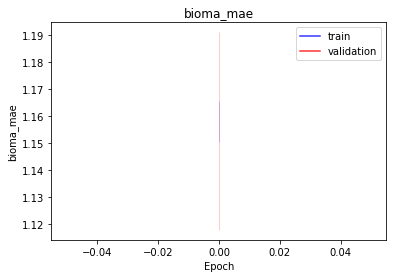

<b>bioma_mape</b>: nan (min: nan, max: nan)

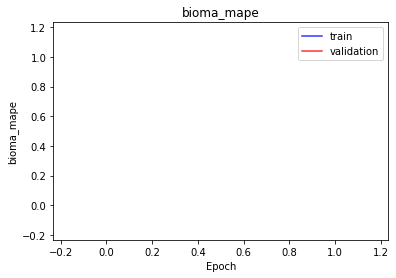

<b>domain_mse</b>: 2.1362 (min: 2.1353, max: 2.1372)

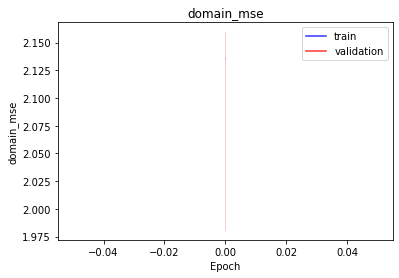

<b>domain_mae</b>: 1.1573 (min: 1.1520, max: 1.1627)

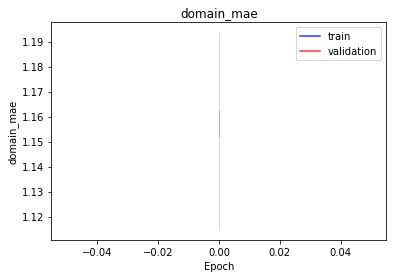

<b>domain_mape</b>: nan (min: nan, max: nan)

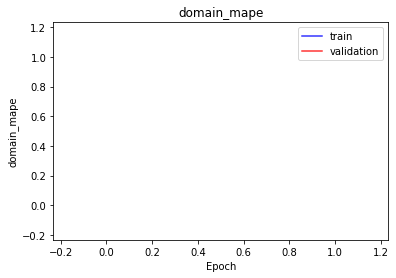

<b>latent_mae</b>: 0.5180 (min: 0.5058, max: 0.5303)

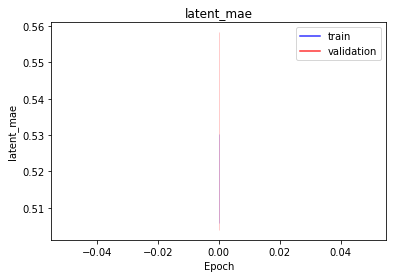

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978492.8125 (min: 788997.0000, max: 1167988.6250)

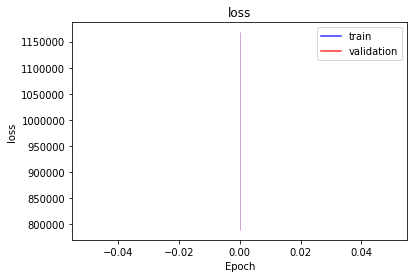

<b>bioma_loss</b>: 489246.1562 (min: 394498.3750, max: 583993.9375)

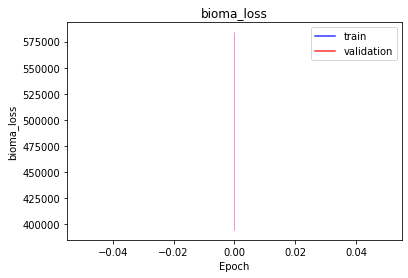

<b>domain_loss</b>: 489246.5000 (min: 394498.5312, max: 583994.5000)

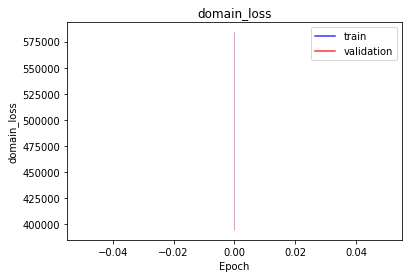

<b>latent_loss</b>: 0.1424 (min: 0.1320, max: 0.1528)

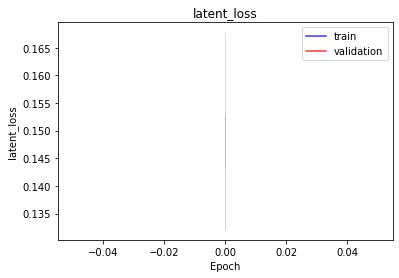

<b>bioma_mse</b>: 2.1750 (min: 2.1434, max: 2.2066)

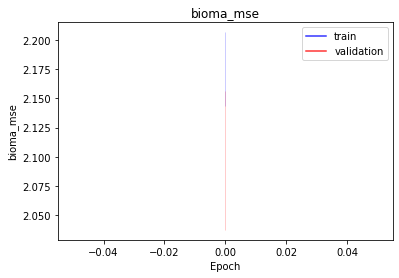

<b>bioma_mae</b>: 1.1656 (min: 1.1486, max: 1.1827)

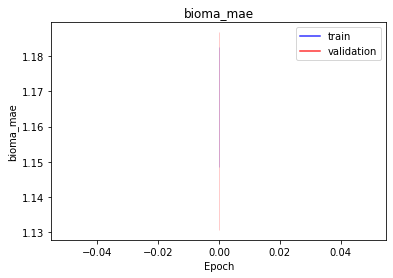

<b>bioma_mape</b>: nan (min: nan, max: nan)

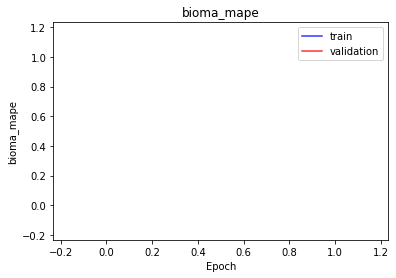

<b>domain_mse</b>: 2.1732 (min: 2.1391, max: 2.2073)

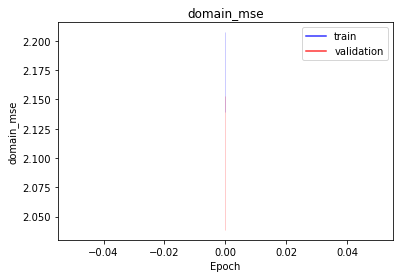

<b>domain_mae</b>: 1.1652 (min: 1.1472, max: 1.1833)

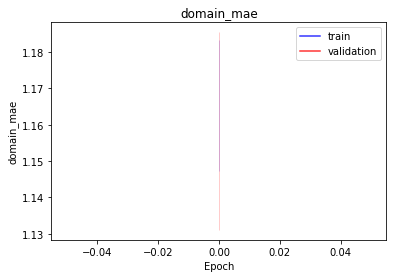

<b>domain_mape</b>: nan (min: nan, max: nan)

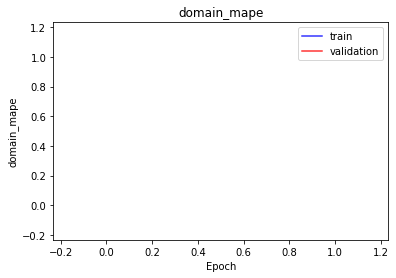

<b>latent_mae</b>: 0.1424 (min: 0.1320, max: 0.1528)

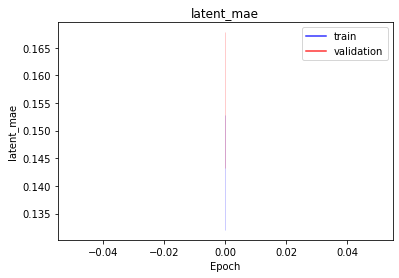

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.5312 (min: 788949.1875, max: 1168013.8750)

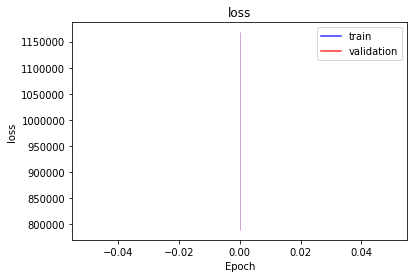

<b>bioma_loss</b>: 489244.3125 (min: 394477.6875, max: 584010.9375)

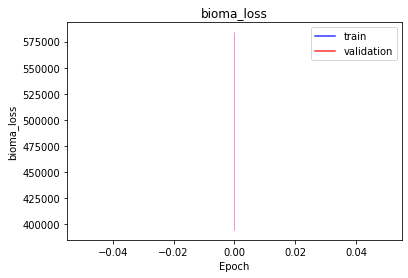

<b>domain_loss</b>: 489236.3125 (min: 394470.5625, max: 584002.0625)

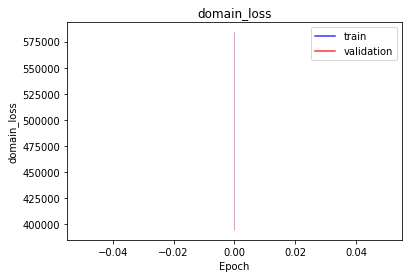

<b>latent_loss</b>: 0.9434 (min: 0.9318, max: 0.9550)

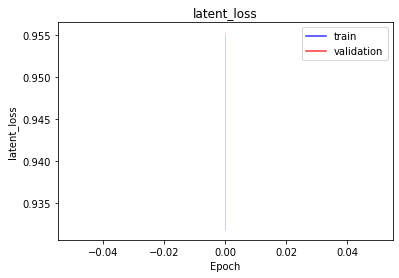

<b>bioma_mse</b>: 2.1391 (min: 2.1127, max: 2.1654)

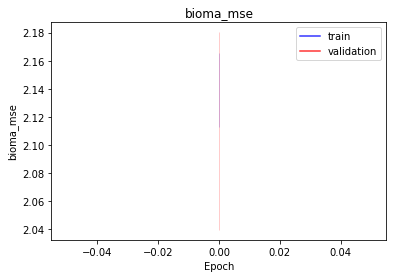

<b>bioma_mae</b>: 1.1455 (min: 1.1209, max: 1.1702)

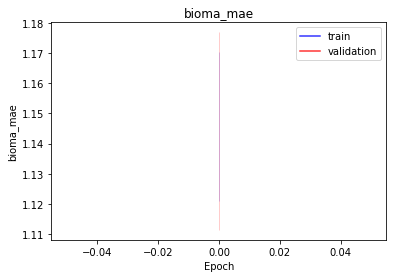

<b>bioma_mape</b>: nan (min: nan, max: nan)

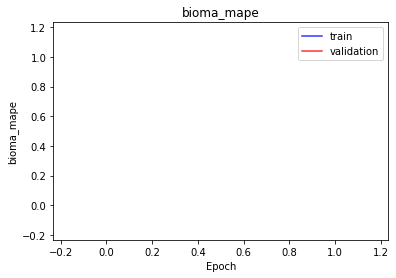

<b>domain_mse</b>: 2.1867 (min: 2.1236, max: 2.2499)

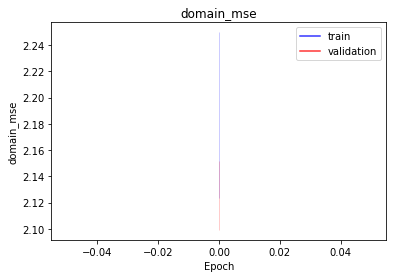

<b>domain_mae</b>: 1.1657 (min: 1.1407, max: 1.1907)

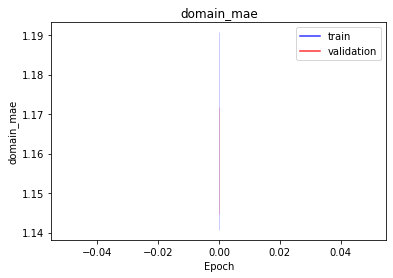

<b>domain_mape</b>: nan (min: nan, max: nan)

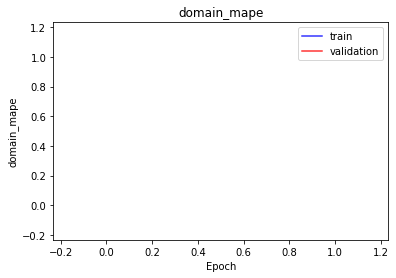

<b>latent_mae</b>: 0.9434 (min: 0.9318, max: 0.9550)

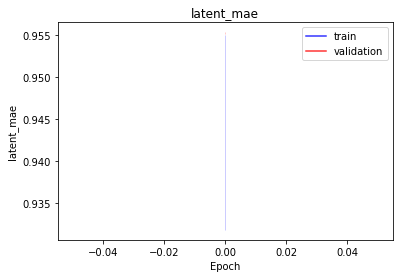

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978490.0000 (min: 788964.6250, max: 1168015.3750)

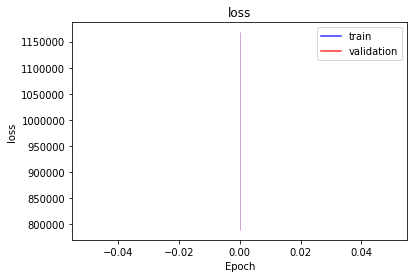

<b>bioma_loss</b>: 489244.0938 (min: 394478.5625, max: 584009.6250)

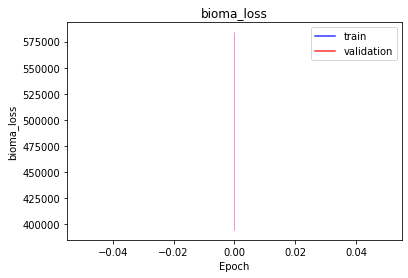

<b>domain_loss</b>: 489245.4375 (min: 394485.6250, max: 584005.2500)

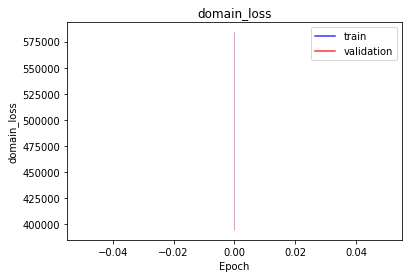

<b>latent_loss</b>: 0.4482 (min: 0.4261, max: 0.4703)

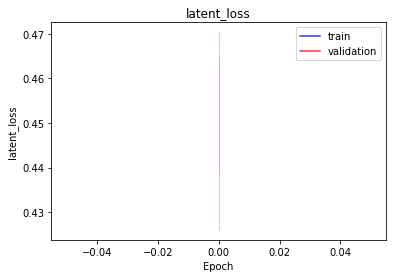

<b>bioma_mse</b>: 2.1058 (min: 2.0651, max: 2.1465)

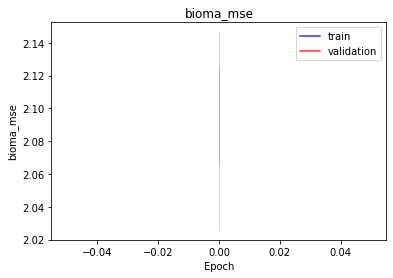

<b>bioma_mae</b>: 1.1493 (min: 1.1228, max: 1.1759)

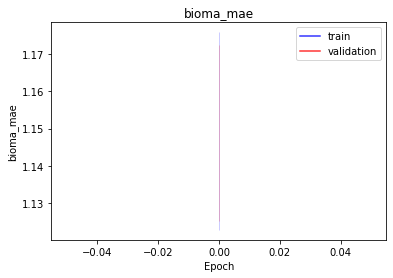

<b>bioma_mape</b>: nan (min: nan, max: nan)

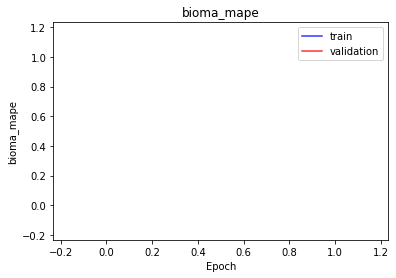

<b>domain_mse</b>: 2.0992 (min: 2.0849, max: 2.1134)

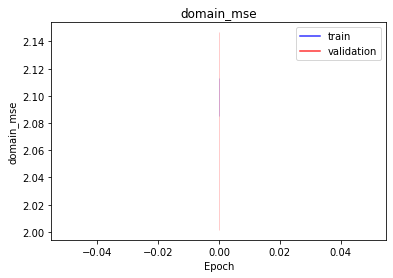

<b>domain_mae</b>: 1.1471 (min: 1.1330, max: 1.1613)

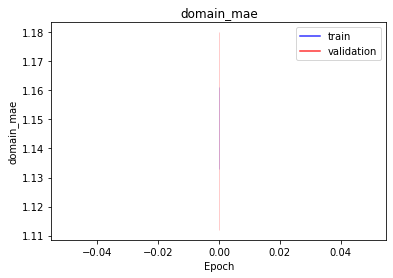

<b>domain_mape</b>: nan (min: nan, max: nan)

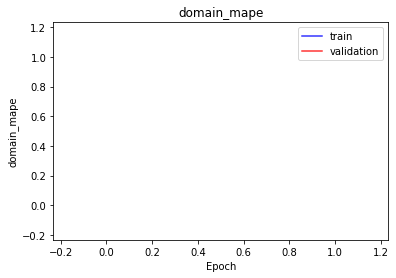

<b>latent_mae</b>: 0.4482 (min: 0.4261, max: 0.4703)

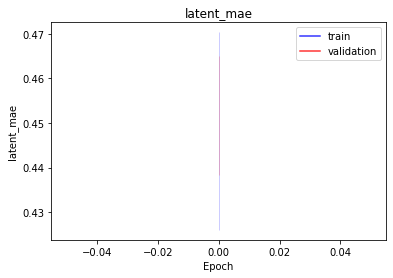

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.6250 (min: 788965.2500, max: 1167998.0000)

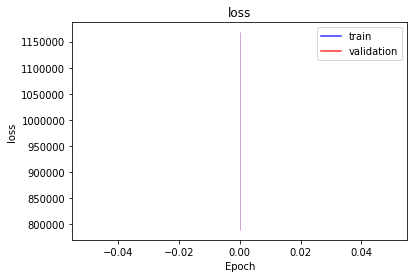

<b>bioma_loss</b>: 489244.0625 (min: 394478.9062, max: 584009.1875)

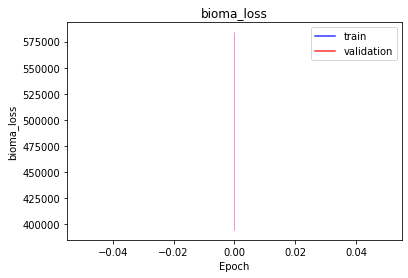

<b>domain_loss</b>: 489236.6875 (min: 394485.4062, max: 583987.9375)

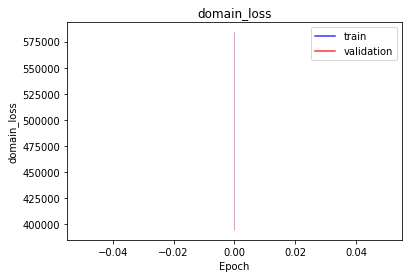

<b>latent_loss</b>: 0.8843 (min: 0.8605, max: 0.9081)

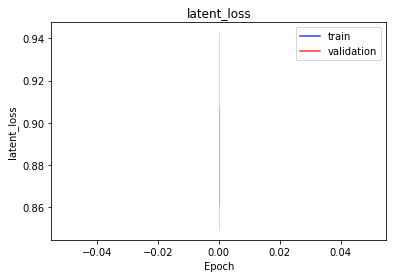

<b>bioma_mse</b>: 2.1571 (min: 2.1346, max: 2.1797)

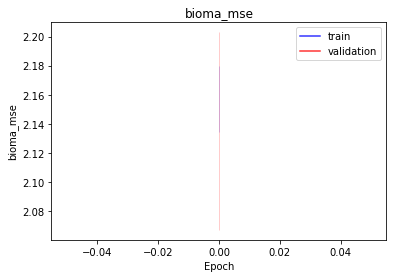

<b>bioma_mae</b>: 1.1515 (min: 1.1273, max: 1.1757)

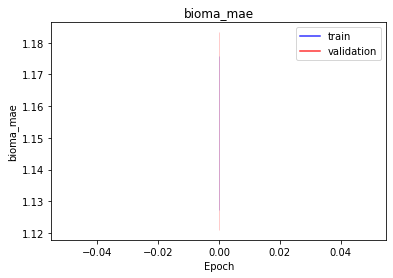

<b>bioma_mape</b>: nan (min: nan, max: nan)

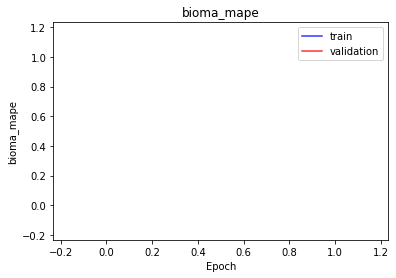

<b>domain_mse</b>: 2.2117 (min: 2.1309, max: 2.2924)

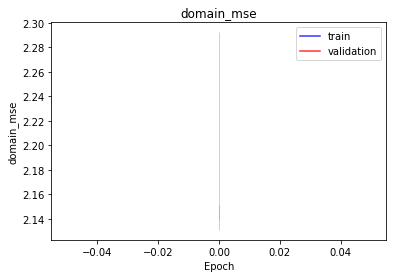

<b>domain_mae</b>: 1.1766 (min: 1.1477, max: 1.2055)

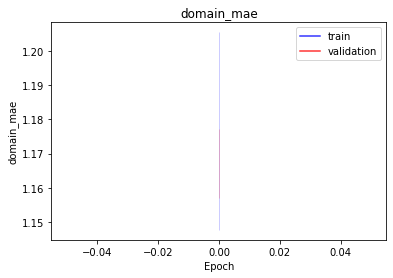

<b>domain_mape</b>: nan (min: nan, max: nan)

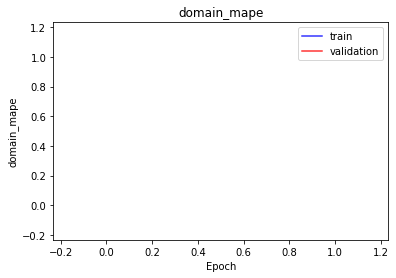

<b>latent_mae</b>: 0.8843 (min: 0.8605, max: 0.9081)

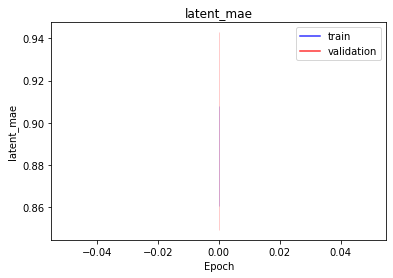

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978469.1562 (min: 788949.0625, max: 1167989.2500)

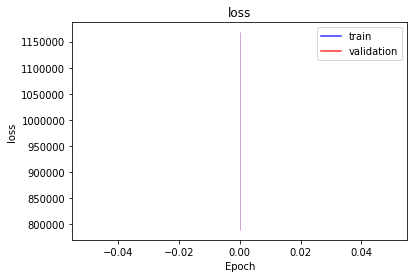

<b>bioma_loss</b>: 489232.6875 (min: 394477.9062, max: 583987.5000)

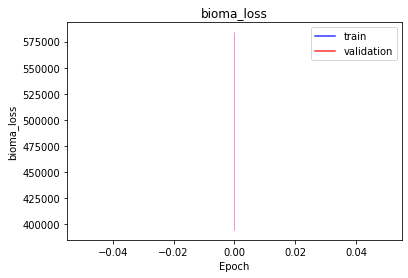

<b>domain_loss</b>: 489235.9375 (min: 394470.7188, max: 584001.1875)

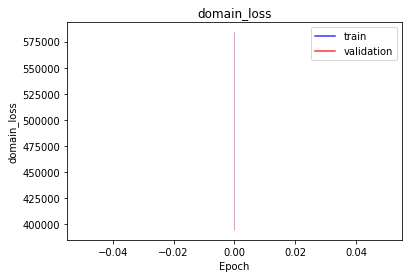

<b>latent_loss</b>: 0.4604 (min: 0.4525, max: 0.4682)

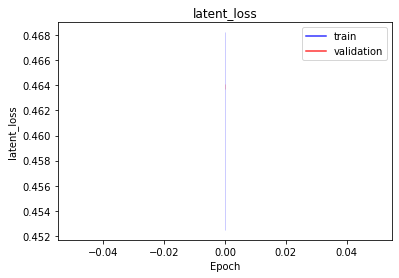

<b>bioma_mse</b>: 2.1344 (min: 2.1004, max: 2.1683)

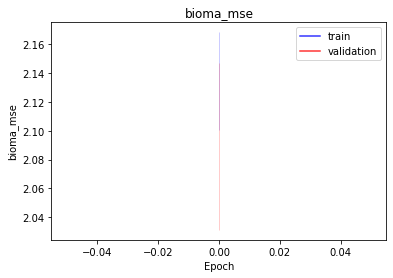

<b>bioma_mae</b>: 1.1621 (min: 1.1387, max: 1.1855)

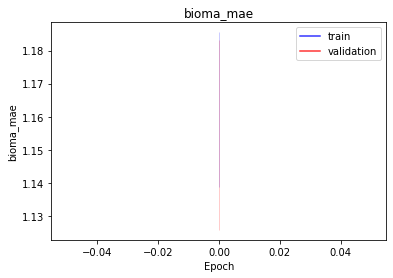

<b>bioma_mape</b>: nan (min: nan, max: nan)

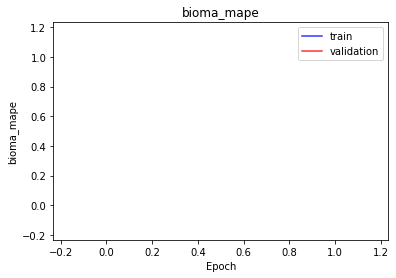

<b>domain_mse</b>: 2.1430 (min: 2.1266, max: 2.1594)

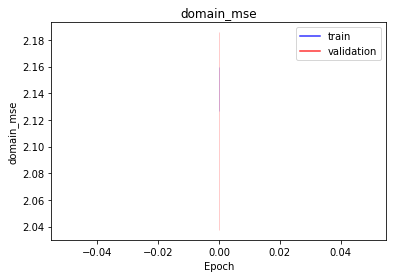

<b>domain_mae</b>: 1.1623 (min: 1.1454, max: 1.1792)

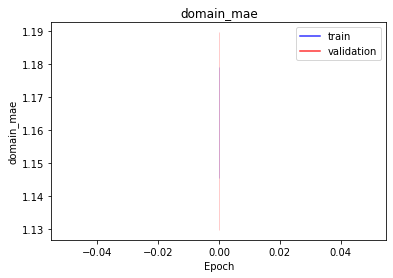

<b>domain_mape</b>: nan (min: nan, max: nan)

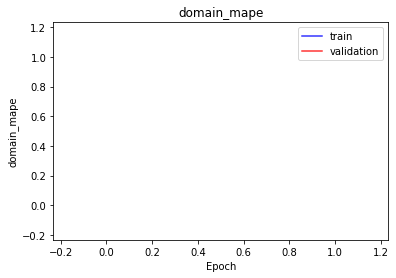

<b>latent_mae</b>: 0.4604 (min: 0.4525, max: 0.4682)

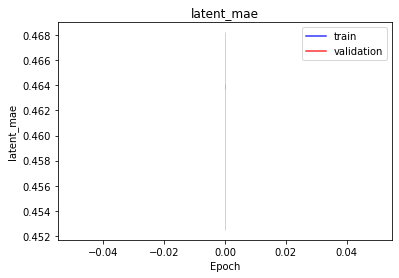

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978481.4375 (min: 788942.8750, max: 1168020.0000)

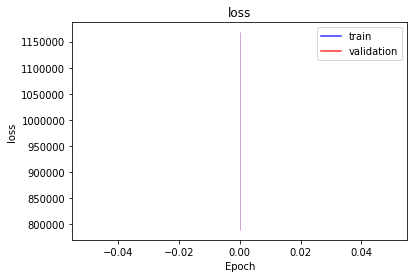

<b>bioma_loss</b>: 489231.7500 (min: 394460.8750, max: 584002.6250)

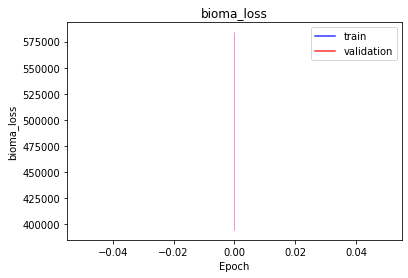

<b>domain_loss</b>: 489248.7500 (min: 394481.0312, max: 584016.5000)

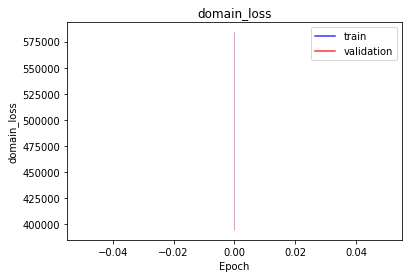

<b>latent_loss</b>: 0.9587 (min: 0.9040, max: 1.0135)

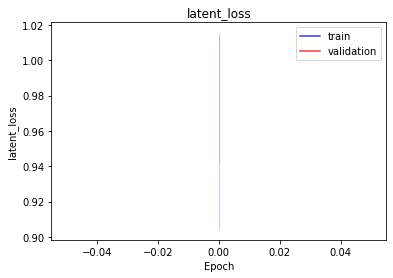

<b>bioma_mse</b>: 2.1372 (min: 2.0999, max: 2.1744)

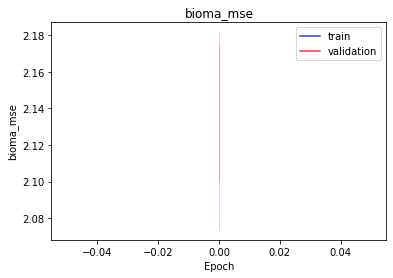

<b>bioma_mae</b>: 1.1447 (min: 1.1190, max: 1.1703)

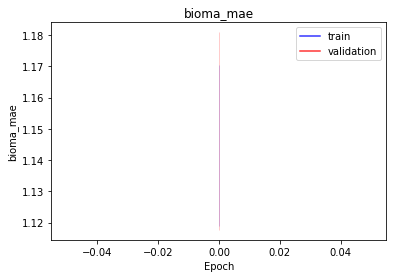

<b>bioma_mape</b>: nan (min: nan, max: nan)

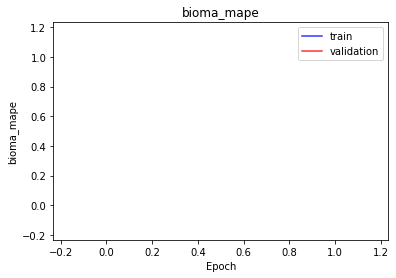

<b>domain_mse</b>: 2.2777 (min: 2.2719, max: 2.2834)

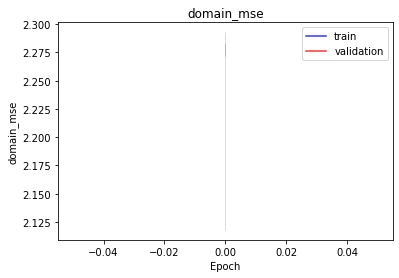

<b>domain_mae</b>: 1.1966 (min: 1.1862, max: 1.2070)

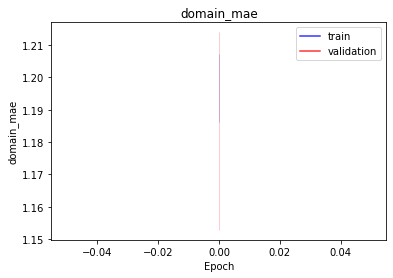

<b>domain_mape</b>: nan (min: nan, max: nan)

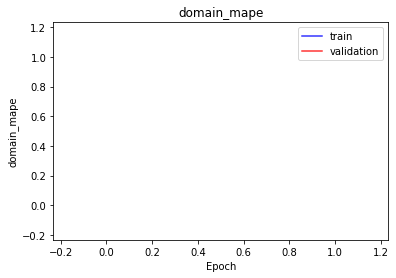

<b>latent_mae</b>: 0.9587 (min: 0.9040, max: 1.0135)

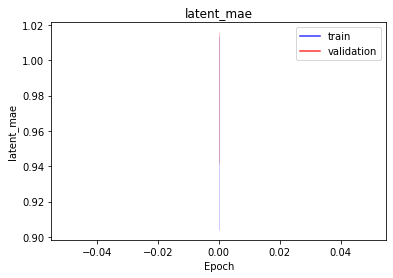

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | CenterLogRatio |
| Output transform | none |
| Reconstruction Loss | MeanSquaredError |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: 978484.3438 (min: 788980.4375, max: 1167988.2500)

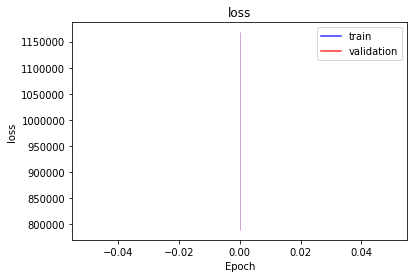

<b>bioma_loss</b>: 489241.4062 (min: 394487.1250, max: 583995.6875)

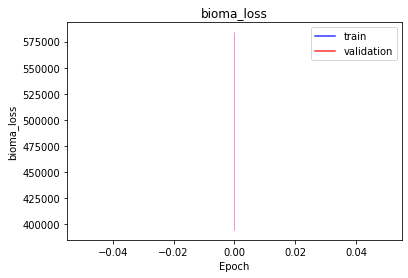

<b>domain_loss</b>: 489242.4375 (min: 394492.8438, max: 583992.0625)

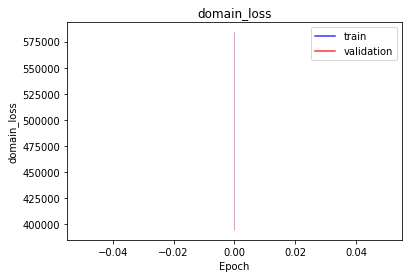

<b>latent_loss</b>: 0.4517 (min: 0.4483, max: 0.4551)

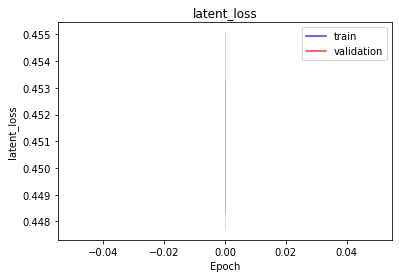

<b>bioma_mse</b>: 2.0707 (min: 2.0173, max: 2.1242)

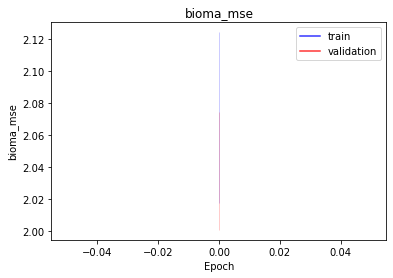

<b>bioma_mae</b>: 1.1406 (min: 1.1124, max: 1.1687)

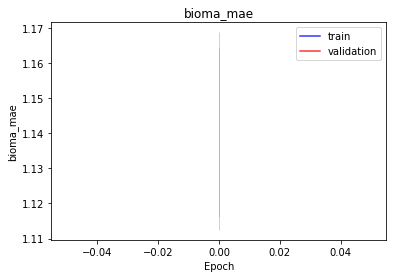

<b>bioma_mape</b>: nan (min: nan, max: nan)

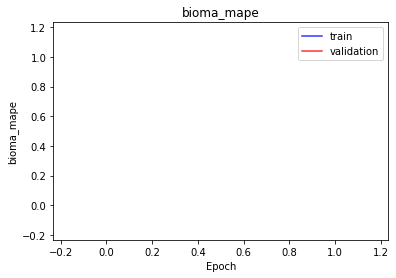

<b>domain_mse</b>: 2.1422 (min: 2.0881, max: 2.1963)

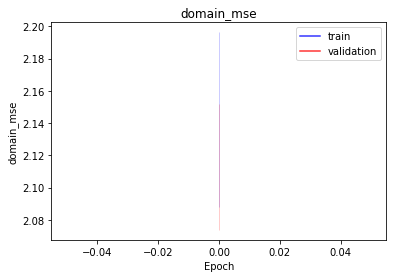

<b>domain_mae</b>: 1.1642 (min: 1.1382, max: 1.1902)

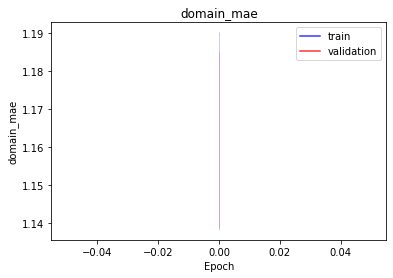

<b>domain_mape</b>: nan (min: nan, max: nan)

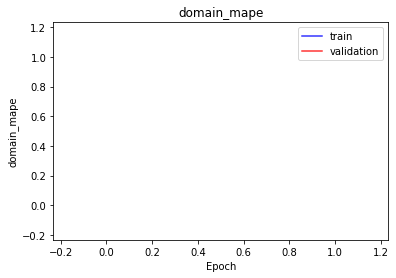

<b>latent_mae</b>: 0.4517 (min: 0.4483, max: 0.4551)

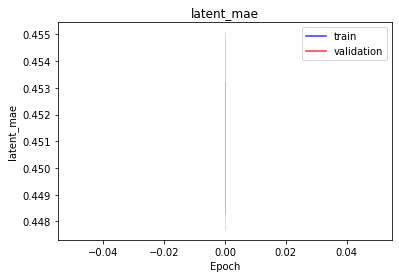

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

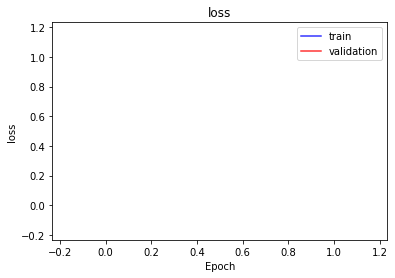

<b>bioma_loss</b>: nan (min: nan, max: nan)

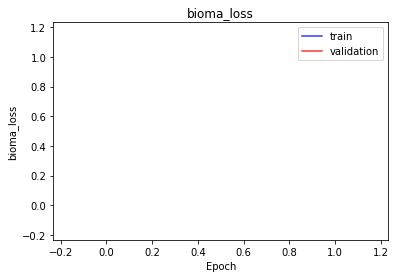

<b>domain_loss</b>: 156620.6562 (min: 154584.2031, max: 158657.0938)

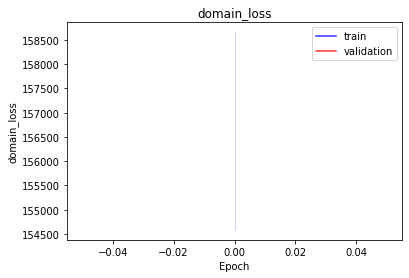

<b>latent_loss</b>: nan (min: nan, max: nan)

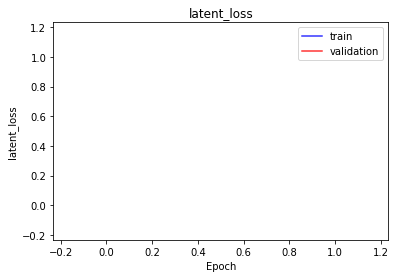

<b>bioma_mse</b>: nan (min: nan, max: nan)

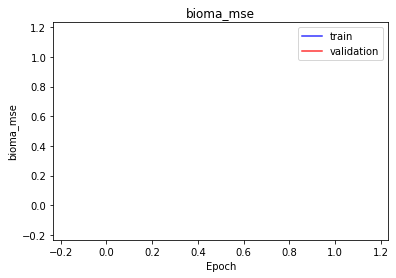

<b>bioma_mae</b>: nan (min: nan, max: nan)

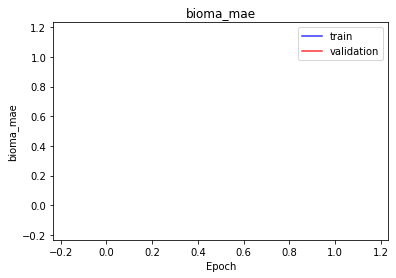

<b>bioma_mape</b>: nan (min: nan, max: nan)

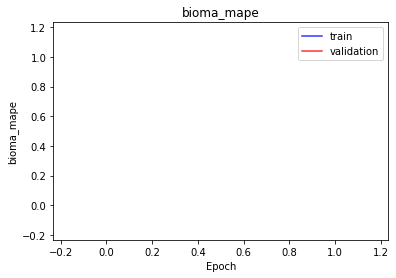

<b>domain_mse</b>: nan (min: nan, max: nan)

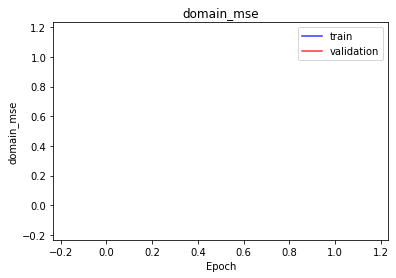

<b>domain_mae</b>: nan (min: nan, max: nan)

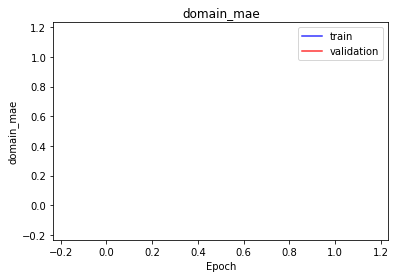

<b>domain_mape</b>: nan (min: nan, max: nan)

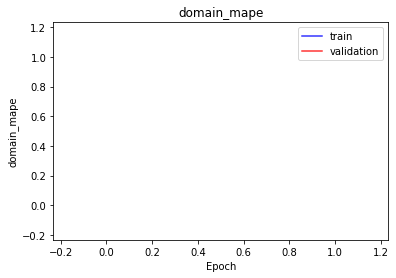

<b>latent_mae</b>: nan (min: nan, max: nan)

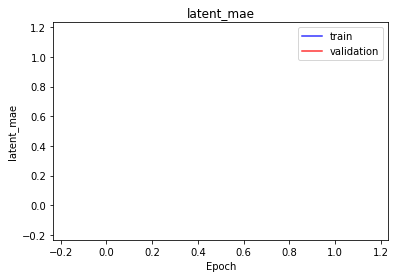

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

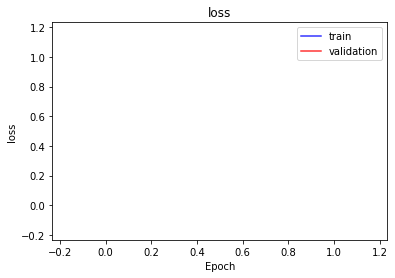

<b>bioma_loss</b>: nan (min: nan, max: nan)

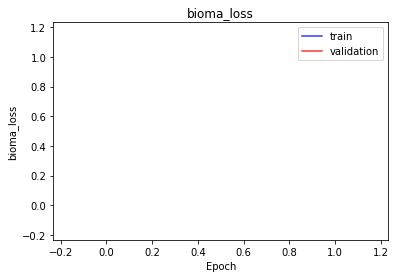

<b>domain_loss</b>: 155390.7188 (min: 153570.8750, max: 157210.5469)

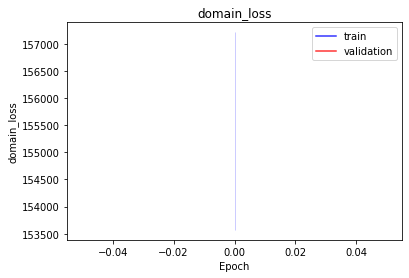

<b>latent_loss</b>: nan (min: nan, max: nan)

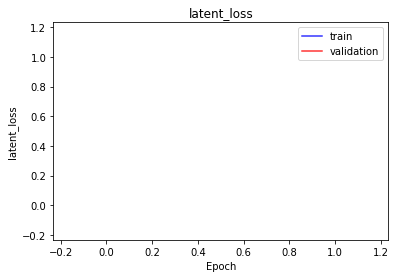

<b>bioma_mse</b>: nan (min: nan, max: nan)

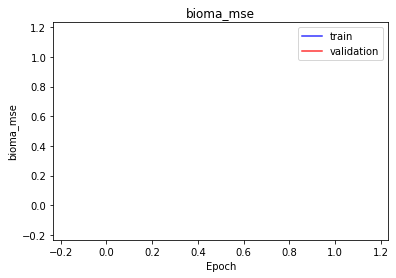

<b>bioma_mae</b>: nan (min: nan, max: nan)

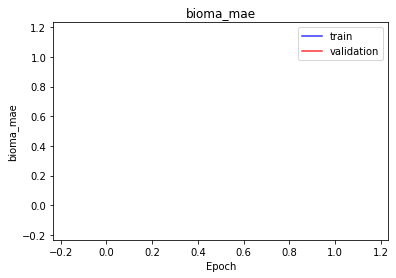

<b>bioma_mape</b>: nan (min: nan, max: nan)

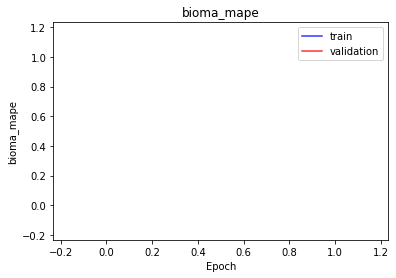

<b>domain_mse</b>: nan (min: nan, max: nan)

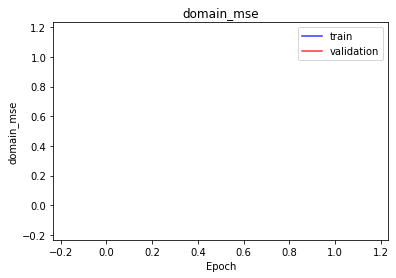

<b>domain_mae</b>: nan (min: nan, max: nan)

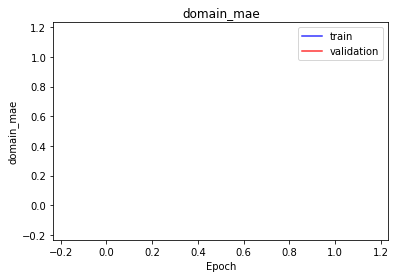

<b>domain_mape</b>: nan (min: nan, max: nan)

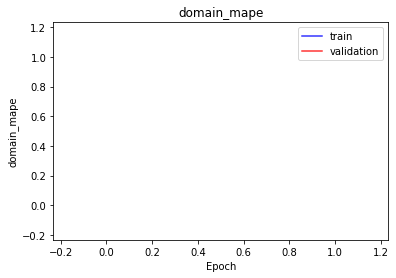

<b>latent_mae</b>: nan (min: nan, max: nan)

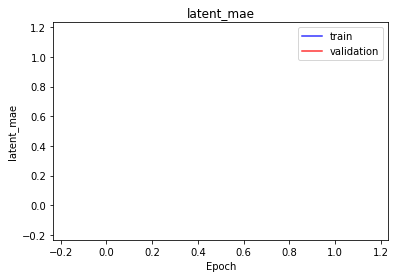

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

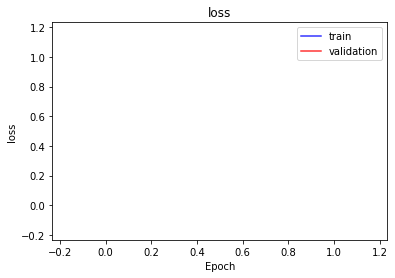

<b>bioma_loss</b>: nan (min: nan, max: nan)

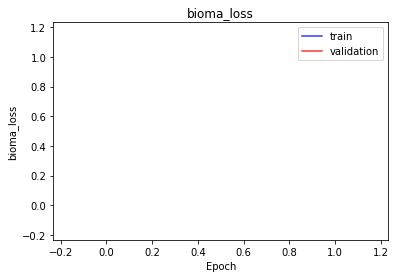

<b>domain_loss</b>: 154663.2188 (min: 153350.3750, max: 155976.0781)

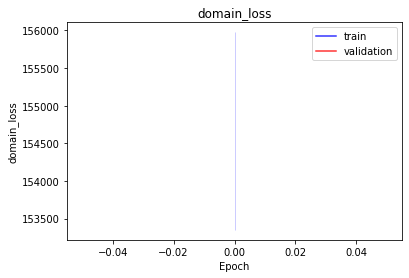

<b>latent_loss</b>: nan (min: nan, max: nan)

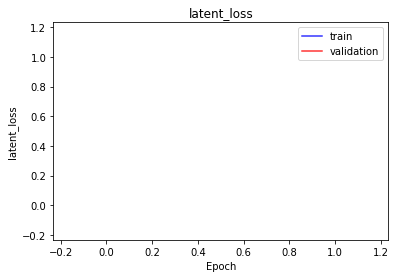

<b>bioma_mse</b>: nan (min: nan, max: nan)

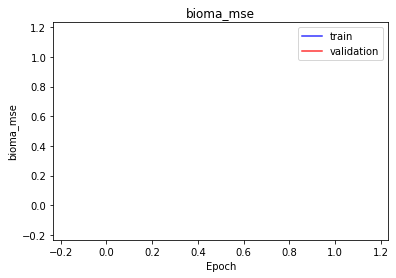

<b>bioma_mae</b>: nan (min: nan, max: nan)

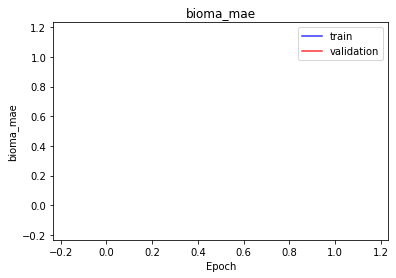

<b>bioma_mape</b>: nan (min: nan, max: nan)

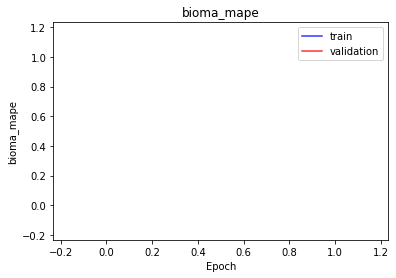

<b>domain_mse</b>: nan (min: nan, max: nan)

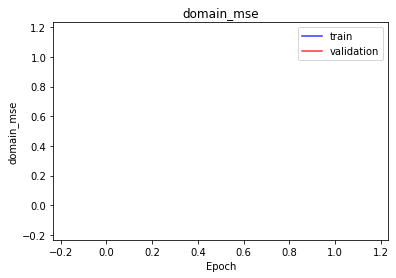

<b>domain_mae</b>: nan (min: nan, max: nan)

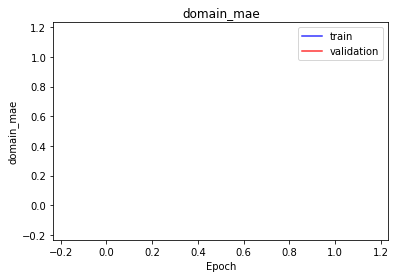

<b>domain_mape</b>: nan (min: nan, max: nan)

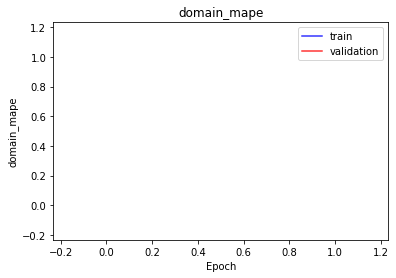

<b>latent_mae</b>: nan (min: nan, max: nan)

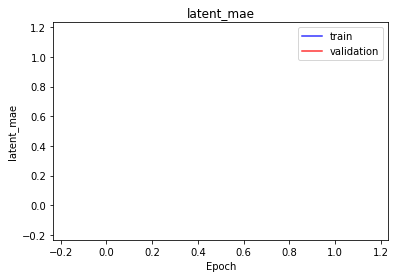

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

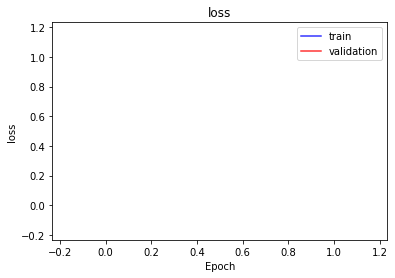

<b>bioma_loss</b>: nan (min: nan, max: nan)

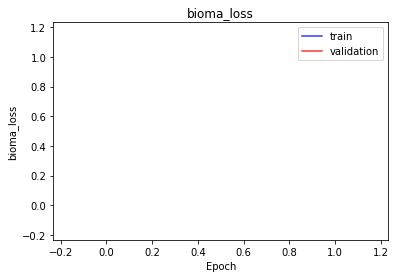

<b>domain_loss</b>: 155451.6250 (min: 153327.5312, max: 157575.7031)

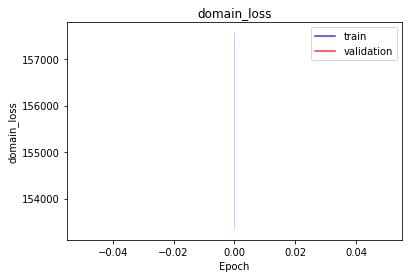

<b>latent_loss</b>: nan (min: nan, max: nan)

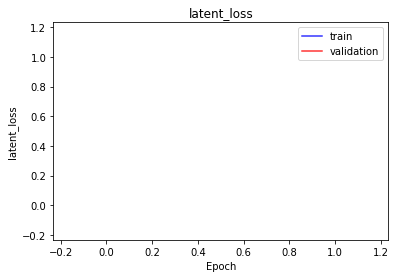

<b>bioma_mse</b>: nan (min: nan, max: nan)

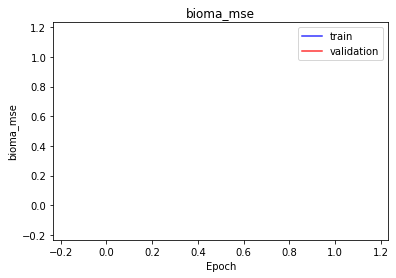

<b>bioma_mae</b>: nan (min: nan, max: nan)

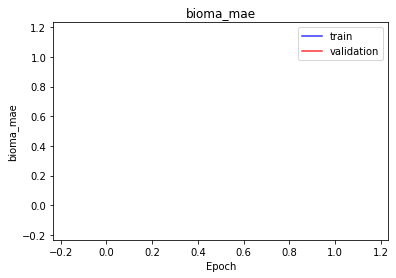

<b>bioma_mape</b>: nan (min: nan, max: nan)

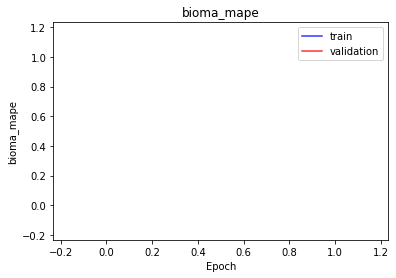

<b>domain_mse</b>: nan (min: nan, max: nan)

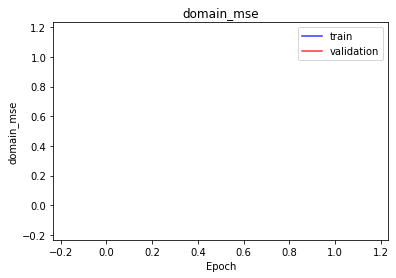

<b>domain_mae</b>: nan (min: nan, max: nan)

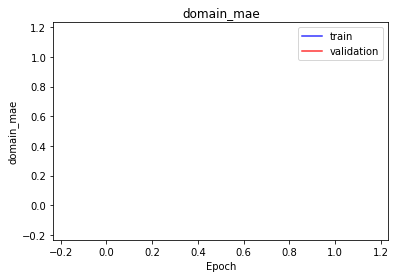

<b>domain_mape</b>: nan (min: nan, max: nan)

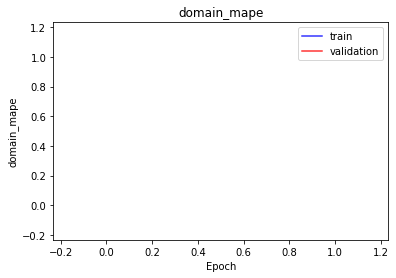

<b>latent_mae</b>: nan (min: nan, max: nan)

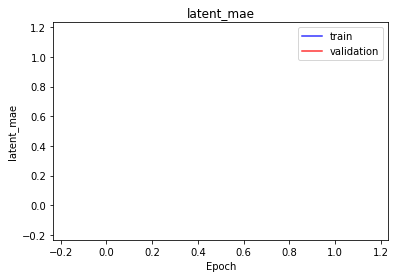

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

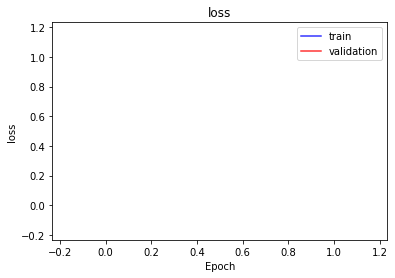

<b>bioma_loss</b>: nan (min: nan, max: nan)

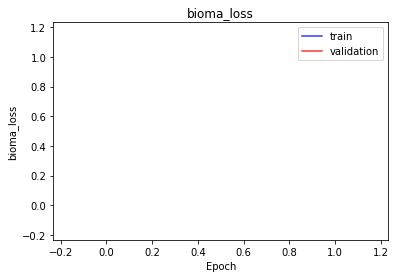

<b>domain_loss</b>: 159763.6719 (min: 157786.7969, max: 161740.5469)

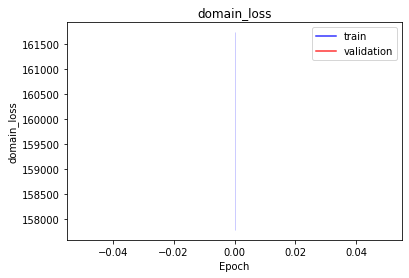

<b>latent_loss</b>: nan (min: nan, max: nan)

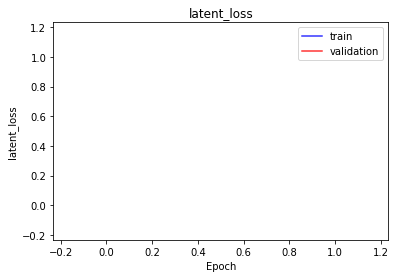

<b>bioma_mse</b>: nan (min: nan, max: nan)

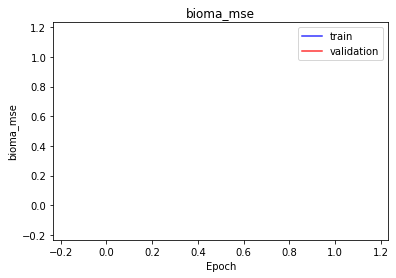

<b>bioma_mae</b>: nan (min: nan, max: nan)

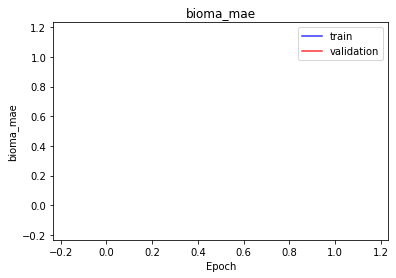

<b>bioma_mape</b>: nan (min: nan, max: nan)

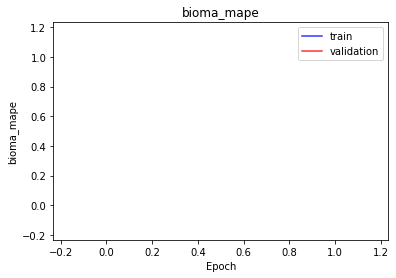

<b>domain_mse</b>: nan (min: nan, max: nan)

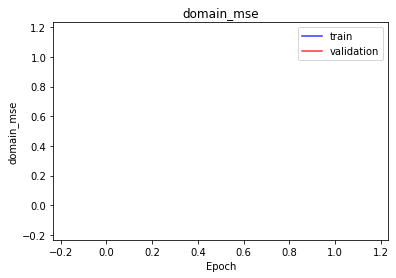

<b>domain_mae</b>: nan (min: nan, max: nan)

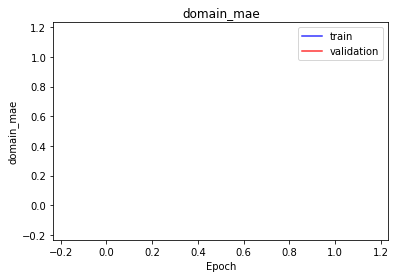

<b>domain_mape</b>: nan (min: nan, max: nan)

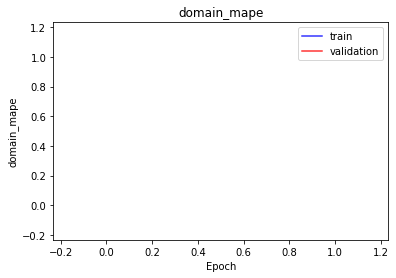

<b>latent_mae</b>: nan (min: nan, max: nan)

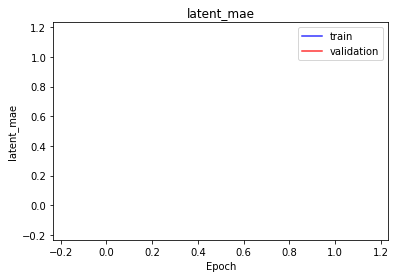

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

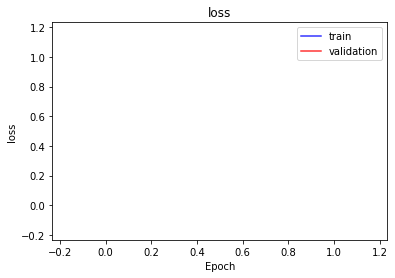

<b>bioma_loss</b>: nan (min: nan, max: nan)

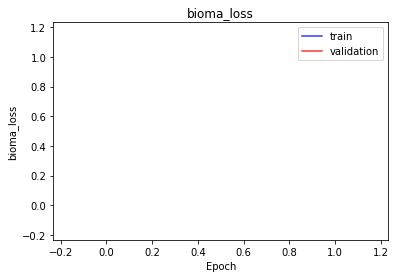

<b>domain_loss</b>: 160218.3594 (min: 159146.1250, max: 161290.5938)

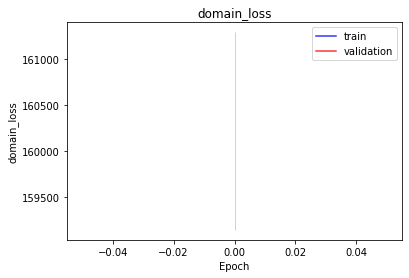

<b>latent_loss</b>: nan (min: nan, max: nan)

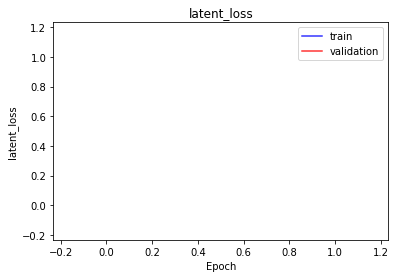

<b>bioma_mse</b>: nan (min: nan, max: nan)

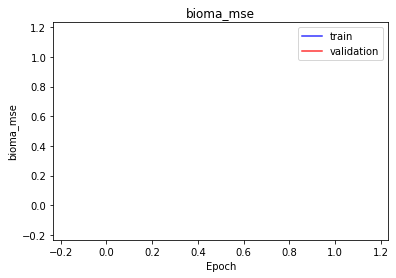

<b>bioma_mae</b>: nan (min: nan, max: nan)

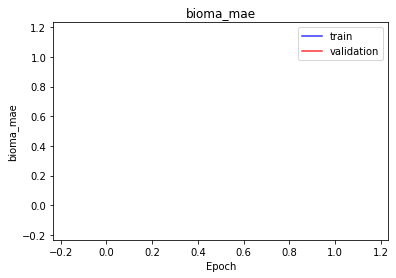

<b>bioma_mape</b>: nan (min: nan, max: nan)

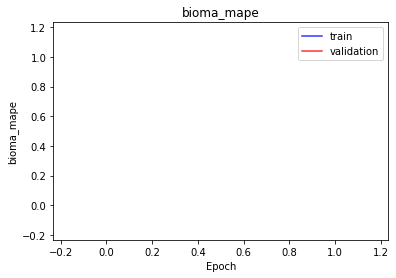

<b>domain_mse</b>: nan (min: nan, max: nan)

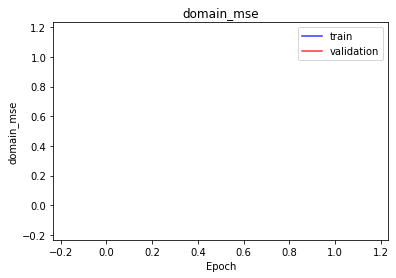

<b>domain_mae</b>: nan (min: nan, max: nan)

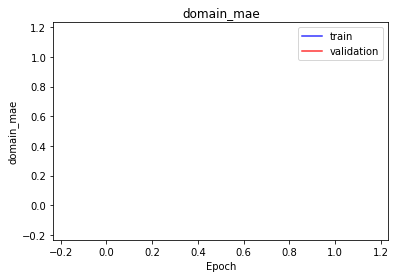

<b>domain_mape</b>: nan (min: nan, max: nan)

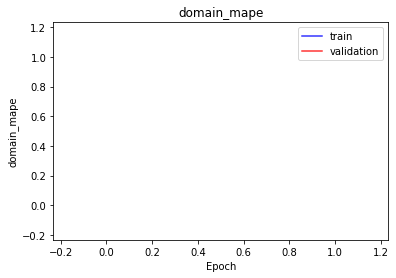

<b>latent_mae</b>: nan (min: nan, max: nan)

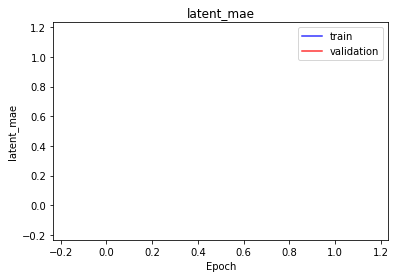

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

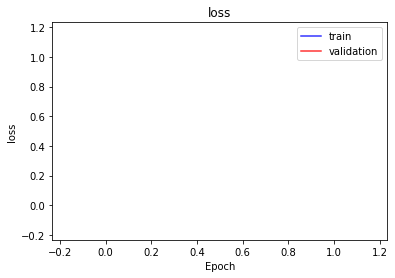

<b>bioma_loss</b>: nan (min: nan, max: nan)

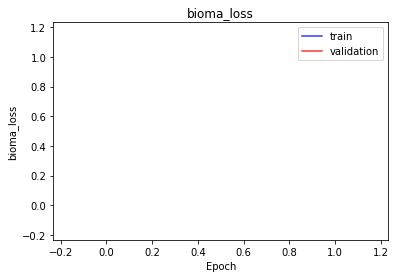

<b>domain_loss</b>: 154799.7656 (min: 154786.6406, max: 154812.8906)

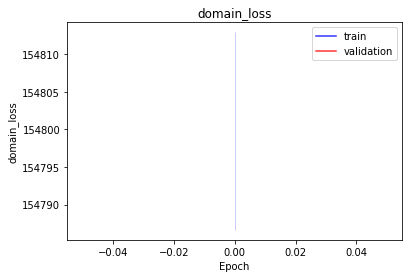

<b>latent_loss</b>: nan (min: nan, max: nan)

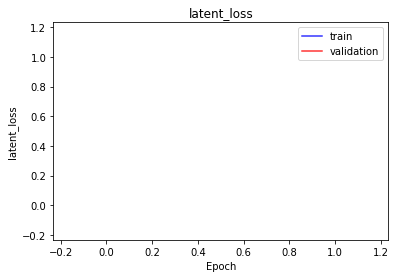

<b>bioma_mse</b>: nan (min: nan, max: nan)

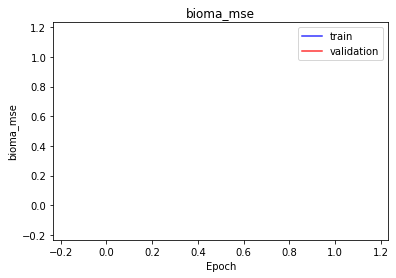

<b>bioma_mae</b>: nan (min: nan, max: nan)

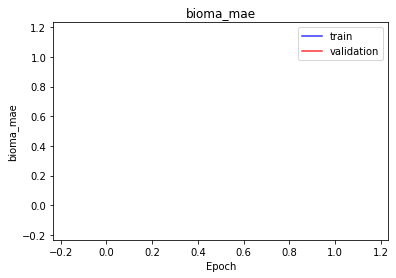

<b>bioma_mape</b>: nan (min: nan, max: nan)

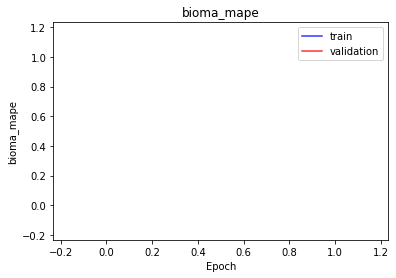

<b>domain_mse</b>: nan (min: nan, max: nan)

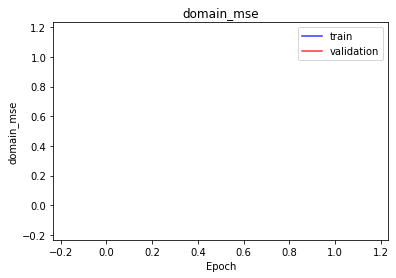

<b>domain_mae</b>: nan (min: nan, max: nan)

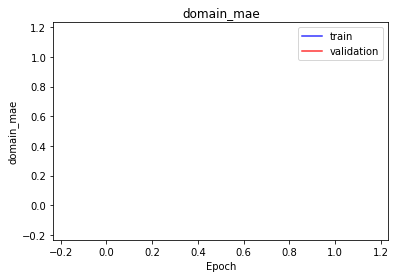

<b>domain_mape</b>: nan (min: nan, max: nan)

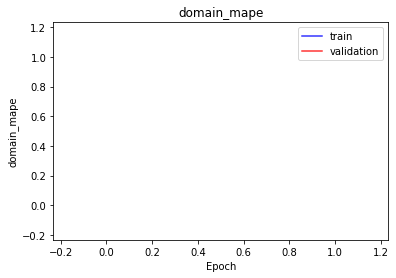

<b>latent_mae</b>: nan (min: nan, max: nan)

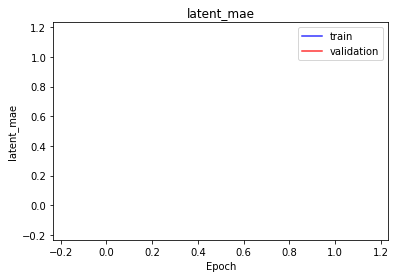

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

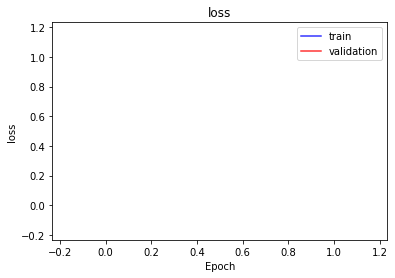

<b>bioma_loss</b>: nan (min: nan, max: nan)

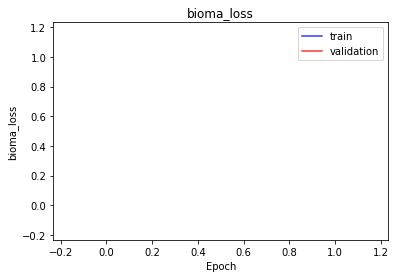

<b>domain_loss</b>: 155174.0625 (min: 152621.0469, max: 157727.0625)

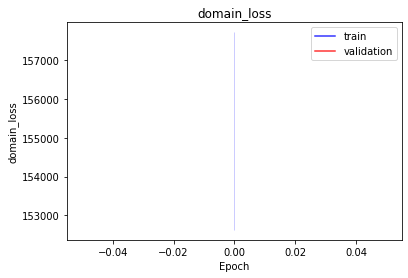

<b>latent_loss</b>: nan (min: nan, max: nan)

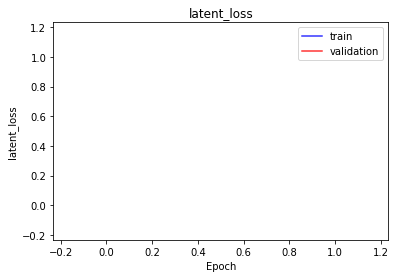

<b>bioma_mse</b>: nan (min: nan, max: nan)

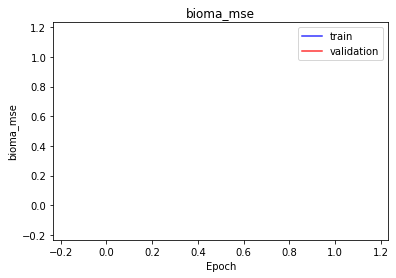

<b>bioma_mae</b>: nan (min: nan, max: nan)

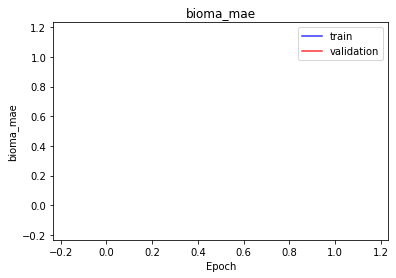

<b>bioma_mape</b>: nan (min: nan, max: nan)

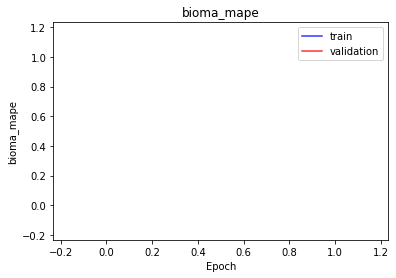

<b>domain_mse</b>: nan (min: nan, max: nan)

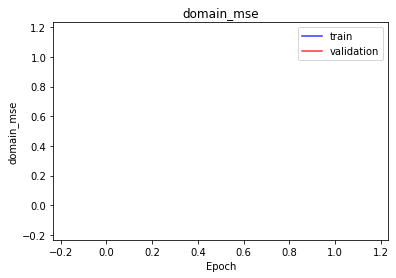

<b>domain_mae</b>: nan (min: nan, max: nan)

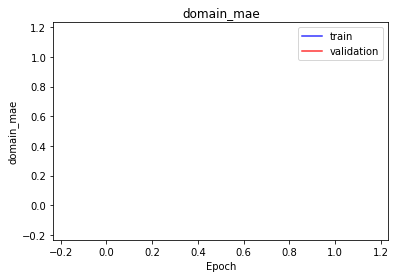

<b>domain_mape</b>: nan (min: nan, max: nan)

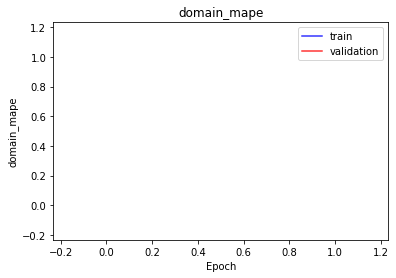

<b>latent_mae</b>: nan (min: nan, max: nan)

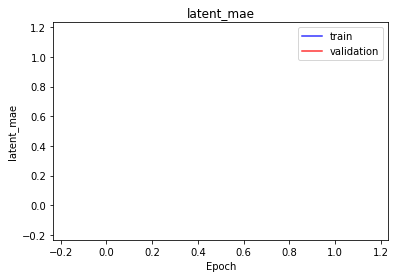

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

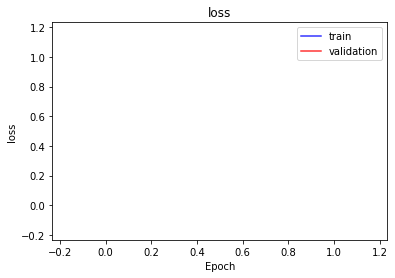

<b>bioma_loss</b>: nan (min: nan, max: nan)

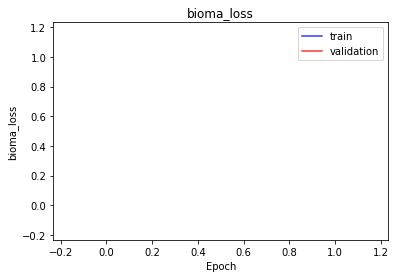

<b>domain_loss</b>: 154903.0000 (min: 152347.0625, max: 157458.9375)

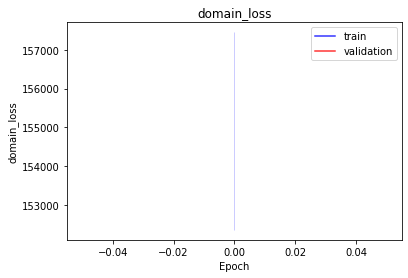

<b>latent_loss</b>: nan (min: nan, max: nan)

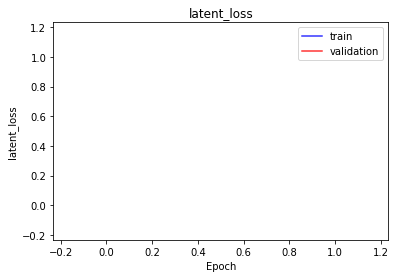

<b>bioma_mse</b>: nan (min: nan, max: nan)

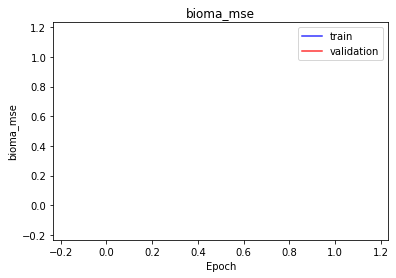

<b>bioma_mae</b>: nan (min: nan, max: nan)

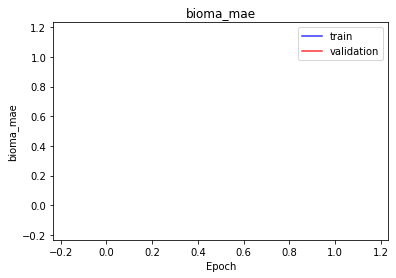

<b>bioma_mape</b>: nan (min: nan, max: nan)

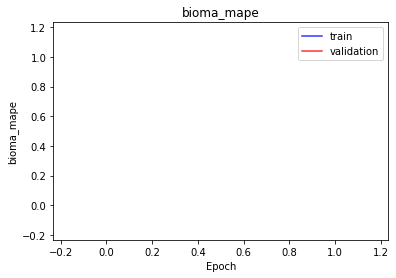

<b>domain_mse</b>: nan (min: nan, max: nan)

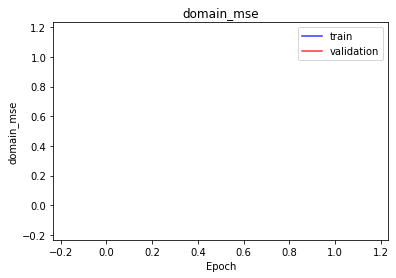

<b>domain_mae</b>: nan (min: nan, max: nan)

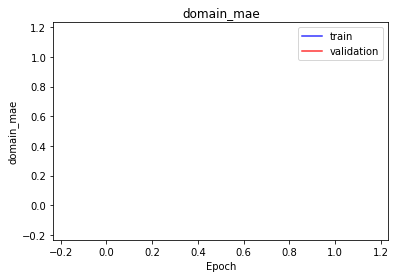

<b>domain_mape</b>: nan (min: nan, max: nan)

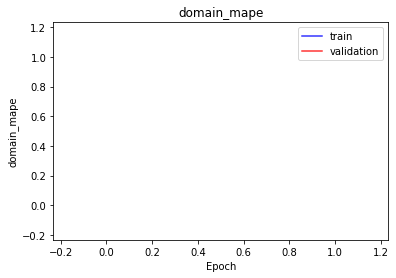

<b>latent_mae</b>: nan (min: nan, max: nan)

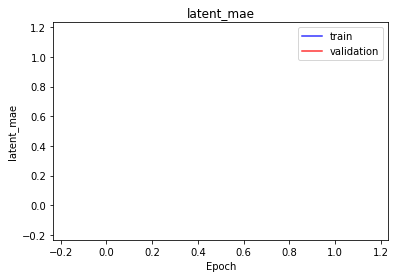

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

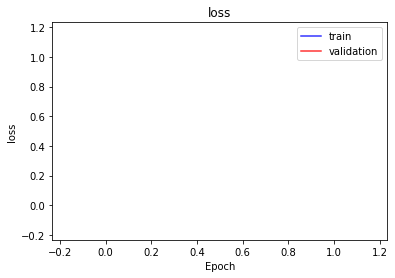

<b>bioma_loss</b>: nan (min: nan, max: nan)

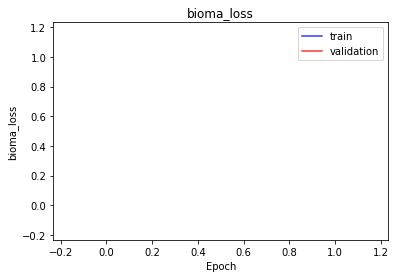

<b>domain_loss</b>: 155477.6250 (min: 154323.8125, max: 156631.4531)

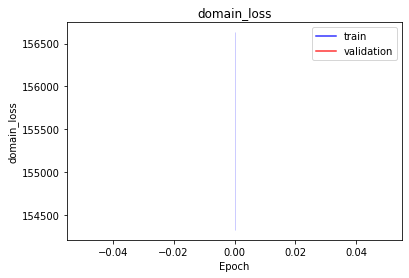

<b>latent_loss</b>: nan (min: nan, max: nan)

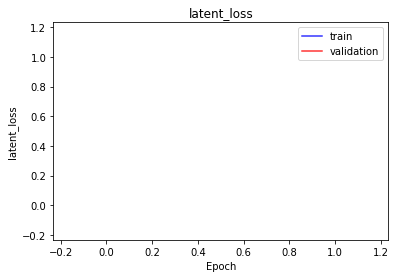

<b>bioma_mse</b>: nan (min: nan, max: nan)

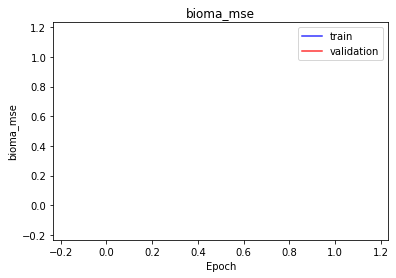

<b>bioma_mae</b>: nan (min: nan, max: nan)

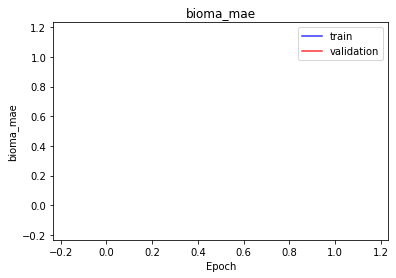

<b>bioma_mape</b>: nan (min: nan, max: nan)

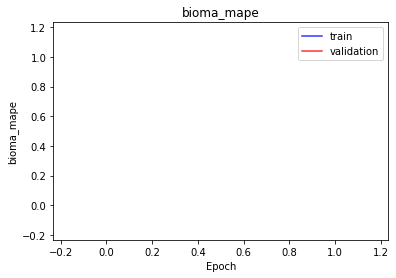

<b>domain_mse</b>: nan (min: nan, max: nan)

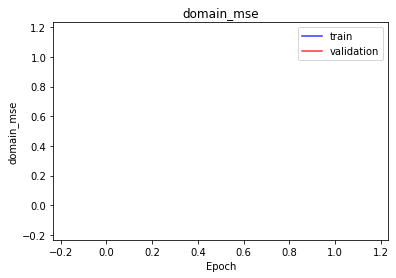

<b>domain_mae</b>: nan (min: nan, max: nan)

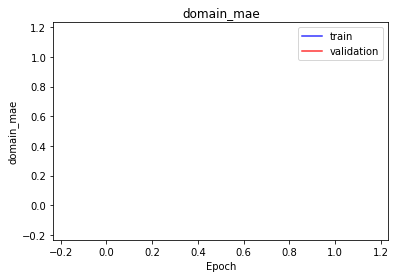

<b>domain_mape</b>: nan (min: nan, max: nan)

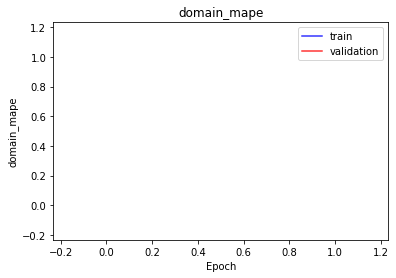

<b>latent_mae</b>: nan (min: nan, max: nan)

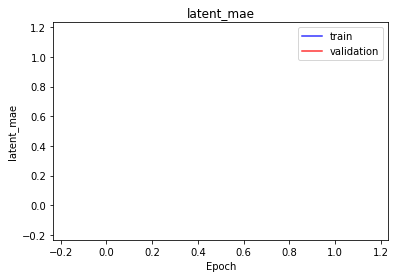

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

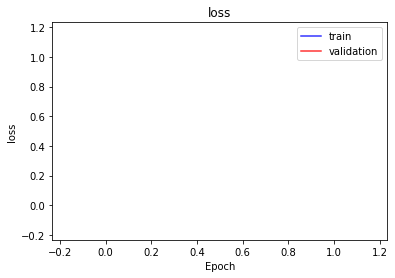

<b>bioma_loss</b>: nan (min: nan, max: nan)

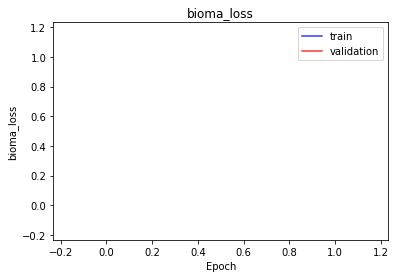

<b>domain_loss</b>: 159314.2188 (min: 153561.7812, max: 165066.6562)

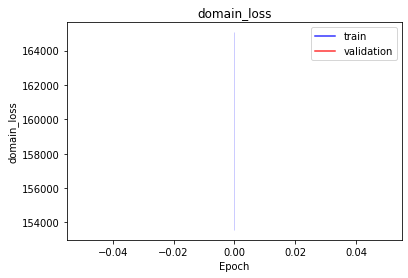

<b>latent_loss</b>: nan (min: nan, max: nan)

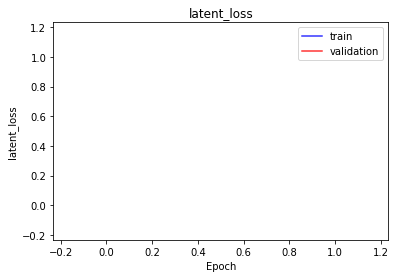

<b>bioma_mse</b>: nan (min: nan, max: nan)

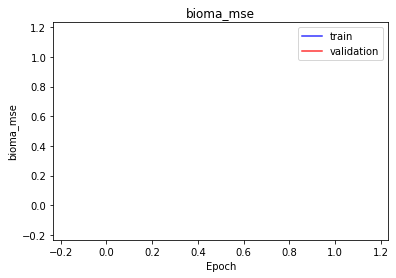

<b>bioma_mae</b>: nan (min: nan, max: nan)

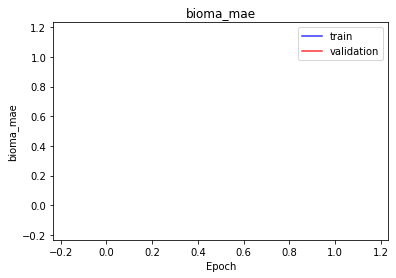

<b>bioma_mape</b>: nan (min: nan, max: nan)

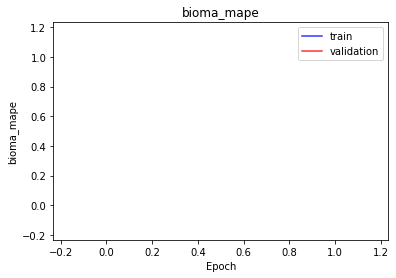

<b>domain_mse</b>: nan (min: nan, max: nan)

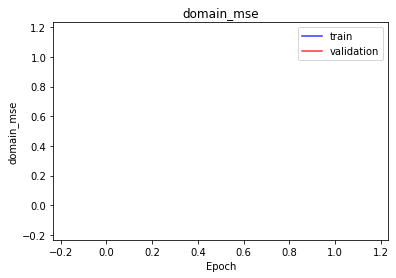

<b>domain_mae</b>: nan (min: nan, max: nan)

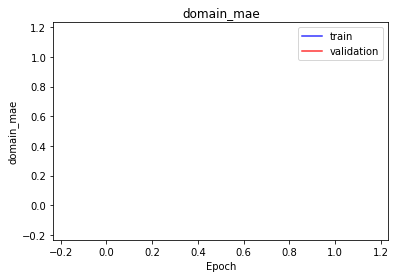

<b>domain_mape</b>: nan (min: nan, max: nan)

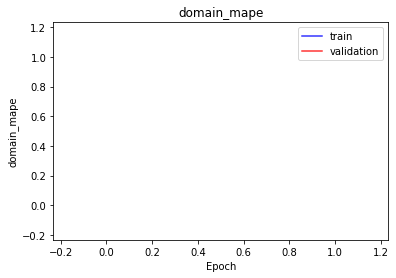

<b>latent_mae</b>: nan (min: nan, max: nan)

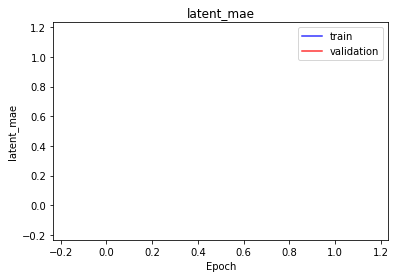

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 256 -> 10 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 10 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

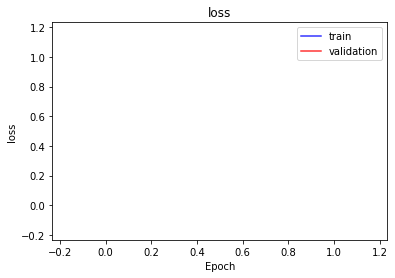

<b>bioma_loss</b>: nan (min: nan, max: nan)

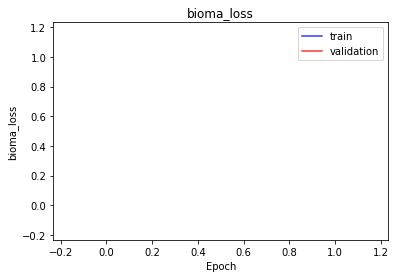

<b>domain_loss</b>: 154238.5312 (min: 153700.9688, max: 154776.0938)

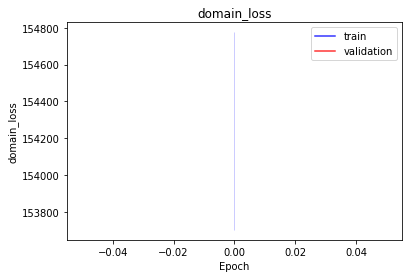

<b>latent_loss</b>: nan (min: nan, max: nan)

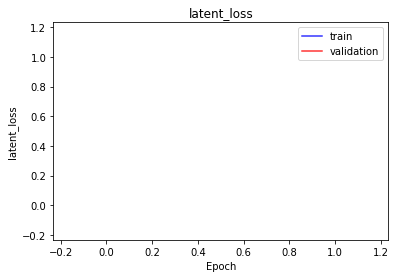

<b>bioma_mse</b>: nan (min: nan, max: nan)

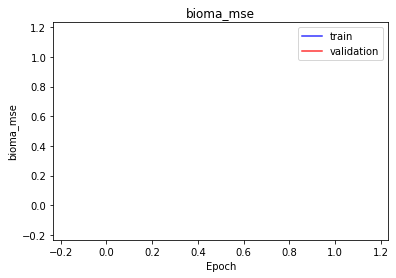

<b>bioma_mae</b>: nan (min: nan, max: nan)

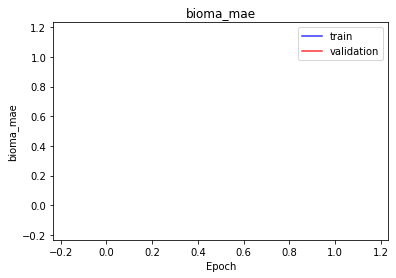

<b>bioma_mape</b>: nan (min: nan, max: nan)

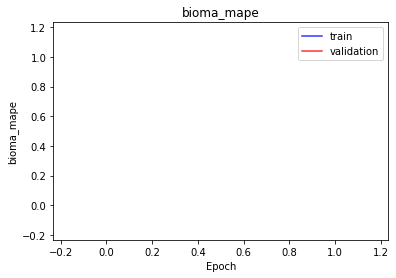

<b>domain_mse</b>: nan (min: nan, max: nan)

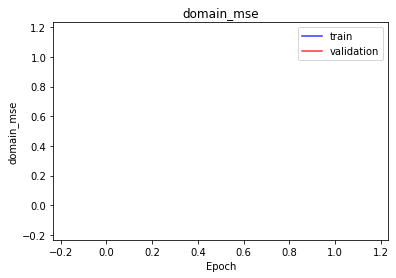

<b>domain_mae</b>: nan (min: nan, max: nan)

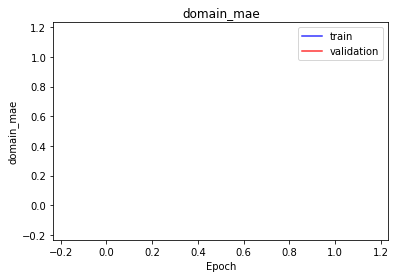

<b>domain_mape</b>: nan (min: nan, max: nan)

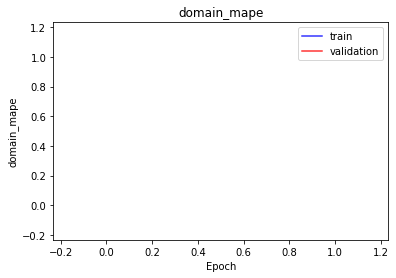

<b>latent_mae</b>: nan (min: nan, max: nan)

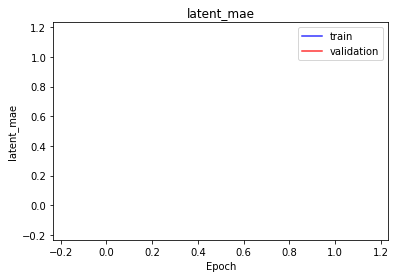

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

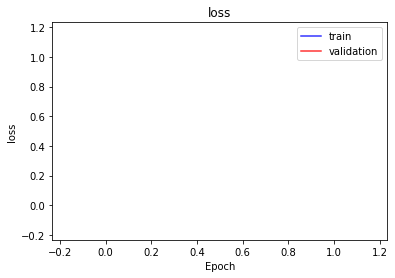

<b>bioma_loss</b>: nan (min: nan, max: nan)

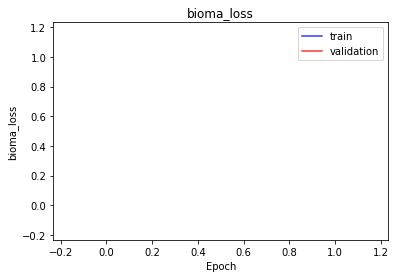

<b>domain_loss</b>: 156237.3906 (min: 153203.0312, max: 159271.7500)

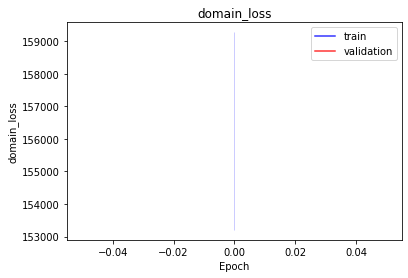

<b>latent_loss</b>: nan (min: nan, max: nan)

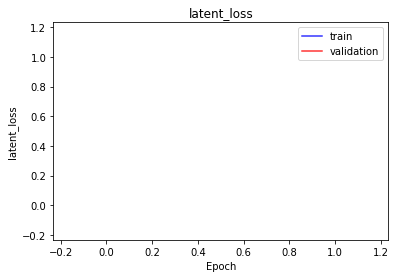

<b>bioma_mse</b>: nan (min: nan, max: nan)

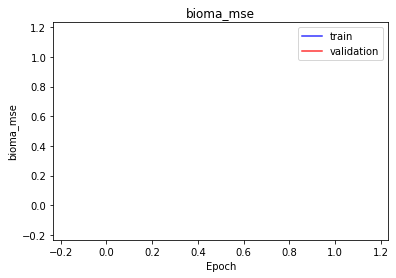

<b>bioma_mae</b>: nan (min: nan, max: nan)

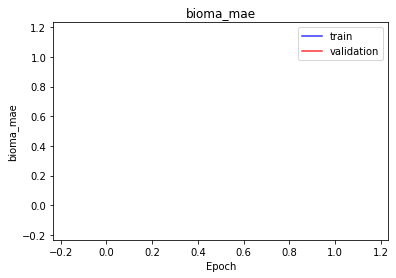

<b>bioma_mape</b>: nan (min: nan, max: nan)

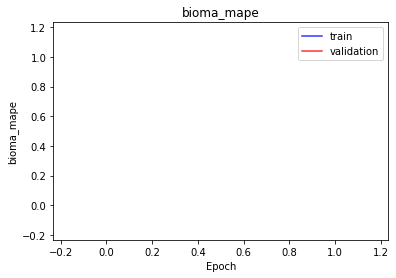

<b>domain_mse</b>: nan (min: nan, max: nan)

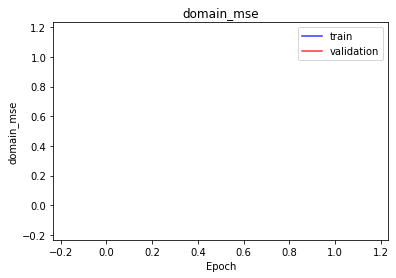

<b>domain_mae</b>: nan (min: nan, max: nan)

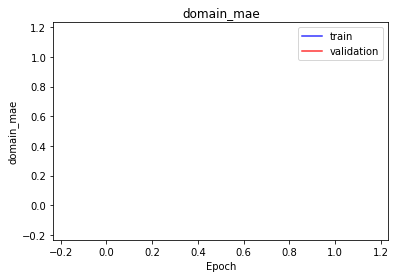

<b>domain_mape</b>: nan (min: nan, max: nan)

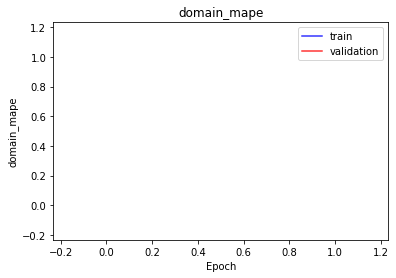

<b>latent_mae</b>: nan (min: nan, max: nan)

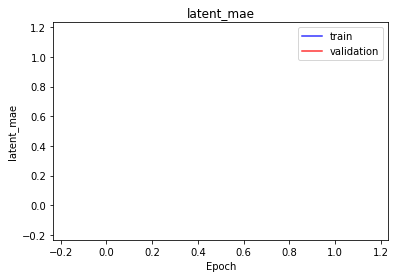

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

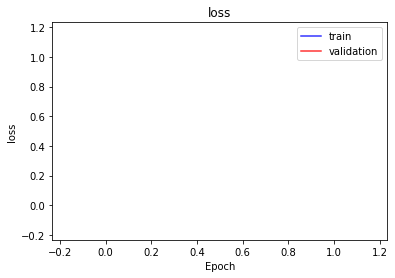

<b>bioma_loss</b>: nan (min: nan, max: nan)

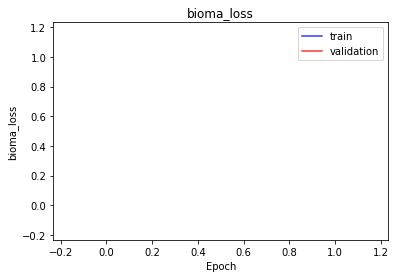

<b>domain_loss</b>: 155278.2500 (min: 152341.6562, max: 158214.8438)

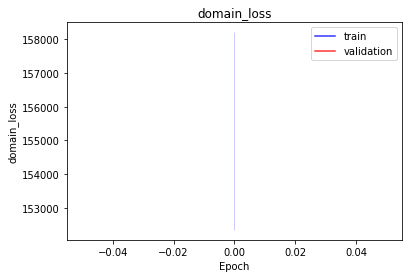

<b>latent_loss</b>: nan (min: nan, max: nan)

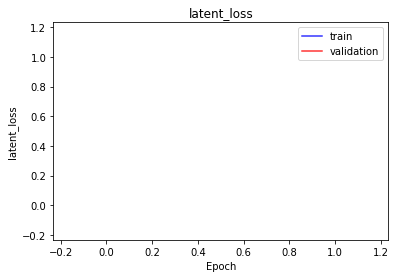

<b>bioma_mse</b>: nan (min: nan, max: nan)

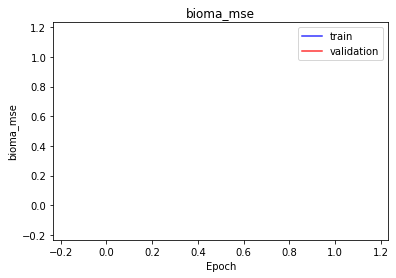

<b>bioma_mae</b>: nan (min: nan, max: nan)

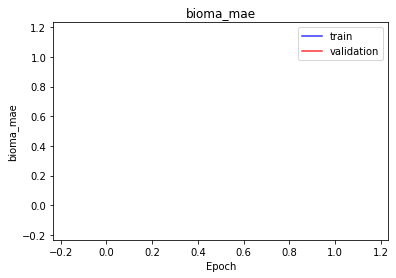

<b>bioma_mape</b>: nan (min: nan, max: nan)

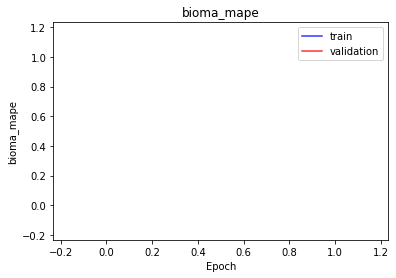

<b>domain_mse</b>: nan (min: nan, max: nan)

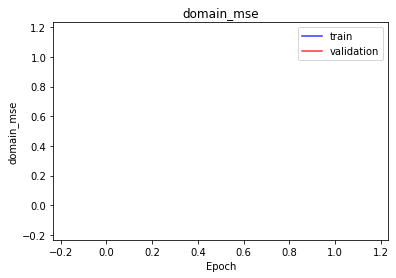

<b>domain_mae</b>: nan (min: nan, max: nan)

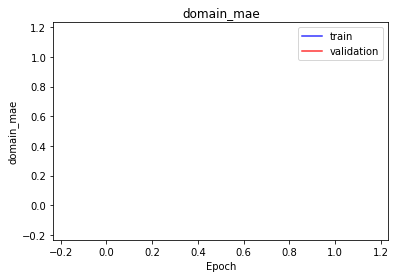

<b>domain_mape</b>: nan (min: nan, max: nan)

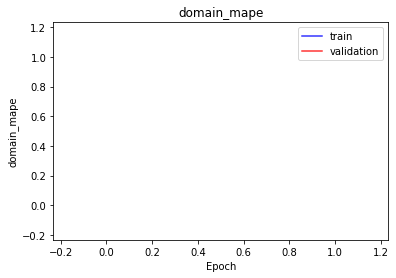

<b>latent_mae</b>: nan (min: nan, max: nan)

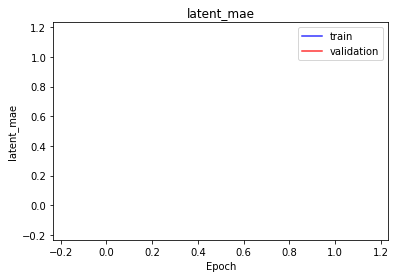

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

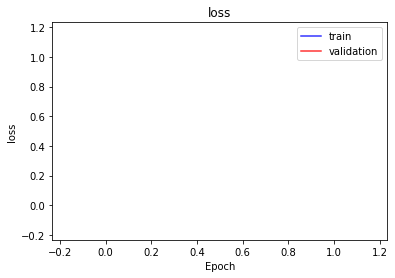

<b>bioma_loss</b>: nan (min: nan, max: nan)

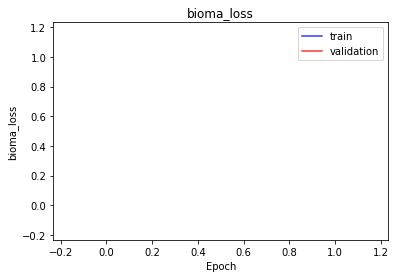

<b>domain_loss</b>: 155019.6250 (min: 151832.3438, max: 158206.9062)

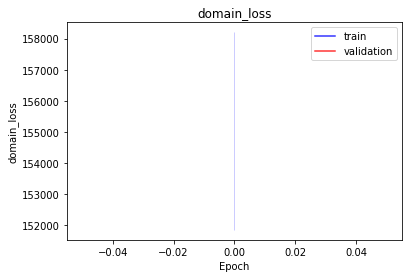

<b>latent_loss</b>: nan (min: nan, max: nan)

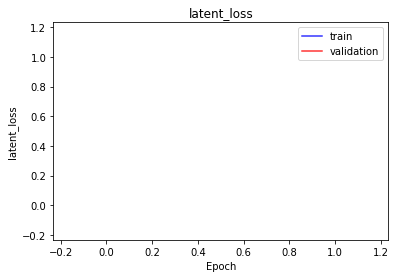

<b>bioma_mse</b>: nan (min: nan, max: nan)

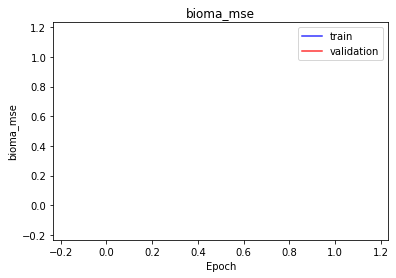

<b>bioma_mae</b>: nan (min: nan, max: nan)

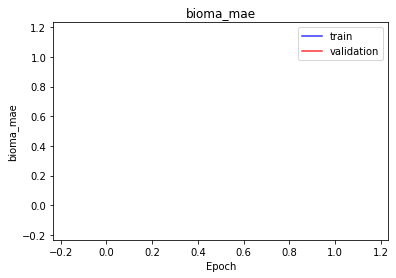

<b>bioma_mape</b>: nan (min: nan, max: nan)

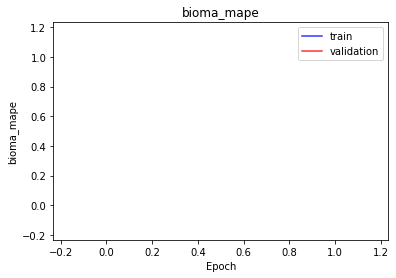

<b>domain_mse</b>: nan (min: nan, max: nan)

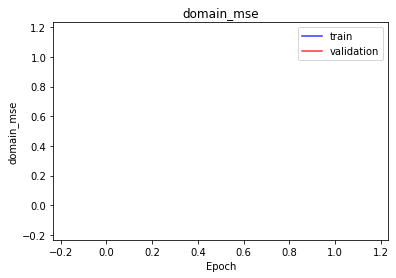

<b>domain_mae</b>: nan (min: nan, max: nan)

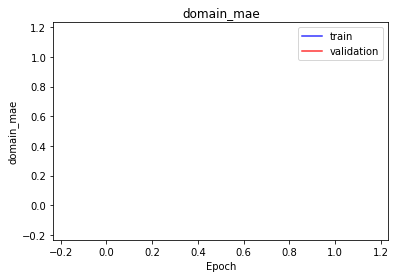

<b>domain_mape</b>: nan (min: nan, max: nan)

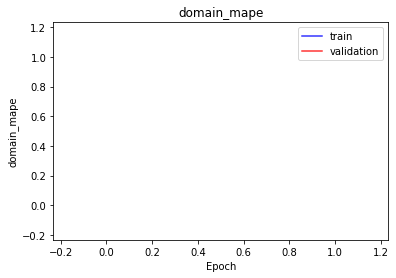

<b>latent_mae</b>: nan (min: nan, max: nan)

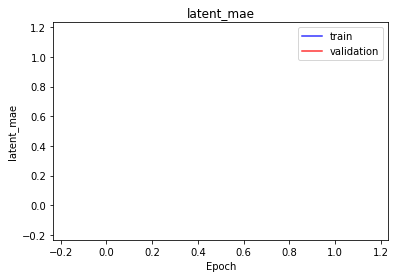

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

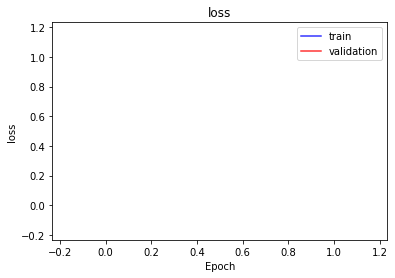

<b>bioma_loss</b>: nan (min: nan, max: nan)

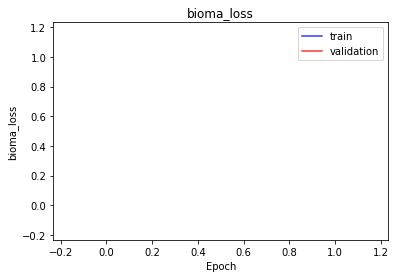

<b>domain_loss</b>: 155294.4688 (min: 154138.1406, max: 156450.7969)

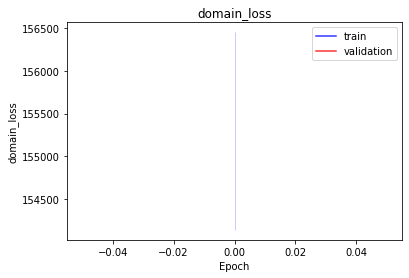

<b>latent_loss</b>: nan (min: nan, max: nan)

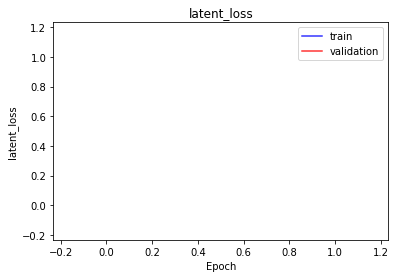

<b>bioma_mse</b>: nan (min: nan, max: nan)

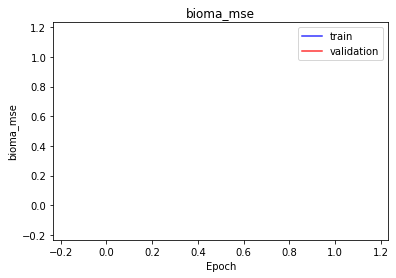

<b>bioma_mae</b>: nan (min: nan, max: nan)

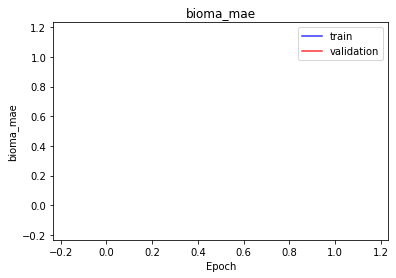

<b>bioma_mape</b>: nan (min: nan, max: nan)

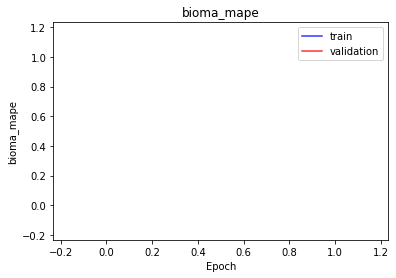

<b>domain_mse</b>: nan (min: nan, max: nan)

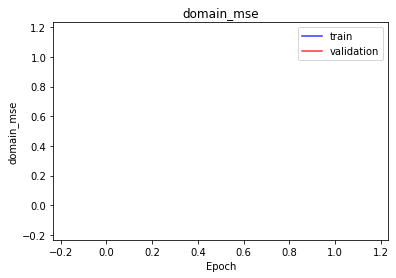

<b>domain_mae</b>: nan (min: nan, max: nan)

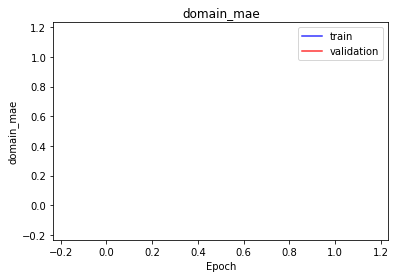

<b>domain_mape</b>: nan (min: nan, max: nan)

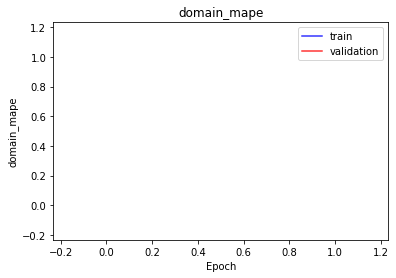

<b>latent_mae</b>: nan (min: nan, max: nan)

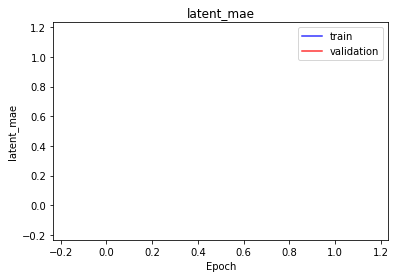

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

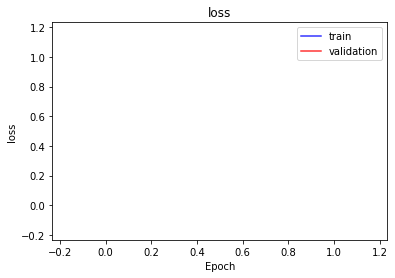

<b>bioma_loss</b>: nan (min: nan, max: nan)

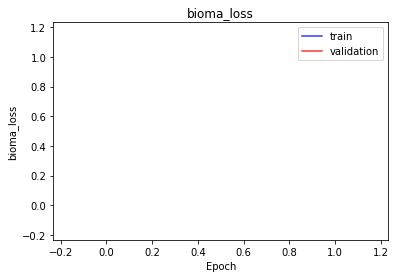

<b>domain_loss</b>: 153806.0000 (min: 152295.9688, max: 155316.0469)

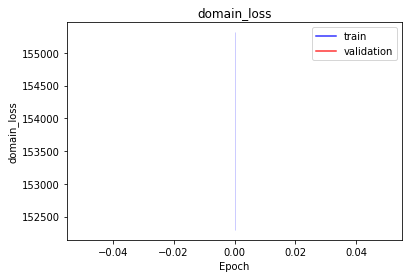

<b>latent_loss</b>: nan (min: nan, max: nan)

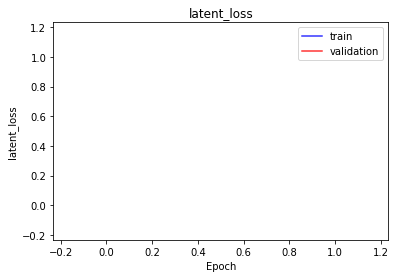

<b>bioma_mse</b>: nan (min: nan, max: nan)

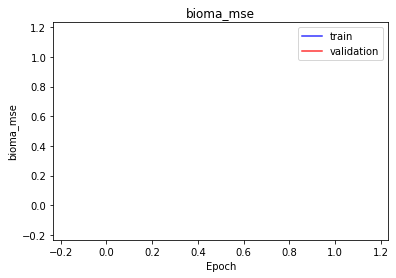

<b>bioma_mae</b>: nan (min: nan, max: nan)

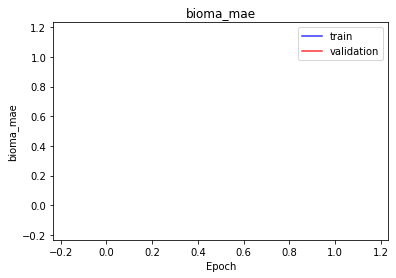

<b>bioma_mape</b>: nan (min: nan, max: nan)

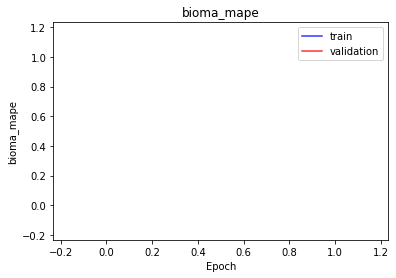

<b>domain_mse</b>: nan (min: nan, max: nan)

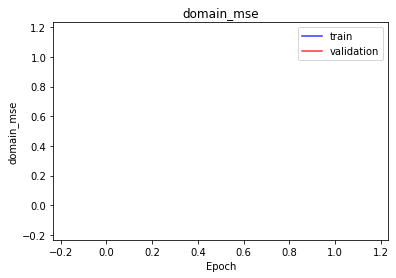

<b>domain_mae</b>: nan (min: nan, max: nan)

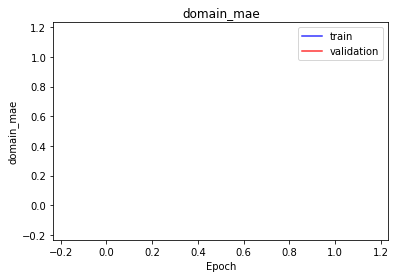

<b>domain_mape</b>: nan (min: nan, max: nan)

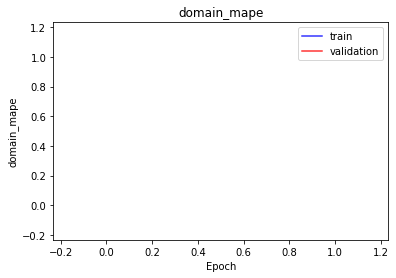

<b>latent_mae</b>: nan (min: nan, max: nan)

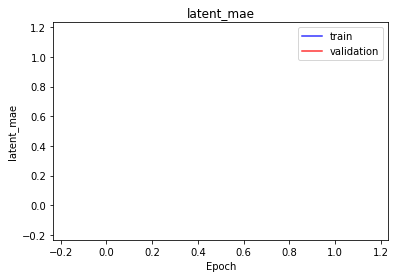

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 10 |
| Bioma Autoencoder | b -> 10 -> b |
| Domain Autoencoder | d -> 10 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

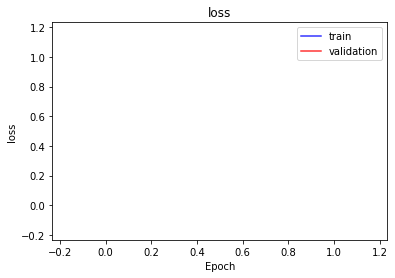

<b>bioma_loss</b>: nan (min: nan, max: nan)

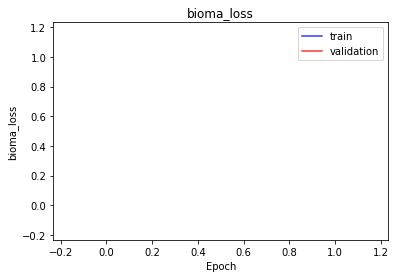

<b>domain_loss</b>: 156617.5000 (min: 154322.3438, max: 158912.6719)

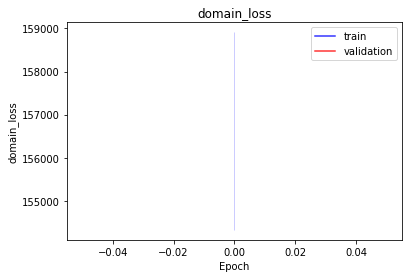

<b>latent_loss</b>: nan (min: nan, max: nan)

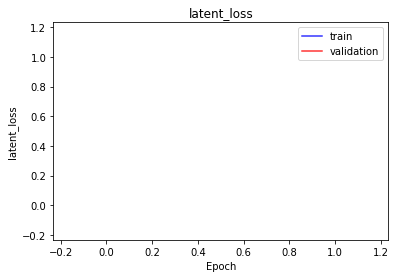

<b>bioma_mse</b>: nan (min: nan, max: nan)

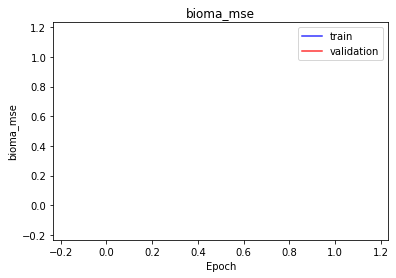

<b>bioma_mae</b>: nan (min: nan, max: nan)

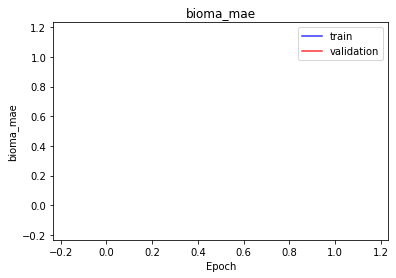

<b>bioma_mape</b>: nan (min: nan, max: nan)

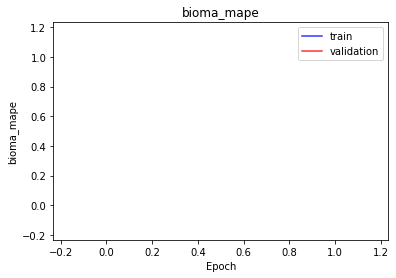

<b>domain_mse</b>: nan (min: nan, max: nan)

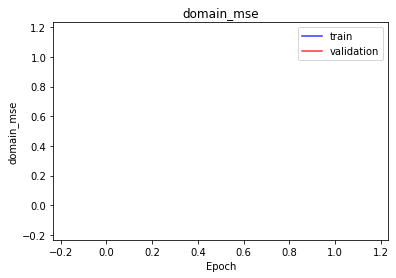

<b>domain_mae</b>: nan (min: nan, max: nan)

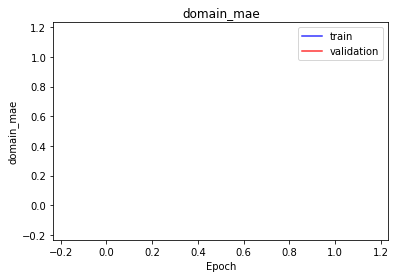

<b>domain_mape</b>: nan (min: nan, max: nan)

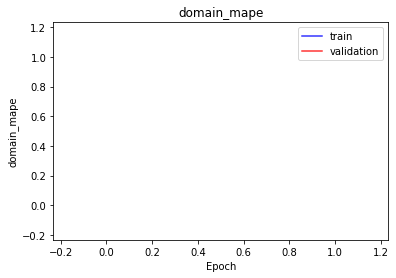

<b>latent_mae</b>: nan (min: nan, max: nan)

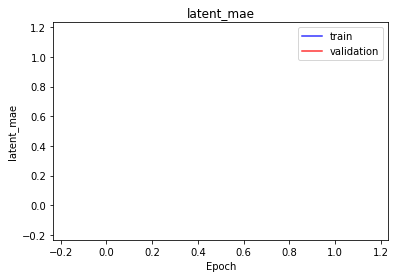

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

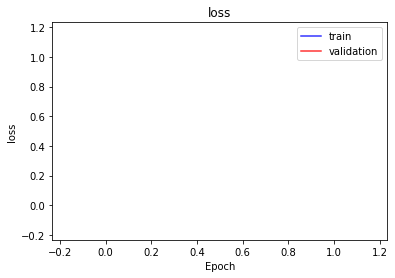

<b>bioma_loss</b>: nan (min: nan, max: nan)

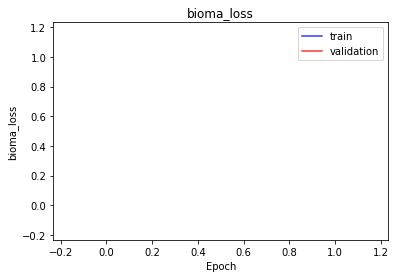

<b>domain_loss</b>: 156933.3750 (min: 154613.0469, max: 159253.7031)

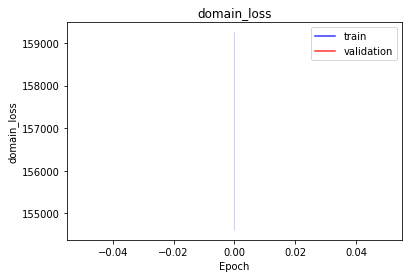

<b>latent_loss</b>: nan (min: nan, max: nan)

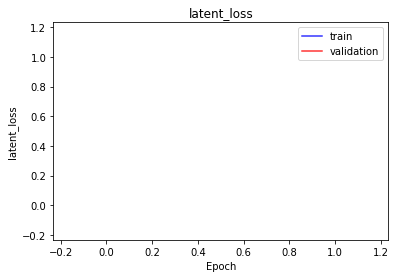

<b>bioma_mse</b>: nan (min: nan, max: nan)

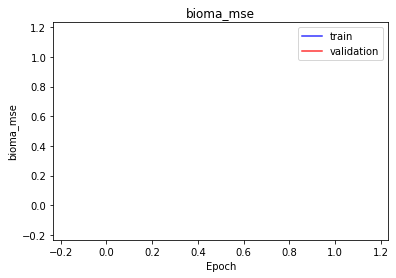

<b>bioma_mae</b>: nan (min: nan, max: nan)

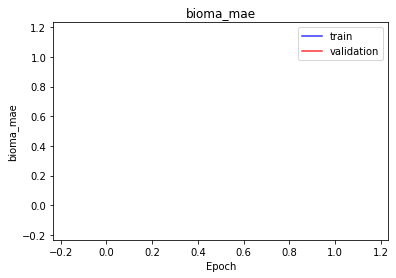

<b>bioma_mape</b>: nan (min: nan, max: nan)

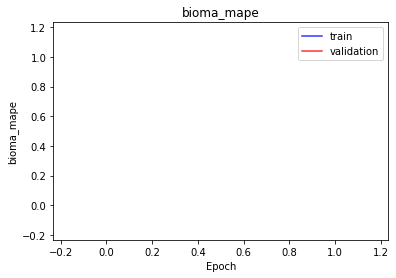

<b>domain_mse</b>: nan (min: nan, max: nan)

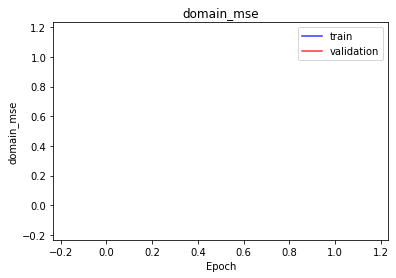

<b>domain_mae</b>: nan (min: nan, max: nan)

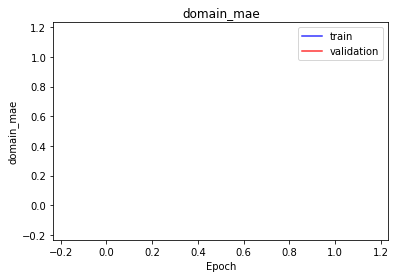

<b>domain_mape</b>: nan (min: nan, max: nan)

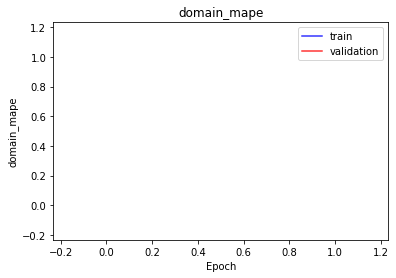

<b>latent_mae</b>: nan (min: nan, max: nan)

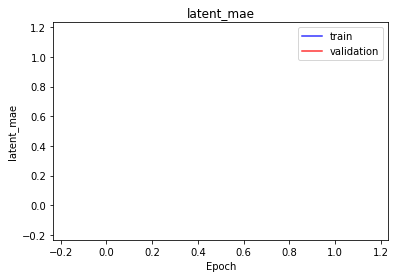

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

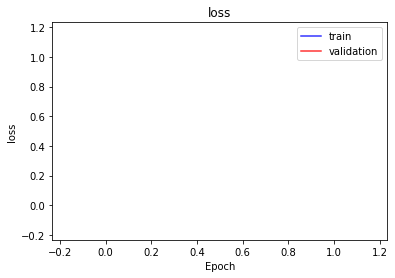

<b>bioma_loss</b>: nan (min: nan, max: nan)

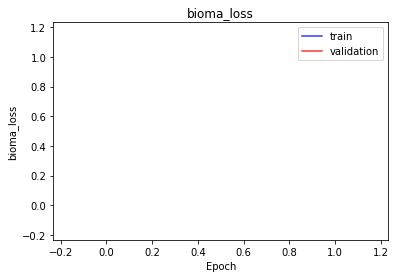

<b>domain_loss</b>: 155886.7500 (min: 151576.7656, max: 160196.7344)

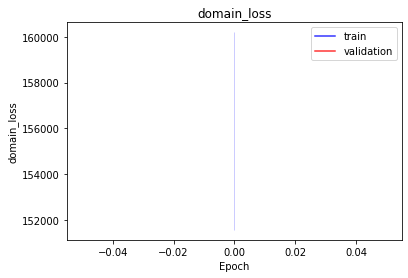

<b>latent_loss</b>: nan (min: nan, max: nan)

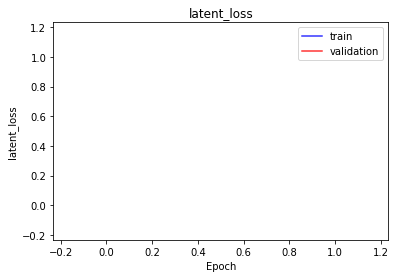

<b>bioma_mse</b>: nan (min: nan, max: nan)

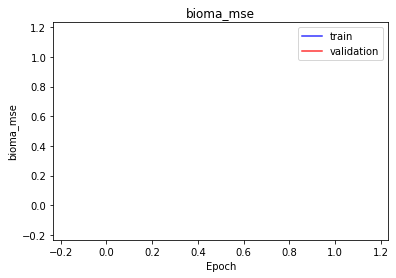

<b>bioma_mae</b>: nan (min: nan, max: nan)

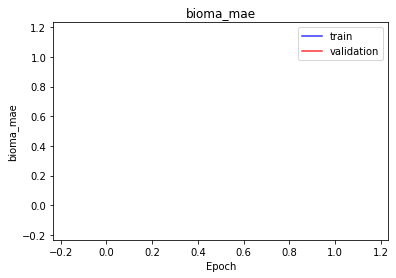

<b>bioma_mape</b>: nan (min: nan, max: nan)

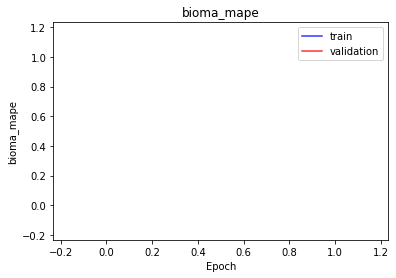

<b>domain_mse</b>: nan (min: nan, max: nan)

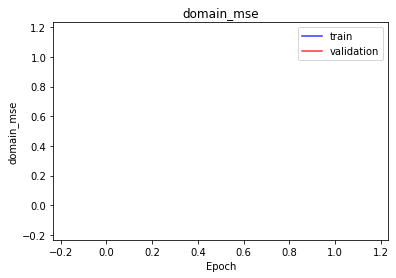

<b>domain_mae</b>: nan (min: nan, max: nan)

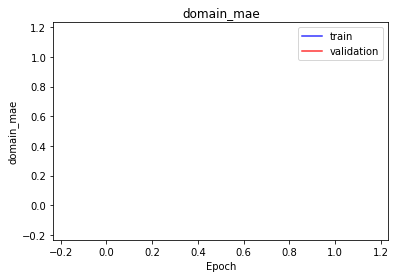

<b>domain_mape</b>: nan (min: nan, max: nan)

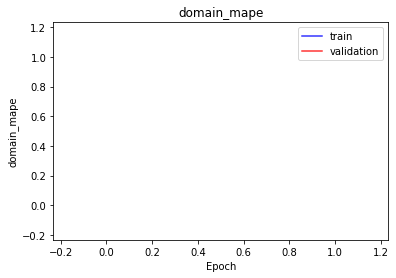

<b>latent_mae</b>: nan (min: nan, max: nan)

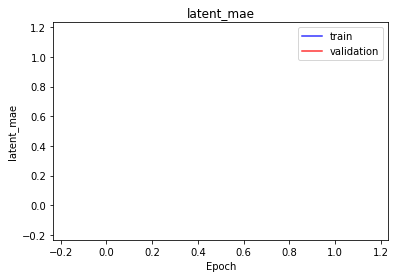

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

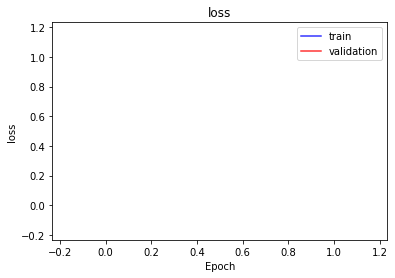

<b>bioma_loss</b>: nan (min: nan, max: nan)

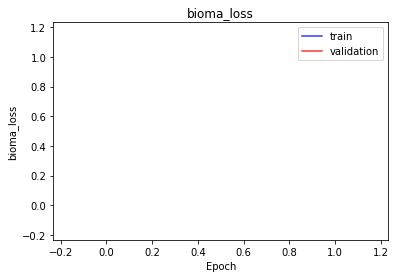

<b>domain_loss</b>: 155697.4062 (min: 155153.4219, max: 156241.3906)

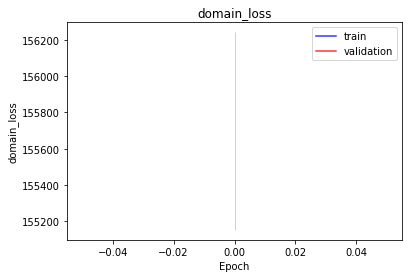

<b>latent_loss</b>: nan (min: nan, max: nan)

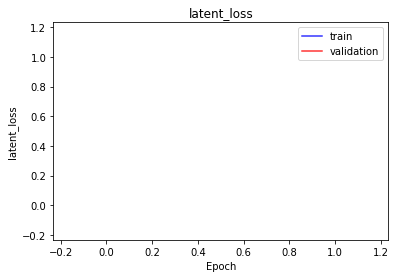

<b>bioma_mse</b>: nan (min: nan, max: nan)

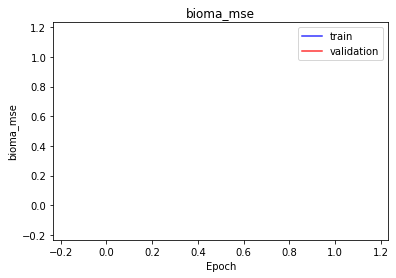

<b>bioma_mae</b>: nan (min: nan, max: nan)

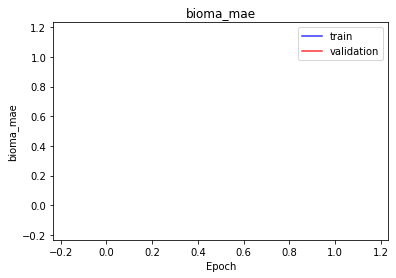

<b>bioma_mape</b>: nan (min: nan, max: nan)

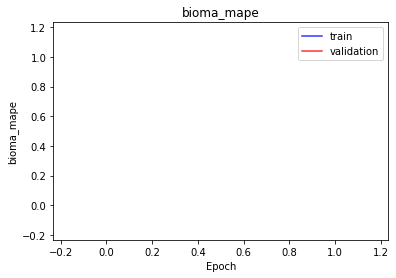

<b>domain_mse</b>: nan (min: nan, max: nan)

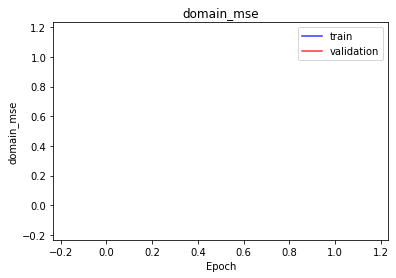

<b>domain_mae</b>: nan (min: nan, max: nan)

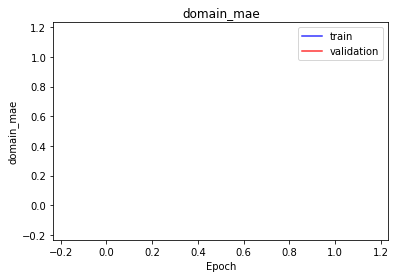

<b>domain_mape</b>: nan (min: nan, max: nan)

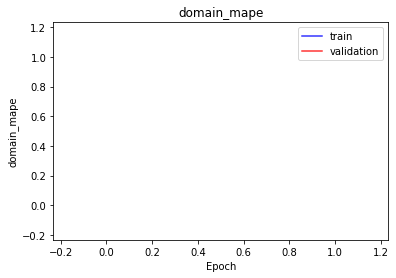

<b>latent_mae</b>: nan (min: nan, max: nan)

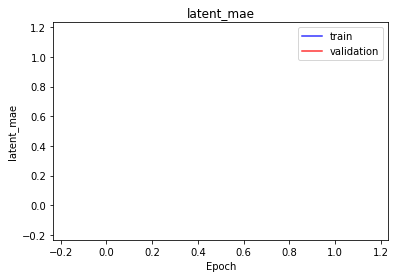

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

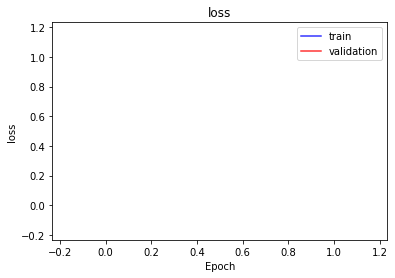

<b>bioma_loss</b>: nan (min: nan, max: nan)

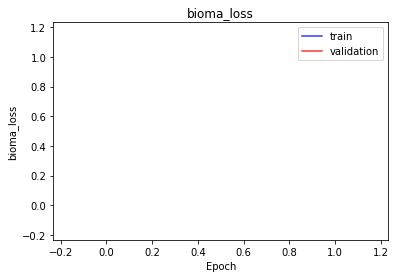

<b>domain_loss</b>: 154045.3125 (min: 149323.0156, max: 158767.5938)

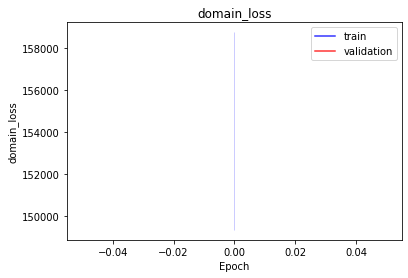

<b>latent_loss</b>: nan (min: nan, max: nan)

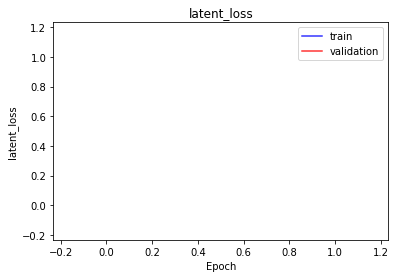

<b>bioma_mse</b>: nan (min: nan, max: nan)

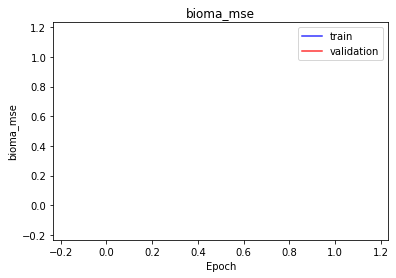

<b>bioma_mae</b>: nan (min: nan, max: nan)

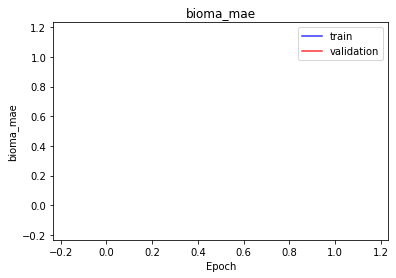

<b>bioma_mape</b>: nan (min: nan, max: nan)

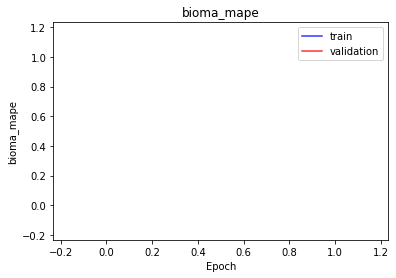

<b>domain_mse</b>: nan (min: nan, max: nan)

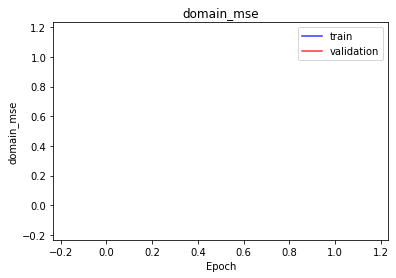

<b>domain_mae</b>: nan (min: nan, max: nan)

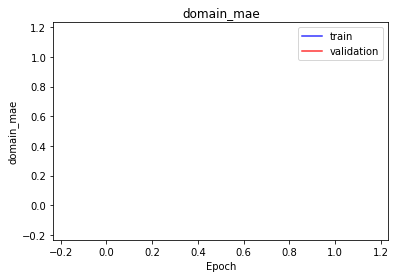

<b>domain_mape</b>: nan (min: nan, max: nan)

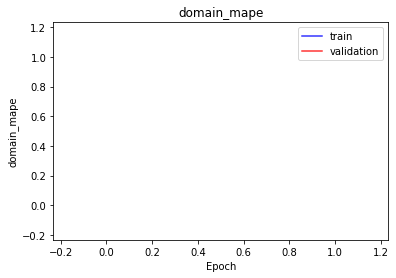

<b>latent_mae</b>: nan (min: nan, max: nan)

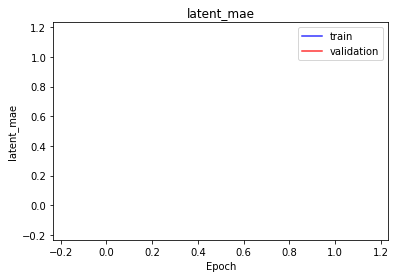

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

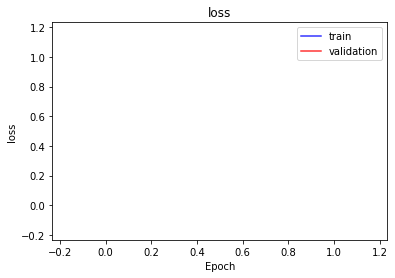

<b>bioma_loss</b>: nan (min: nan, max: nan)

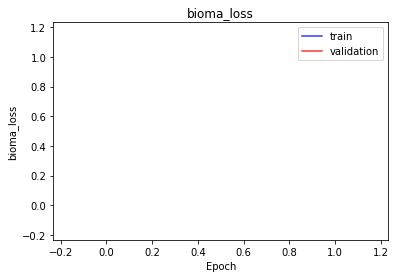

<b>domain_loss</b>: 157026.9375 (min: 152818.8438, max: 161235.0469)

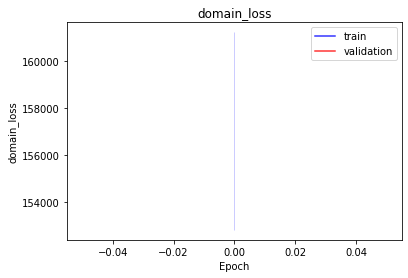

<b>latent_loss</b>: nan (min: nan, max: nan)

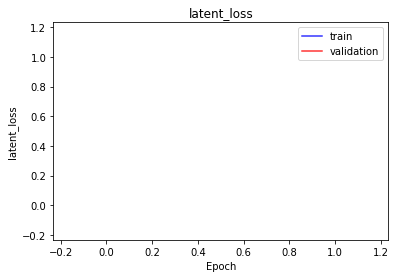

<b>bioma_mse</b>: nan (min: nan, max: nan)

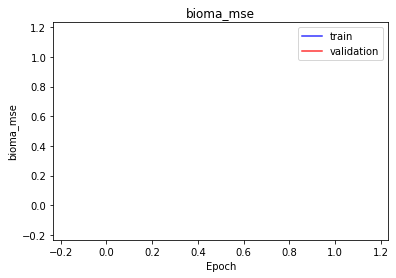

<b>bioma_mae</b>: nan (min: nan, max: nan)

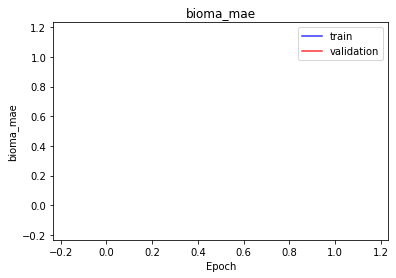

<b>bioma_mape</b>: nan (min: nan, max: nan)

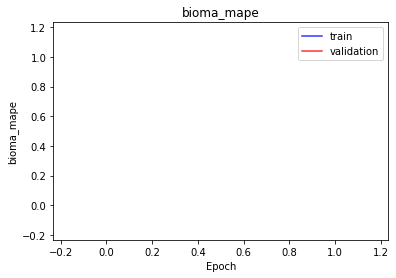

<b>domain_mse</b>: nan (min: nan, max: nan)

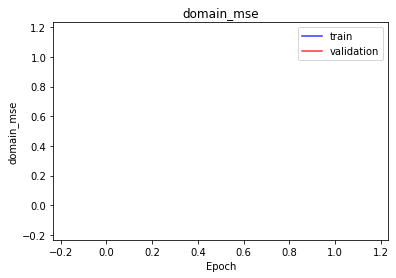

<b>domain_mae</b>: nan (min: nan, max: nan)

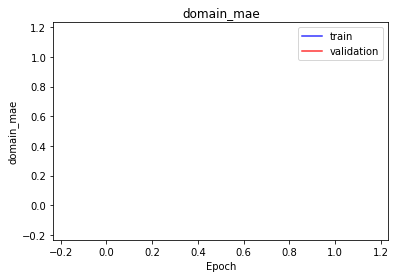

<b>domain_mape</b>: nan (min: nan, max: nan)

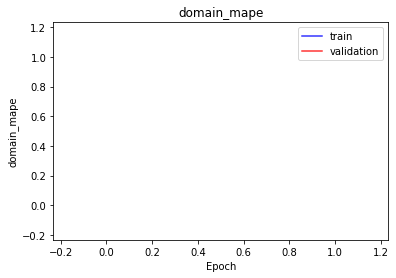

<b>latent_mae</b>: nan (min: nan, max: nan)

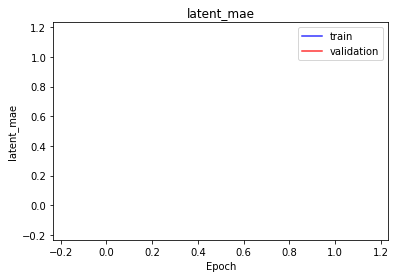

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

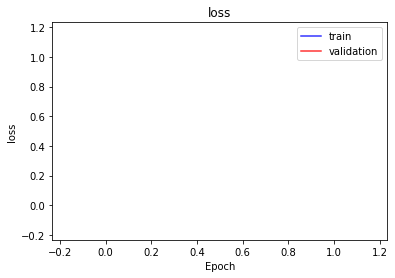

<b>bioma_loss</b>: nan (min: nan, max: nan)

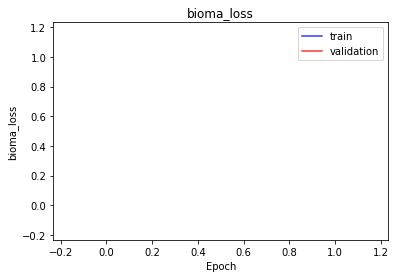

<b>domain_loss</b>: 157168.7969 (min: 155315.5469, max: 159022.0469)

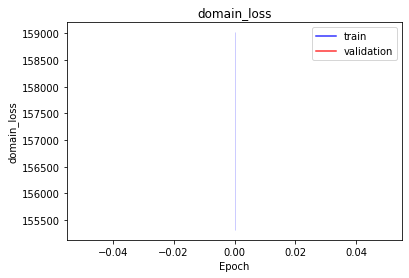

<b>latent_loss</b>: nan (min: nan, max: nan)

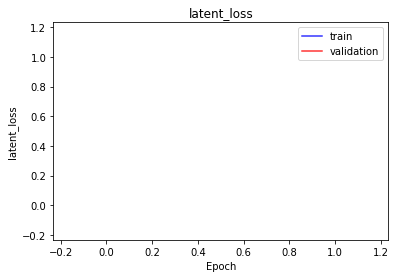

<b>bioma_mse</b>: nan (min: nan, max: nan)

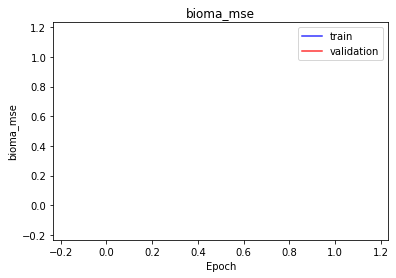

<b>bioma_mae</b>: nan (min: nan, max: nan)

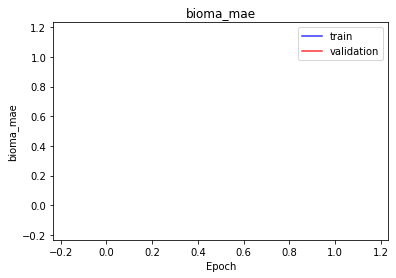

<b>bioma_mape</b>: nan (min: nan, max: nan)

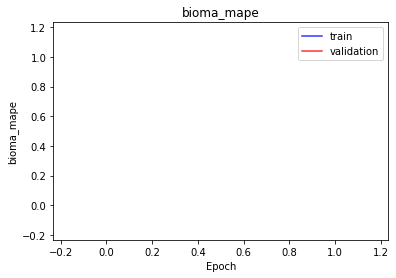

<b>domain_mse</b>: nan (min: nan, max: nan)

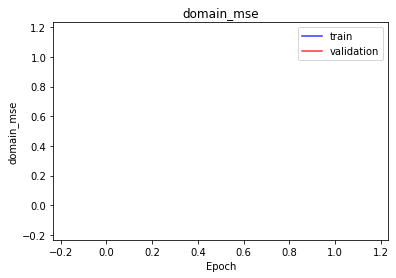

<b>domain_mae</b>: nan (min: nan, max: nan)

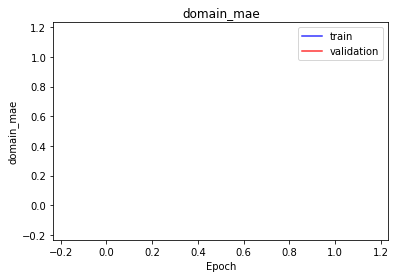

<b>domain_mape</b>: nan (min: nan, max: nan)

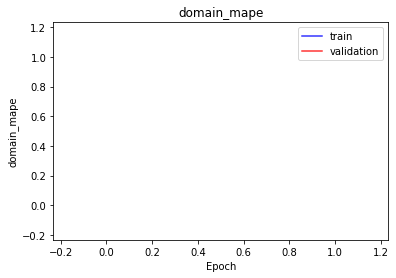

<b>latent_mae</b>: nan (min: nan, max: nan)

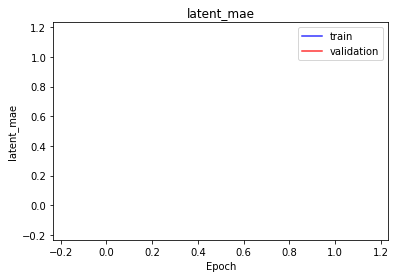

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

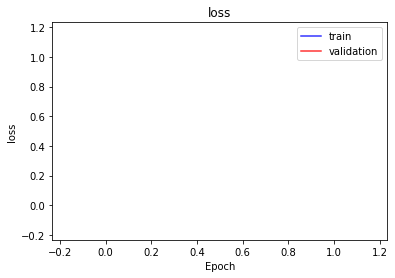

<b>bioma_loss</b>: nan (min: nan, max: nan)

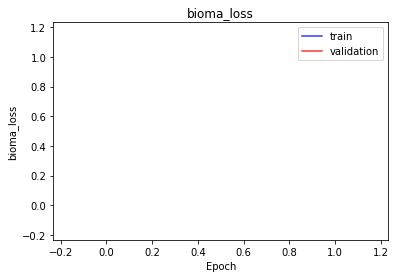

<b>domain_loss</b>: 154419.6562 (min: 153713.3750, max: 155125.9375)

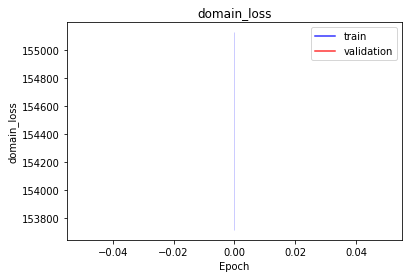

<b>latent_loss</b>: nan (min: nan, max: nan)

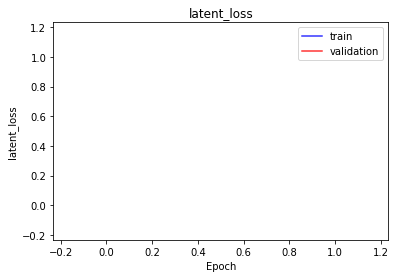

<b>bioma_mse</b>: nan (min: nan, max: nan)

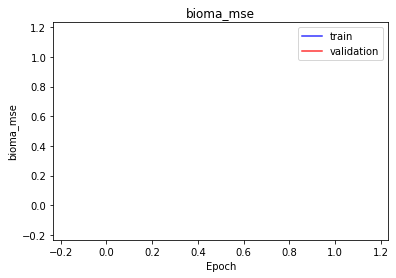

<b>bioma_mae</b>: nan (min: nan, max: nan)

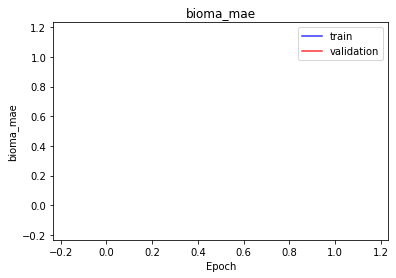

<b>bioma_mape</b>: nan (min: nan, max: nan)

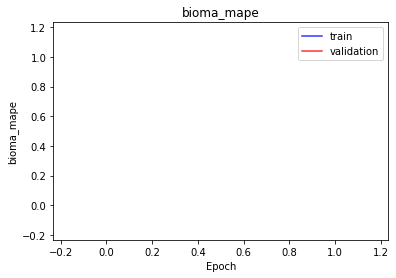

<b>domain_mse</b>: nan (min: nan, max: nan)

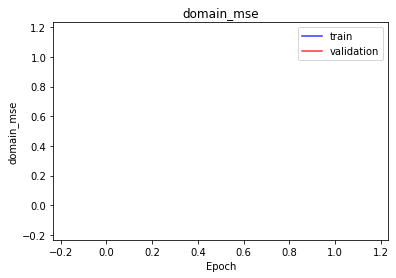

<b>domain_mae</b>: nan (min: nan, max: nan)

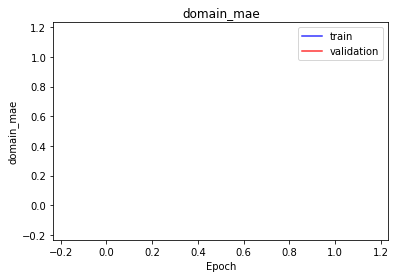

<b>domain_mape</b>: nan (min: nan, max: nan)

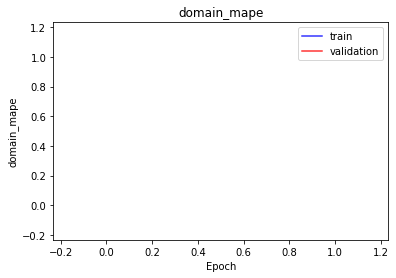

<b>latent_mae</b>: nan (min: nan, max: nan)

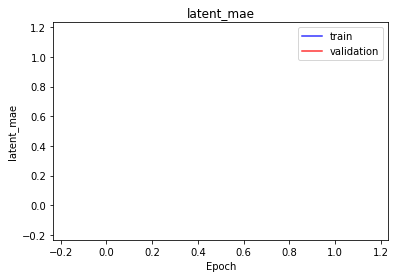

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

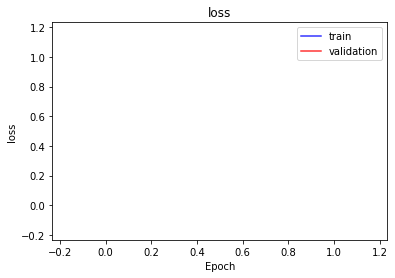

<b>bioma_loss</b>: nan (min: nan, max: nan)

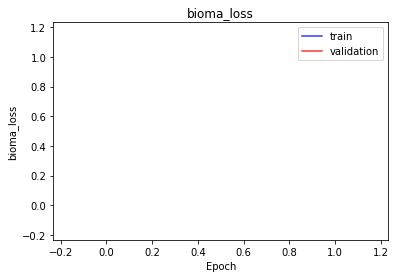

<b>domain_loss</b>: 157101.0469 (min: 156461.5312, max: 157740.5625)

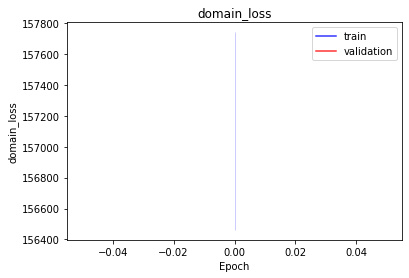

<b>latent_loss</b>: nan (min: nan, max: nan)

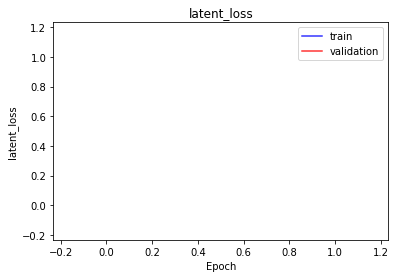

<b>bioma_mse</b>: nan (min: nan, max: nan)

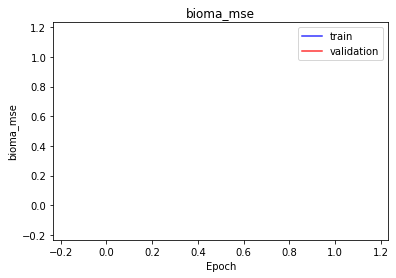

<b>bioma_mae</b>: nan (min: nan, max: nan)

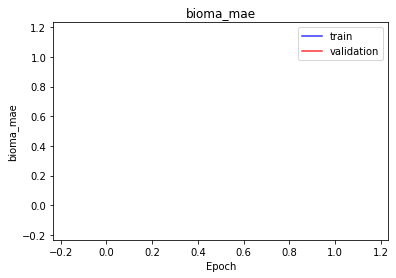

<b>bioma_mape</b>: nan (min: nan, max: nan)

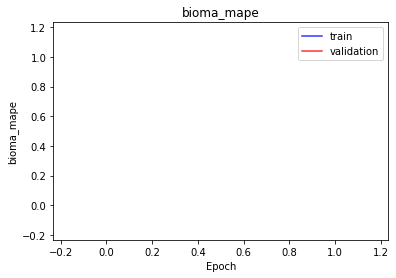

<b>domain_mse</b>: nan (min: nan, max: nan)

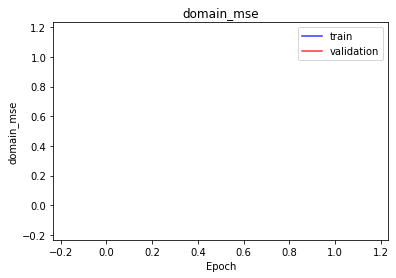

<b>domain_mae</b>: nan (min: nan, max: nan)

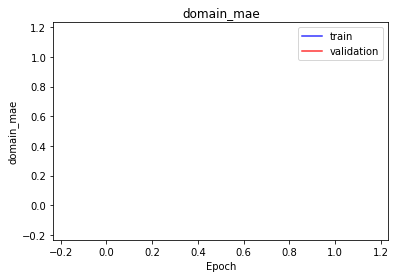

<b>domain_mape</b>: nan (min: nan, max: nan)

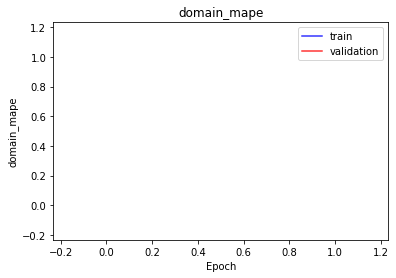

<b>latent_mae</b>: nan (min: nan, max: nan)

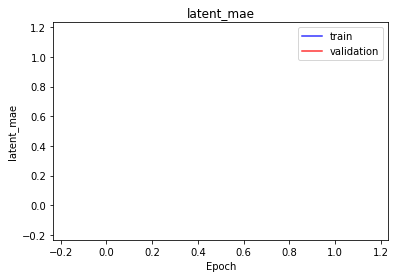

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

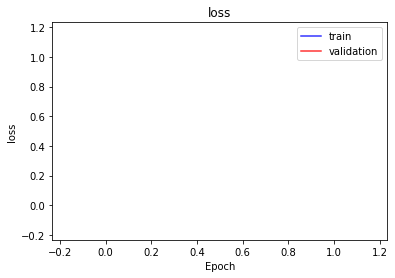

<b>bioma_loss</b>: nan (min: nan, max: nan)

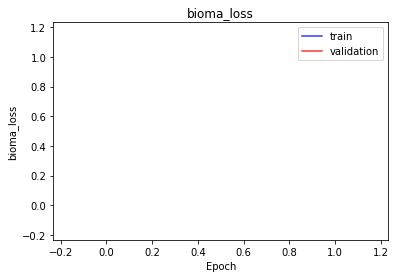

<b>domain_loss</b>: 156355.9531 (min: 155144.2812, max: 157567.6250)

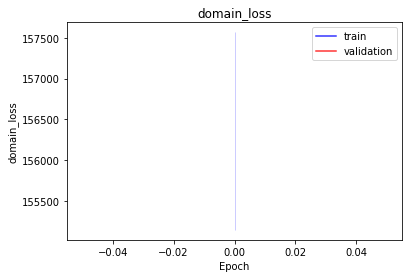

<b>latent_loss</b>: nan (min: nan, max: nan)

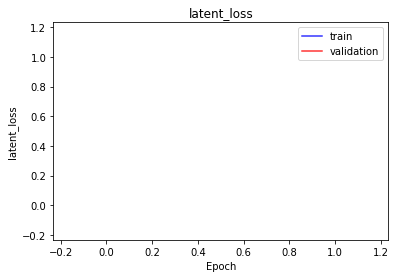

<b>bioma_mse</b>: nan (min: nan, max: nan)

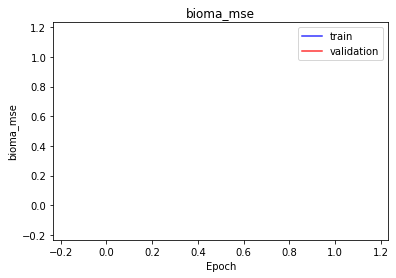

<b>bioma_mae</b>: nan (min: nan, max: nan)

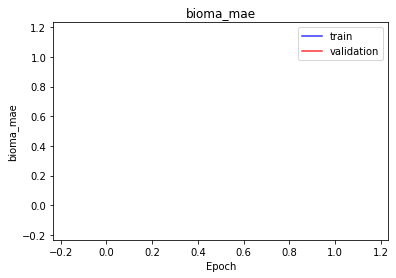

<b>bioma_mape</b>: nan (min: nan, max: nan)

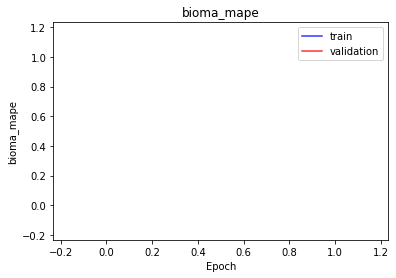

<b>domain_mse</b>: nan (min: nan, max: nan)

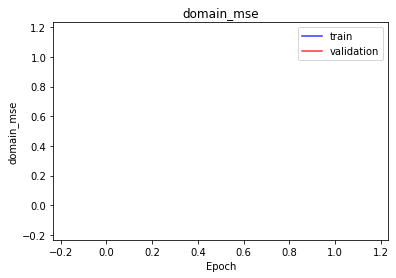

<b>domain_mae</b>: nan (min: nan, max: nan)

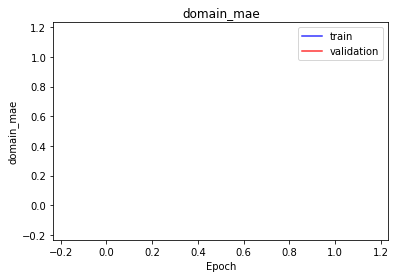

<b>domain_mape</b>: nan (min: nan, max: nan)

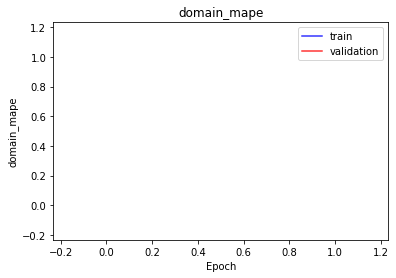

<b>latent_mae</b>: nan (min: nan, max: nan)

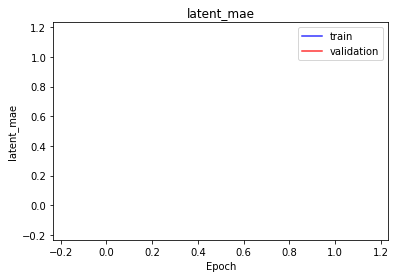

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

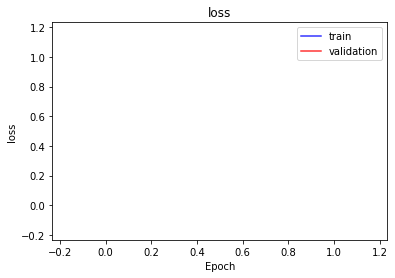

<b>bioma_loss</b>: nan (min: nan, max: nan)

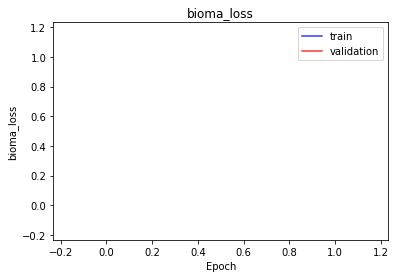

<b>domain_loss</b>: 152863.5000 (min: 151455.2500, max: 154271.7344)

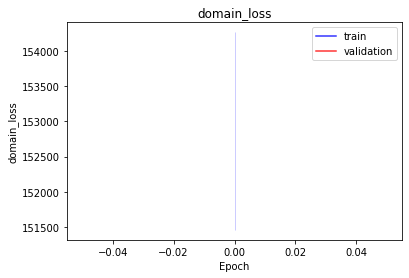

<b>latent_loss</b>: nan (min: nan, max: nan)

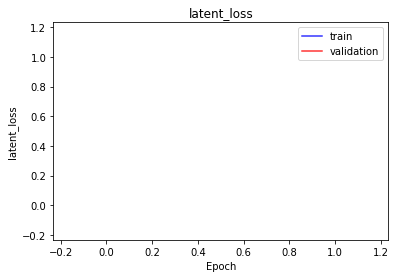

<b>bioma_mse</b>: nan (min: nan, max: nan)

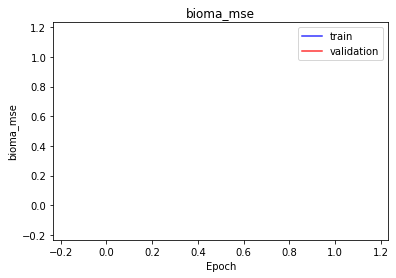

<b>bioma_mae</b>: nan (min: nan, max: nan)

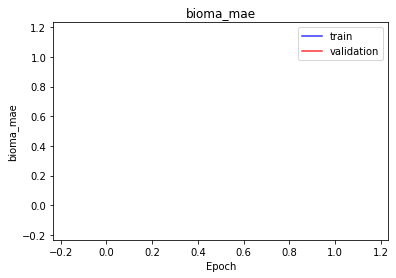

<b>bioma_mape</b>: nan (min: nan, max: nan)

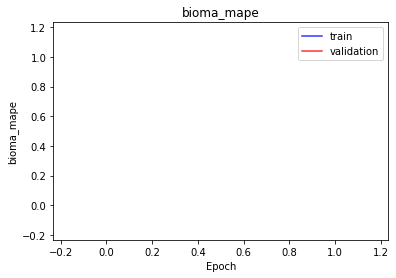

<b>domain_mse</b>: nan (min: nan, max: nan)

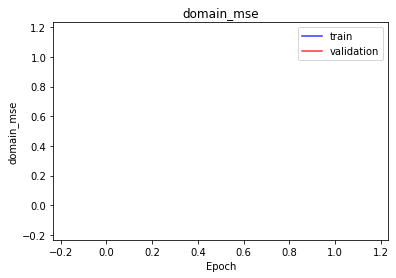

<b>domain_mae</b>: nan (min: nan, max: nan)

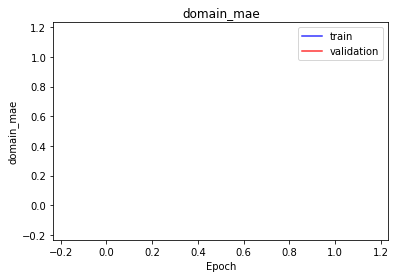

<b>domain_mape</b>: nan (min: nan, max: nan)

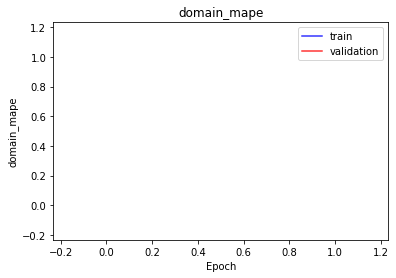

<b>latent_mae</b>: nan (min: nan, max: nan)

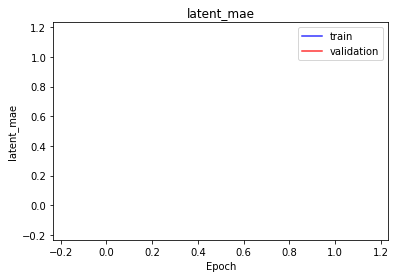

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

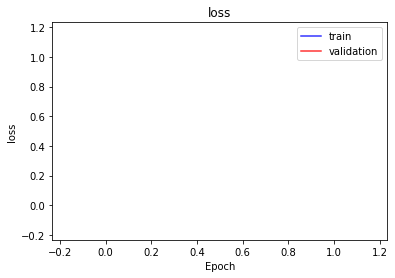

<b>bioma_loss</b>: nan (min: nan, max: nan)

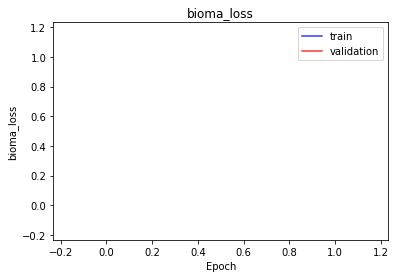

<b>domain_loss</b>: 156511.2500 (min: 153712.1406, max: 159310.3594)

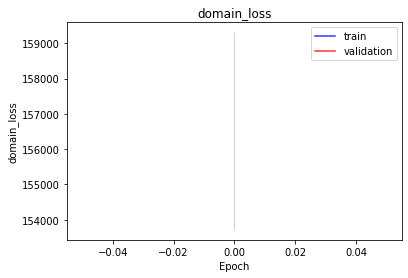

<b>latent_loss</b>: nan (min: nan, max: nan)

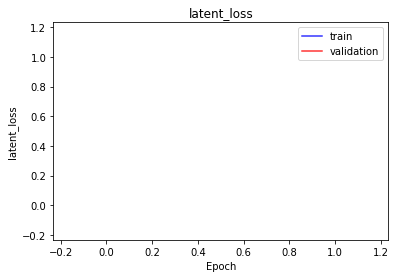

<b>bioma_mse</b>: nan (min: nan, max: nan)

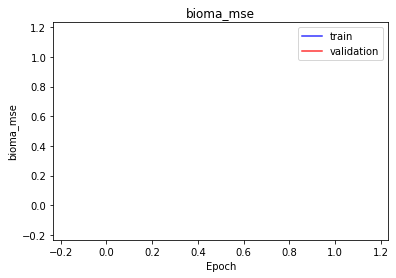

<b>bioma_mae</b>: nan (min: nan, max: nan)

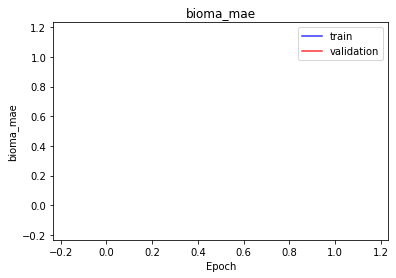

<b>bioma_mape</b>: nan (min: nan, max: nan)

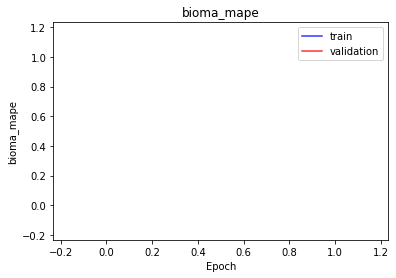

<b>domain_mse</b>: nan (min: nan, max: nan)

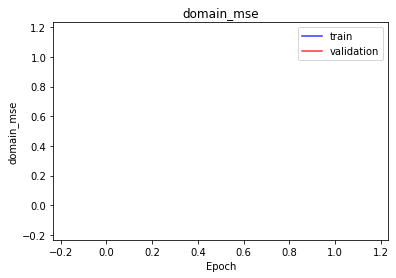

<b>domain_mae</b>: nan (min: nan, max: nan)

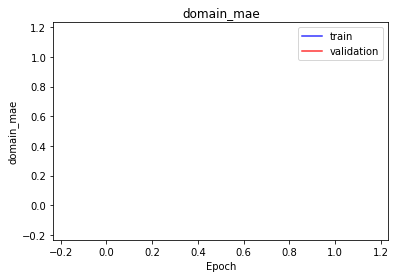

<b>domain_mape</b>: nan (min: nan, max: nan)

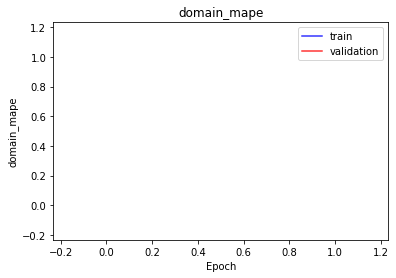

<b>latent_mae</b>: nan (min: nan, max: nan)

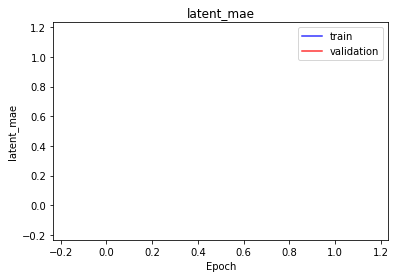

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 256 -> 50 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 50 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

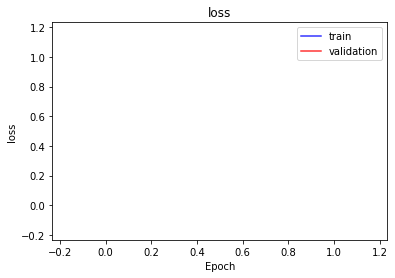

<b>bioma_loss</b>: nan (min: nan, max: nan)

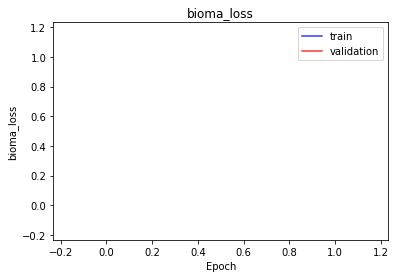

<b>domain_loss</b>: 157078.8594 (min: 153915.8594, max: 160241.8594)

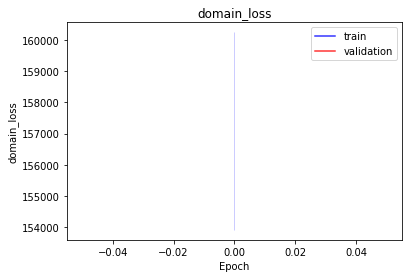

<b>latent_loss</b>: nan (min: nan, max: nan)

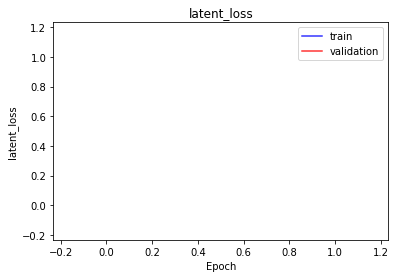

<b>bioma_mse</b>: nan (min: nan, max: nan)

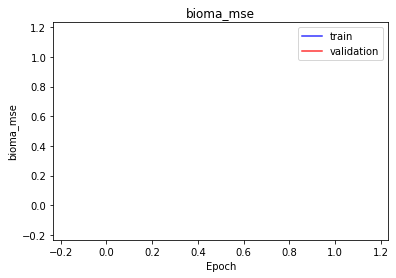

<b>bioma_mae</b>: nan (min: nan, max: nan)

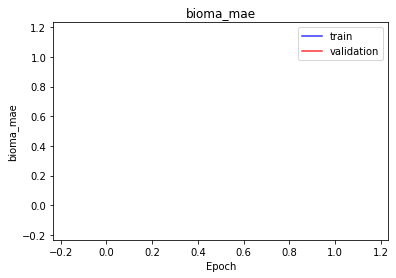

<b>bioma_mape</b>: nan (min: nan, max: nan)

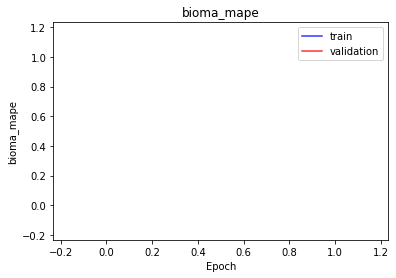

<b>domain_mse</b>: nan (min: nan, max: nan)

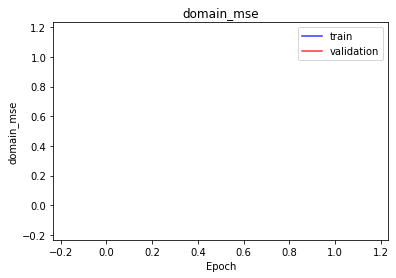

<b>domain_mae</b>: nan (min: nan, max: nan)

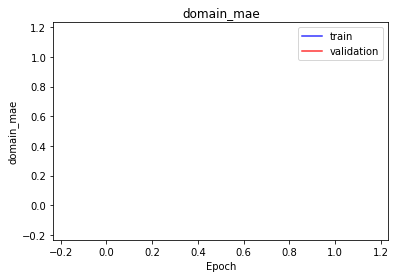

<b>domain_mape</b>: nan (min: nan, max: nan)

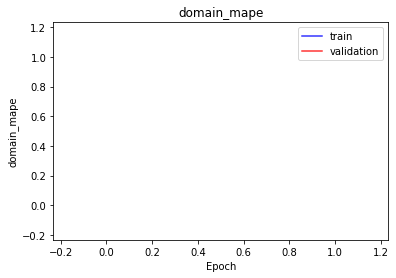

<b>latent_mae</b>: nan (min: nan, max: nan)

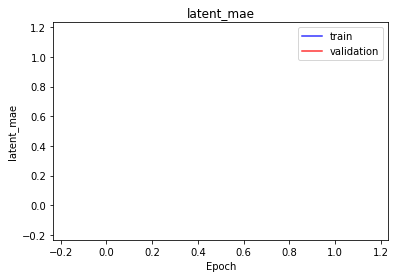

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

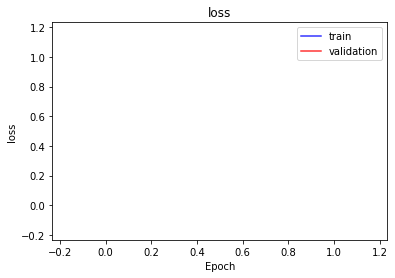

<b>bioma_loss</b>: nan (min: nan, max: nan)

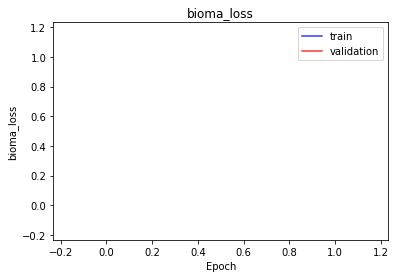

<b>domain_loss</b>: 156756.4375 (min: 154699.7031, max: 158813.1875)

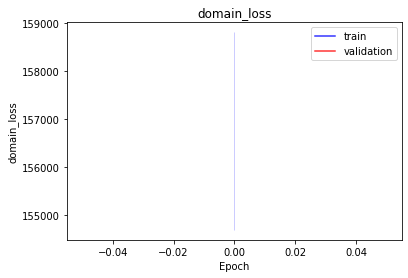

<b>latent_loss</b>: nan (min: nan, max: nan)

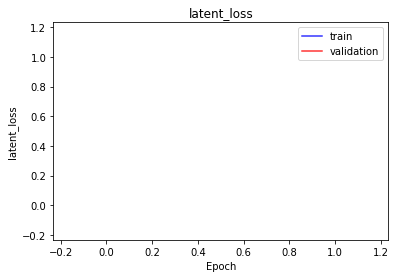

<b>bioma_mse</b>: nan (min: nan, max: nan)

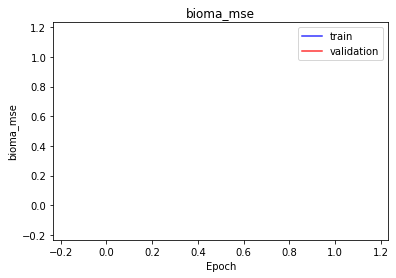

<b>bioma_mae</b>: nan (min: nan, max: nan)

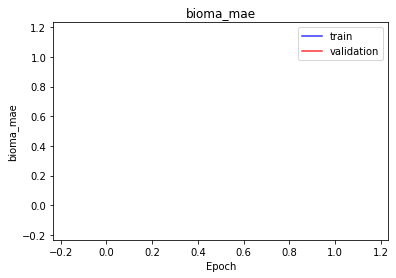

<b>bioma_mape</b>: nan (min: nan, max: nan)

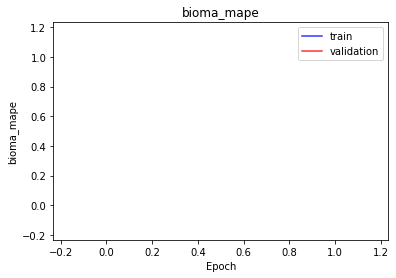

<b>domain_mse</b>: nan (min: nan, max: nan)

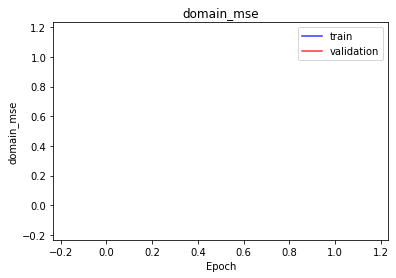

<b>domain_mae</b>: nan (min: nan, max: nan)

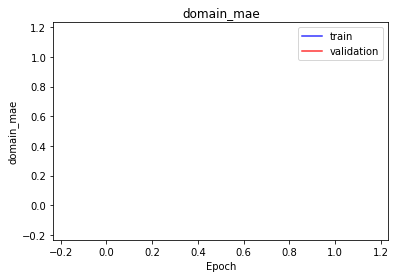

<b>domain_mape</b>: nan (min: nan, max: nan)

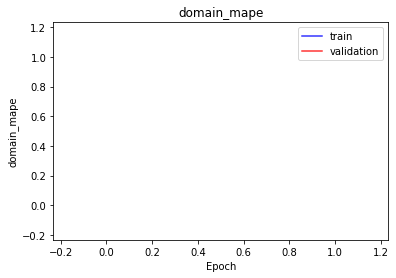

<b>latent_mae</b>: nan (min: nan, max: nan)

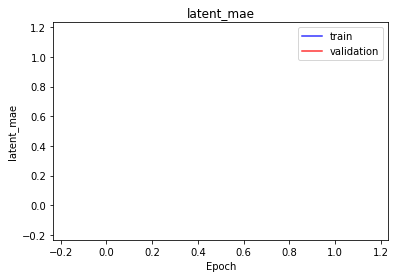

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

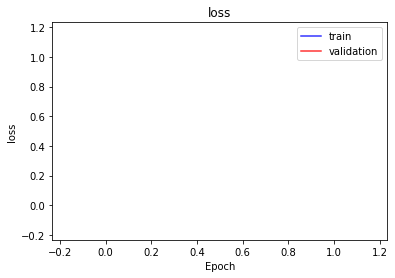

<b>bioma_loss</b>: nan (min: nan, max: nan)

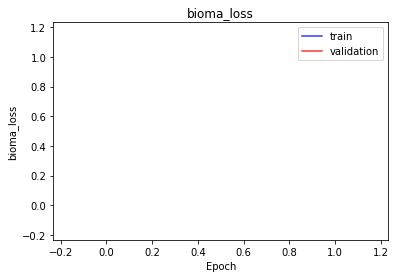

<b>domain_loss</b>: 154789.4531 (min: 152058.5469, max: 157520.3594)

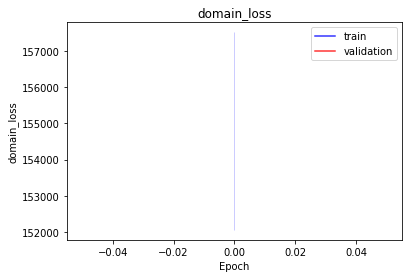

<b>latent_loss</b>: nan (min: nan, max: nan)

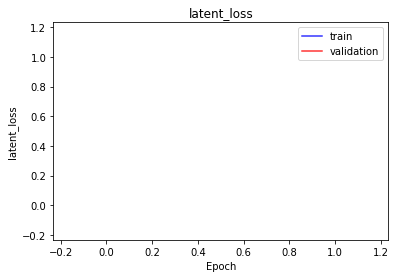

<b>bioma_mse</b>: nan (min: nan, max: nan)

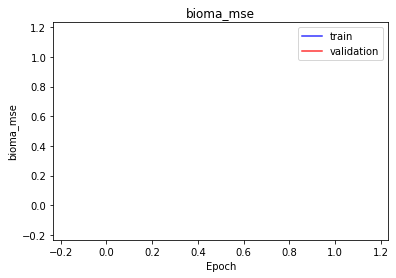

<b>bioma_mae</b>: nan (min: nan, max: nan)

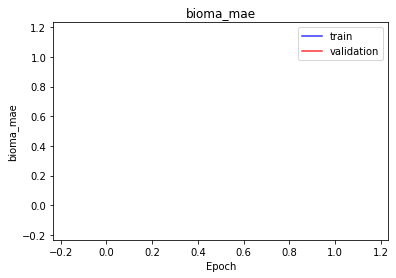

<b>bioma_mape</b>: nan (min: nan, max: nan)

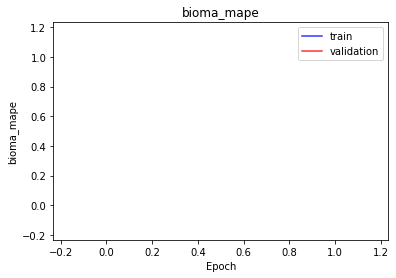

<b>domain_mse</b>: nan (min: nan, max: nan)

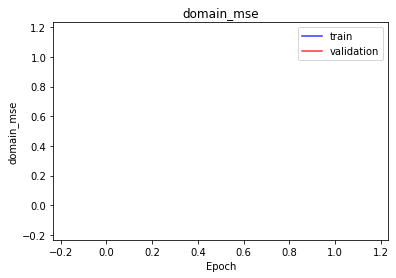

<b>domain_mae</b>: nan (min: nan, max: nan)

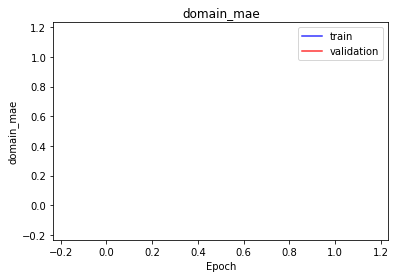

<b>domain_mape</b>: nan (min: nan, max: nan)

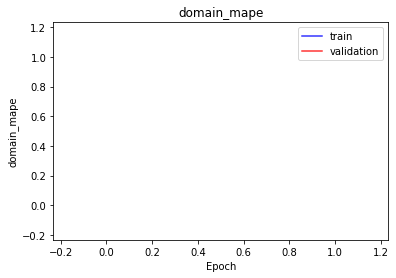

<b>latent_mae</b>: nan (min: nan, max: nan)

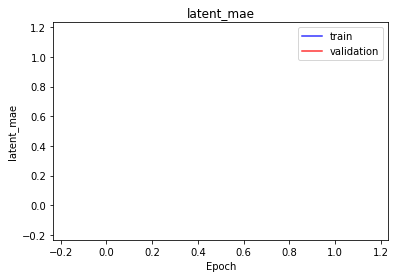

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

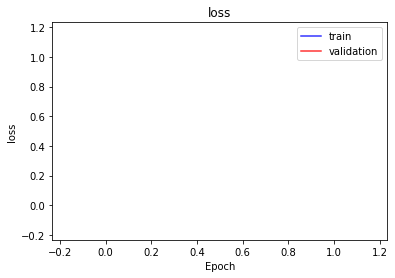

<b>bioma_loss</b>: nan (min: nan, max: nan)

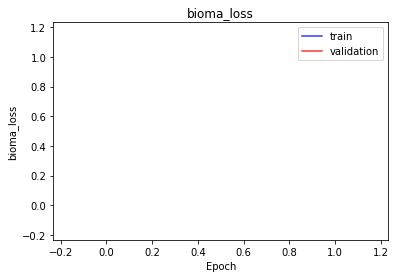

<b>domain_loss</b>: 162161.5000 (min: 157648.6875, max: 166674.2969)

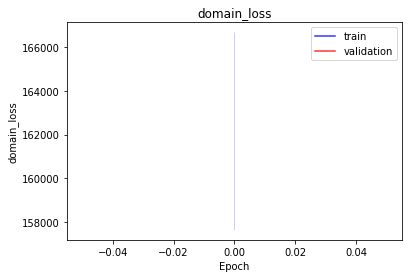

<b>latent_loss</b>: nan (min: nan, max: nan)

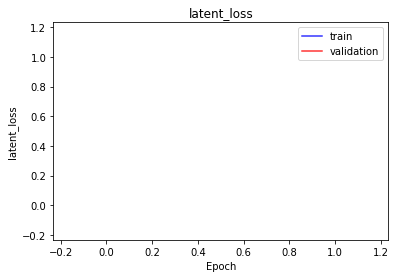

<b>bioma_mse</b>: nan (min: nan, max: nan)

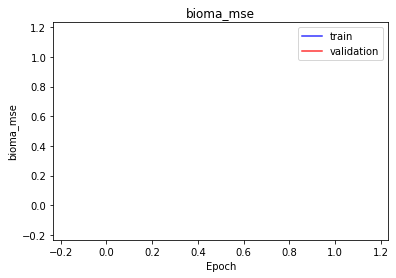

<b>bioma_mae</b>: nan (min: nan, max: nan)

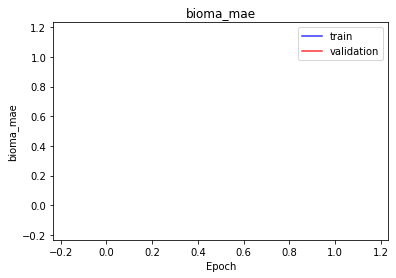

<b>bioma_mape</b>: nan (min: nan, max: nan)

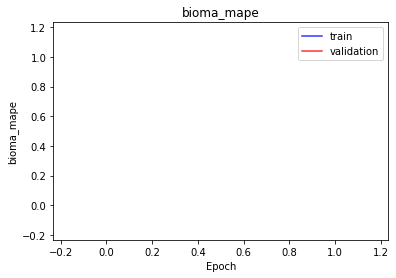

<b>domain_mse</b>: nan (min: nan, max: nan)

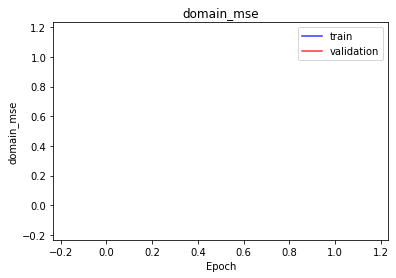

<b>domain_mae</b>: nan (min: nan, max: nan)

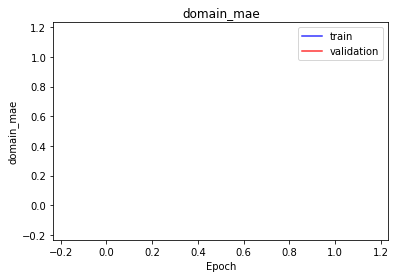

<b>domain_mape</b>: nan (min: nan, max: nan)

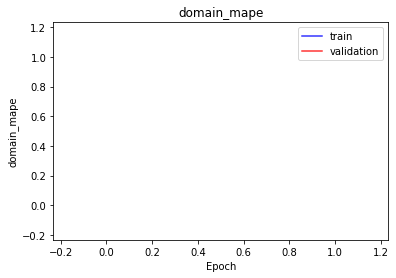

<b>latent_mae</b>: nan (min: nan, max: nan)

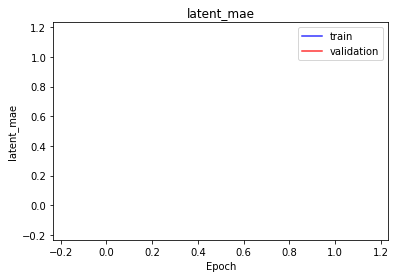

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

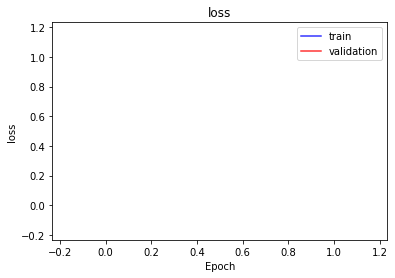

<b>bioma_loss</b>: nan (min: nan, max: nan)

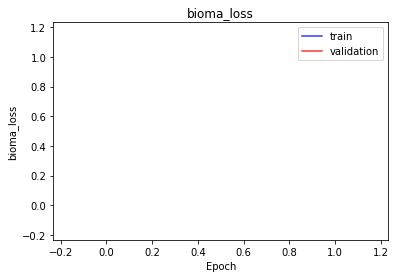

<b>domain_loss</b>: 155970.7969 (min: 151671.4844, max: 160270.1094)

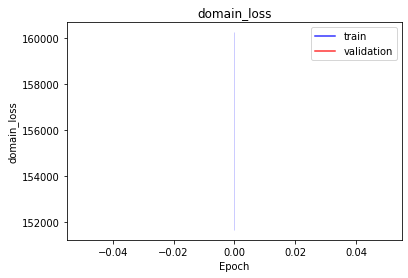

<b>latent_loss</b>: nan (min: nan, max: nan)

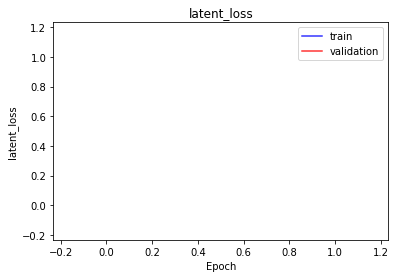

<b>bioma_mse</b>: nan (min: nan, max: nan)

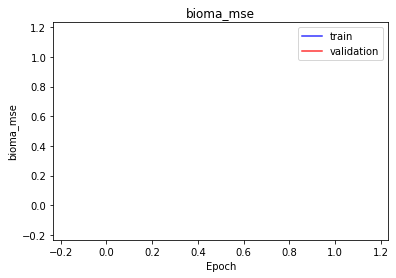

<b>bioma_mae</b>: nan (min: nan, max: nan)

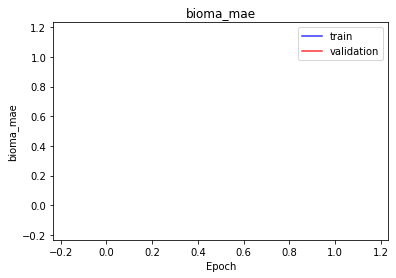

<b>bioma_mape</b>: nan (min: nan, max: nan)

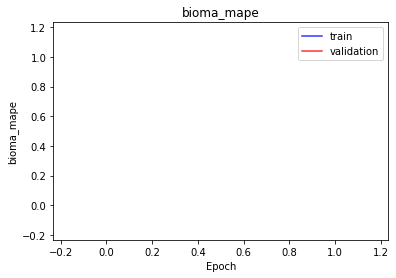

<b>domain_mse</b>: nan (min: nan, max: nan)

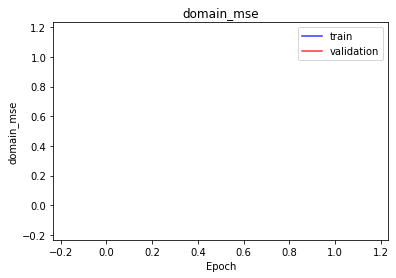

<b>domain_mae</b>: nan (min: nan, max: nan)

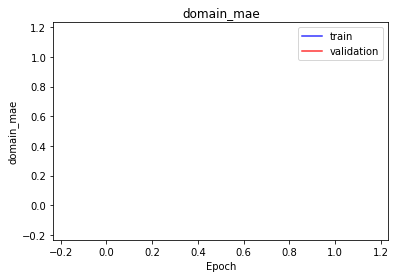

<b>domain_mape</b>: nan (min: nan, max: nan)

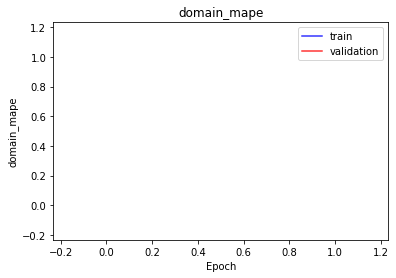

<b>latent_mae</b>: nan (min: nan, max: nan)

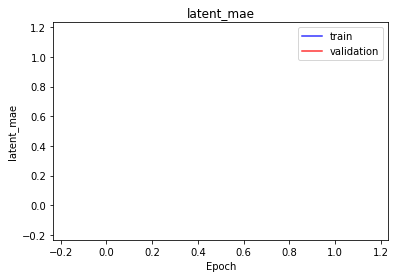

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

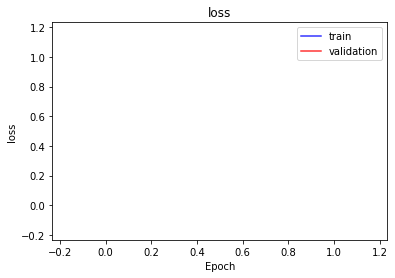

<b>bioma_loss</b>: nan (min: nan, max: nan)

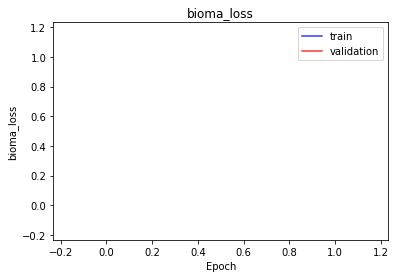

<b>domain_loss</b>: 156394.0156 (min: 156192.1250, max: 156595.9062)

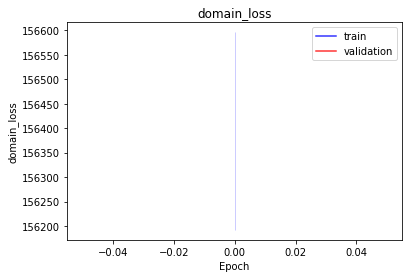

<b>latent_loss</b>: nan (min: nan, max: nan)

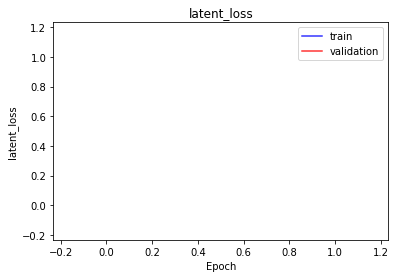

<b>bioma_mse</b>: nan (min: nan, max: nan)

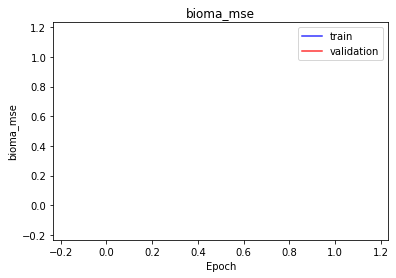

<b>bioma_mae</b>: nan (min: nan, max: nan)

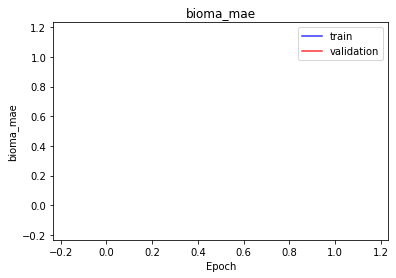

<b>bioma_mape</b>: nan (min: nan, max: nan)

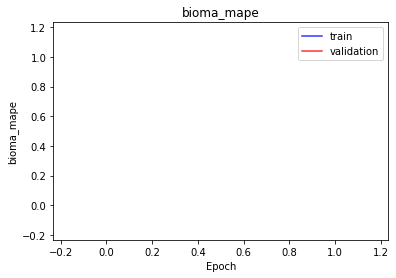

<b>domain_mse</b>: nan (min: nan, max: nan)

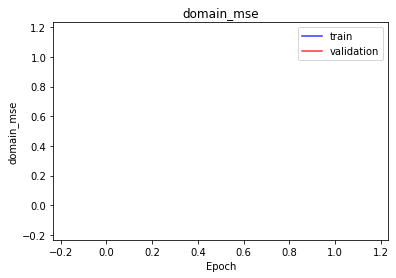

<b>domain_mae</b>: nan (min: nan, max: nan)

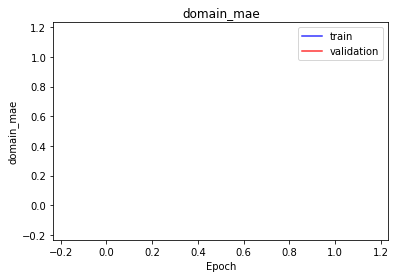

<b>domain_mape</b>: nan (min: nan, max: nan)

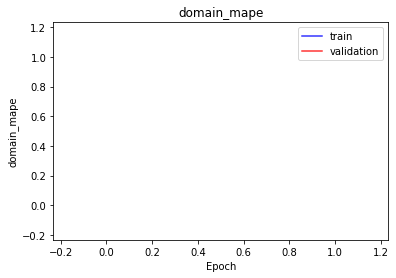

<b>latent_mae</b>: nan (min: nan, max: nan)

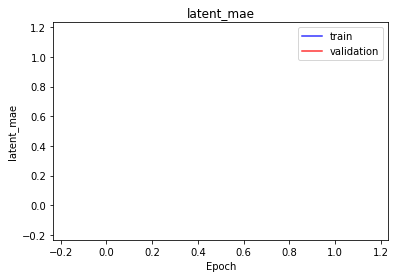

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 50 |
| Bioma Autoencoder | b -> 50 -> b |
| Domain Autoencoder | d -> 50 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

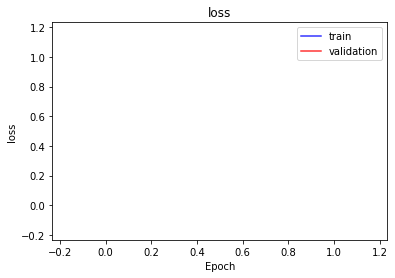

<b>bioma_loss</b>: nan (min: nan, max: nan)

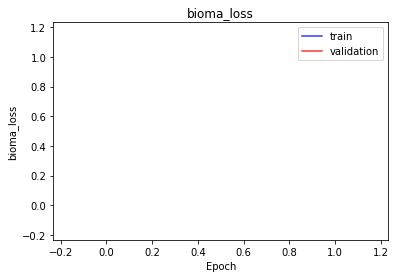

<b>domain_loss</b>: 155296.4062 (min: 155019.6250, max: 155573.2031)

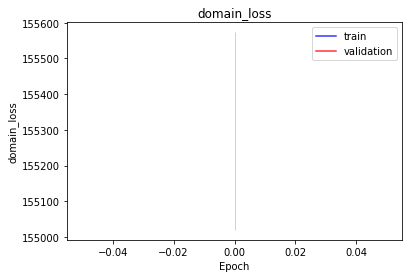

<b>latent_loss</b>: nan (min: nan, max: nan)

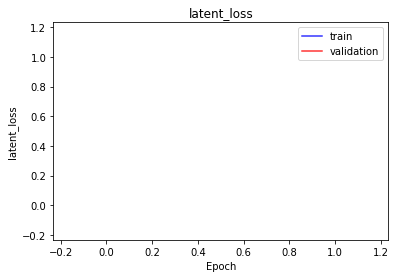

<b>bioma_mse</b>: nan (min: nan, max: nan)

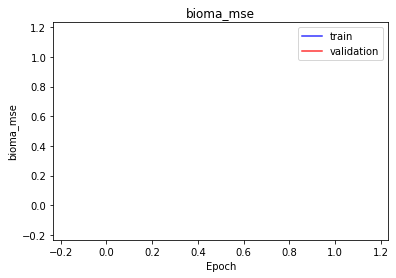

<b>bioma_mae</b>: nan (min: nan, max: nan)

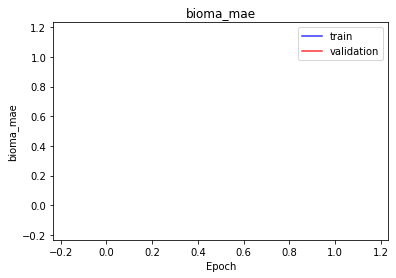

<b>bioma_mape</b>: nan (min: nan, max: nan)

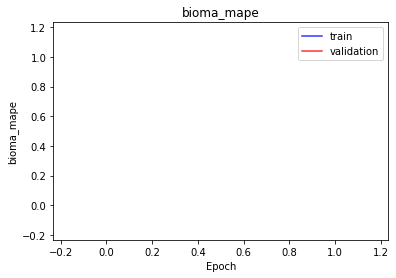

<b>domain_mse</b>: nan (min: nan, max: nan)

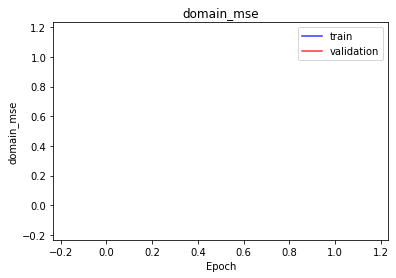

<b>domain_mae</b>: nan (min: nan, max: nan)

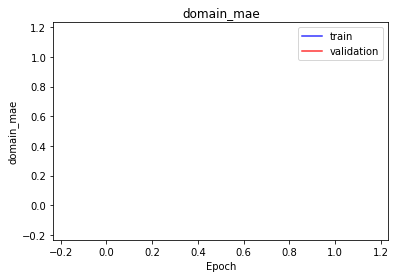

<b>domain_mape</b>: nan (min: nan, max: nan)

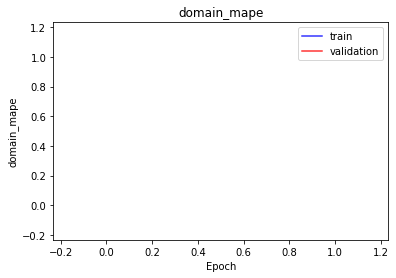

<b>latent_mae</b>: nan (min: nan, max: nan)

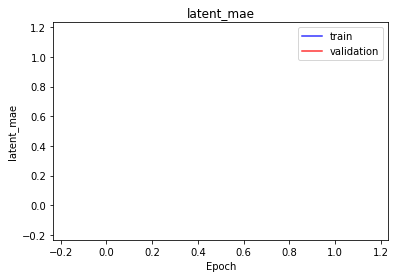

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

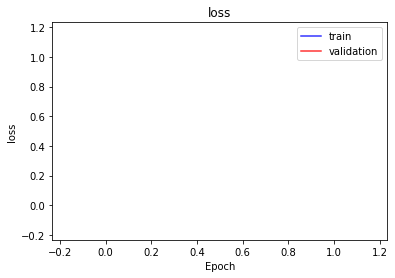

<b>bioma_loss</b>: nan (min: nan, max: nan)

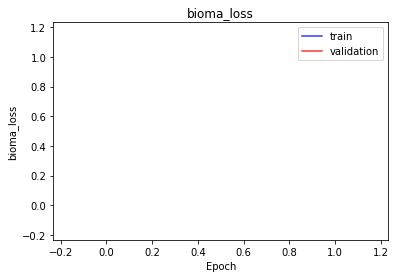

<b>domain_loss</b>: 154401.5156 (min: 154351.2656, max: 154451.7656)

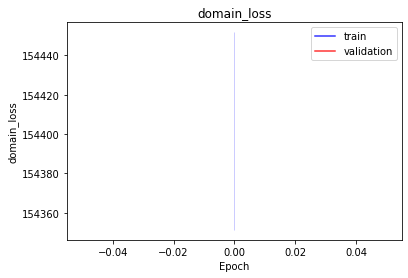

<b>latent_loss</b>: nan (min: nan, max: nan)

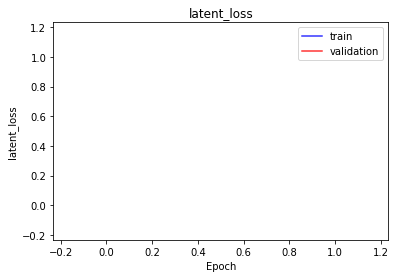

<b>bioma_mse</b>: nan (min: nan, max: nan)

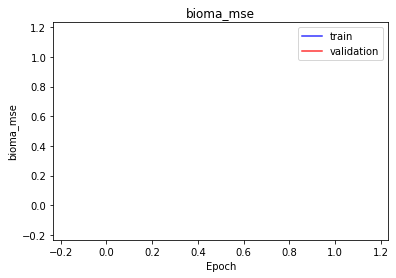

<b>bioma_mae</b>: nan (min: nan, max: nan)

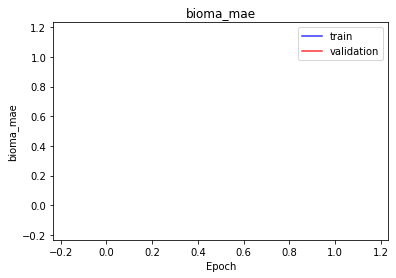

<b>bioma_mape</b>: nan (min: nan, max: nan)

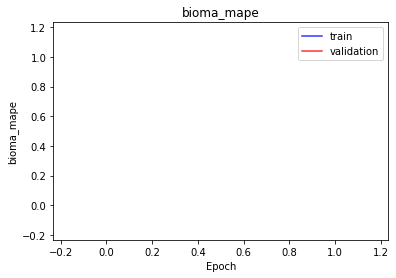

<b>domain_mse</b>: nan (min: nan, max: nan)

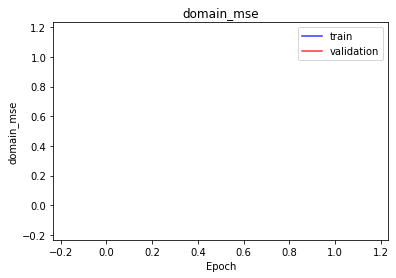

<b>domain_mae</b>: nan (min: nan, max: nan)

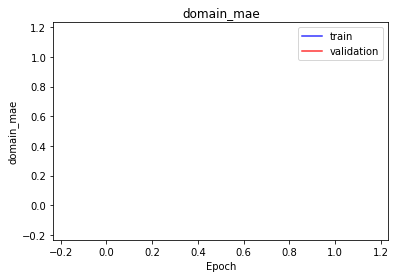

<b>domain_mape</b>: nan (min: nan, max: nan)

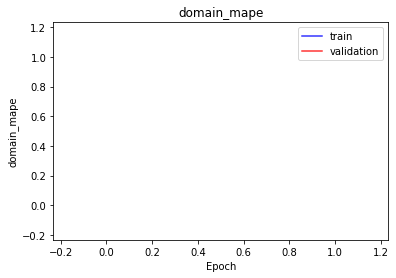

<b>latent_mae</b>: nan (min: nan, max: nan)

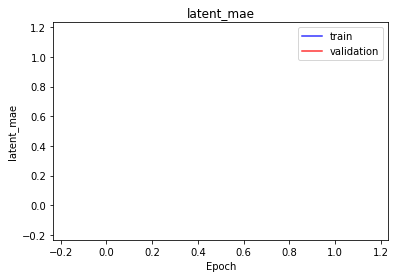

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

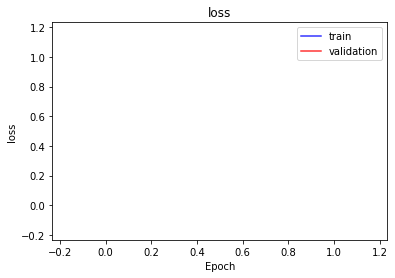

<b>bioma_loss</b>: nan (min: nan, max: nan)

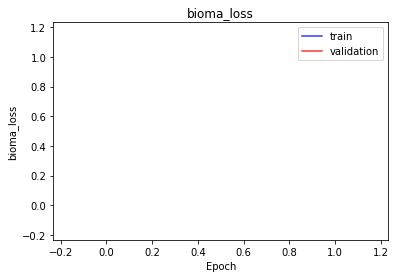

<b>domain_loss</b>: 158341.1562 (min: 157391.0469, max: 159291.2656)

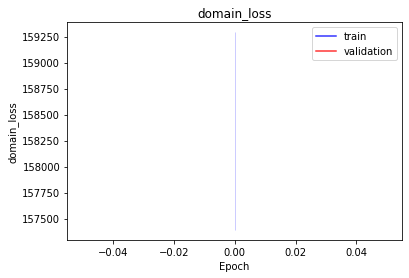

<b>latent_loss</b>: nan (min: nan, max: nan)

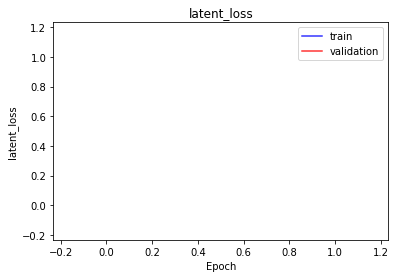

<b>bioma_mse</b>: nan (min: nan, max: nan)

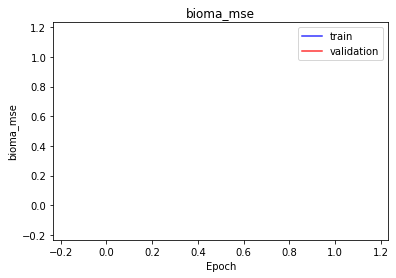

<b>bioma_mae</b>: nan (min: nan, max: nan)

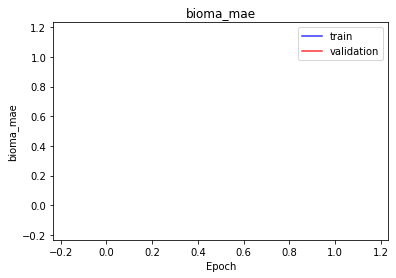

<b>bioma_mape</b>: nan (min: nan, max: nan)

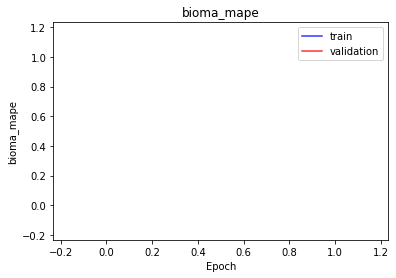

<b>domain_mse</b>: nan (min: nan, max: nan)

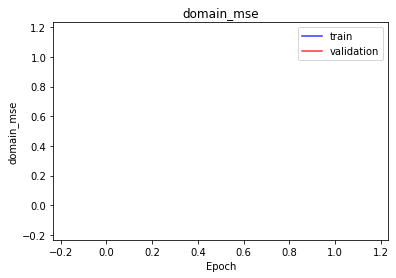

<b>domain_mae</b>: nan (min: nan, max: nan)

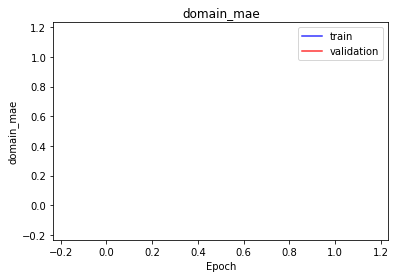

<b>domain_mape</b>: nan (min: nan, max: nan)

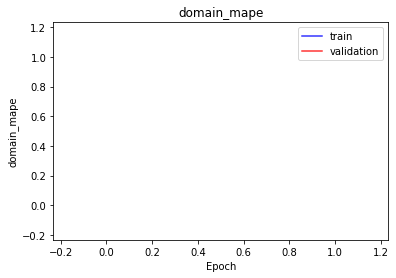

<b>latent_mae</b>: nan (min: nan, max: nan)

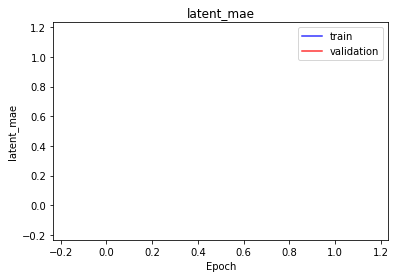

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

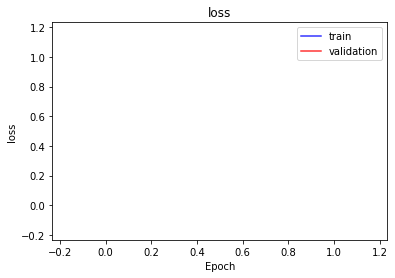

<b>bioma_loss</b>: nan (min: nan, max: nan)

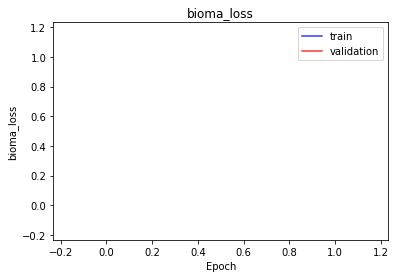

<b>domain_loss</b>: 154226.1094 (min: 153121.2031, max: 155331.0156)

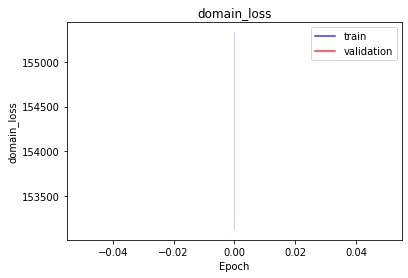

<b>latent_loss</b>: nan (min: nan, max: nan)

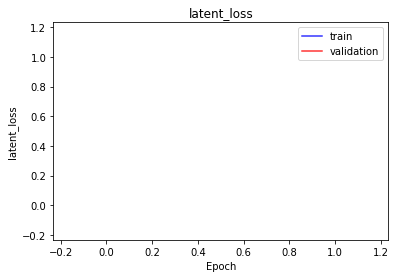

<b>bioma_mse</b>: nan (min: nan, max: nan)

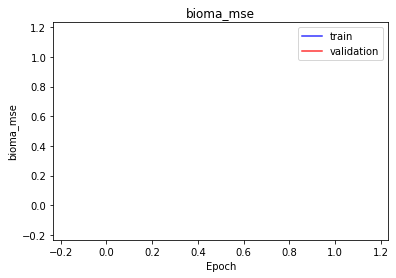

<b>bioma_mae</b>: nan (min: nan, max: nan)

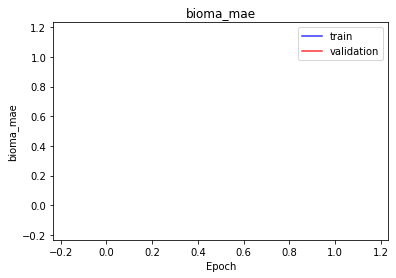

<b>bioma_mape</b>: nan (min: nan, max: nan)

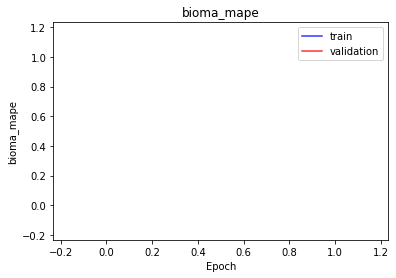

<b>domain_mse</b>: nan (min: nan, max: nan)

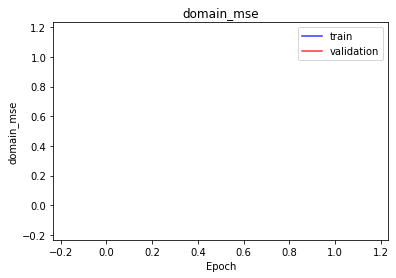

<b>domain_mae</b>: nan (min: nan, max: nan)

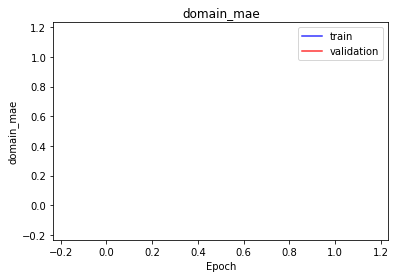

<b>domain_mape</b>: nan (min: nan, max: nan)

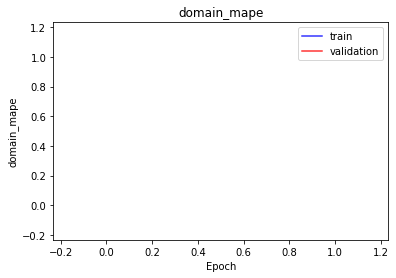

<b>latent_mae</b>: nan (min: nan, max: nan)

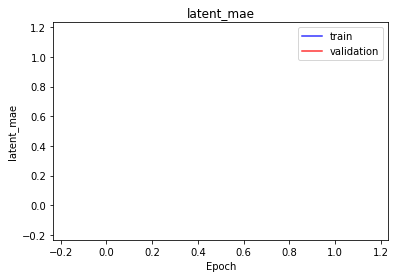

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

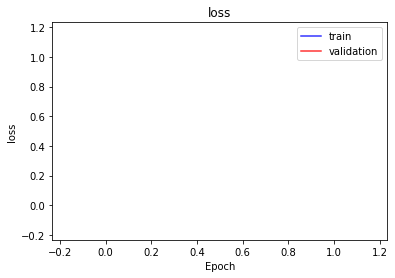

<b>bioma_loss</b>: nan (min: nan, max: nan)

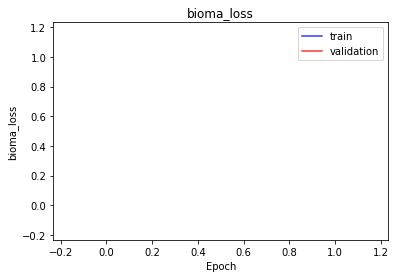

<b>domain_loss</b>: 156928.8906 (min: 154126.2344, max: 159731.5469)

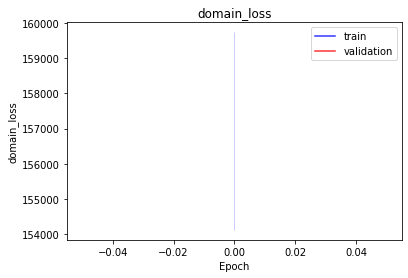

<b>latent_loss</b>: nan (min: nan, max: nan)

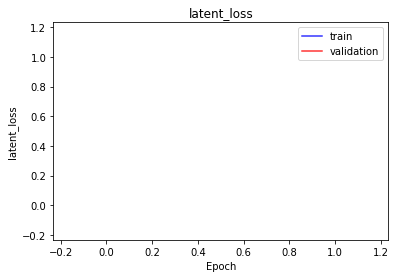

<b>bioma_mse</b>: nan (min: nan, max: nan)

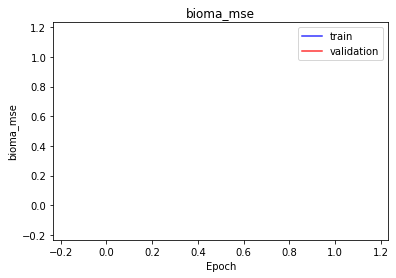

<b>bioma_mae</b>: nan (min: nan, max: nan)

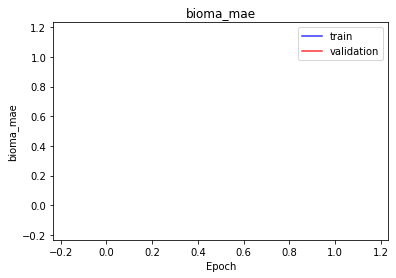

<b>bioma_mape</b>: nan (min: nan, max: nan)

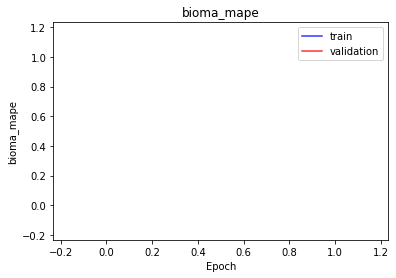

<b>domain_mse</b>: nan (min: nan, max: nan)

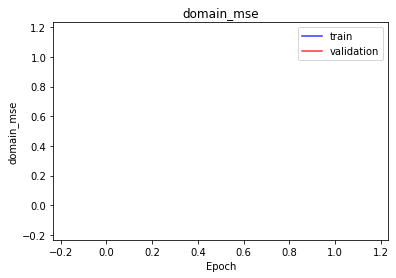

<b>domain_mae</b>: nan (min: nan, max: nan)

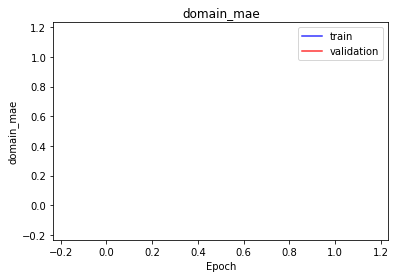

<b>domain_mape</b>: nan (min: nan, max: nan)

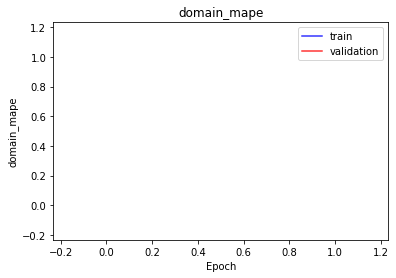

<b>latent_mae</b>: nan (min: nan, max: nan)

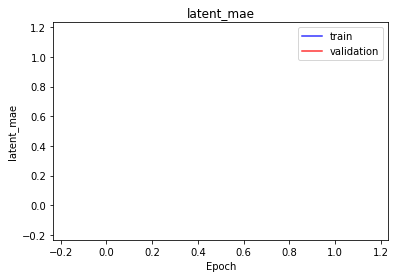

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

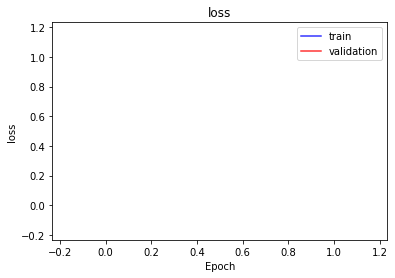

<b>bioma_loss</b>: nan (min: nan, max: nan)

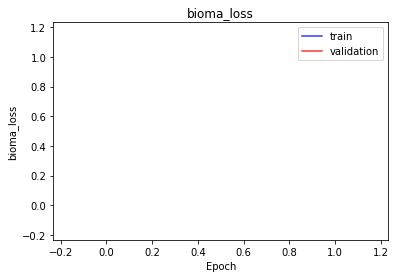

<b>domain_loss</b>: 156966.9531 (min: 156281.6094, max: 157652.2969)

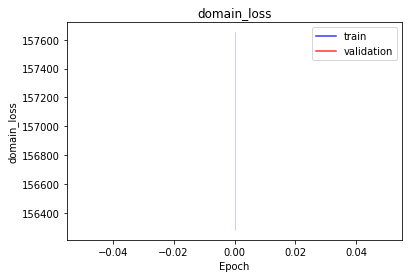

<b>latent_loss</b>: nan (min: nan, max: nan)

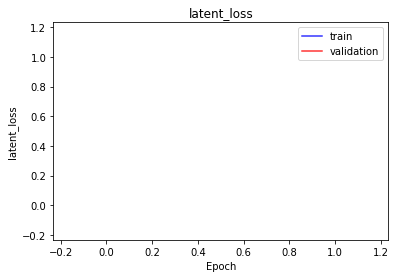

<b>bioma_mse</b>: nan (min: nan, max: nan)

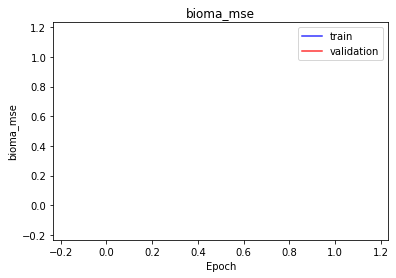

<b>bioma_mae</b>: nan (min: nan, max: nan)

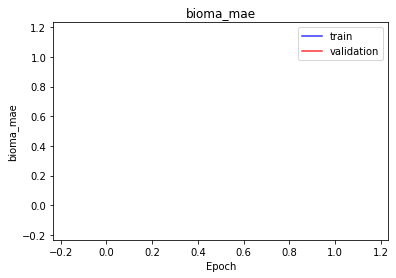

<b>bioma_mape</b>: nan (min: nan, max: nan)

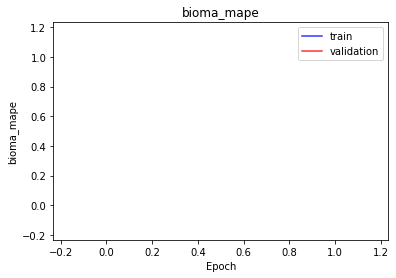

<b>domain_mse</b>: nan (min: nan, max: nan)

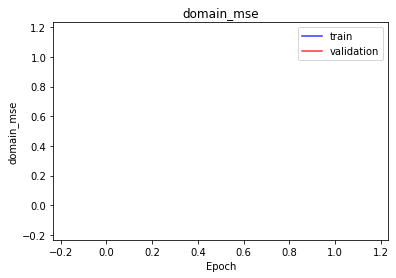

<b>domain_mae</b>: nan (min: nan, max: nan)

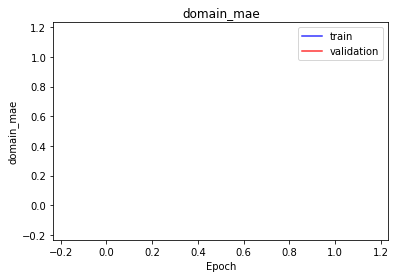

<b>domain_mape</b>: nan (min: nan, max: nan)

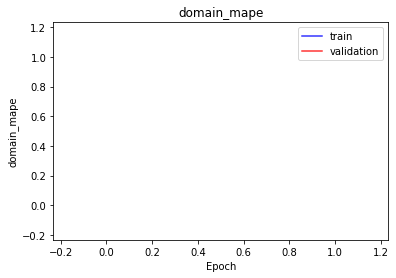

<b>latent_mae</b>: nan (min: nan, max: nan)

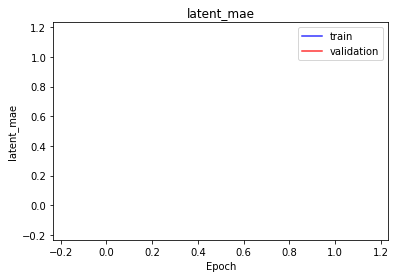

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b |
| Domain Autoencoder | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

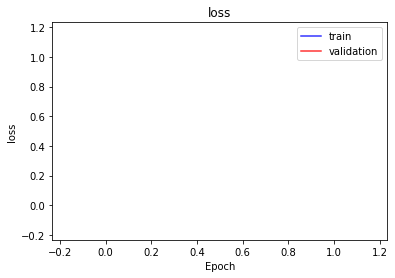

<b>bioma_loss</b>: nan (min: nan, max: nan)

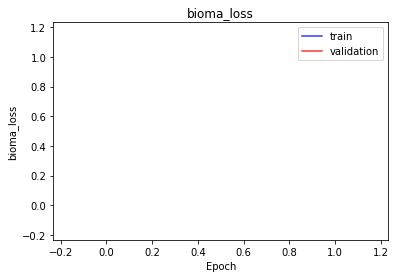

<b>domain_loss</b>: 163338.1719 (min: 158297.1094, max: 168379.2344)

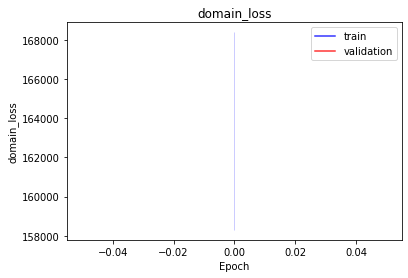

<b>latent_loss</b>: nan (min: nan, max: nan)

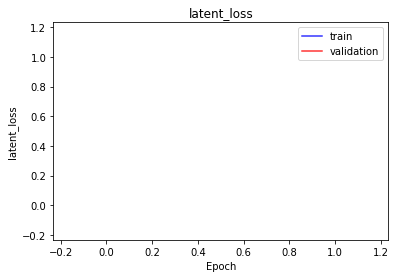

<b>bioma_mse</b>: nan (min: nan, max: nan)

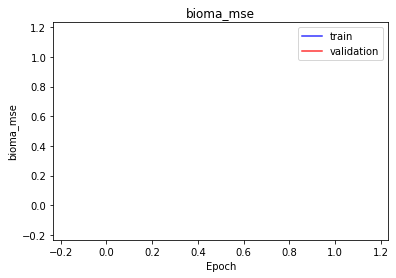

<b>bioma_mae</b>: nan (min: nan, max: nan)

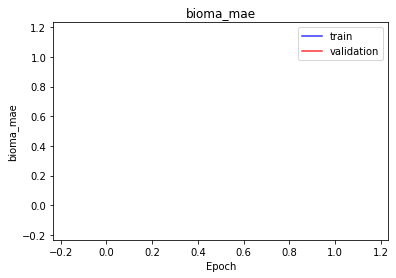

<b>bioma_mape</b>: nan (min: nan, max: nan)

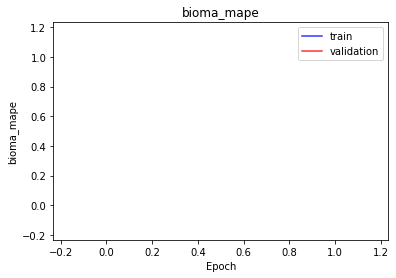

<b>domain_mse</b>: nan (min: nan, max: nan)

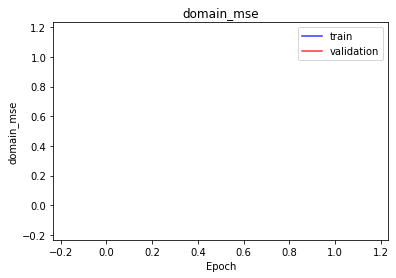

<b>domain_mae</b>: nan (min: nan, max: nan)

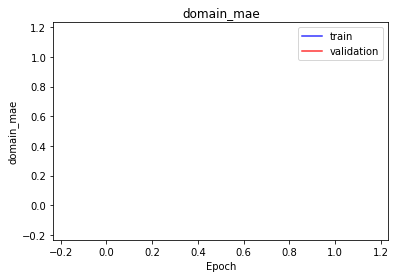

<b>domain_mape</b>: nan (min: nan, max: nan)

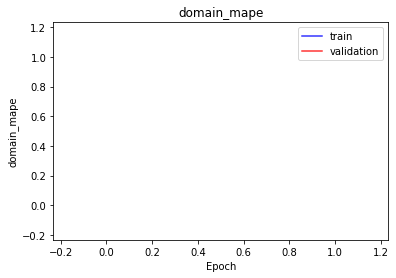

<b>latent_mae</b>: nan (min: nan, max: nan)

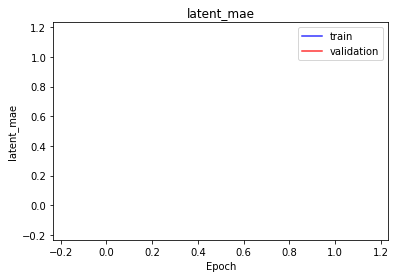

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

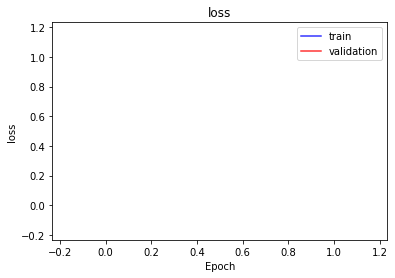

<b>bioma_loss</b>: nan (min: nan, max: nan)

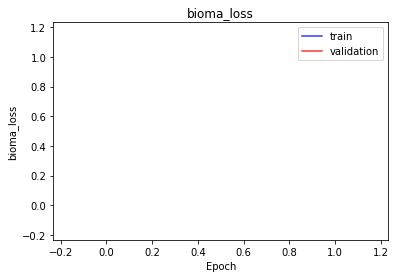

<b>domain_loss</b>: 157547.1562 (min: 156322.5625, max: 158771.7500)

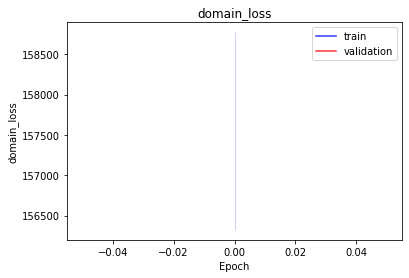

<b>latent_loss</b>: nan (min: nan, max: nan)

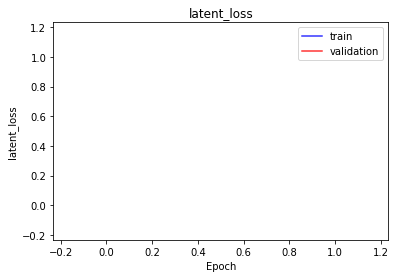

<b>bioma_mse</b>: nan (min: nan, max: nan)

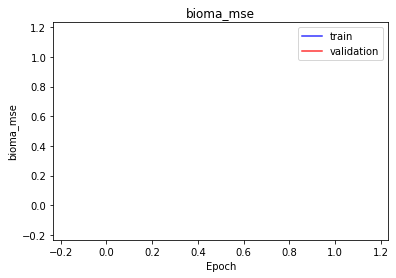

<b>bioma_mae</b>: nan (min: nan, max: nan)

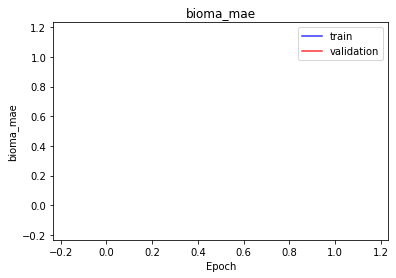

<b>bioma_mape</b>: nan (min: nan, max: nan)

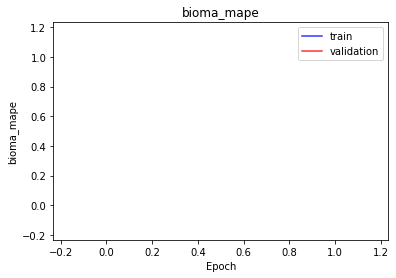

<b>domain_mse</b>: nan (min: nan, max: nan)

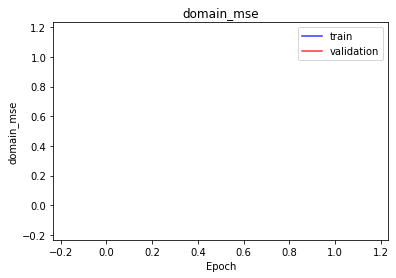

<b>domain_mae</b>: nan (min: nan, max: nan)

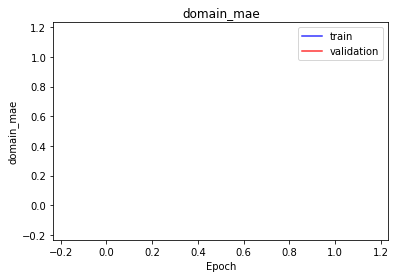

<b>domain_mape</b>: nan (min: nan, max: nan)

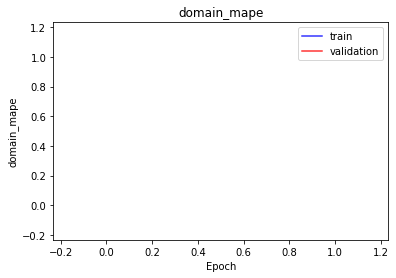

<b>latent_mae</b>: nan (min: nan, max: nan)

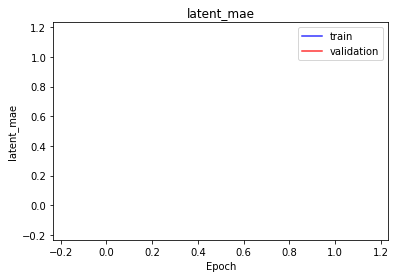

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

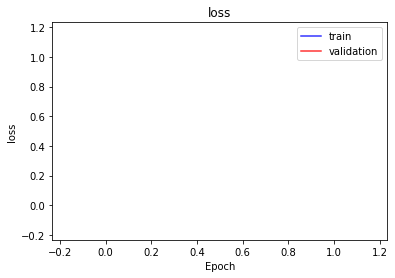

<b>bioma_loss</b>: nan (min: nan, max: nan)

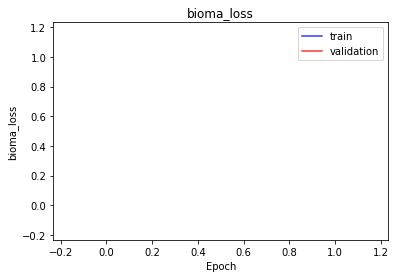

<b>domain_loss</b>: 157534.1875 (min: 154167.5625, max: 160900.7969)

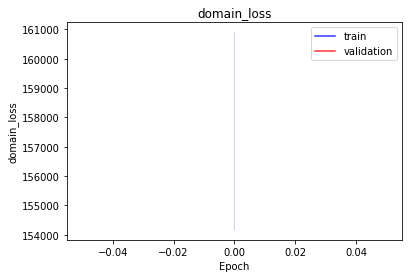

<b>latent_loss</b>: nan (min: nan, max: nan)

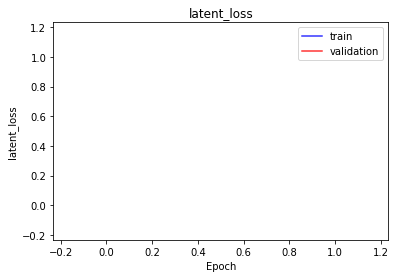

<b>bioma_mse</b>: nan (min: nan, max: nan)

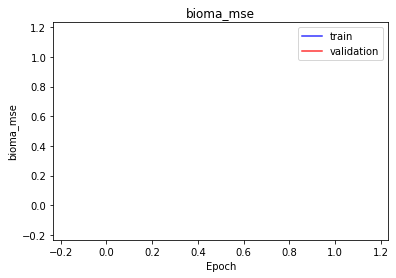

<b>bioma_mae</b>: nan (min: nan, max: nan)

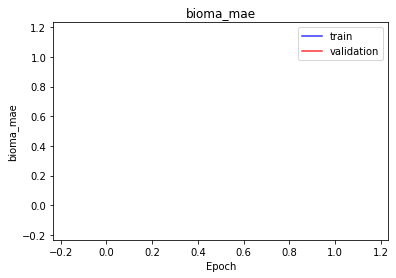

<b>bioma_mape</b>: nan (min: nan, max: nan)

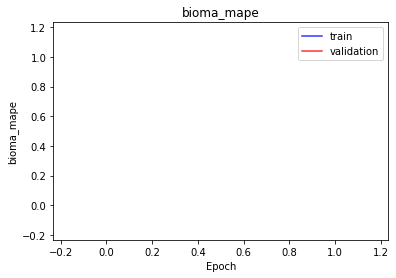

<b>domain_mse</b>: nan (min: nan, max: nan)

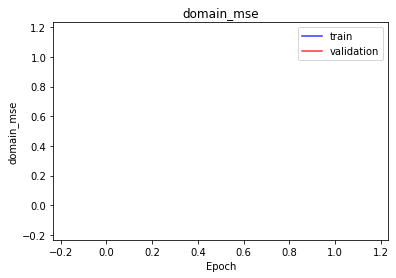

<b>domain_mae</b>: nan (min: nan, max: nan)

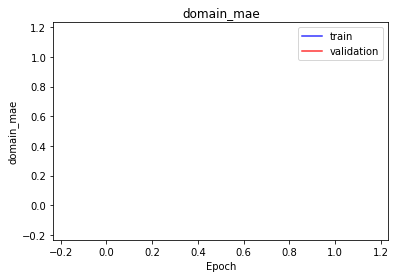

<b>domain_mape</b>: nan (min: nan, max: nan)

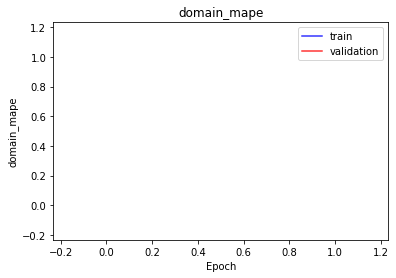

<b>latent_mae</b>: nan (min: nan, max: nan)

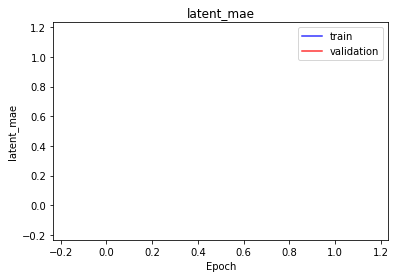

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

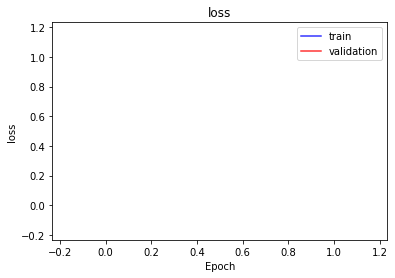

<b>bioma_loss</b>: nan (min: nan, max: nan)

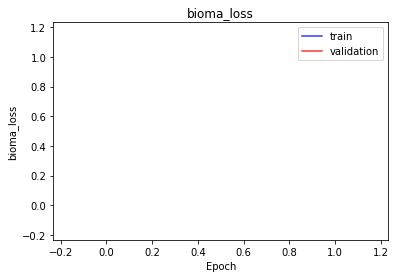

<b>domain_loss</b>: 156488.9219 (min: 152421.5469, max: 160556.2969)

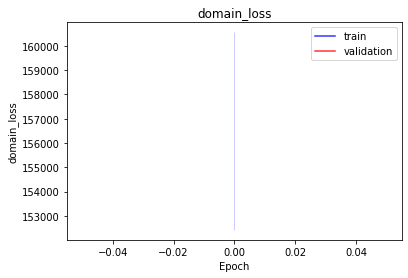

<b>latent_loss</b>: nan (min: nan, max: nan)

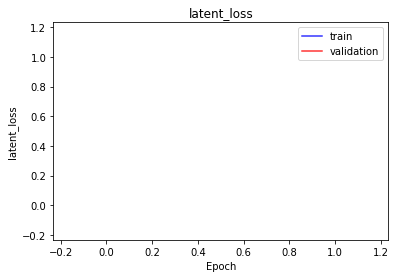

<b>bioma_mse</b>: nan (min: nan, max: nan)

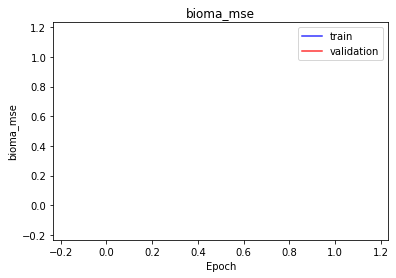

<b>bioma_mae</b>: nan (min: nan, max: nan)

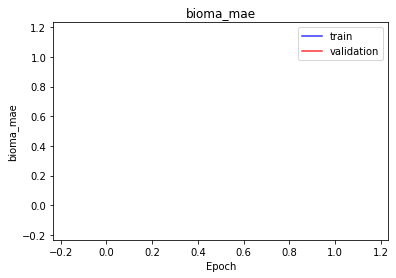

<b>bioma_mape</b>: nan (min: nan, max: nan)

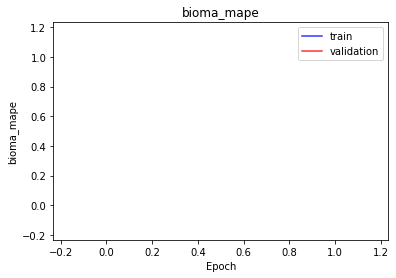

<b>domain_mse</b>: nan (min: nan, max: nan)

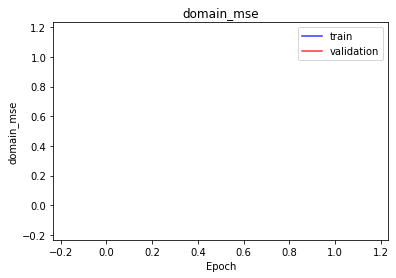

<b>domain_mae</b>: nan (min: nan, max: nan)

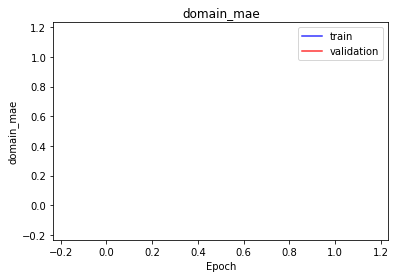

<b>domain_mape</b>: nan (min: nan, max: nan)

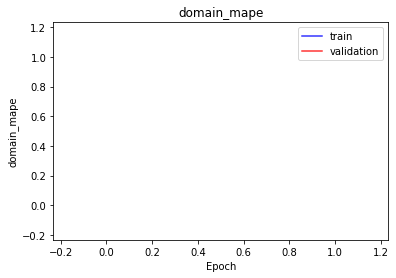

<b>latent_mae</b>: nan (min: nan, max: nan)

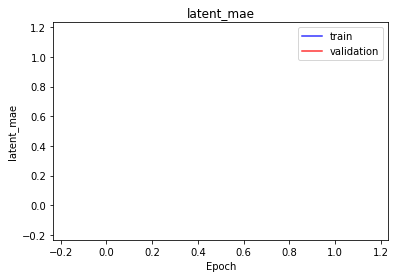

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

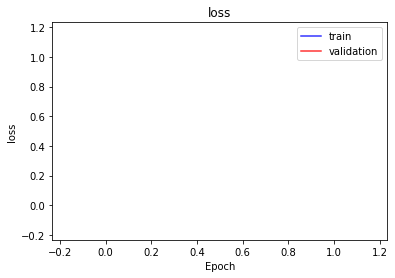

<b>bioma_loss</b>: nan (min: nan, max: nan)

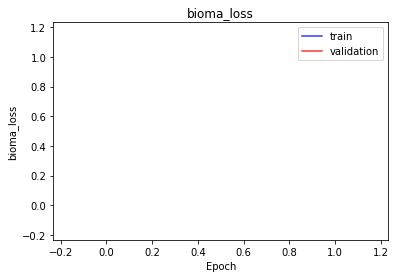

<b>domain_loss</b>: 156627.7188 (min: 155852.7031, max: 157402.7500)

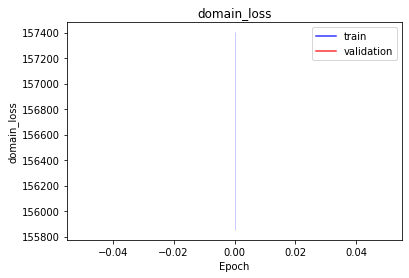

<b>latent_loss</b>: nan (min: nan, max: nan)

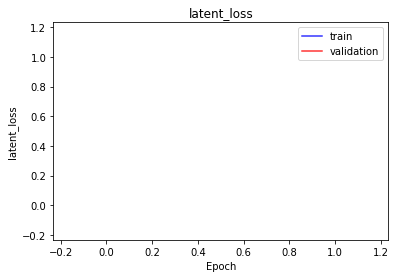

<b>bioma_mse</b>: nan (min: nan, max: nan)

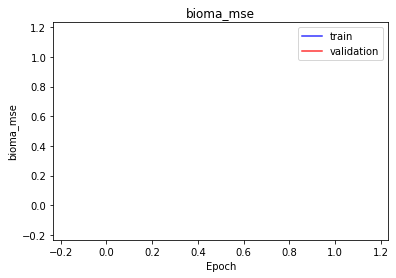

<b>bioma_mae</b>: nan (min: nan, max: nan)

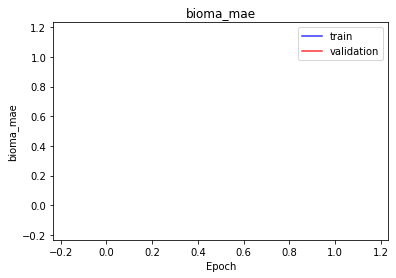

<b>bioma_mape</b>: nan (min: nan, max: nan)

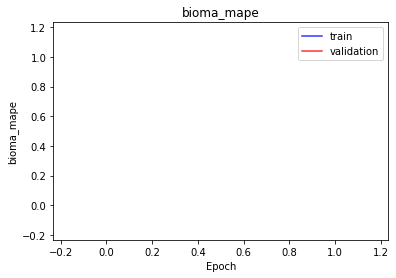

<b>domain_mse</b>: nan (min: nan, max: nan)

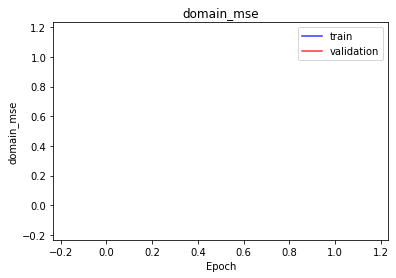

<b>domain_mae</b>: nan (min: nan, max: nan)

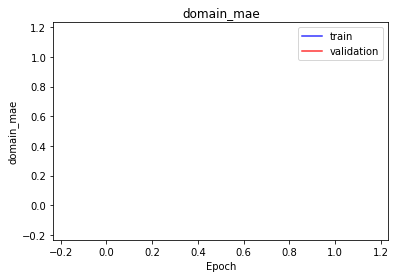

<b>domain_mape</b>: nan (min: nan, max: nan)

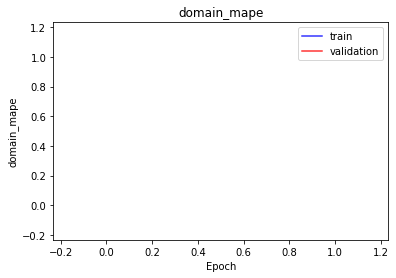

<b>latent_mae</b>: nan (min: nan, max: nan)

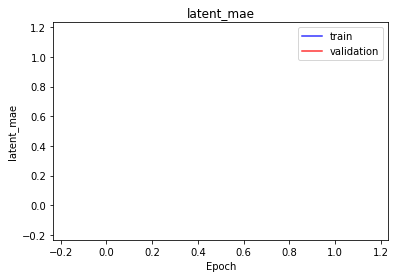

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

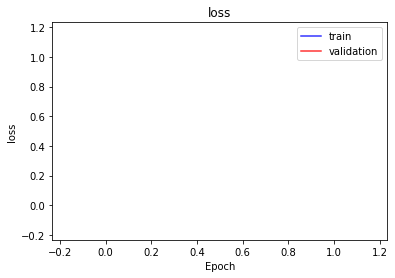

<b>bioma_loss</b>: nan (min: nan, max: nan)

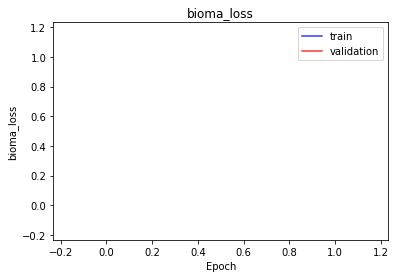

<b>domain_loss</b>: 155410.4062 (min: 151644.9219, max: 159175.9062)

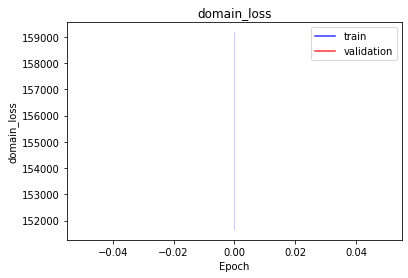

<b>latent_loss</b>: nan (min: nan, max: nan)

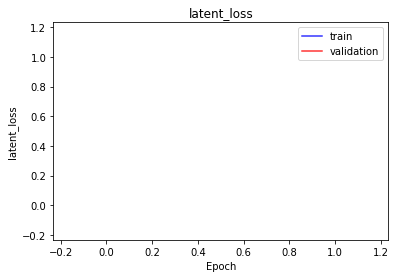

<b>bioma_mse</b>: nan (min: nan, max: nan)

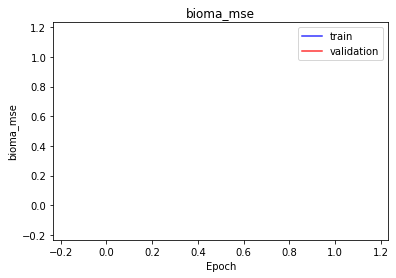

<b>bioma_mae</b>: nan (min: nan, max: nan)

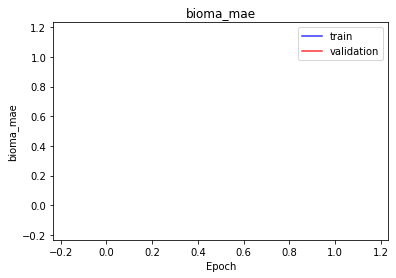

<b>bioma_mape</b>: nan (min: nan, max: nan)

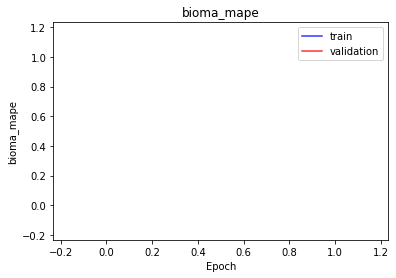

<b>domain_mse</b>: nan (min: nan, max: nan)

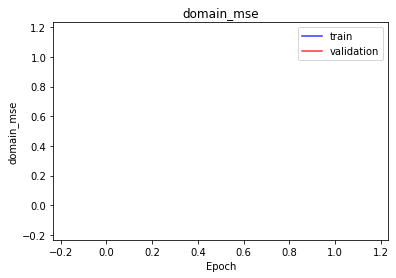

<b>domain_mae</b>: nan (min: nan, max: nan)

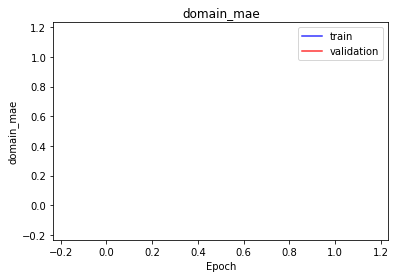

<b>domain_mape</b>: nan (min: nan, max: nan)

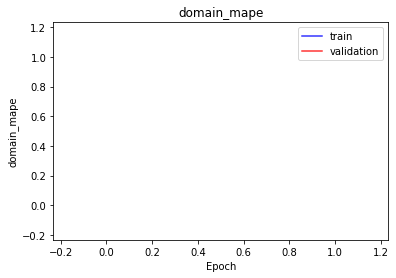

<b>latent_mae</b>: nan (min: nan, max: nan)

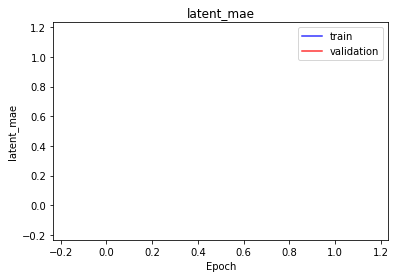

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 256 -> 100 -> 256 -> b |
| Domain Autoencoder | d -> 16 -> 100 -> 256 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

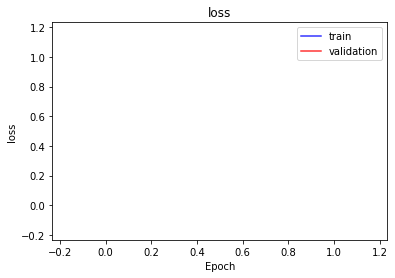

<b>bioma_loss</b>: nan (min: nan, max: nan)

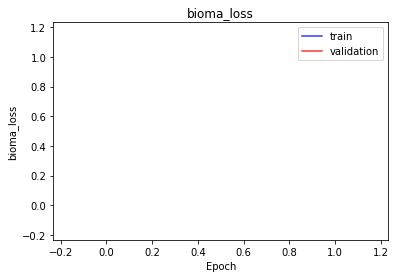

<b>domain_loss</b>: 156220.9531 (min: 151221.4688, max: 161220.4375)

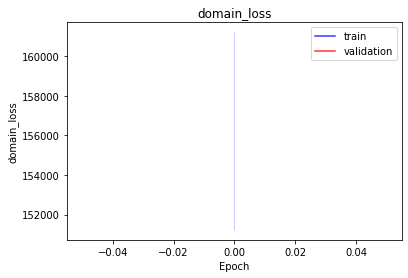

<b>latent_loss</b>: nan (min: nan, max: nan)

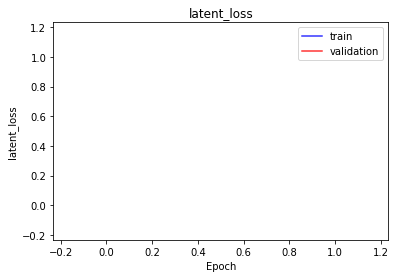

<b>bioma_mse</b>: nan (min: nan, max: nan)

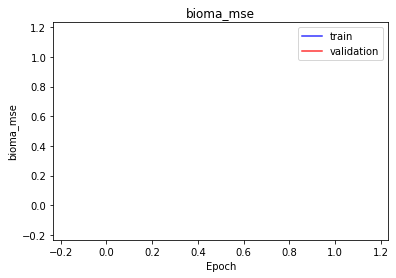

<b>bioma_mae</b>: nan (min: nan, max: nan)

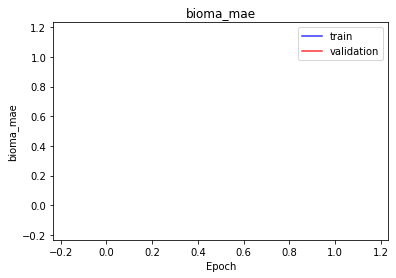

<b>bioma_mape</b>: nan (min: nan, max: nan)

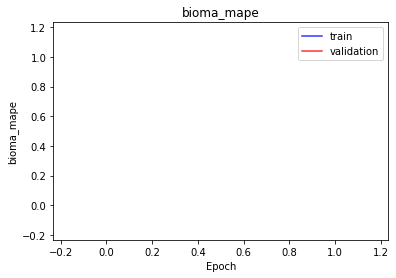

<b>domain_mse</b>: nan (min: nan, max: nan)

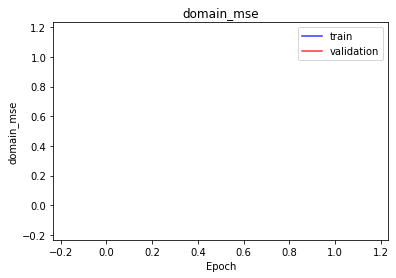

<b>domain_mae</b>: nan (min: nan, max: nan)

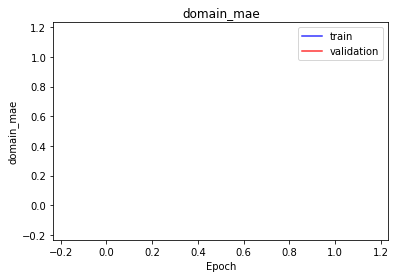

<b>domain_mape</b>: nan (min: nan, max: nan)

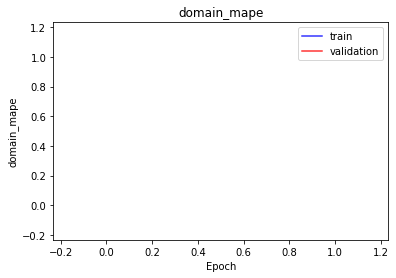

<b>latent_mae</b>: nan (min: nan, max: nan)

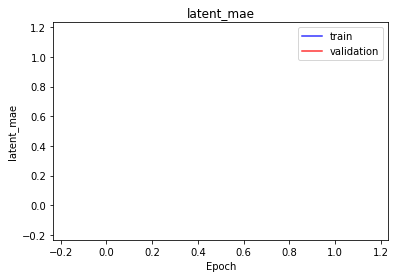

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

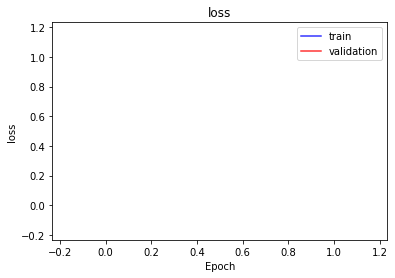

<b>bioma_loss</b>: nan (min: nan, max: nan)

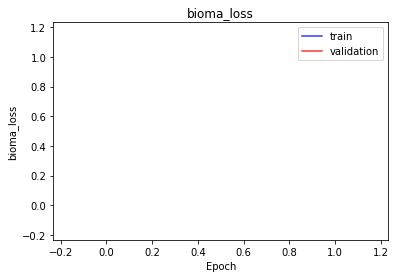

<b>domain_loss</b>: 161027.3438 (min: 154819.9688, max: 167234.7031)

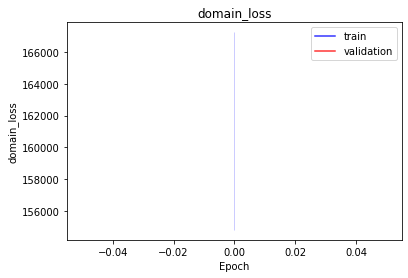

<b>latent_loss</b>: nan (min: nan, max: nan)

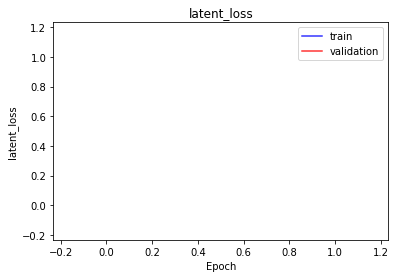

<b>bioma_mse</b>: nan (min: nan, max: nan)

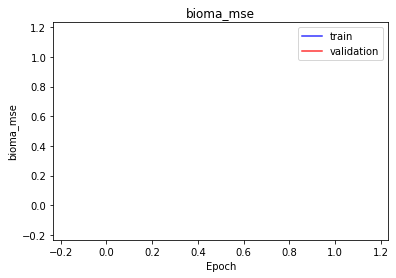

<b>bioma_mae</b>: nan (min: nan, max: nan)

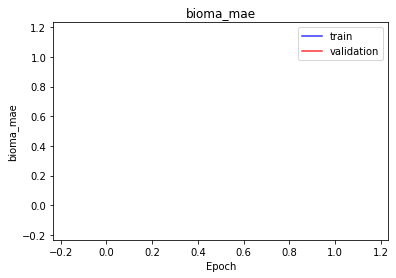

<b>bioma_mape</b>: nan (min: nan, max: nan)

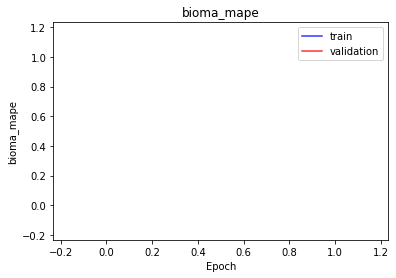

<b>domain_mse</b>: nan (min: nan, max: nan)

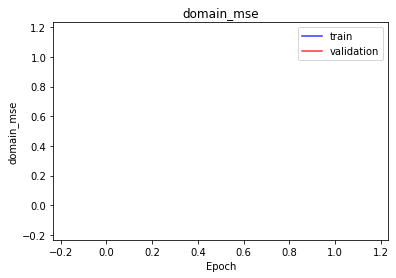

<b>domain_mae</b>: nan (min: nan, max: nan)

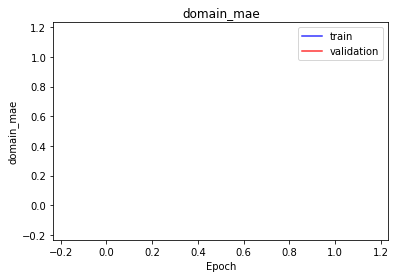

<b>domain_mape</b>: nan (min: nan, max: nan)

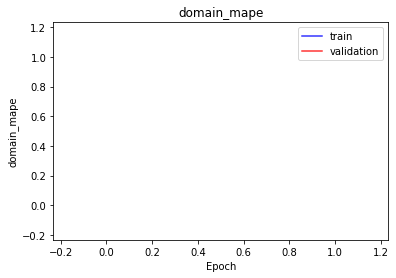

<b>latent_mae</b>: nan (min: nan, max: nan)

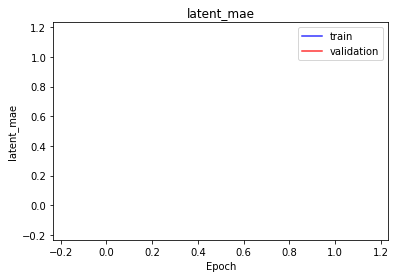

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | tanh |
| Activation Decoder | tanh |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

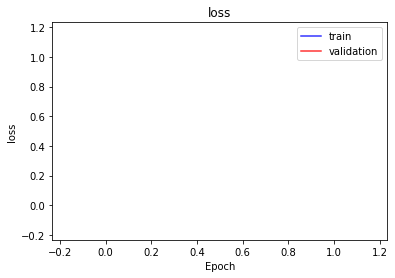

<b>bioma_loss</b>: nan (min: nan, max: nan)

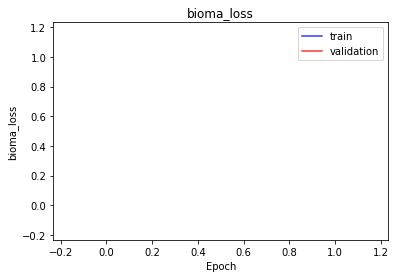

<b>domain_loss</b>: 159289.5938 (min: 158489.3125, max: 160089.8906)

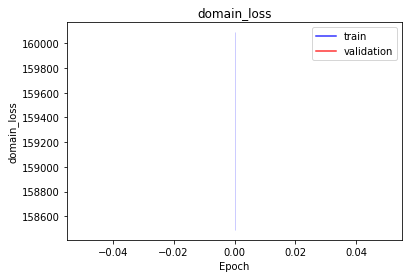

<b>latent_loss</b>: nan (min: nan, max: nan)

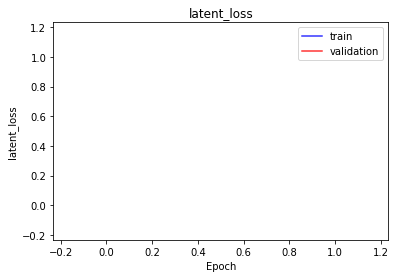

<b>bioma_mse</b>: nan (min: nan, max: nan)

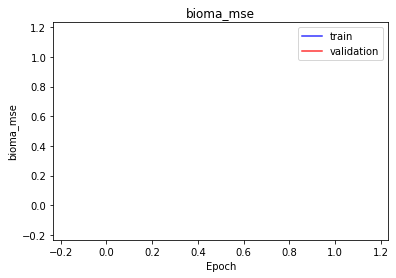

<b>bioma_mae</b>: nan (min: nan, max: nan)

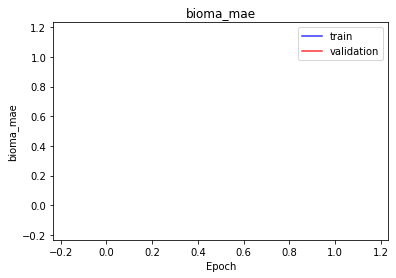

<b>bioma_mape</b>: nan (min: nan, max: nan)

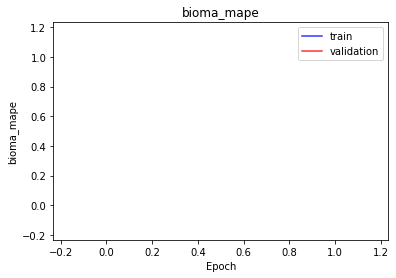

<b>domain_mse</b>: nan (min: nan, max: nan)

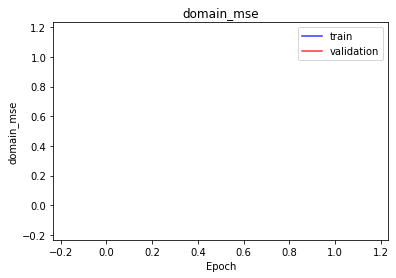

<b>domain_mae</b>: nan (min: nan, max: nan)

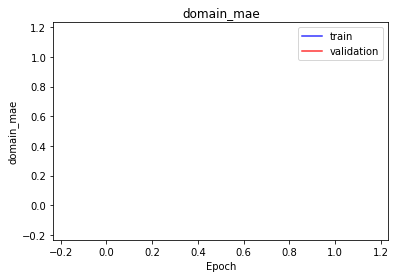

<b>domain_mape</b>: nan (min: nan, max: nan)

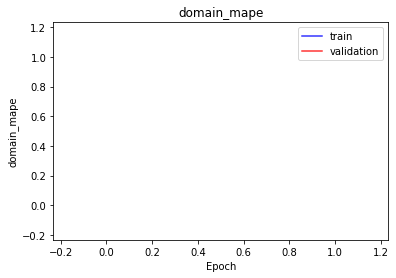

<b>latent_mae</b>: nan (min: nan, max: nan)

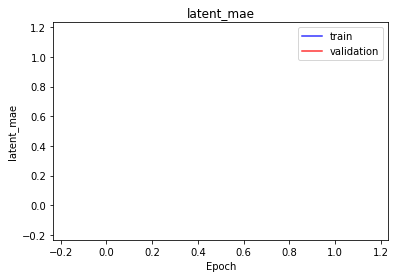

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

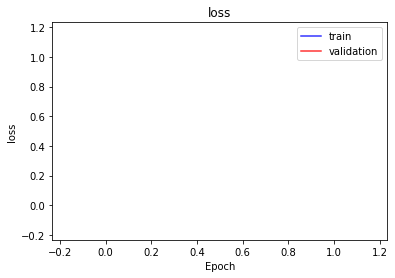

<b>bioma_loss</b>: nan (min: nan, max: nan)

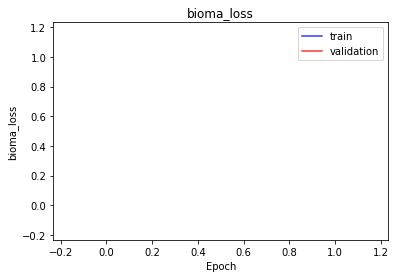

<b>domain_loss</b>: 157610.7656 (min: 152510.4844, max: 162711.0469)

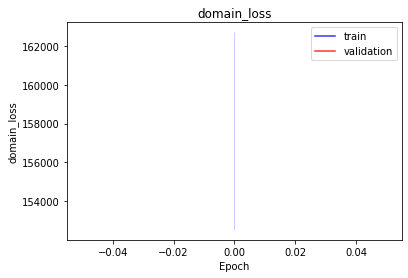

<b>latent_loss</b>: nan (min: nan, max: nan)

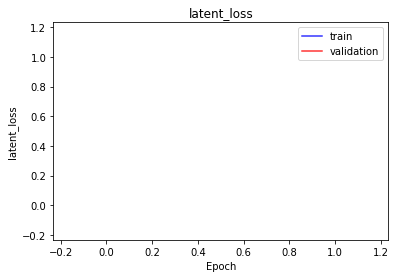

<b>bioma_mse</b>: nan (min: nan, max: nan)

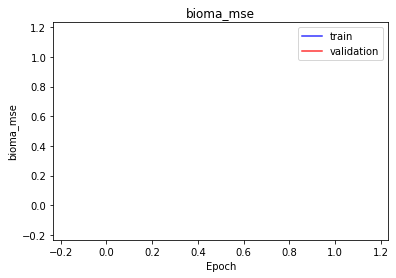

<b>bioma_mae</b>: nan (min: nan, max: nan)

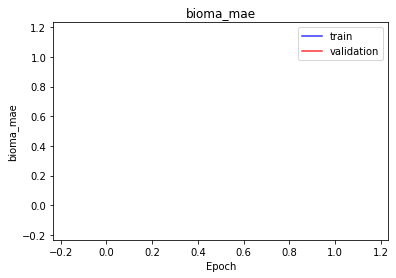

<b>bioma_mape</b>: nan (min: nan, max: nan)

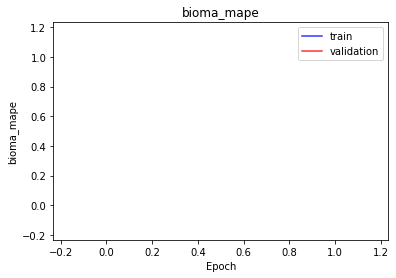

<b>domain_mse</b>: nan (min: nan, max: nan)

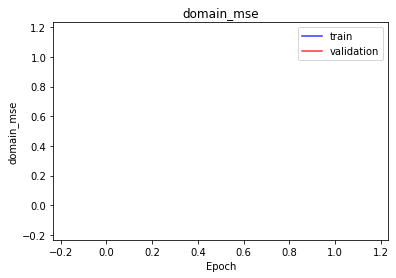

<b>domain_mae</b>: nan (min: nan, max: nan)

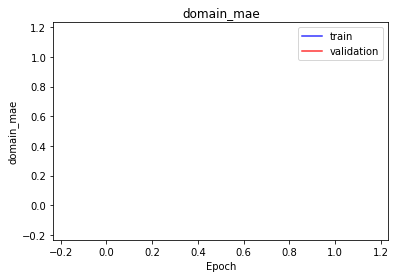

<b>domain_mape</b>: nan (min: nan, max: nan)

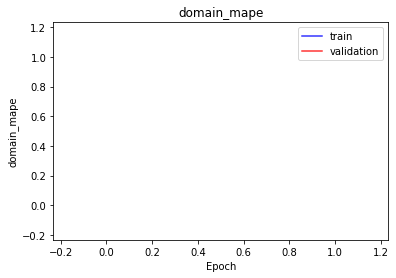

<b>latent_mae</b>: nan (min: nan, max: nan)

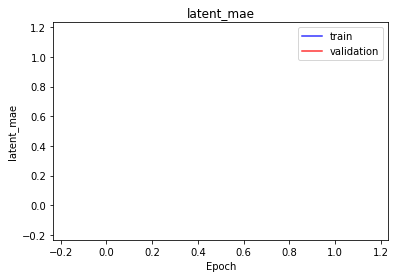

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | relu |
| Activation Decoder | relu |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

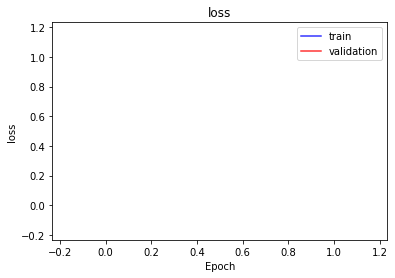

<b>bioma_loss</b>: nan (min: nan, max: nan)

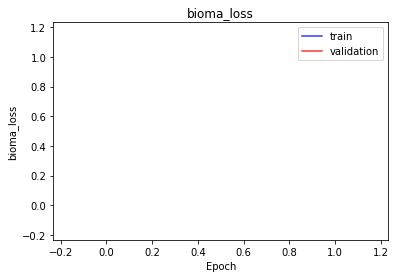

<b>domain_loss</b>: 155937.7344 (min: 152957.5156, max: 158917.9531)

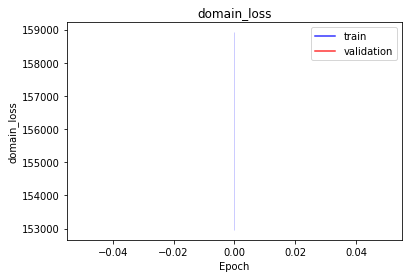

<b>latent_loss</b>: nan (min: nan, max: nan)

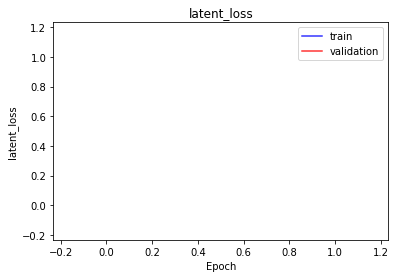

<b>bioma_mse</b>: nan (min: nan, max: nan)

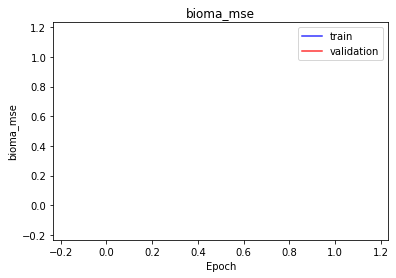

<b>bioma_mae</b>: nan (min: nan, max: nan)

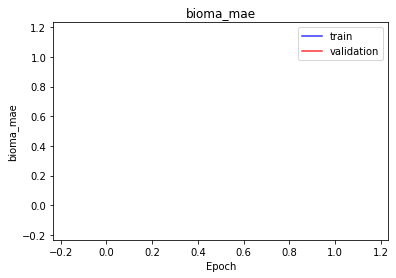

<b>bioma_mape</b>: nan (min: nan, max: nan)

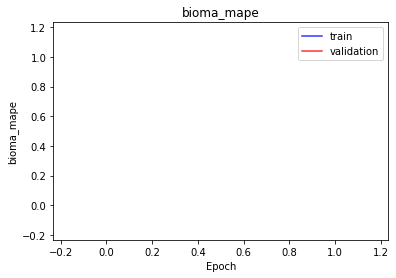

<b>domain_mse</b>: nan (min: nan, max: nan)

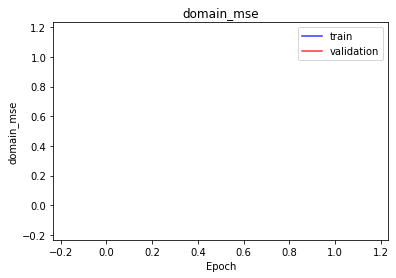

<b>domain_mae</b>: nan (min: nan, max: nan)

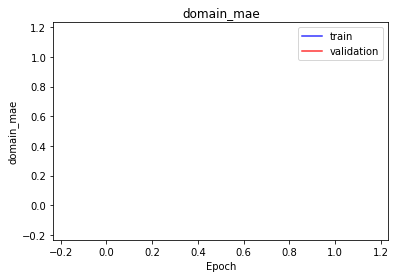

<b>domain_mape</b>: nan (min: nan, max: nan)

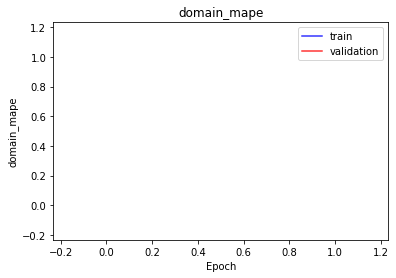

<b>latent_mae</b>: nan (min: nan, max: nan)

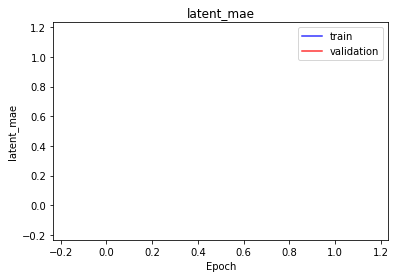

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | tanh |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

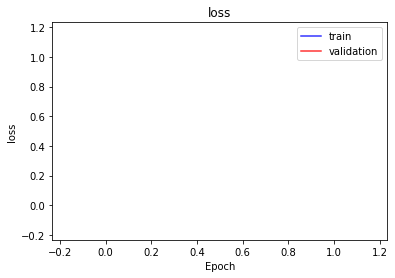

<b>bioma_loss</b>: nan (min: nan, max: nan)

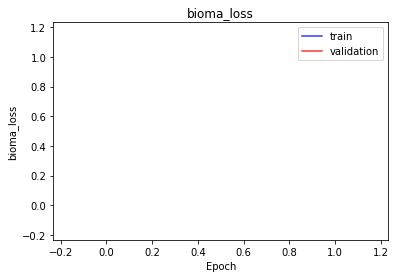

<b>domain_loss</b>: 153979.0000 (min: 152268.6406, max: 155689.3594)

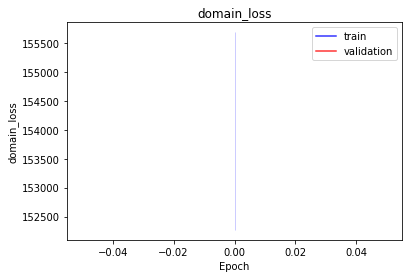

<b>latent_loss</b>: nan (min: nan, max: nan)

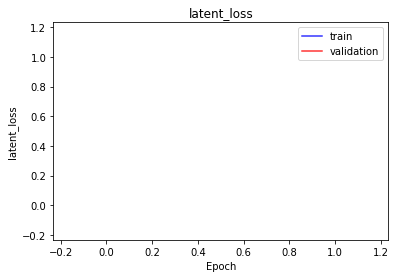

<b>bioma_mse</b>: nan (min: nan, max: nan)

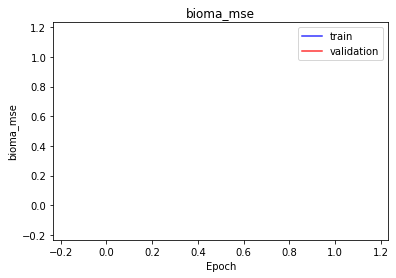

<b>bioma_mae</b>: nan (min: nan, max: nan)

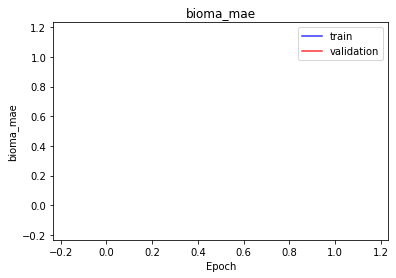

<b>bioma_mape</b>: nan (min: nan, max: nan)

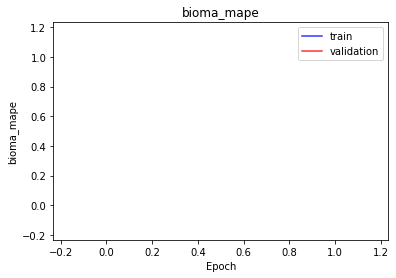

<b>domain_mse</b>: nan (min: nan, max: nan)

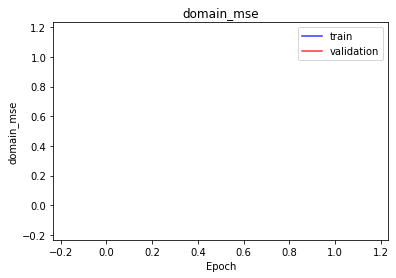

<b>domain_mae</b>: nan (min: nan, max: nan)

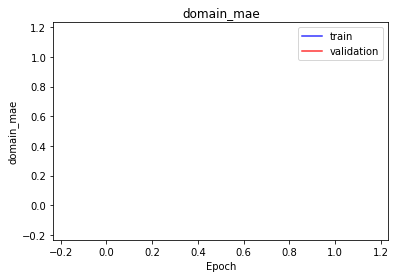

<b>domain_mape</b>: nan (min: nan, max: nan)

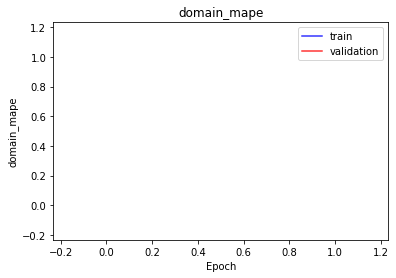

<b>latent_mae</b>: nan (min: nan, max: nan)

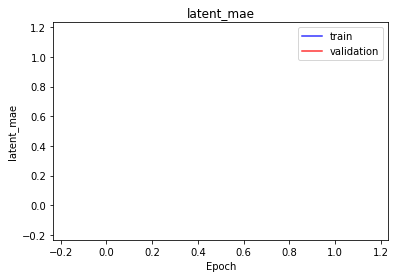

*************

| Parameter             | Value         |
|:----------------------|:--------------|
| Input transform | Percentage |
| Output transform | Softmax |
| Reconstruction Loss | CategoricalCrossentropy |
| Latent Space | 100 |
| Bioma Autoencoder | b -> 100 -> b |
| Domain Autoencoder | d -> 100 -> b |
| Activation Encoder | sigmoid |
| Activation Decoder | sigmoid |
| Activation Latent | sigmoid |
| CV folds | 2 |
| Epochs | 1 |
| Batch Size | 64 |
| Learning Rate | constant = 0.001 |
| Optimizer | Adam |


<b>loss</b>: nan (min: nan, max: nan)

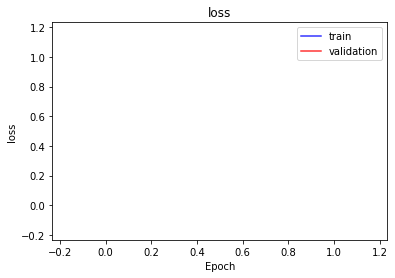

<b>bioma_loss</b>: nan (min: nan, max: nan)

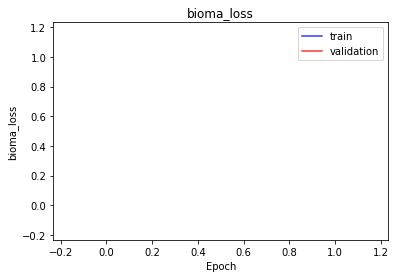

<b>domain_loss</b>: 153720.1875 (min: 148505.2344, max: 158935.1250)

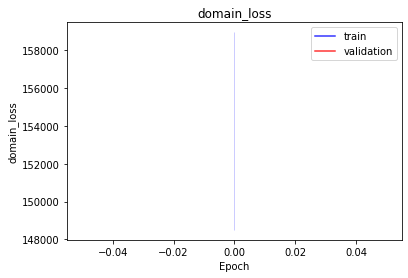

<b>latent_loss</b>: nan (min: nan, max: nan)

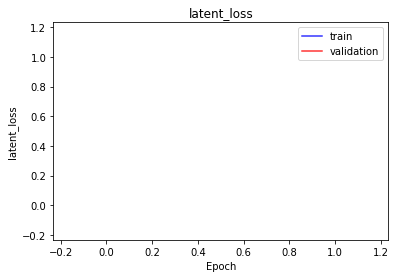

<b>bioma_mse</b>: nan (min: nan, max: nan)

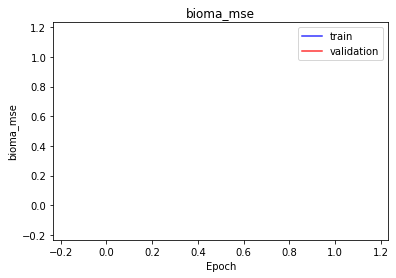

<b>bioma_mae</b>: nan (min: nan, max: nan)

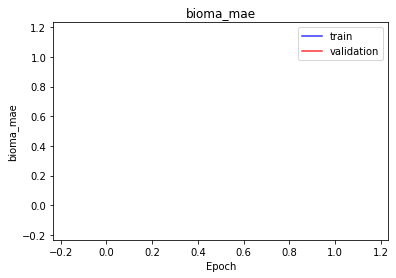

<b>bioma_mape</b>: nan (min: nan, max: nan)

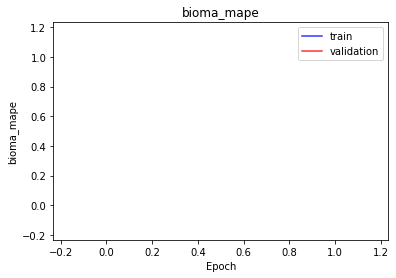

<b>domain_mse</b>: nan (min: nan, max: nan)

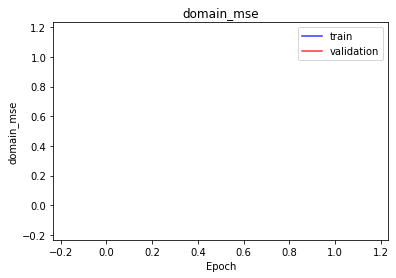

<b>domain_mae</b>: nan (min: nan, max: nan)

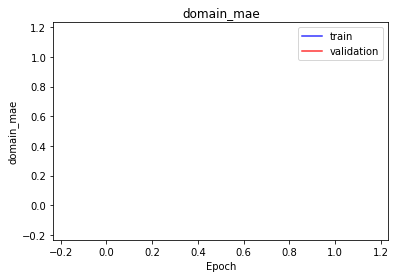

<b>domain_mape</b>: nan (min: nan, max: nan)

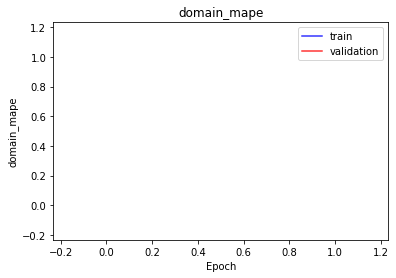

<b>latent_mae</b>: nan (min: nan, max: nan)

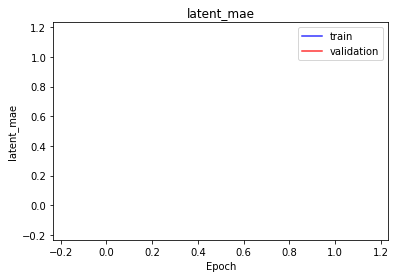

*************

In [16]:
all_metrics = []

cv_folds = 2 # 5
epochs = 1 # 30
batch_size = 64
learning_rate = 0.001
optimizer = optimizers.Adam(learning_rate=learning_rate)
params = [
    (None, layers.ReLU(), losses.MeanSquaredError()),
    (CenterLogRatio(), None, losses.MeanSquaredError()),
    (Percentage(), layers.Softmax(), losses.CategoricalCrossentropy()),
]
for input_transform, output_transform, reconstruction_loss in params:
    for latent_space in [10, 50, 100]:
        for autoencoder_layers in [[512,256],[256],[]]:
            for activation in ['tanh', 'relu', 'sigmoid']:
                for activation_latent in ['tanh', 'sigmoid']:
                    experiment_metrics = perform_experiment(cv_folds,
                                                            epochs,
                                                            batch_size,
                                                            learning_rate,
                                                            optimizer,
                                                            input_transform,
                                                            output_transform,
                                                            reconstruction_loss,
                                                            latent_space,
                                                            autoencoder_layers,
                                                            activation,
                                                            activation_latent)
                    all_metrics.append(experiment_metrics)

# Summary Table with all results

In [17]:
keys_set = set()
keys_list = []
for m in all_metrics:
    for k,v in m:
        if k not in keys_set:
            keys_set.add(k)
            keys_list.append(k)


md_text = ""
for k in keys_list:
    if k.startswith('val_'):
        md_text += "| {} ".format(k[4:])
    else:
        md_text += "| {} ".format(k)
md_text += "|\n"
for k in keys_list:
    if k.startswith('val_'):
        md_text += "|--:".format(k[4:])
    else:
        md_text += "|:--".format(k)
md_text += "|\n"

for m in all_metrics:
    i = 0
    for k,v in m:
        while k != keys_list[i]:
            md_text += "| "
            i += 1
        i += 1
        if k.startswith('val_'):
            md_text += "| **{:.4f}** [{:.4f},{:.4f}] ".format(*v)
        else:
            md_text += "| {} ".format(v)
    md_text += "|\n"

display(Markdown(md_text))





























| Input transform | Output transform | Reconstruction Loss | Latent Space | Bioma Autoencoder | Domain Autoencoder | Activation Encoder | Activation Decoder | Activation Latent | CV folds | Epochs | Batch Size | Learning Rate | Optimizer | bioma_mse | bioma_mae | bioma_mape | domain_mse | domain_mae | domain_mape | latent_mae |
|:--|:--|:--|:--|:--|:--|:--|:--|:--|:--|:--|:--|:--|:--|--:|--:|--:|--:|--:|--:|--:|
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0298** [1.9649,2.0946] | **1.1269** [1.0929,1.1610] | **nan** [nan,nan] | **1.9931** [1.9496,2.0366] | **1.1232** [1.0938,1.1526] | **nan** [nan,nan] | **0.6820** [0.6151,0.7489] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **1.9995** [1.9606,2.0384] | **1.1242** [1.0949,1.1535] | **nan** [nan,nan] | **1.9987** [1.9626,2.0347] | **1.1237** [1.0949,1.1525] | **nan** [nan,nan] | **0.2863** [0.2679,0.3047] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **1.9971** [1.9573,2.0369] | **1.1189** [1.0892,1.1486] | **nan** [nan,nan] | **1.9999** [1.9576,2.0421] | **1.1223** [1.0947,1.1499] | **nan** [nan,nan] | **1.0244** [0.9322,1.1166] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0064** [1.9649,2.0478] | **1.1231** [1.0941,1.1521] | **nan** [nan,nan] | **2.0076** [1.9682,2.0470] | **1.1244** [1.0964,1.1524] | **nan** [nan,nan] | **0.3584** [0.3001,0.4168] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1370** [2.0825,2.1916] | **1.1731** [1.1548,1.1915] | **nan** [nan,nan] | **2.1371** [2.0828,2.1915] | **1.1732** [1.1549,1.1915] | **nan** [nan,nan] | **0.3643** [0.3433,0.3853] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1322** [2.1046,2.1598] | **1.1719** [1.1608,1.1831] | **nan** [nan,nan] | **2.1321** [2.1046,2.1597] | **1.1719** [1.1608,1.1831] | **nan** [nan,nan] | **0.1165** [0.0981,0.1350] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0068** [1.9607,2.0528] | **1.1202** [1.0895,1.1508] | **nan** [nan,nan] | **2.0179** [1.9625,2.0734] | **1.1293** [1.0995,1.1592] | **nan** [nan,nan] | **0.7296** [0.6550,0.8041] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0137** [1.9606,2.0669] | **1.1246** [1.0926,1.1566] | **nan** [nan,nan] | **2.0196** [1.9636,2.0755] | **1.1268** [1.0941,1.1596] | **nan** [nan,nan] | **0.2742** [0.2668,0.2815] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0225** [1.9831,2.0618] | **1.1251** [1.0961,1.1542] | **nan** [nan,nan] | **2.0354** [1.9919,2.0788] | **1.1320** [1.1050,1.1591] | **nan** [nan,nan] | **0.9030** [0.8729,0.9330] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0146** [1.9632,2.0660] | **1.1251** [1.0946,1.1555] | **nan** [nan,nan] | **2.0241** [1.9625,2.0856] | **1.1293** [1.0967,1.1618] | **nan** [nan,nan] | **0.4548** [0.3874,0.5223] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0988** [2.0185,2.1790] | **1.1542** [1.1215,1.1869] | **nan** [nan,nan] | **2.1008** [2.0210,2.1807] | **1.1543** [1.1225,1.1862] | **nan** [nan,nan] | **0.6163** [0.5421,0.6904] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0560** [2.0046,2.1074] | **1.1443** [1.1202,1.1684] | **nan** [nan,nan] | **2.0557** [2.0042,2.1071] | **1.1442** [1.1200,1.1685] | **nan** [nan,nan] | **0.1900** [0.1822,0.1978] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0302** [1.9798,2.0805] | **1.1253** [1.0929,1.1576] | **nan** [nan,nan] | **2.0349** [1.9903,2.0795] | **1.1300** [1.1050,1.1549] | **nan** [nan,nan] | **1.0532** [1.0379,1.0684] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0196** [1.9724,2.0668] | **1.1257** [1.0958,1.1555] | **nan** [nan,nan] | **2.0236** [1.9765,2.0707] | **1.1259** [1.0965,1.1554] | **nan** [nan,nan] | **0.5201** [0.4653,0.5749] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0208** [1.9944,2.0471] | **1.1233** [1.0974,1.1491] | **nan** [nan,nan] | **2.0498** [2.0085,2.0910] | **1.1356** [1.1090,1.1622] | **nan** [nan,nan] | **0.9892** [0.8220,1.1564] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0090** [1.9600,2.0580] | **1.1226** [1.0916,1.1536] | **nan** [nan,nan] | **2.0125** [1.9608,2.0642] | **1.1243** [1.0940,1.1546] | **nan** [nan,nan] | **0.4188** [0.3734,0.4642] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0117** [1.9655,2.0579] | **1.1213** [1.0905,1.1520] | **nan** [nan,nan] | **2.0257** [1.9893,2.0620] | **1.1275** [1.1044,1.1507] | **nan** [nan,nan] | **0.9551** [0.6842,1.2259] |
| CenterLogRatio | none | MeanSquaredError | 10 | b -> 10 -> b | d -> 10 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0155** [1.9798,2.0512] | **1.1244** [1.0982,1.1506] | **nan** [nan,nan] | **2.0140** [1.9674,2.0606] | **1.1249** [1.0953,1.1545] | **nan** [nan,nan] | **0.5218** [0.5130,0.5307] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0268** [1.9673,2.0863] | **1.1282** [1.0968,1.1596] | **nan** [nan,nan] | **2.0093** [1.9716,2.0469] | **1.1263** [1.1012,1.1514] | **nan** [nan,nan] | **0.6028** [0.5728,0.6327] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0260** [1.9833,2.0687] | **1.1402** [1.1149,1.1655] | **nan** [nan,nan] | **2.0191** [1.9737,2.0645] | **1.1373** [1.1111,1.1635] | **nan** [nan,nan] | **0.2105** [0.1984,0.2227] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0110** [1.9728,2.0492] | **1.1252** [1.0962,1.1541] | **nan** [nan,nan] | **2.0235** [1.9808,2.0661] | **1.1329** [1.1067,1.1591] | **nan** [nan,nan] | **0.8418** [0.7991,0.8845] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0049** [1.9592,2.0505] | **1.1259** [1.0957,1.1562] | **nan** [nan,nan] | **2.0201** [1.9742,2.0660] | **1.1322** [1.1027,1.1617] | **nan** [nan,nan] | **0.3882** [0.3627,0.4136] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1448** [2.0538,2.2358] | **1.1828** [1.1491,1.2164] | **nan** [nan,nan] | **2.1455** [2.0544,2.2366] | **1.1828** [1.1492,1.2164] | **nan** [nan,nan] | **0.4593** [0.4355,0.4830] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0960** [2.0609,2.1310] | **1.1613** [1.1430,1.1797] | **nan** [nan,nan] | **2.0963** [2.0612,2.1314] | **1.1614** [1.1431,1.1798] | **nan** [nan,nan] | **0.1463** [0.1337,0.1589] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0441** [1.9959,2.0923] | **1.1313** [1.0998,1.1629] | **nan** [nan,nan] | **2.0327** [1.9740,2.0914] | **1.1323** [1.0996,1.1650] | **nan** [nan,nan] | **0.6434** [0.6392,0.6476] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0114** [1.9652,2.0577] | **1.1303** [1.1040,1.1567] | **nan** [nan,nan] | **2.0127** [1.9755,2.0499] | **1.1308** [1.1081,1.1536] | **nan** [nan,nan] | **0.2102** [0.2064,0.2140] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0313** [1.9901,2.0725] | **1.1310** [1.1010,1.1610] | **nan** [nan,nan] | **2.0791** [2.0402,2.1180] | **1.1534** [1.1310,1.1759] | **nan** [nan,nan] | **0.9601** [0.9279,0.9923] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0246** [1.9813,2.0678] | **1.1301** [1.1045,1.1557] | **nan** [nan,nan] | **2.0415** [1.9792,2.1039] | **1.1355** [1.1061,1.1648] | **nan** [nan,nan] | **0.4424** [0.4136,0.4712] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0703** [2.0242,2.1164] | **1.1542** [1.1324,1.1759] | **nan** [nan,nan] | **2.0757** [2.0309,2.1204] | **1.1550** [1.1330,1.1770] | **nan** [nan,nan] | **0.6423** [0.6194,0.6651] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0882** [2.0144,2.1621] | **1.1575** [1.1291,1.1858] | **nan** [nan,nan] | **2.0920** [2.0165,2.1675] | **1.1583** [1.1295,1.1870] | **nan** [nan,nan] | **0.1865** [0.1862,0.1869] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0746** [2.0231,2.1260] | **1.1356** [1.1000,1.1712] | **nan** [nan,nan] | **2.0915** [2.0293,2.1537] | **1.1485** [1.1224,1.1746] | **nan** [nan,nan] | **1.0378** [1.0297,1.0460] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0458** [1.9818,2.1099] | **1.1346** [1.1030,1.1663] | **nan** [nan,nan] | **2.0553** [2.0099,2.1008] | **1.1397** [1.1148,1.1645] | **nan** [nan,nan] | **0.4675** [0.4504,0.4847] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0658** [2.0068,2.1247] | **1.1329** [1.1011,1.1647] | **nan** [nan,nan] | **2.1323** [2.1300,2.1346] | **1.1620** [1.1464,1.1775] | **nan** [nan,nan] | **0.9451** [0.8900,1.0001] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0497** [1.9976,2.1019] | **1.1386** [1.1126,1.1646] | **nan** [nan,nan] | **2.0574** [2.0163,2.0984] | **1.1412** [1.1189,1.1635] | **nan** [nan,nan] | **0.4820** [0.4736,0.4904] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0424** [1.9882,2.0965] | **1.1245** [1.0933,1.1556] | **nan** [nan,nan] | **2.1280** [2.0690,2.1869] | **1.1611** [1.1348,1.1873] | **nan** [nan,nan] | **1.0347** [0.9692,1.1002] |
| CenterLogRatio | none | MeanSquaredError | 50 | b -> 50 -> b | d -> 50 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0536** [2.0039,2.1033] | **1.1378** [1.1098,1.1657] | **nan** [nan,nan] | **2.0631** [1.9828,2.1435] | **1.1424** [1.1096,1.1752] | **nan** [nan,nan] | **0.4521** [0.4327,0.4715] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0035** [1.9724,2.0346] | **1.1209** [1.0960,1.1459] | **nan** [nan,nan] | **2.0150** [1.9764,2.0535] | **1.1326** [1.1088,1.1565] | **nan** [nan,nan] | **0.5809** [0.5711,0.5906] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0025** [1.9555,2.0495] | **1.1381** [1.1118,1.1643] | **nan** [nan,nan] | **1.9990** [1.9534,2.0446] | **1.1367** [1.1094,1.1639] | **nan** [nan,nan] | **0.1786** [0.1679,0.1893] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0303** [1.9810,2.0797] | **1.1328** [1.0993,1.1663] | **nan** [nan,nan] | **2.0390** [1.9955,2.0825] | **1.1444** [1.1204,1.1684] | **nan** [nan,nan] | **0.7851** [0.7674,0.8028] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **1.9938** [1.9429,2.0446] | **1.1269** [1.0974,1.1565] | **nan** [nan,nan] | **2.0022** [1.9517,2.0527] | **1.1301** [1.1018,1.1585] | **nan** [nan,nan] | **0.3526** [0.3160,0.3893] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1012** [2.0841,2.1182] | **1.1747** [1.1632,1.1863] | **nan** [nan,nan] | **2.1036** [2.0889,2.1183] | **1.1750** [1.1643,1.1858] | **nan** [nan,nan] | **0.4453** [0.4179,0.4727] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1134** [2.0574,2.1694] | **1.1770** [1.1564,1.1976] | **nan** [nan,nan] | **2.1136** [2.0573,2.1698] | **1.1770** [1.1564,1.1977] | **nan** [nan,nan] | **0.1254** [0.1247,0.1261] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0423** [2.0085,2.0761] | **1.1329** [1.1081,1.1578] | **nan** [nan,nan] | **2.0508** [2.0184,2.0833] | **1.1425** [1.1209,1.1642] | **nan** [nan,nan] | **0.6195** [0.5963,0.6426] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0193** [1.9888,2.0497] | **1.1388** [1.1158,1.1619] | **nan** [nan,nan] | **2.0252** [2.0006,2.0499] | **1.1395** [1.1184,1.1606] | **nan** [nan,nan] | **0.2045** [0.1957,0.2133] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0343** [1.9652,2.1035] | **1.1305** [1.0959,1.1651] | **nan** [nan,nan] | **2.1319** [2.0574,2.2063] | **1.1652** [1.1364,1.1940] | **nan** [nan,nan] | **0.8970** [0.8751,0.9189] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0370** [1.9981,2.0759] | **1.1380** [1.1118,1.1642] | **nan** [nan,nan] | **2.0551** [2.0166,2.0936] | **1.1419** [1.1190,1.1649] | **nan** [nan,nan] | **0.4375** [0.4157,0.4593] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0667** [1.9873,2.1461] | **1.1544** [1.1178,1.1910] | **nan** [nan,nan] | **2.0702** [1.9810,2.1594] | **1.1542** [1.1146,1.1938] | **nan** [nan,nan] | **0.5311** [0.5039,0.5583] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0968** [2.0374,2.1563] | **1.1587** [1.1307,1.1867] | **nan** [nan,nan] | **2.0956** [2.0386,2.1525] | **1.1582** [1.1310,1.1854] | **nan** [nan,nan] | **0.1556** [0.1433,0.1678] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1099** [2.0396,2.1802] | **1.1442** [1.1115,1.1768] | **nan** [nan,nan] | **2.1254** [2.0991,2.1517] | **1.1583** [1.1447,1.1719] | **nan** [nan,nan] | **0.9553** [0.9552,0.9554] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0761** [2.0259,2.1262] | **1.1488** [1.1252,1.1725] | **nan** [nan,nan] | **2.0741** [2.0014,2.1468] | **1.1460** [1.1120,1.1800] | **nan** [nan,nan] | **0.4516** [0.4383,0.4650] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1350** [2.0670,2.2030] | **1.1521** [1.1210,1.1833] | **nan** [nan,nan] | **2.1449** [2.1386,2.1512] | **1.1672** [1.1572,1.1773] | **nan** [nan,nan] | **0.8961** [0.8493,0.9429] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0889** [2.0311,2.1466] | **1.1545** [1.1257,1.1832] | **nan** [nan,nan] | **2.1116** [2.0376,2.1857] | **1.1598** [1.1298,1.1897] | **nan** [nan,nan] | **0.4639** [0.4637,0.4641] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **2.1276** [2.0735,2.1817] | **1.1493** [1.1176,1.1809] | **nan** [nan,nan] | **2.2054** [2.1180,2.2929] | **1.1834** [1.1529,1.2139] | **nan** [nan,nan] | **0.9784** [0.9410,1.0158] |
| CenterLogRatio | none | MeanSquaredError | 100 | b -> 100 -> b | d -> 100 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **2.0375** [2.0006,2.0744] | **1.1401** [1.1161,1.1642] | **nan** [nan,nan] | **2.1127** [2.0737,2.1518] | **1.1619** [1.1386,1.1851] | **nan** [nan,nan] | **0.4504** [0.4477,0.4532] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 512 -> 256 -> 10 -> 256 -> 512 -> b | d -> 32 -> 16 -> 10 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 256 -> 10 -> 256 -> b | d -> 16 -> 10 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 10 | b -> 10 -> b | d -> 10 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 512 -> 256 -> 50 -> 256 -> 512 -> b | d -> 32 -> 16 -> 50 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 256 -> 50 -> 256 -> b | d -> 16 -> 50 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 50 | b -> 50 -> b | d -> 50 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 512 -> 256 -> 100 -> 256 -> 512 -> b | d -> 32 -> 16 -> 100 -> 256 -> 512 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 256 -> 100 -> 256 -> b | d -> 16 -> 100 -> 256 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | tanh | tanh | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | tanh | tanh | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | relu | relu | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | relu | relu | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | sigmoid | sigmoid | tanh | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |
| Percentage | Softmax | CategoricalCrossentropy | 100 | b -> 100 -> b | d -> 100 -> b | sigmoid | sigmoid | sigmoid | 2 | 1 | 64 | constant = 0.001 | Adam | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] | **nan** [nan,nan] |


{'loss': [nan, nan], 'mse': [nan, nan], 'mae': [nan, nan], 'mape': [nan, nan], 'val_loss': [nan, nan], 'val_mse': [nan, nan], 'val_mae': [nan, nan], 'val_mape': [nan, nan]}


<b>loss</b>: nan (min: nan, max: nan)

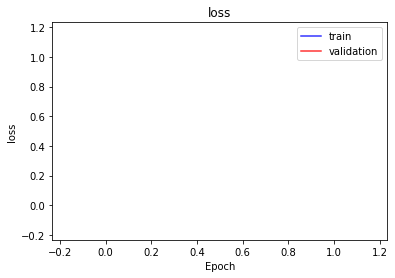

<b>mse</b>: nan (min: nan, max: nan)

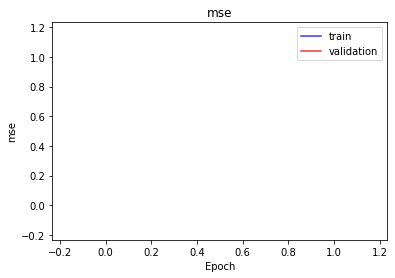

<b>mae</b>: nan (min: nan, max: nan)

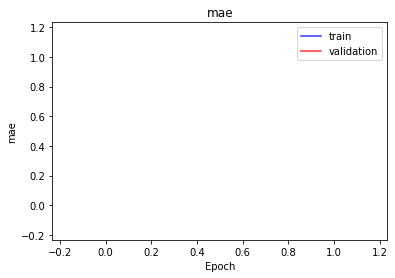

<b>mape</b>: nan (min: nan, max: nan)

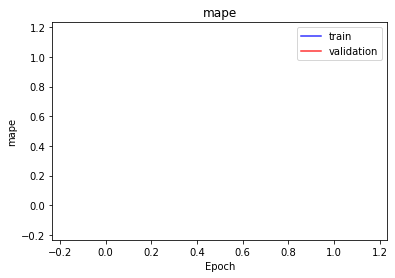

In [18]:

def create_model(print_data=False):

    input_transform = Percentage()
    output_transform = layers.Softmax()
    # input_transform = CenterLogRatio()
    # output_transform = None
    models = autoencoder(bioma_shape=717,
                         domain_shape=None,
                         latent_space=10,
                         bioma_layers=[256,128],
                         domain_layers=[32,16],
                         input_transform=input_transform,
                         output_transform=output_transform,
                         activation_function_encoder='relu',
                         activation_function_decoder='relu',
                         activation_function_latent='tanh')
    model, encoder_bioma, encoder_domain, decoder_bioma = models

    if print_data:
        plot_models(model, encoder_bioma, encoder_domain, decoder_bioma)

    compile_train(model,
                  encoder_domain=encoder_domain,
                  reconstruction_error=losses.CategoricalCrossentropy(),
                  encoded_comparison_error=losses.MeanAbsoluteError(),
                  metrics=get_experiment_metrics(input_transform, output_transform),
                  optimizer=optimizers.Adam(learning_rate=0.001))

    return model, encoder_bioma, encoder_domain, decoder_bioma

model, encoder_bioma, encoder_domain, decoder_bioma = create_model(print_data=False)

results  = train(create_model,
                 data_microbioma,
                 data_domain,
                 latent_space=10,
                 folds=2,
                 epochs=2,
                 batch_size=2,
                 learning_rate_scheduler=None,
                 verbose=-1)

print(results[0].history)

validation_results = print_results(results)


In [19]:

p = model.predict(data_microbioma[:1])
print(p)
print(np.asarray(p).sum())

for l in model.layers:
    print(l.name)
print()

for l in model.layers[5:]:
    print(l)
    print(l.name)
    new_model = keras.Model(inputs=model.inputs, outputs=l.output)
    print(new_model.predict(data_microbioma[:1]))

[[0.00139463 0.00139519 0.00139437 0.00139479 0.00139525 0.00139466
  0.00139493 0.00139402 0.00139472 0.00139493 0.00139467 0.00139473
  0.00139452 0.00139466 0.00139426 0.00139411 0.00139527 0.0013942
  0.00139481 0.00139434 0.00139479 0.0013947  0.00139435 0.00139453
  0.00139422 0.00139473 0.00139422 0.0013947  0.0013948  0.00139476
  0.00139463 0.00139492 0.00139442 0.00139473 0.0013944  0.00139463
  0.00139492 0.00139464 0.0013945  0.00139499 0.00139466 0.00139518
  0.00139477 0.00139441 0.00139479 0.00139466 0.00139486 0.00139453
  0.00139479 0.00139479 0.00139422 0.00139466 0.00139503 0.00139489
  0.00139471 0.00139498 0.00139513 0.00139474 0.00139421 0.0013948
  0.00139429 0.00139505 0.00139472 0.00139466 0.00139442 0.00139482
  0.00139491 0.00139456 0.00139475 0.00139476 0.00139488 0.00139494
  0.00139539 0.00139474 0.00139464 0.00139468 0.00139428 0.00139451
  0.00139419 0.00139472 0.00139423 0.00139484 0.00139484 0.00139485
  0.00139455 0.00139559 0.00139453 0.00139453 0.00

ValueError: Graph disconnected: cannot obtain value for tensor Tensor("latent_space_input_324:0", shape=(None, 10), dtype=float32) at layer "latent_space_input". The following previous layers were accessed without issue: []

In [4]:
i = layers.Input((3,))
n= i
n = CenterLogRatio()(n)
n = layers.Softmax()(n)
model = keras.Model(i,n)

model.predict([[1,1,1]])

NameError: name 'CenterLogRatio' is not defined